In [1]:
import numpy as np
import torch
from scipy.integrate import odeint
import torch.nn as nn
import matplotlib.pyplot as plt
from PIL import Image
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from torch import nn, autograd
import random

In [2]:
class AdaptedRNN(nn.Module):
    def __init__(self, n_time_features, n_param_features, n_hidden, n_layers):
        super(AdaptedRNN, self).__init__()
        
        # Number of input features for the RNN is the sum of time features and parameter features
        self.rnn_input_features = n_time_features + n_param_features
        
        # RNN Layer
        self.rnn = nn.RNN(input_size=self.rnn_input_features, hidden_size=n_hidden, num_layers=n_layers, batch_first=True)
        
        # Output layer
        self.output_layer = nn.Linear(n_hidden, 1)
        
        # Activation function
        self.activation = nn.Tanh()

    def forward(self, x, params):
        # Reshape x to add a sequence length dimension of 1
        # If x is [500, 1], we reshape it to [500, 1, 1] to match [batch_size, seq_len, n_time_features]
        x = x.unsqueeze(1)  # Adds seq_len dimension
        
        # Since params is [500, 5], we also need to adjust it for concatenation
        # We want params to be [500, 1, 5] to match x's new shape for concatenation
        params = params.unsqueeze(1)  # Adds seq_len dimension
        
        # Now x_combined shape will be [500, 1, 6] after concatenation
        x_combined = torch.cat((x, params), dim=2)
        
        # Process with RNN as before
        rnn_out, _ = self.rnn(x_combined)
        final_output = rnn_out[:, -1, :]  # Taking the last timestep output
        final_output = self.activation(final_output)
        final_output = self.output_layer(final_output)
        return final_output

In [3]:
class AdaptedFCN(nn.Module):
    def __init__(self, n_time_features, n_param_features, n_hidden, n_layers):
        super(AdaptedFCN, self).__init__()
        
        # Number of input features is the sum of time features and parameter features
        self.input_features = n_time_features + n_param_features
        
        # Input layer takes combined time and parameters
        self.input_layer = nn.Linear(self.input_features, n_hidden)
        
        # Hidden layers
        self.hidden_layers = nn.ModuleList()
        for _ in range(n_layers - 1):
            self.hidden_layers.append(nn.Linear(n_hidden, n_hidden))
        
        # Output layer
        self.output_layer = nn.Linear(n_hidden, 1)
        
        # Activation function
        self.activation = nn.Tanh()  # Using Tanh as an example; adjust as needed

    def forward(self, x, params):
        # Concatenate time and parameter features
        x_combined = torch.cat((x, params), dim=1)
        
        # Input layer with activation
        x = self.activation(self.input_layer(x_combined))
        
        # Hidden layers with activation
        for layer in self.hidden_layers:
            x = self.activation(layer(x))
        
        # Output layer without activation (assuming a regression task)
        x = self.output_layer(x)
        return x

In [4]:
    def duffing_generator_batch( num_batches, x):
        params_list = []  # To store parameters tensors for each batch
        y_physics_list = []  # To store the y_physics tensors for each batch

        for _ in range(num_batches):
            # Randomly generate parameters
            a = random.uniform(-2, 2)
            b = random.uniform(0, 3)
            d = random.uniform(0, 0.5)
            gamma = random.uniform(0, 3)
            w = random.uniform(0, 5)

            # Duffing differential equation solver setup
            def duffing(y, t):
                y0, y1 = y
                dydt = [y1, -d * y1 - a * y0 - b * y0**3 + gamma * np.cos(w * t)]
                return dydt

            # Initial conditions and solving the ODE
            y0 = [0, 0]
            sol = odeint(duffing, y0, x.cpu().squeeze().numpy())  # Ensure x is compatible with odeint
            y = torch.tensor(sol[:, 0], dtype=torch.float32).view(-1, 1)  # y_physics for one batch

            y_physics_list.append(y)

            # Handling parameters similarly if needed
            params = torch.tensor([d, a, b, gamma, w], dtype=torch.float32).view(1, -1).repeat(x.size(0), 1)
            params_list.append(params)
    
           # params_tensor = torch.tensor(params_list)
            #y_tensor = torch.tensor(y_physics_list)
        # Option 1: Return lists directly
        #return params_tensor, y_tensor

            # Option 2: Stack tensors to create a batch dimension explicitly
            params_tensor = torch.stack(params_list, dim=0)  # Shape: [num_batches, x.size(0), 5]
            y_physics_tensor = torch.stack(y_physics_list, dim=0)  # Shape: [num_batches, x.size(0), 1]
    
            return params_tensor, y_physics_tensor

Loss at Step 10 : 0.0005557795520871878
Epoch 10, Total Data Processed: 51200


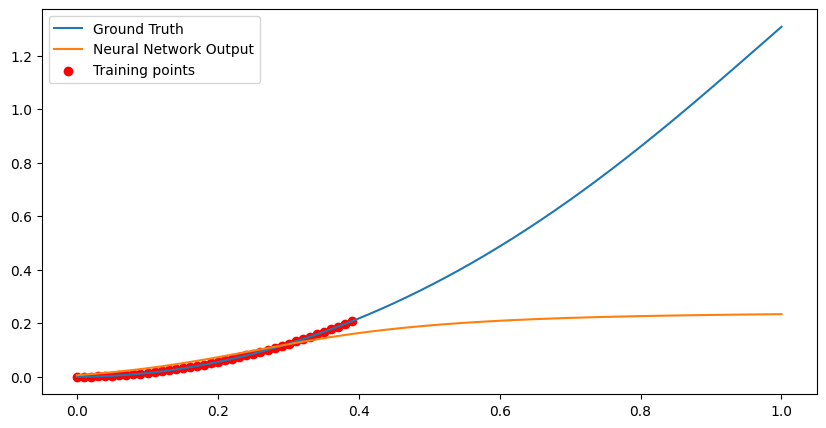

Loss at Step 20 : 0.000755113665945828
Epoch 20, Total Data Processed: 102400


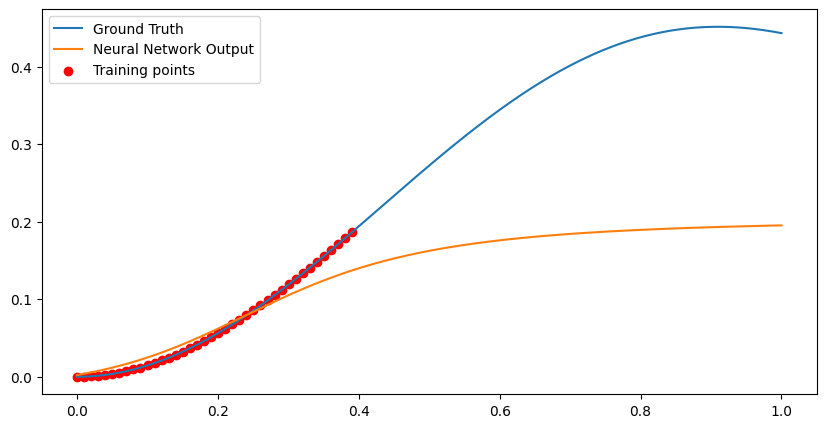

Loss at Step 30 : 7.900523632997647e-05
Epoch 30, Total Data Processed: 153600


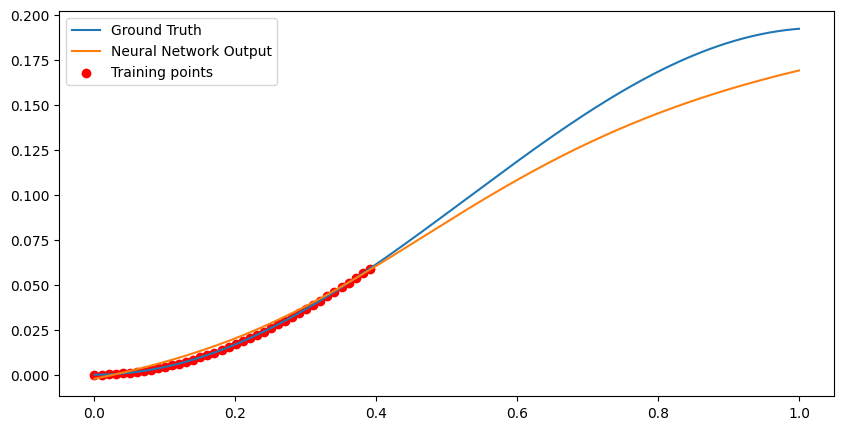

Loss at Step 40 : 0.00010011161066358909
Epoch 40, Total Data Processed: 204800


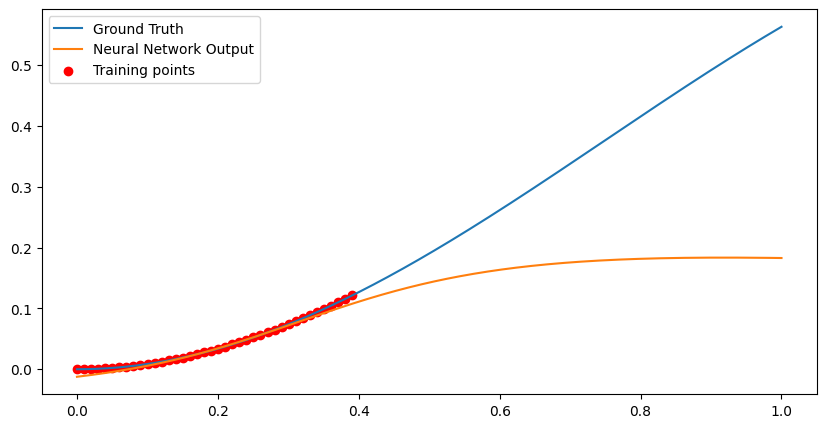

Loss at Step 50 : 9.780939581105486e-05
Epoch 50, Total Data Processed: 256000


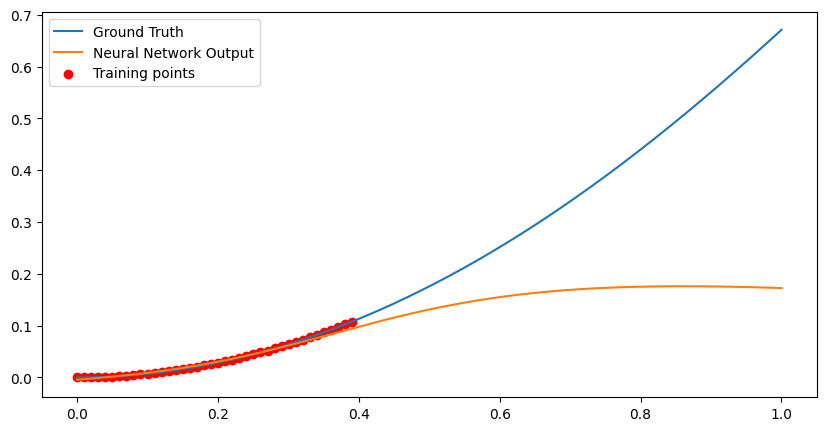

Loss at Step 60 : 0.00014436330820899457
Epoch 60, Total Data Processed: 307200


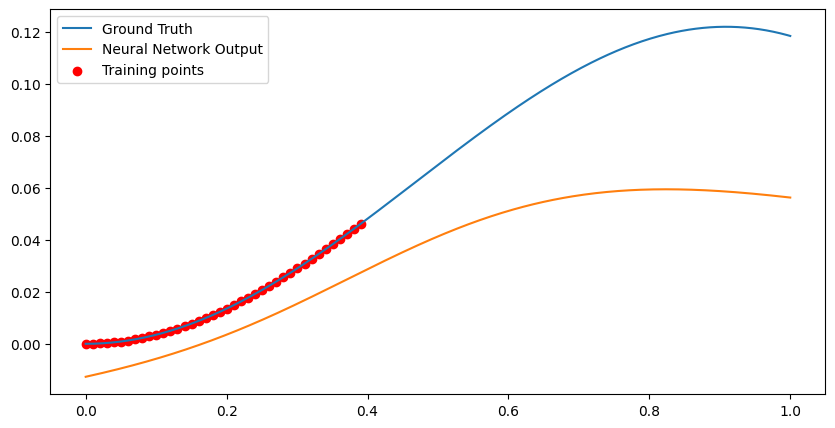

Loss at Step 70 : 0.000456368230516091
Epoch 70, Total Data Processed: 358400


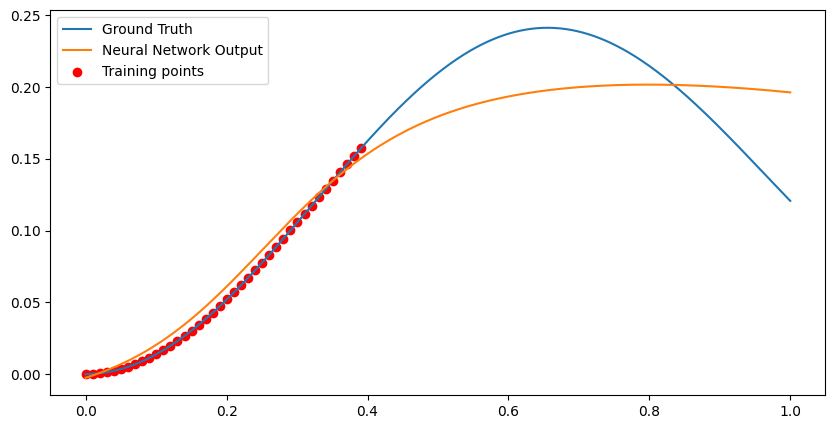

Loss at Step 80 : 0.00011268348316662014
Epoch 80, Total Data Processed: 409600


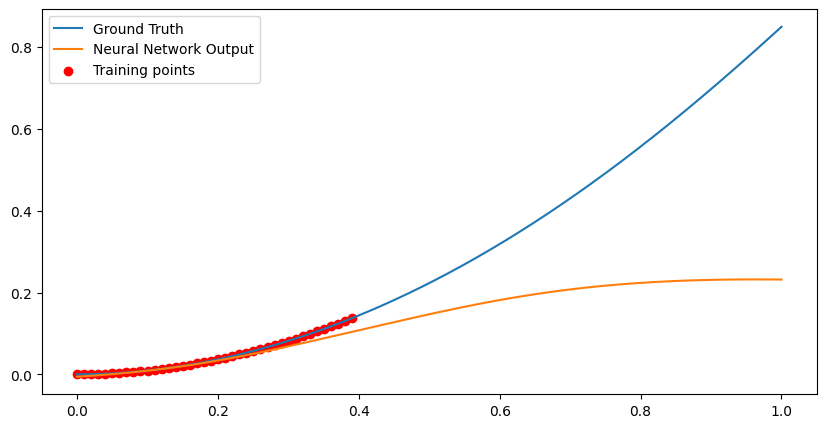

Loss at Step 90 : 0.0001918131165439263
Epoch 90, Total Data Processed: 460800


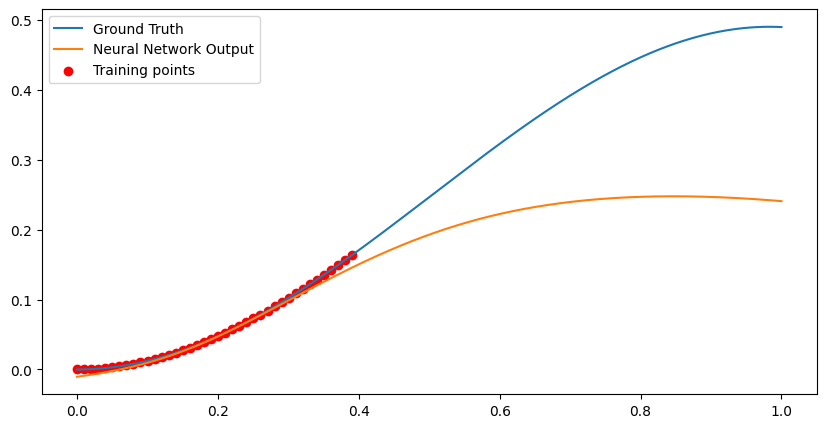

Epoch 100, Variance: 3.918620495824143e-05, Loss Change: 4.374703931375734e-05
Loss at Step 100 : 0.00032867465051822364
Epoch 100, Total Data Processed: 512000


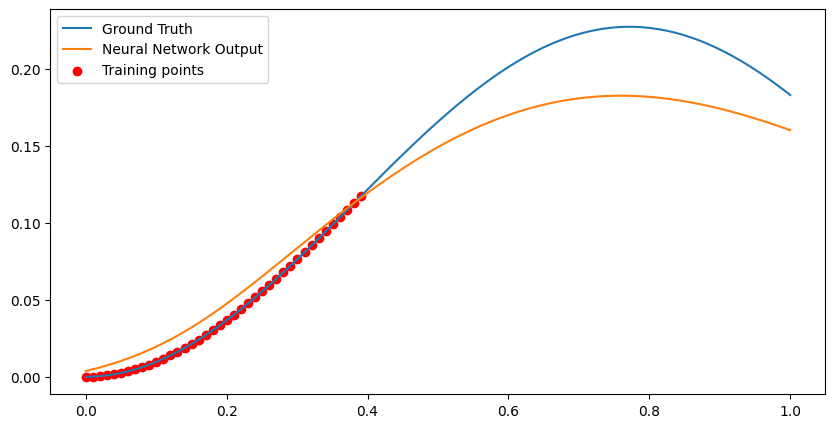

Loss at Step 110 : 7.673750224057585e-05
Epoch 110, Total Data Processed: 563200


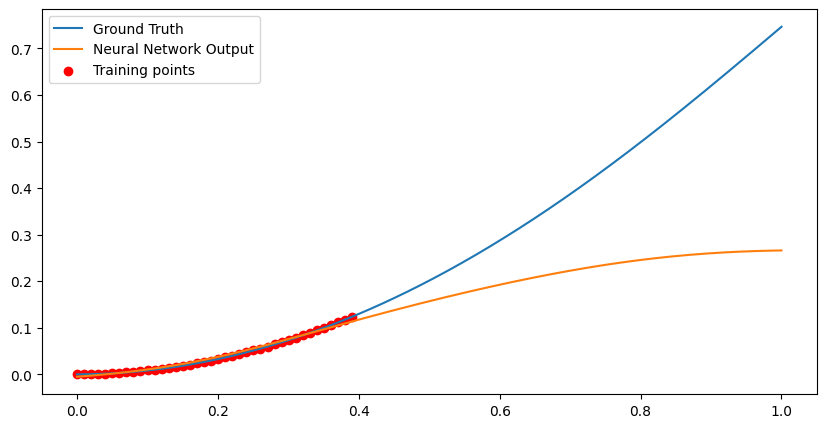

Loss at Step 120 : 0.00017134832160081714
Epoch 120, Total Data Processed: 614400


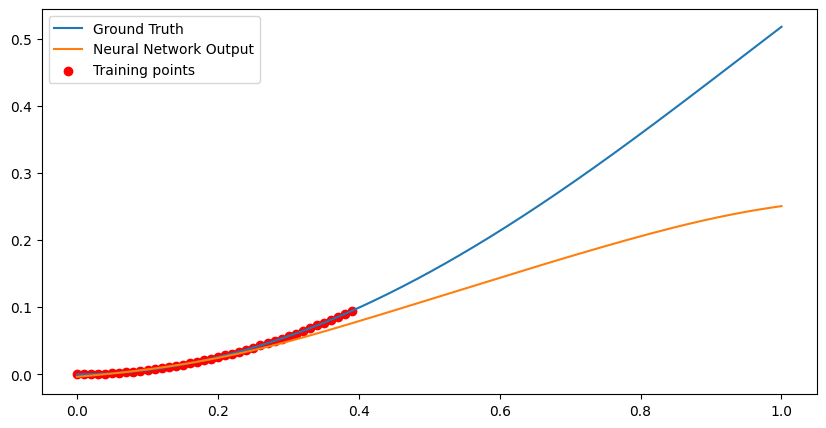

Loss at Step 130 : 0.00022737347171641886
Epoch 130, Total Data Processed: 665600


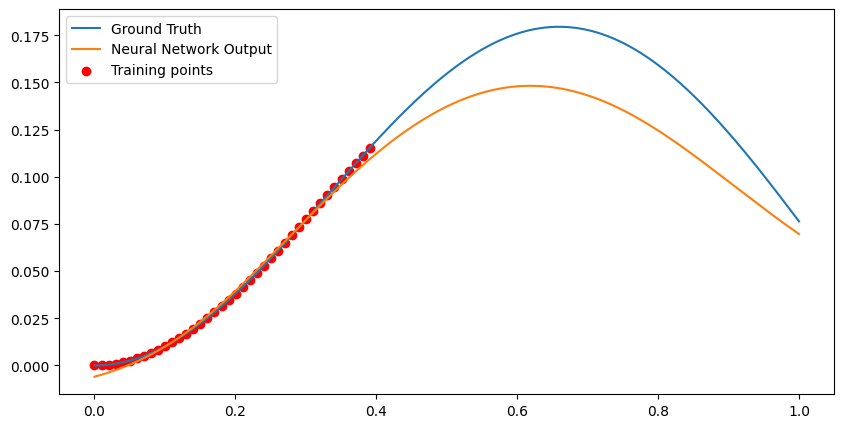

Loss at Step 140 : 0.00016142716049216688
Epoch 140, Total Data Processed: 716800


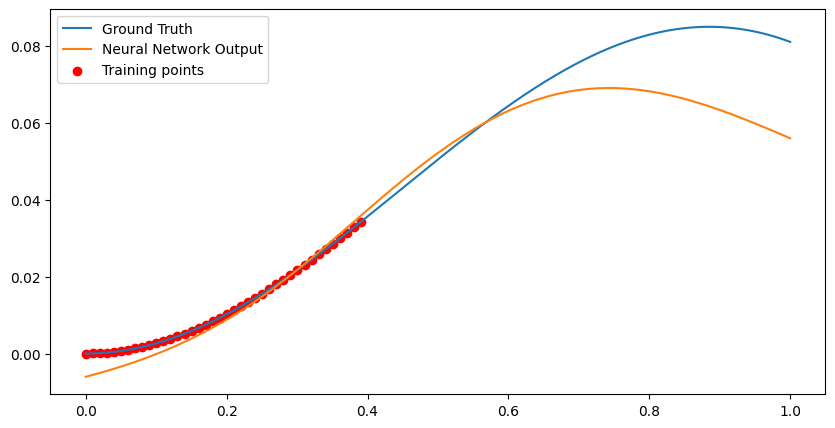

Loss at Step 150 : 8.437815267825499e-05
Epoch 150, Total Data Processed: 768000


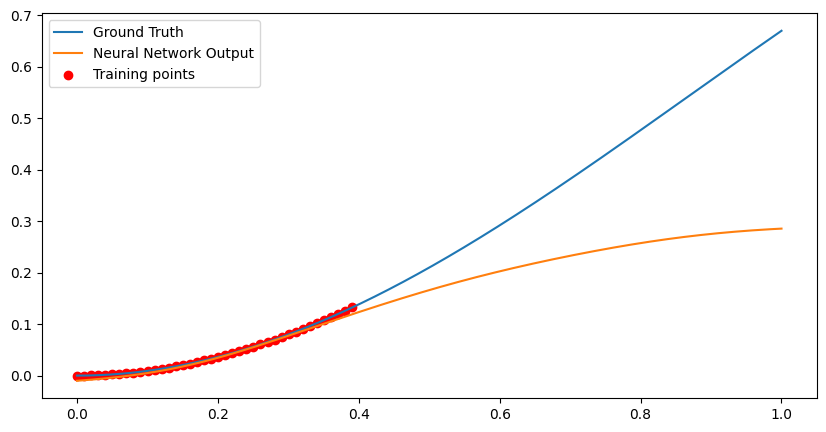

Loss at Step 160 : 4.77860558021348e-05
Epoch 160, Total Data Processed: 819200


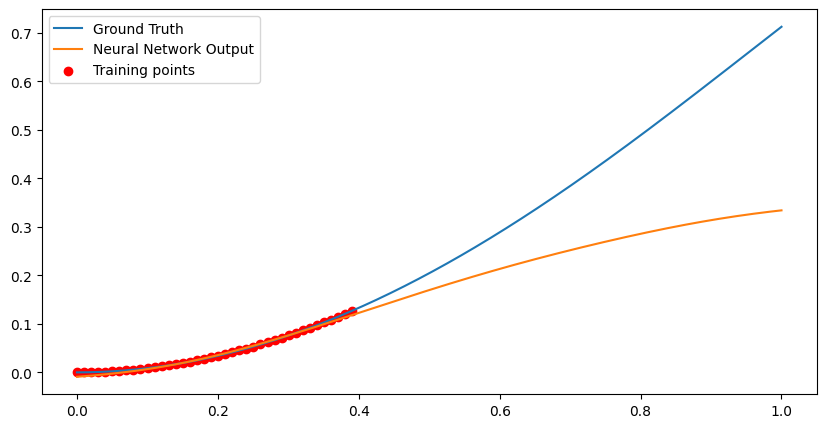

Loss at Step 170 : 7.120953523553908e-05
Epoch 170, Total Data Processed: 870400


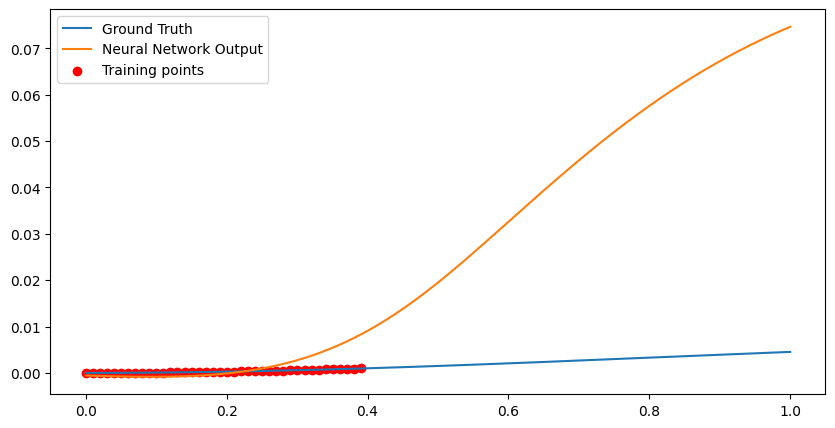

Loss at Step 180 : 0.00027355822385288775
Epoch 180, Total Data Processed: 921600


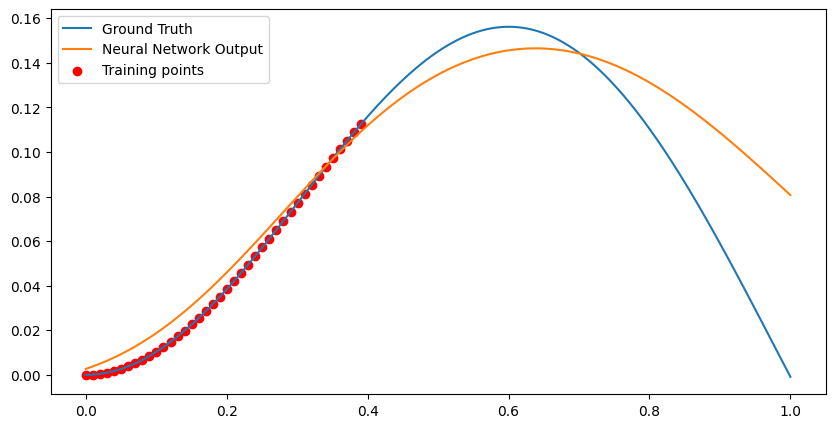

Loss at Step 190 : 0.00016699780826456845
Epoch 190, Total Data Processed: 972800


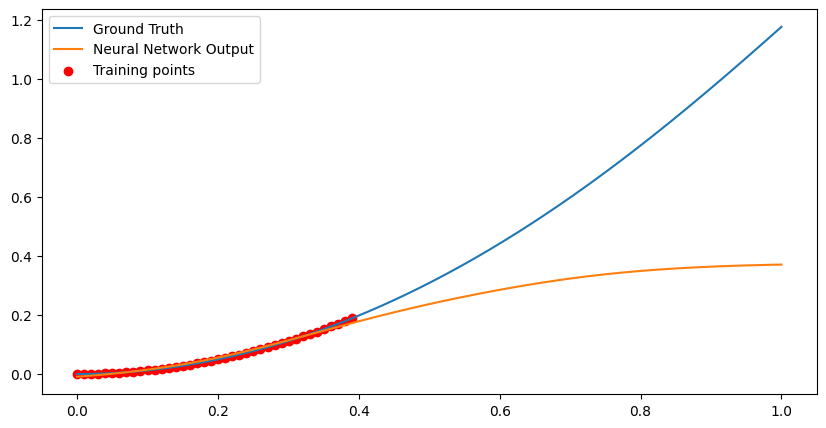

Epoch 200, Variance: 2.0711449906229973e-05, Loss Change: 6.140307036162085e-07
Loss at Step 200 : 0.0002677166776265949
Epoch 200, Total Data Processed: 1024000


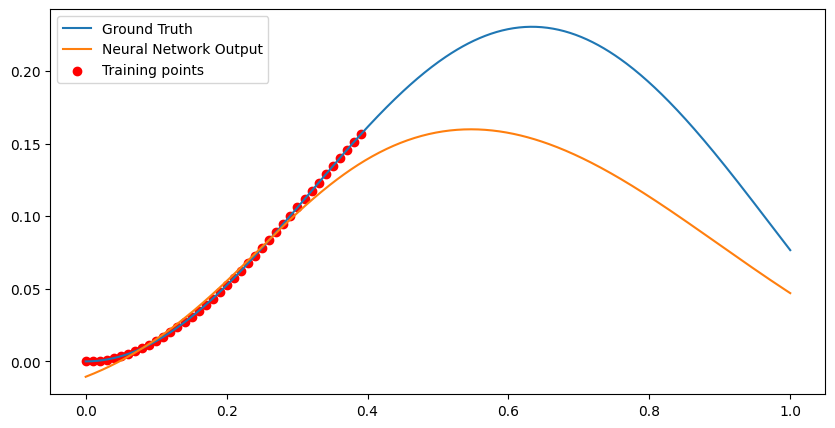

Loss at Step 210 : 5.505573790287599e-05
Epoch 210, Total Data Processed: 1075200


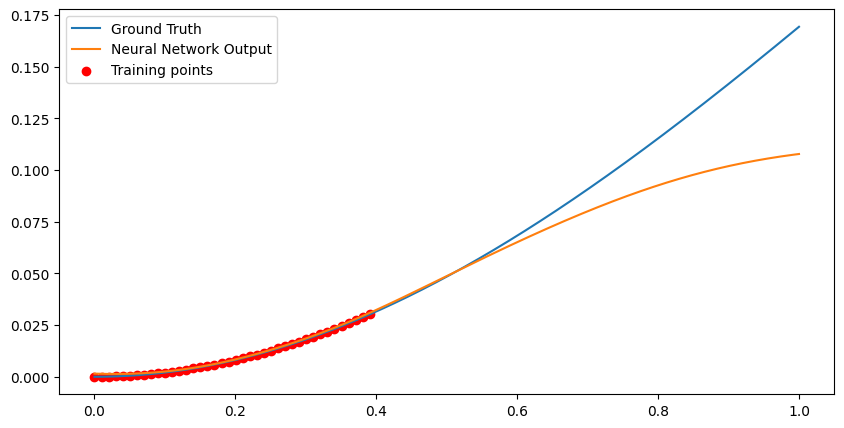

Loss at Step 220 : 0.00022278414689935744
Epoch 220, Total Data Processed: 1126400


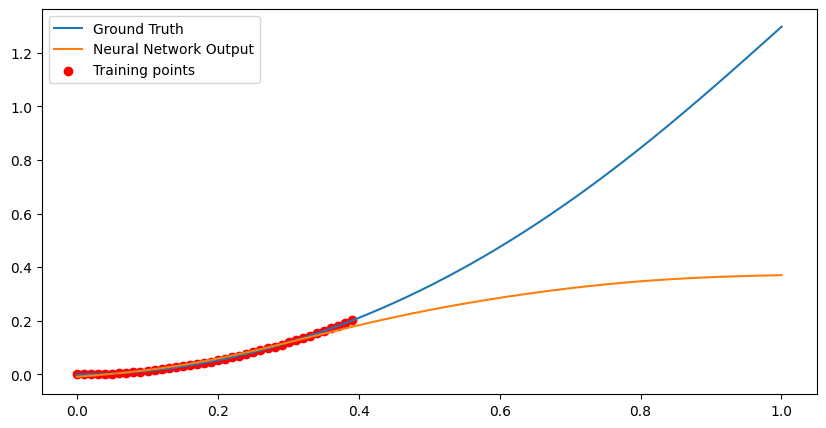

Loss at Step 230 : 0.00019139738287776709
Epoch 230, Total Data Processed: 1177600


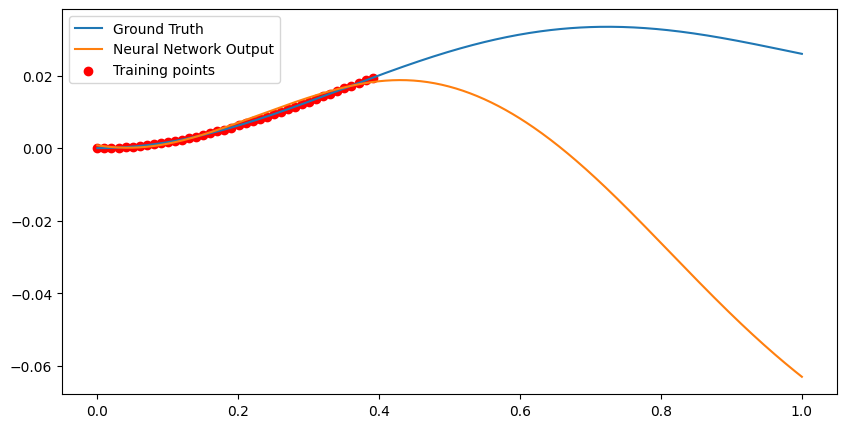

Loss at Step 240 : 6.596383173018694e-05
Epoch 240, Total Data Processed: 1228800


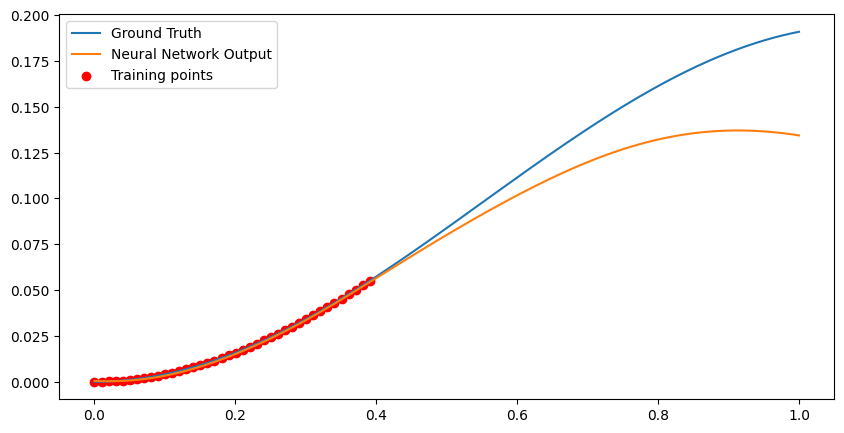

Loss at Step 250 : 6.489362567663193e-05
Epoch 250, Total Data Processed: 1280000


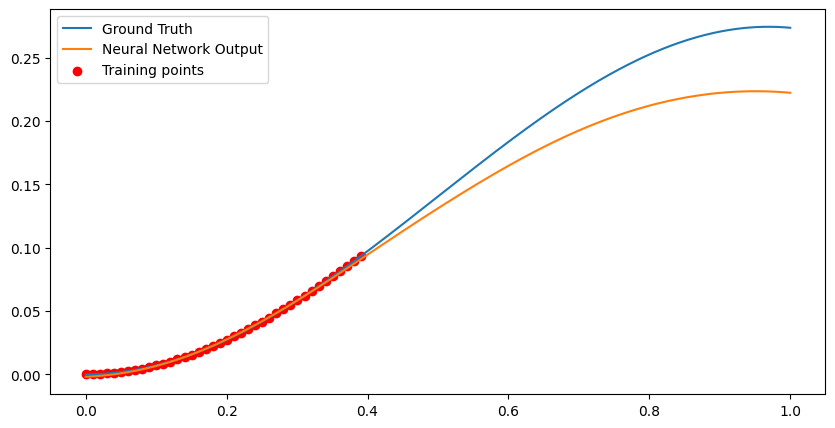

Loss at Step 260 : 9.376408706884831e-05
Epoch 260, Total Data Processed: 1331200


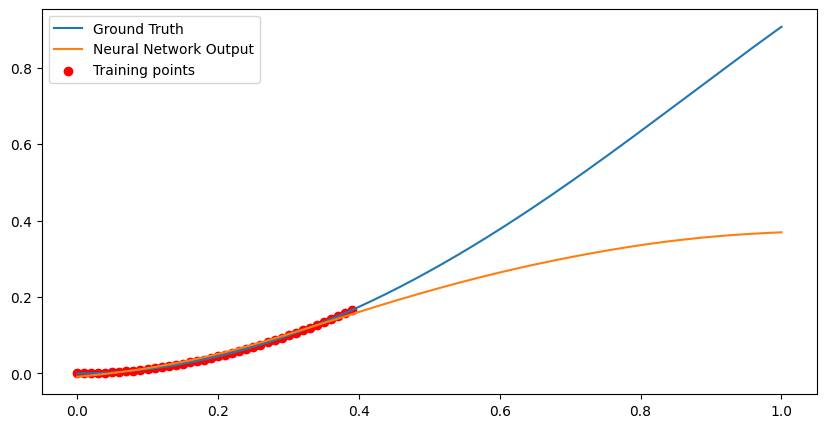

Loss at Step 270 : 6.386765016941354e-05
Epoch 270, Total Data Processed: 1382400


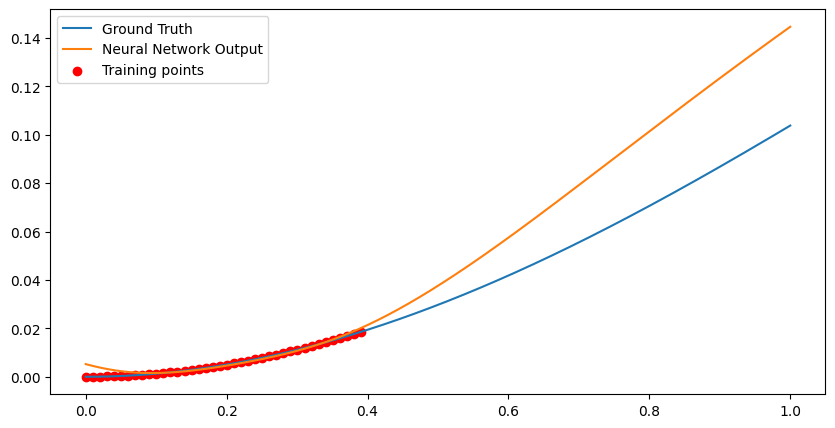

Loss at Step 280 : 0.00020469882292672992
Epoch 280, Total Data Processed: 1433600


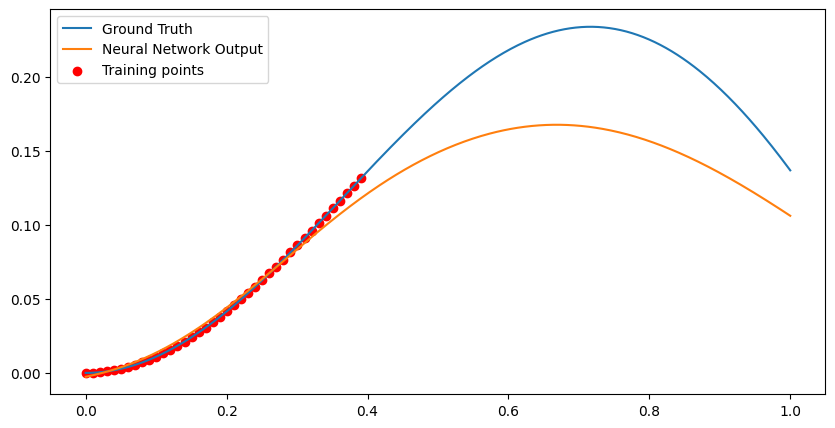

Loss at Step 290 : 9.788209717953578e-05
Epoch 290, Total Data Processed: 1484800


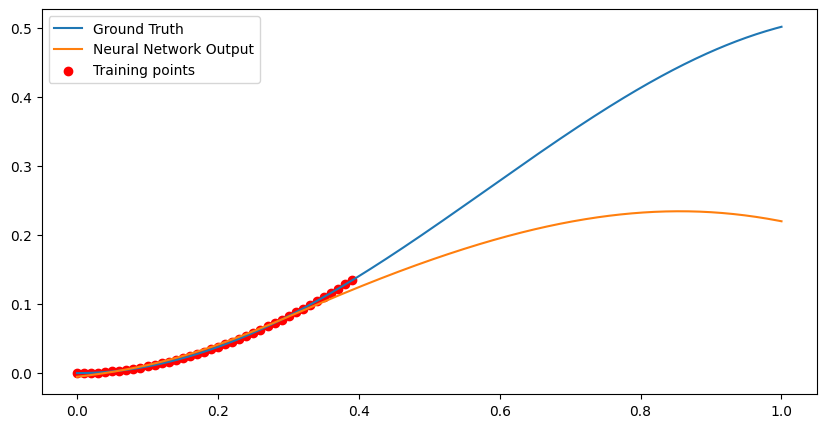

Epoch 300, Variance: 1.5605335647705942e-05, Loss Change: 1.072969091708842e-05
Loss at Step 300 : 0.00017859123181551695
Epoch 300, Total Data Processed: 1536000


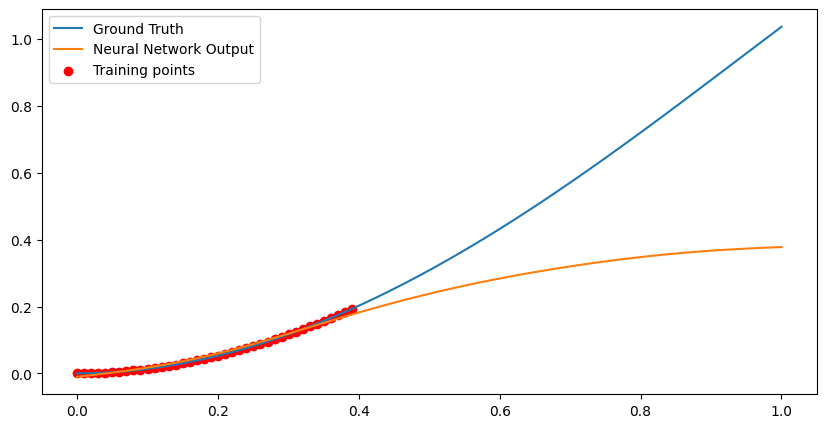

Loss at Step 310 : 0.00014641880989074707
Epoch 310, Total Data Processed: 1587200


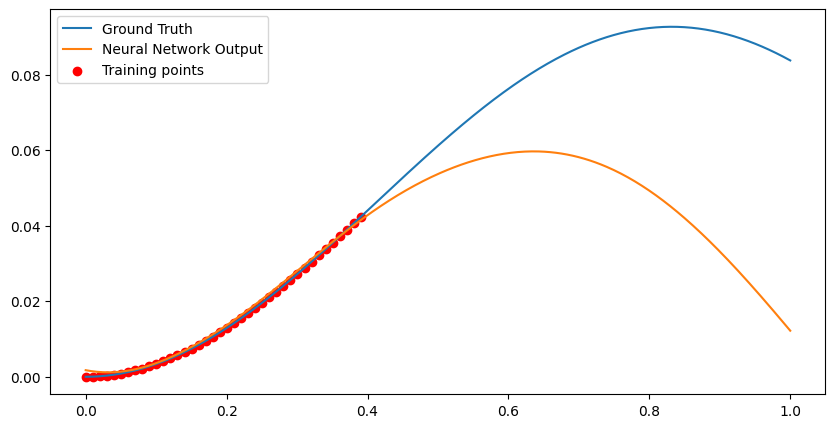

Loss at Step 320 : 0.000218215849599801
Epoch 320, Total Data Processed: 1638400


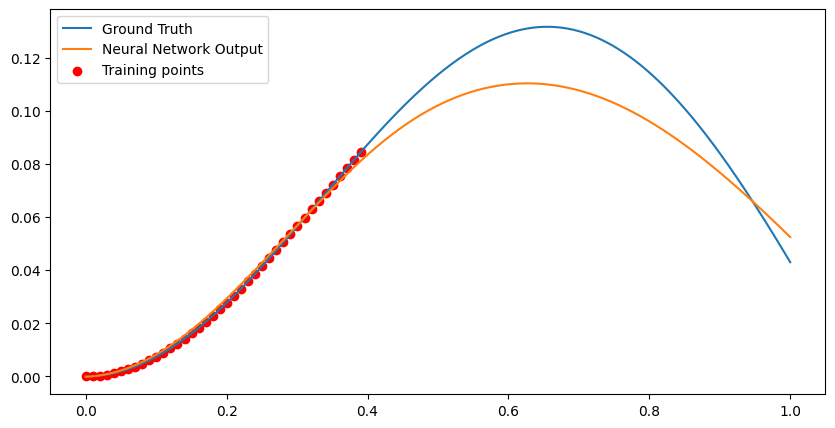

Loss at Step 330 : 0.00021782804105896503
Epoch 330, Total Data Processed: 1689600


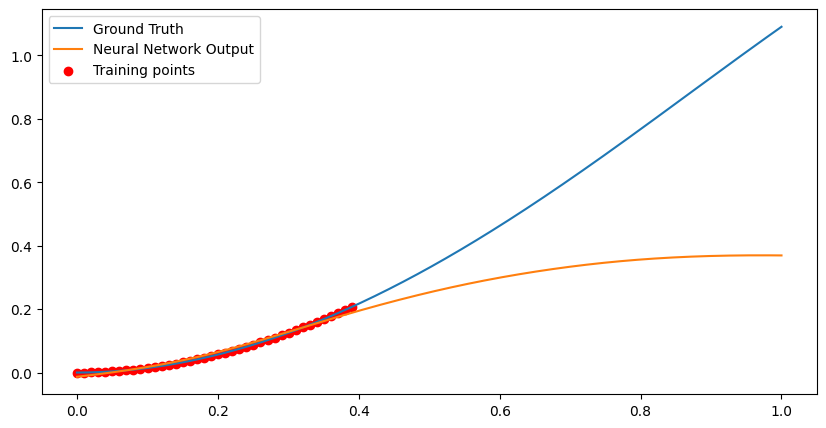

Loss at Step 340 : 0.0002902540727518499
Epoch 340, Total Data Processed: 1740800


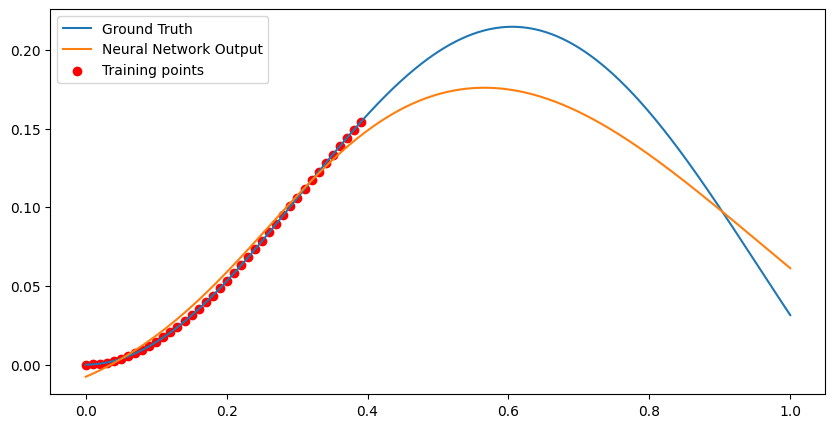

Loss at Step 350 : 0.00017816841136664152
Epoch 350, Total Data Processed: 1792000


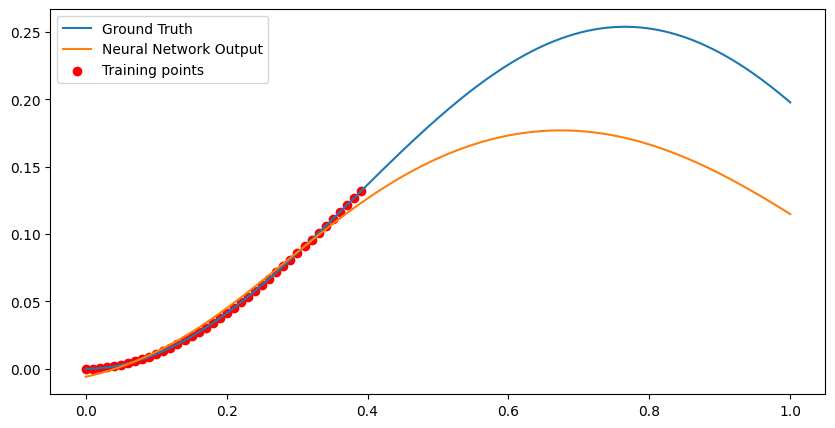

Loss at Step 360 : 8.487567538395524e-05
Epoch 360, Total Data Processed: 1843200


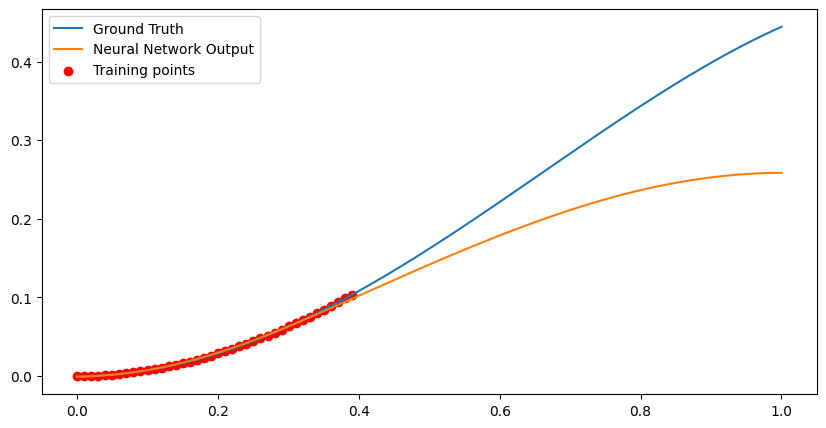

Loss at Step 370 : 0.00016714553930796683
Epoch 370, Total Data Processed: 1894400


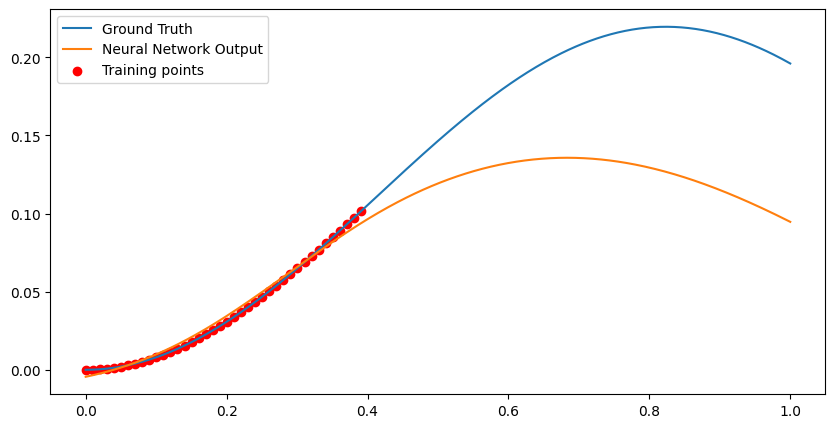

Loss at Step 380 : 0.00020310624677222222
Epoch 380, Total Data Processed: 1945600


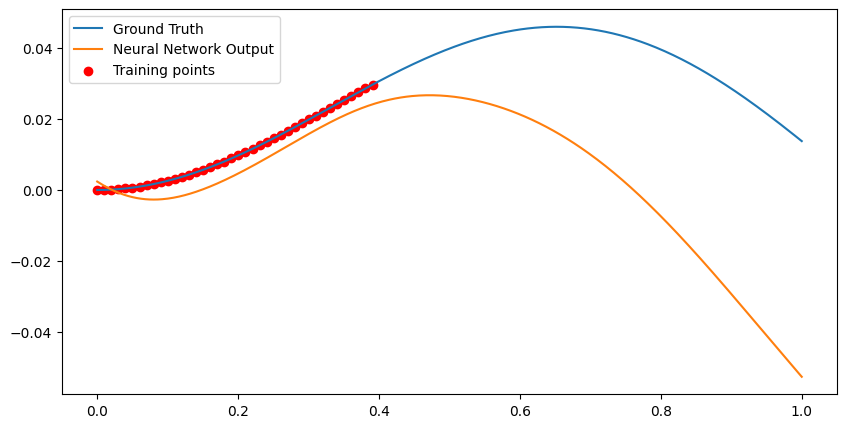

Loss at Step 390 : 0.00018341917893849313
Epoch 390, Total Data Processed: 1996800


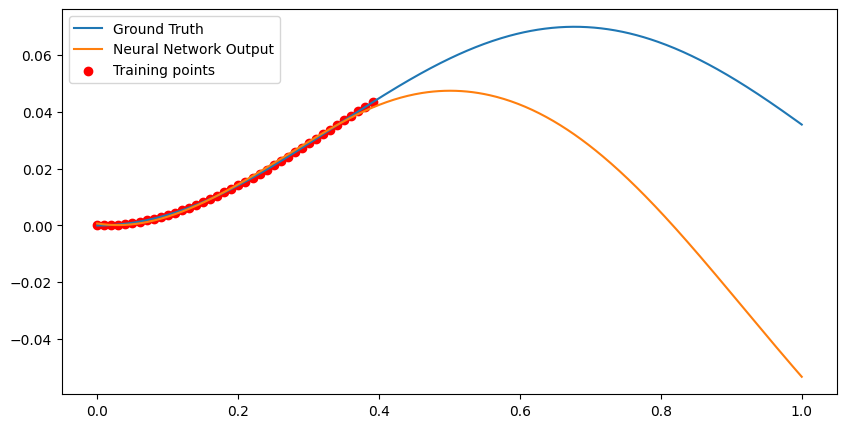

Epoch 400, Variance: 1.4203401406120975e-05, Loss Change: 1.5126013863664411e-06
Loss at Step 400 : 5.6225348089355975e-05
Epoch 400, Total Data Processed: 2048000


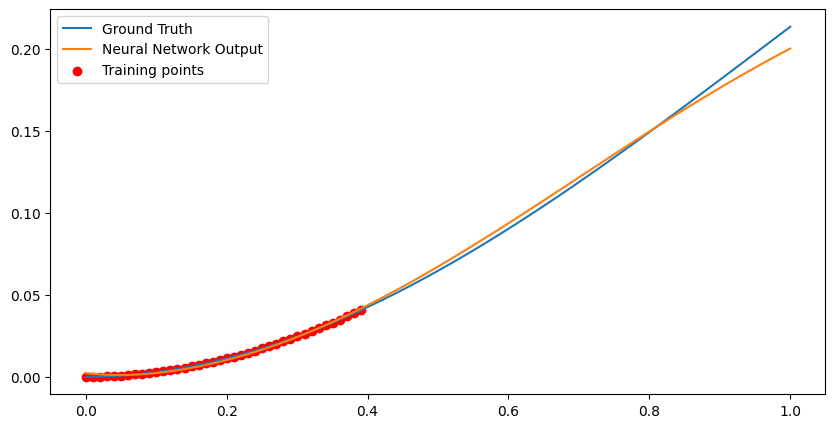

Loss at Step 410 : 0.00014829532301519066
Epoch 410, Total Data Processed: 2099200


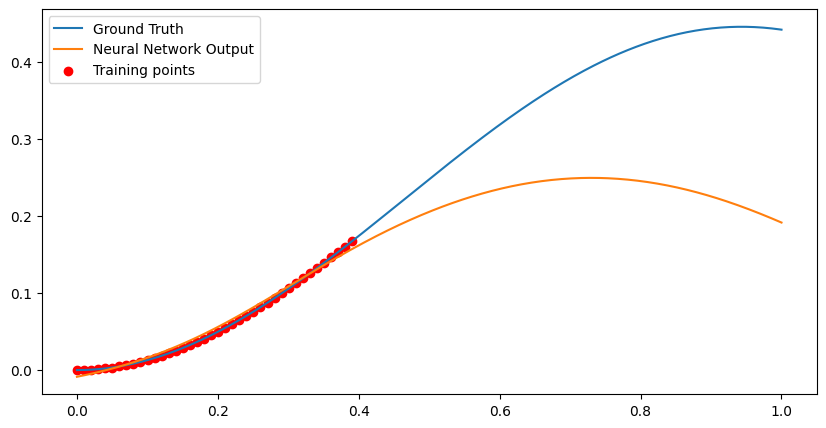

Loss at Step 420 : 0.00021493576059583575
Epoch 420, Total Data Processed: 2150400


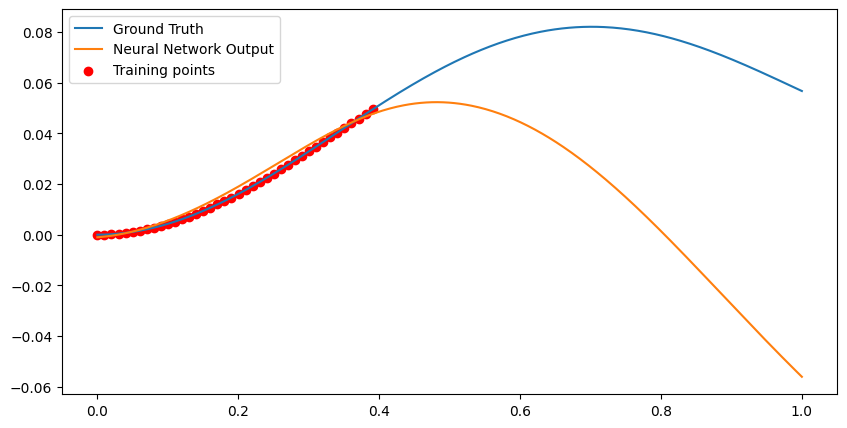

Loss at Step 430 : 0.00019217761291656643
Epoch 430, Total Data Processed: 2201600


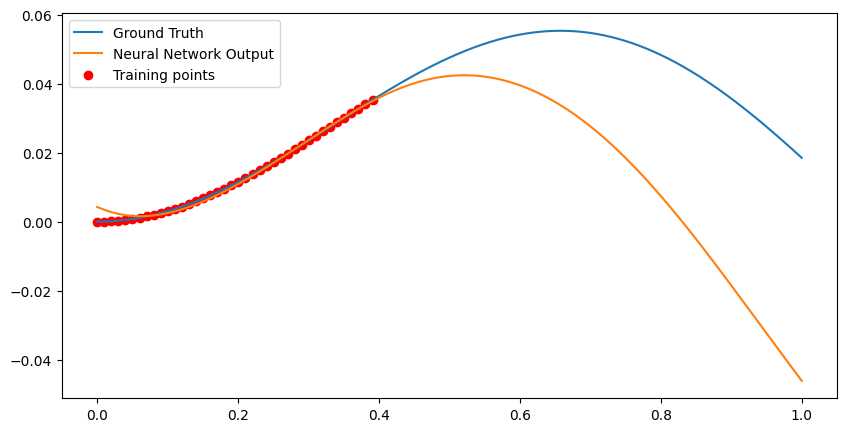

Loss at Step 440 : 0.0002209661906817928
Epoch 440, Total Data Processed: 2252800


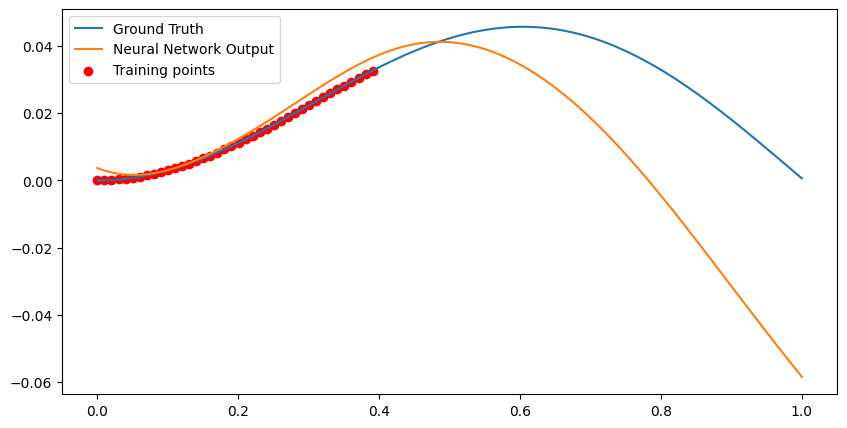

Loss at Step 450 : 2.0715729988296516e-05
Epoch 450, Total Data Processed: 2304000


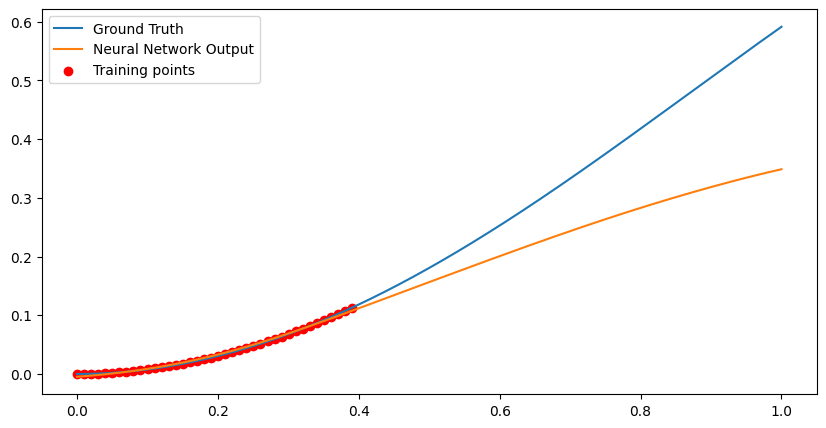

Loss at Step 460 : 0.00014718426973558962
Epoch 460, Total Data Processed: 2355200


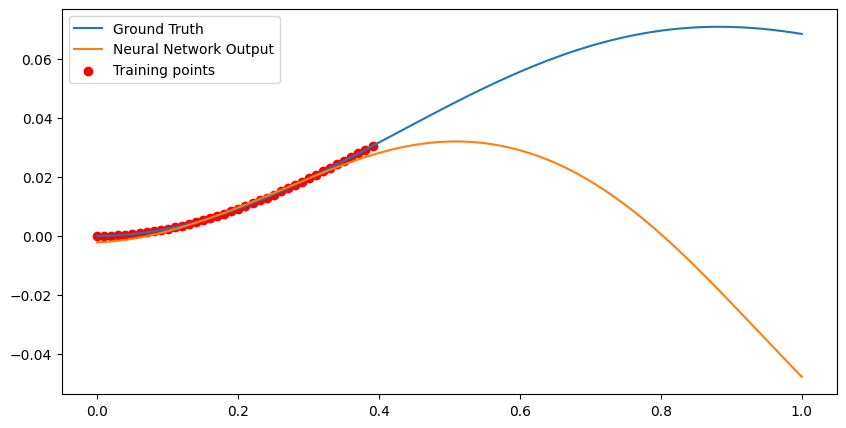

Loss at Step 470 : 0.00020753753778990358
Epoch 470, Total Data Processed: 2406400


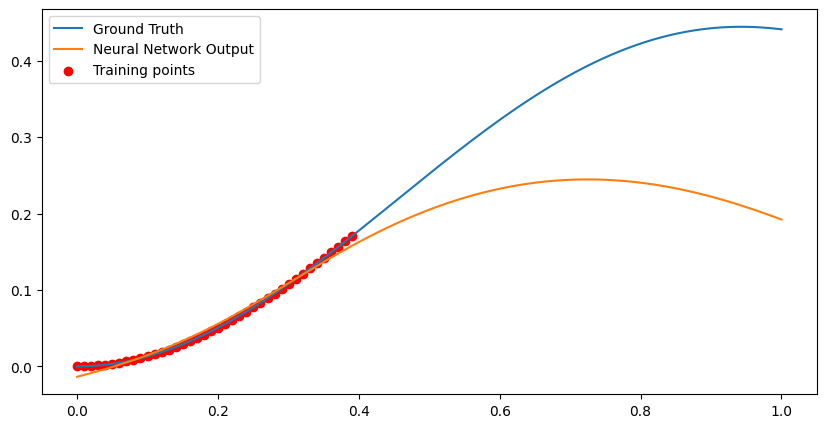

Loss at Step 480 : 3.515930438879877e-05
Epoch 480, Total Data Processed: 2457600


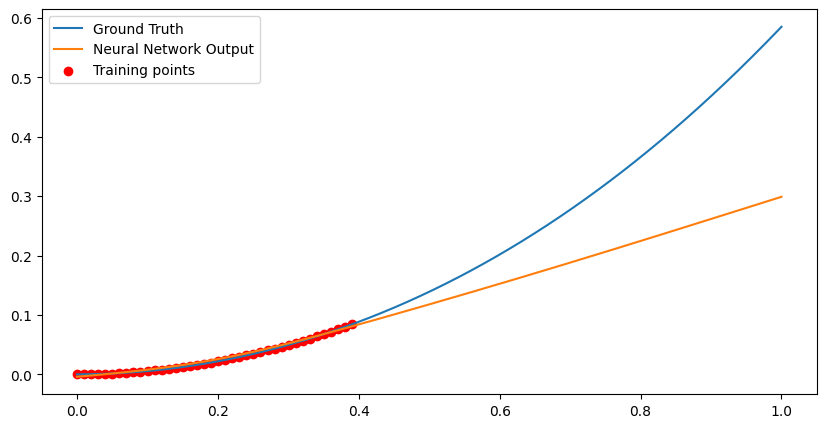

Loss at Step 490 : 0.00019528593111317605
Epoch 490, Total Data Processed: 2508800


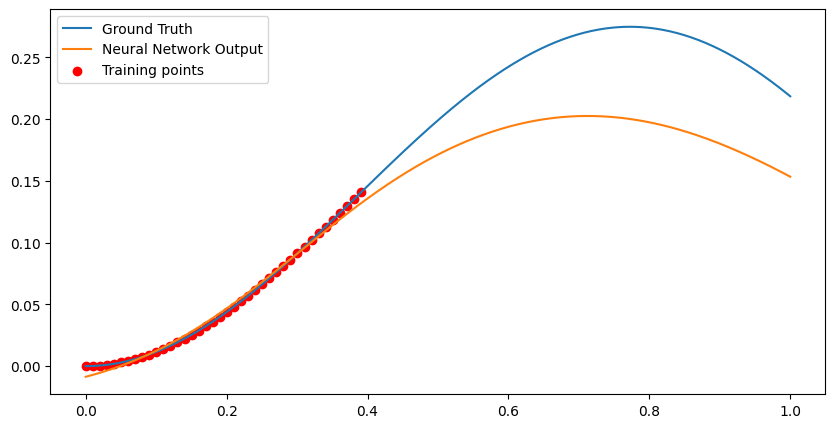

Epoch 500, Variance: 1.375183910568012e-05, Loss Change: 4.192258401758409e-06
Loss at Step 500 : 0.0002127057232428342
Epoch 500, Total Data Processed: 2560000


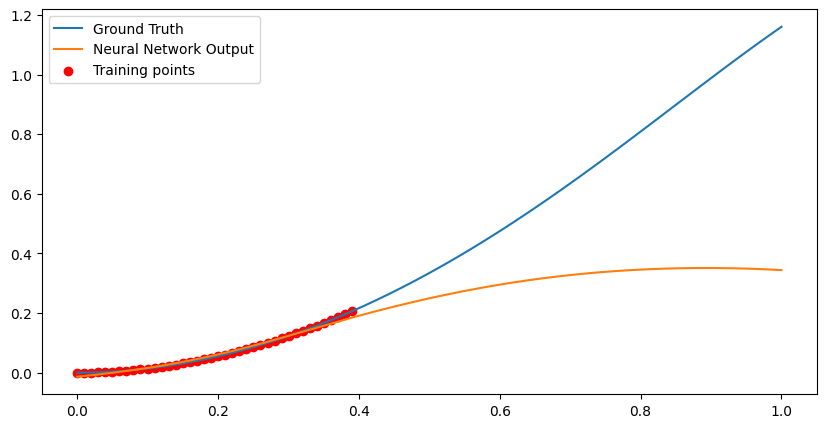

Loss at Step 510 : 0.00013533055607695132
Epoch 510, Total Data Processed: 2611200


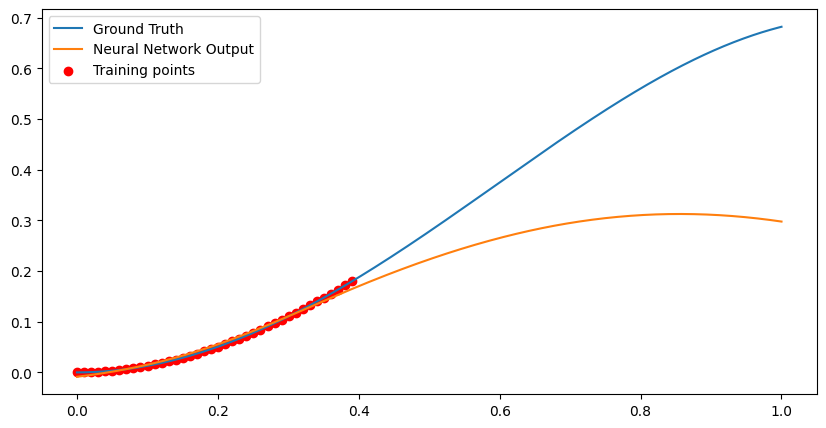

Loss at Step 520 : 9.492890239926055e-05
Epoch 520, Total Data Processed: 2662400


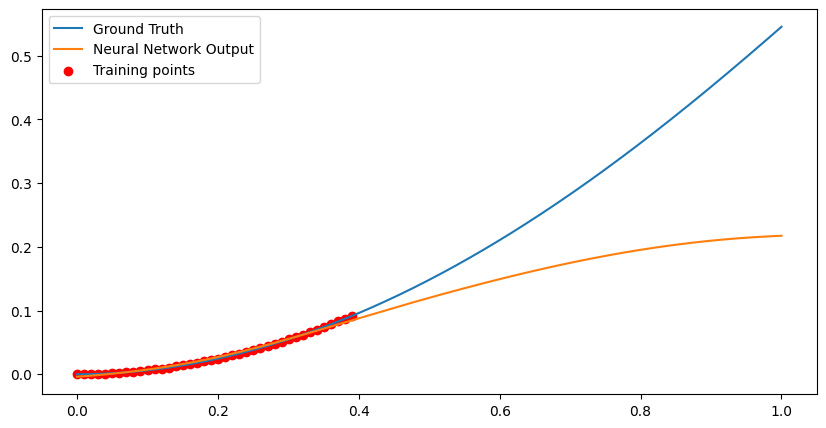

Loss at Step 530 : 1.6431898984592408e-05
Epoch 530, Total Data Processed: 2713600


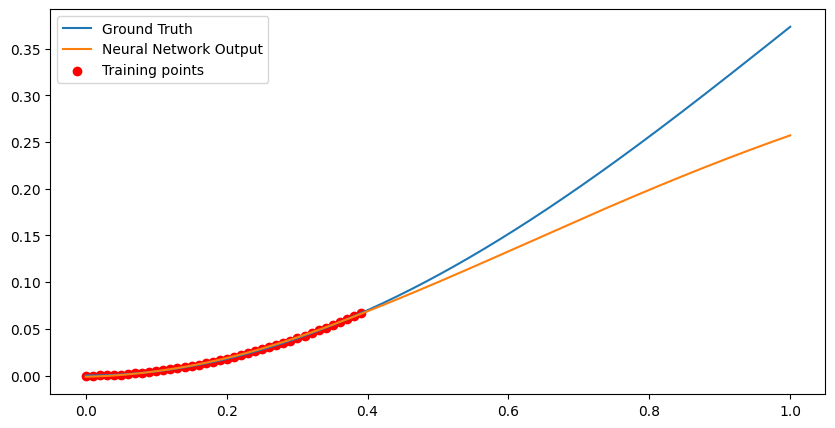

Loss at Step 540 : 0.0002422011166345328
Epoch 540, Total Data Processed: 2764800


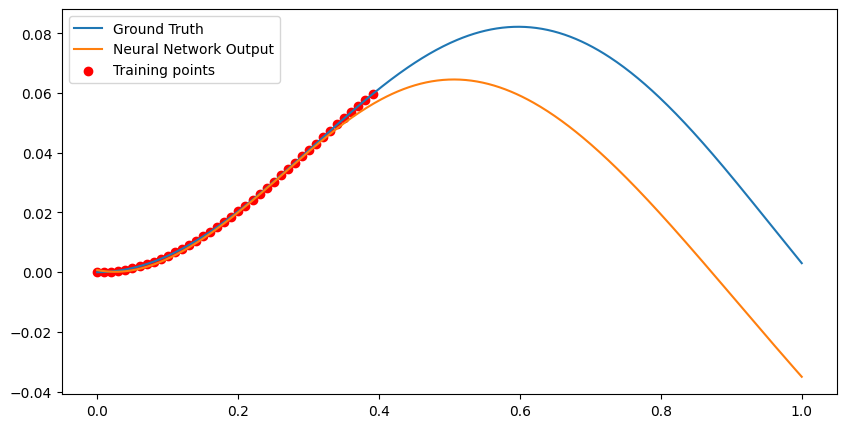

Loss at Step 550 : 0.0001225588348461315
Epoch 550, Total Data Processed: 2816000


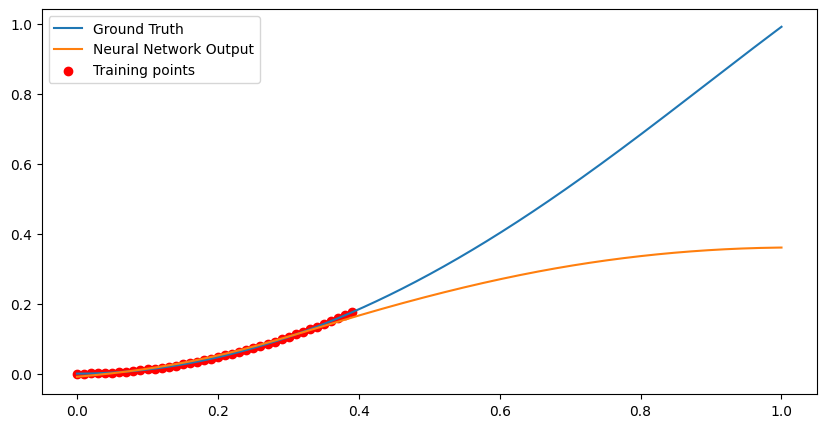

Loss at Step 560 : 8.62886881805025e-05
Epoch 560, Total Data Processed: 2867200


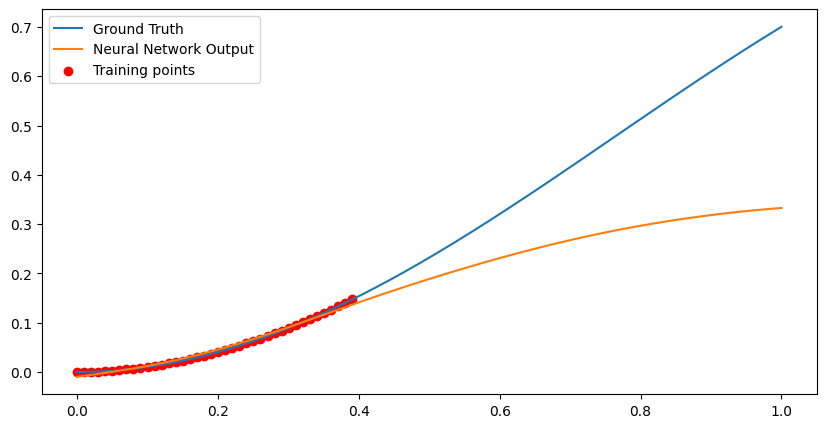

Loss at Step 570 : 3.653287421911955e-05
Epoch 570, Total Data Processed: 2918400


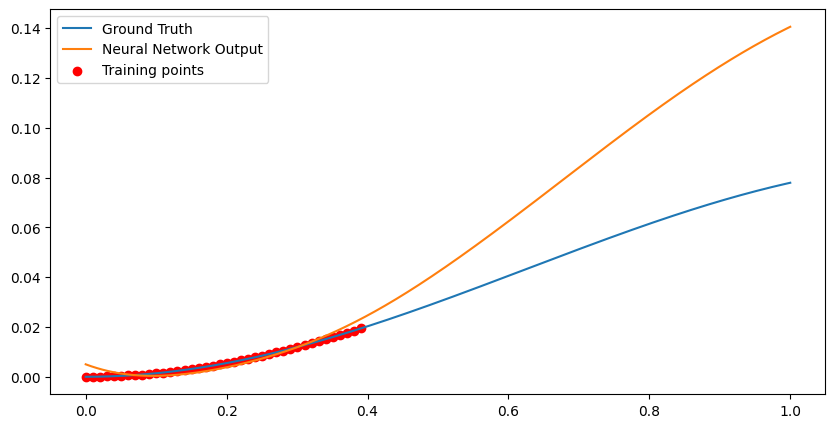

Loss at Step 580 : 4.525021722656675e-05
Epoch 580, Total Data Processed: 2969600


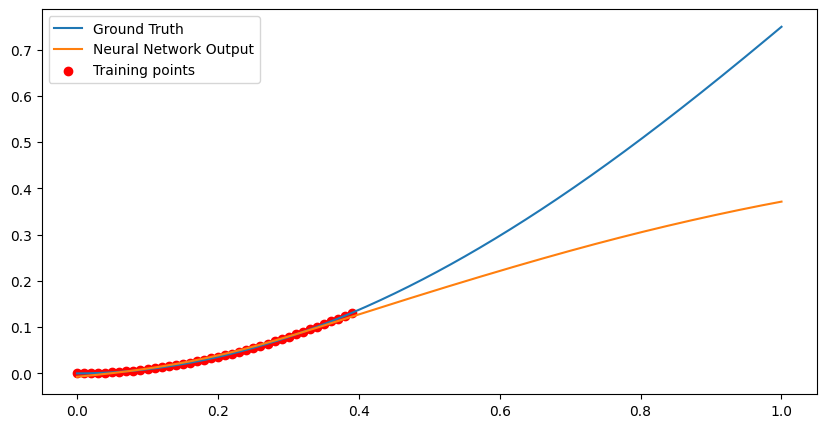

Loss at Step 590 : 0.00022722373250871897
Epoch 590, Total Data Processed: 3020800


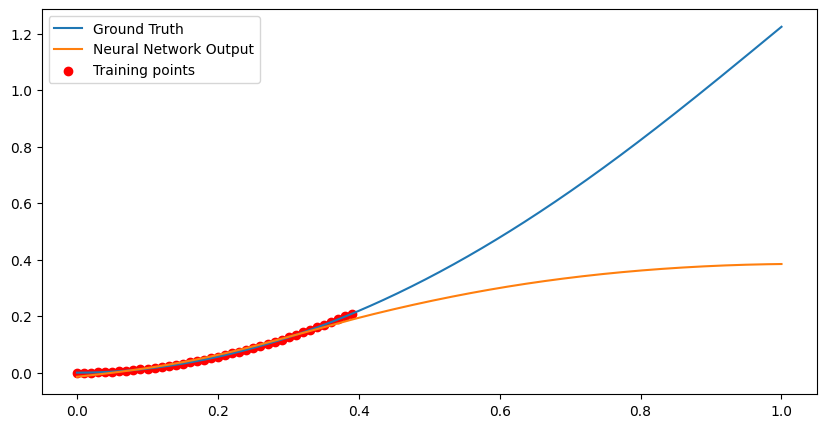

Epoch 600, Variance: 9.732046237331815e-06, Loss Change: 1.963810620608797e-05
Loss at Step 600 : 0.00015064977924339473
Epoch 600, Total Data Processed: 3072000


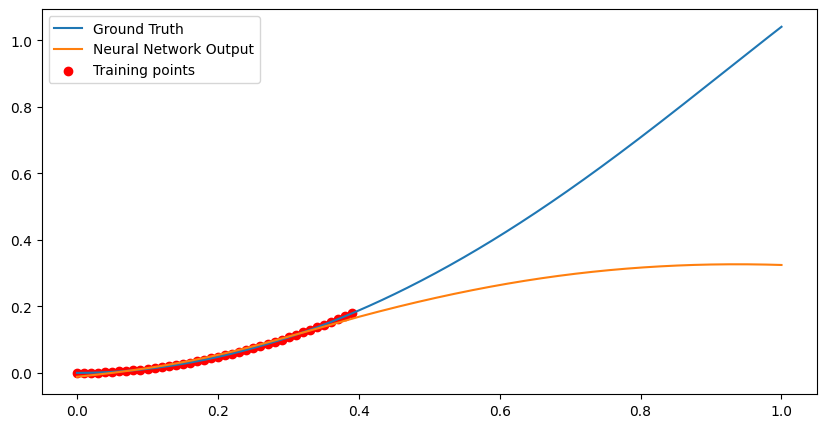

Loss at Step 610 : 4.7144698328338563e-05
Epoch 610, Total Data Processed: 3123200


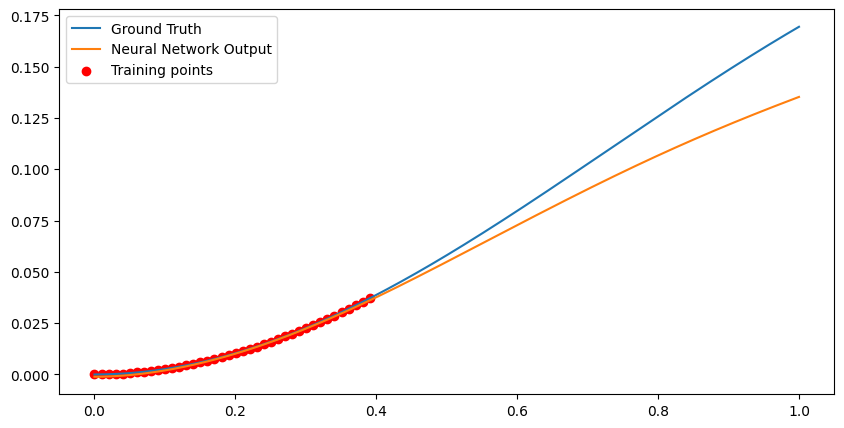

Loss at Step 620 : 0.00017077568918466568
Epoch 620, Total Data Processed: 3174400


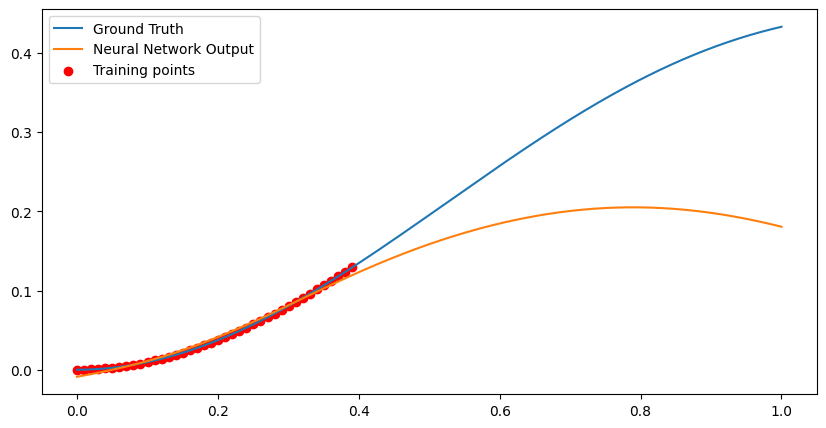

Loss at Step 630 : 0.00019798795983660966
Epoch 630, Total Data Processed: 3225600


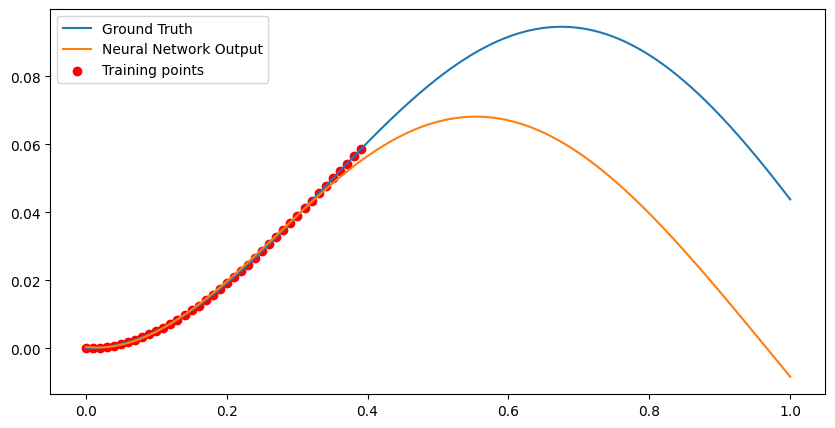

Loss at Step 640 : 0.00018639957124833018
Epoch 640, Total Data Processed: 3276800


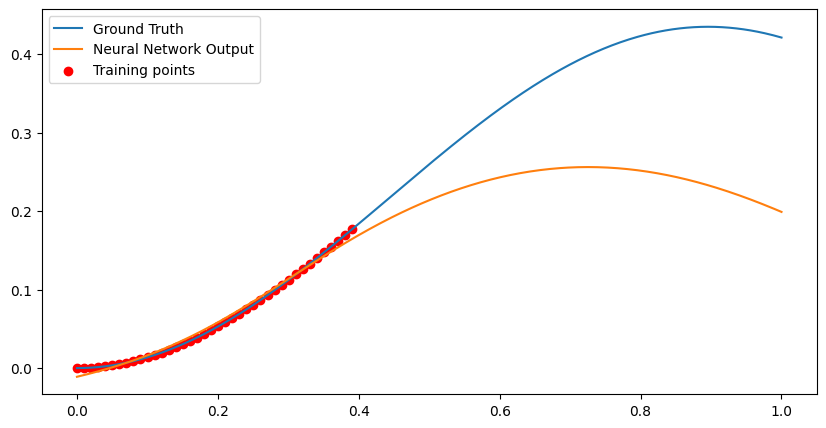

Loss at Step 650 : 5.3775984270032495e-05
Epoch 650, Total Data Processed: 3328000


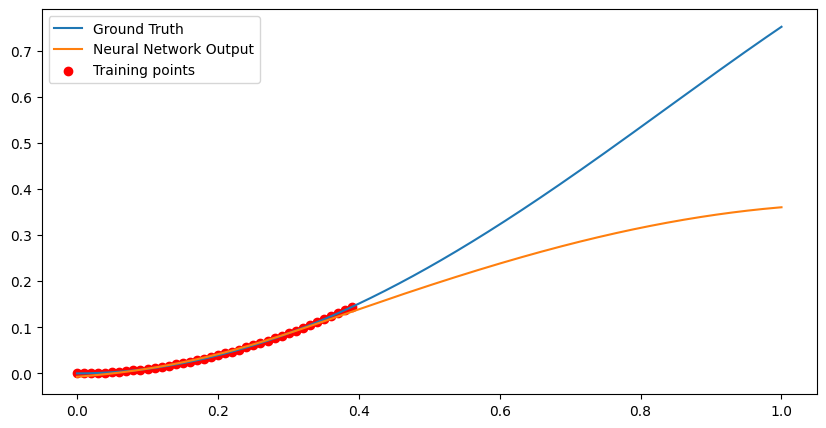

Loss at Step 660 : 0.00021215555898379534
Epoch 660, Total Data Processed: 3379200


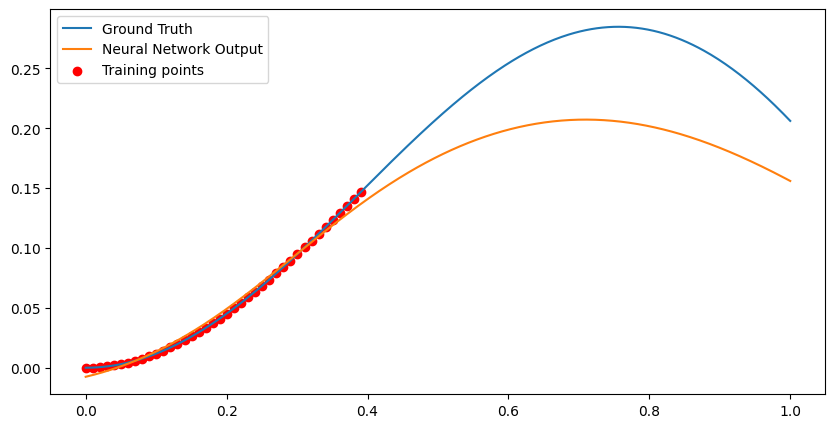

Loss at Step 670 : 7.713794184383005e-05
Epoch 670, Total Data Processed: 3430400


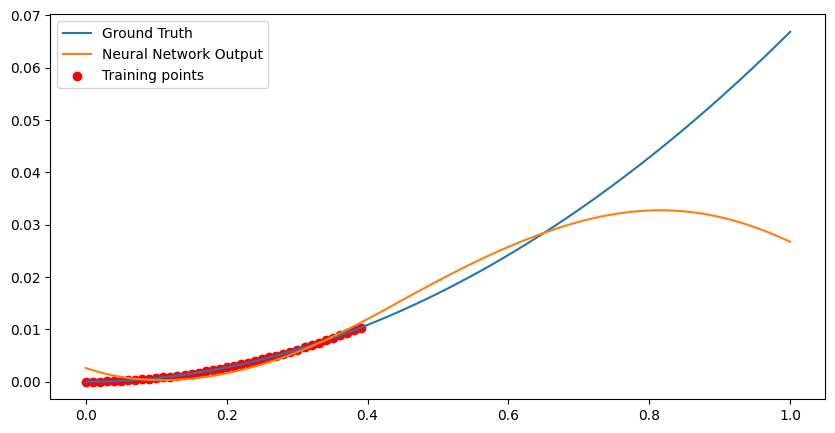

Loss at Step 680 : 8.735014125704765e-05
Epoch 680, Total Data Processed: 3481600


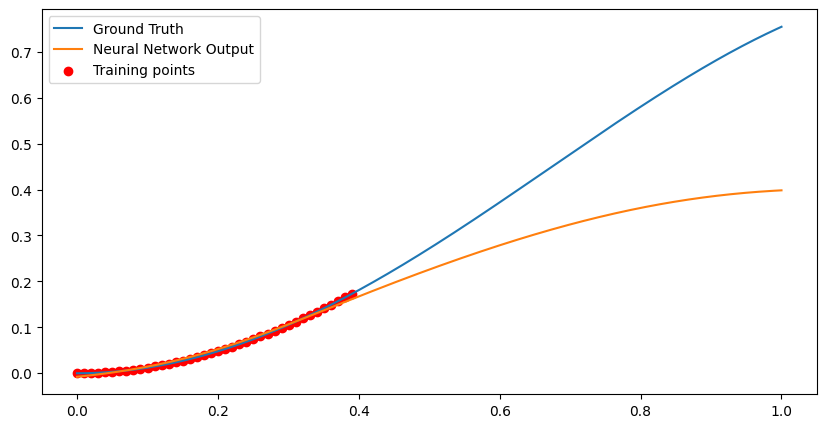

Loss at Step 690 : 0.00010156436474062502
Epoch 690, Total Data Processed: 3532800


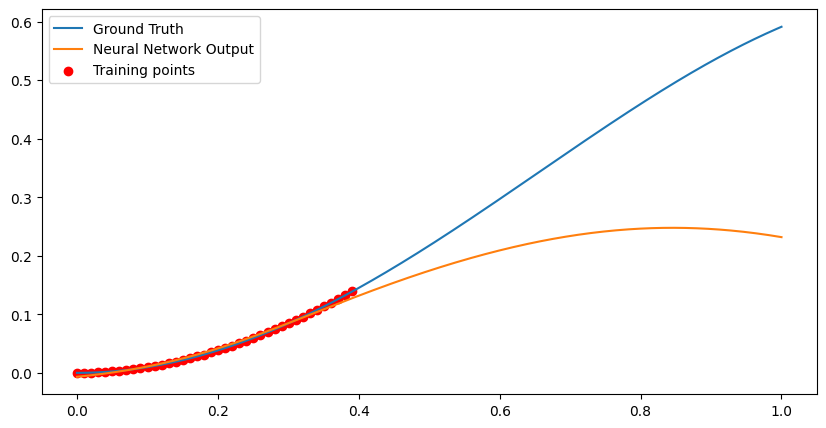

Epoch 700, Variance: 1.1710802027664613e-05, Loss Change: 2.9284570608467675e-06
Loss at Step 700 : 2.7990658054477535e-05
Epoch 700, Total Data Processed: 3584000


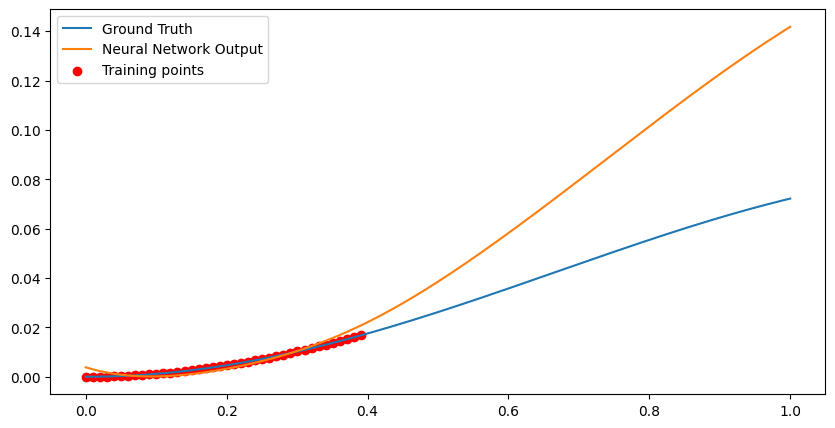

Loss at Step 710 : 8.356980833923444e-05
Epoch 710, Total Data Processed: 3635200


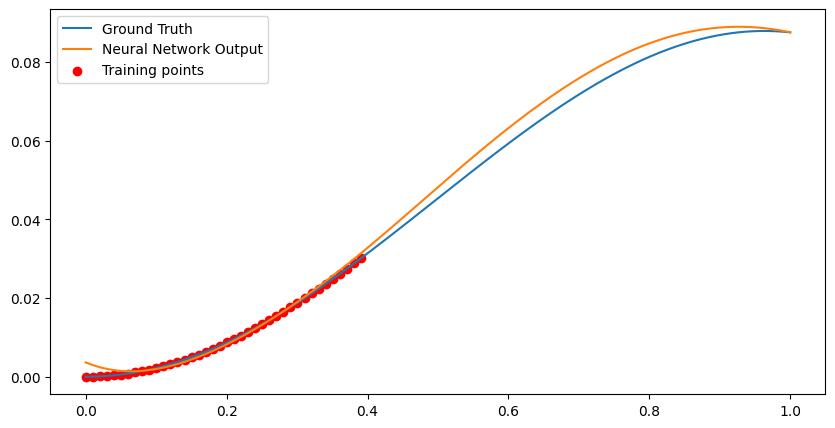

Loss at Step 720 : 8.953562792157754e-05
Epoch 720, Total Data Processed: 3686400


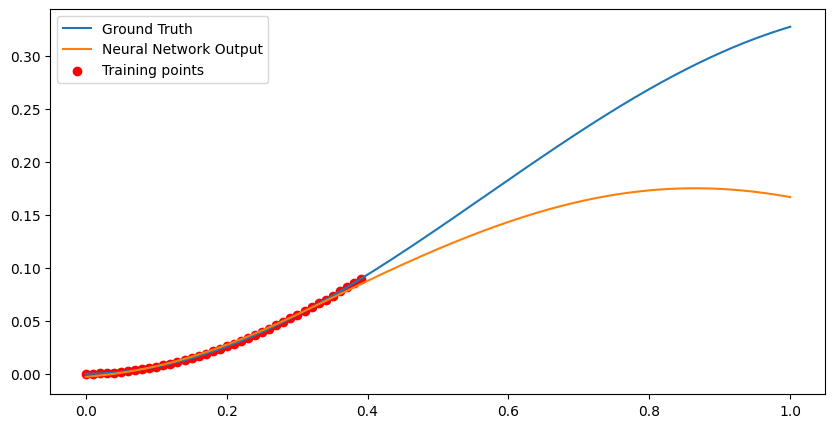

Loss at Step 730 : 0.00011614195682341233
Epoch 730, Total Data Processed: 3737600


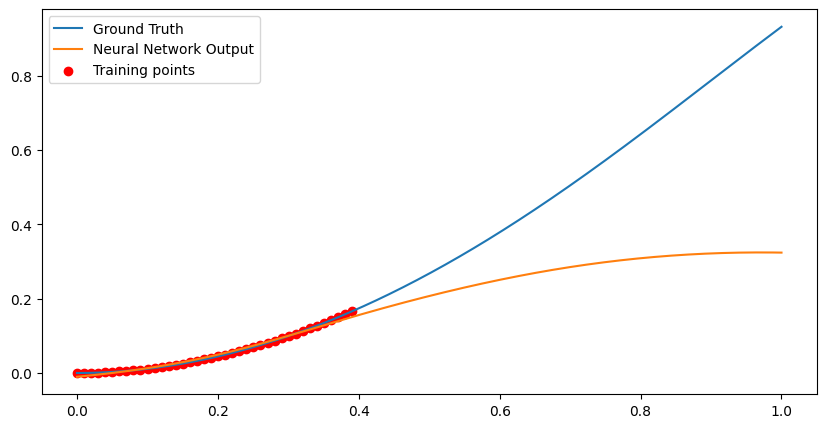

Loss at Step 740 : 3.820705387624912e-05
Epoch 740, Total Data Processed: 3788800


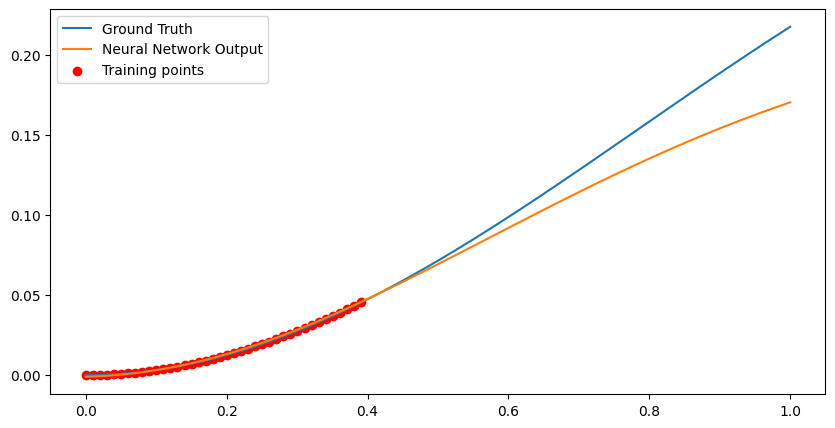

Loss at Step 750 : 9.471715748077258e-05
Epoch 750, Total Data Processed: 3840000


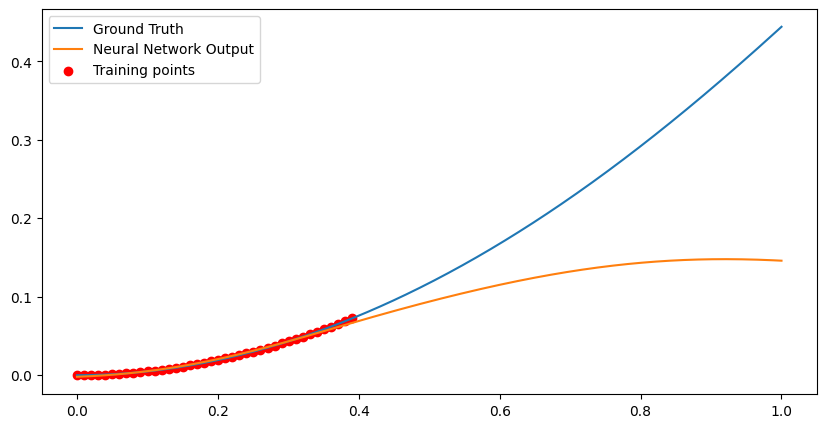

Loss at Step 760 : 0.000204973723157309
Epoch 760, Total Data Processed: 3891200


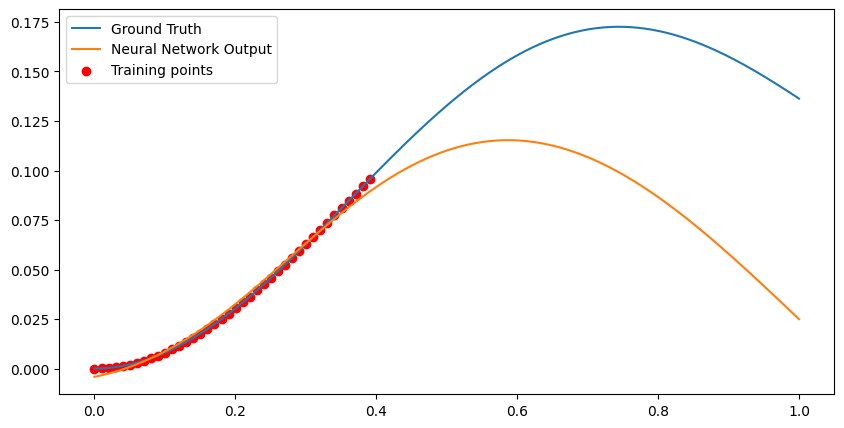

Loss at Step 770 : 0.00011284949141554534
Epoch 770, Total Data Processed: 3942400


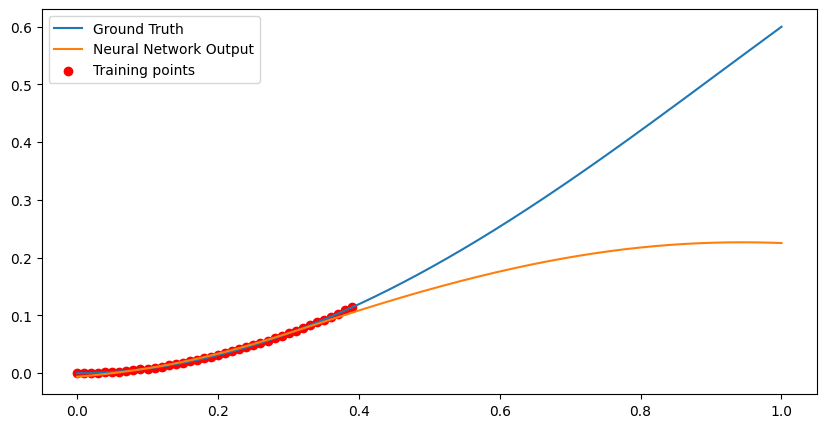

Loss at Step 780 : 4.482653093873523e-05
Epoch 780, Total Data Processed: 3993600


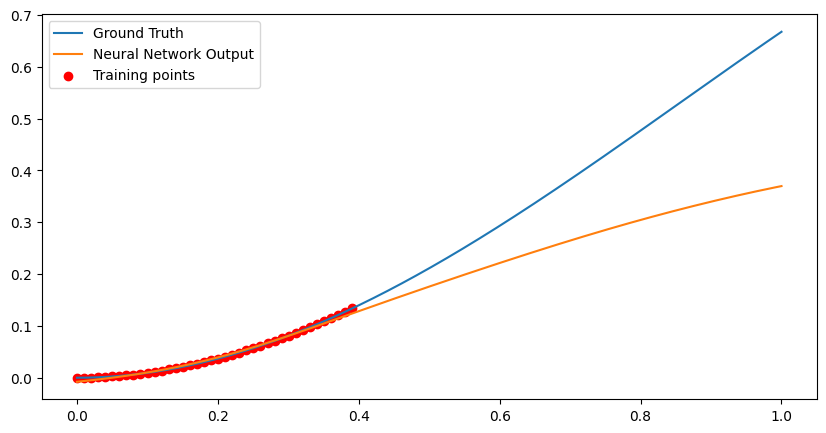

Loss at Step 790 : 0.00012568131205625832
Epoch 790, Total Data Processed: 4044800


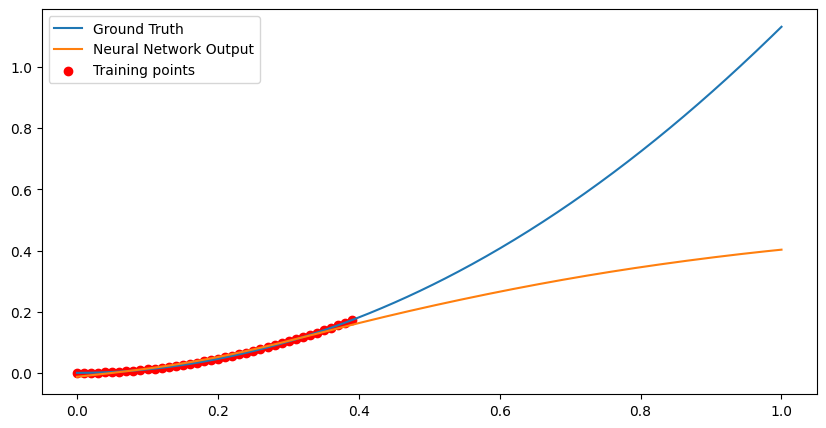

Epoch 800, Variance: 1.614163011254277e-05, Loss Change: 7.167964202636767e-06
Loss at Step 800 : 8.564209565520287e-05
Epoch 800, Total Data Processed: 4096000


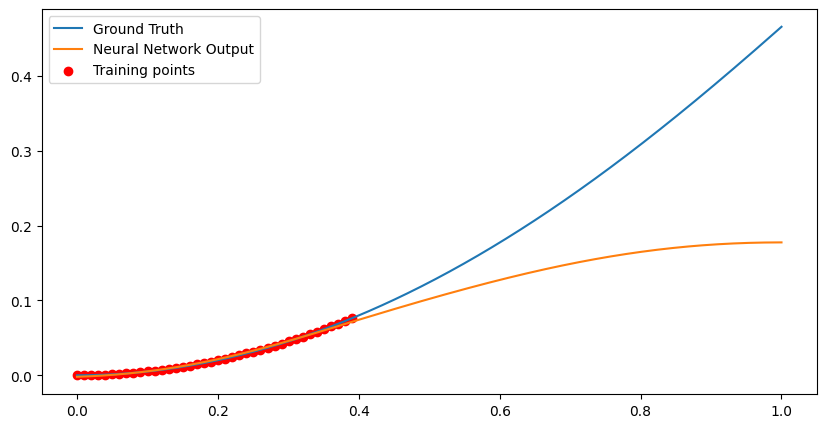

Loss at Step 810 : 0.00021617620950564742
Epoch 810, Total Data Processed: 4147200


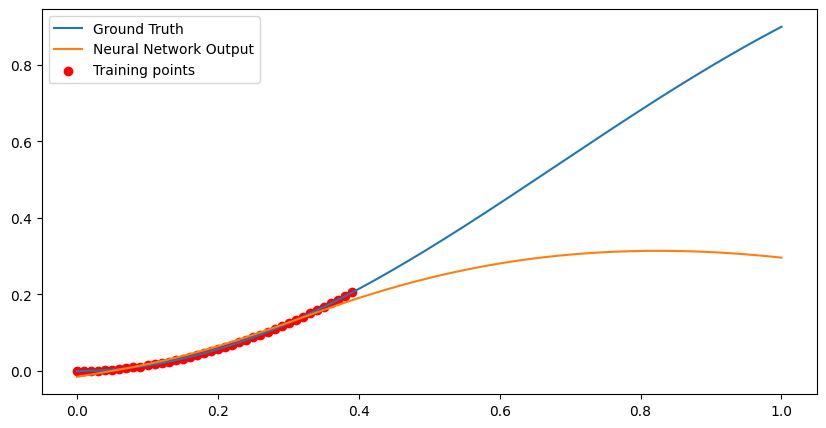

Loss at Step 820 : 5.188232535147108e-05
Epoch 820, Total Data Processed: 4198400


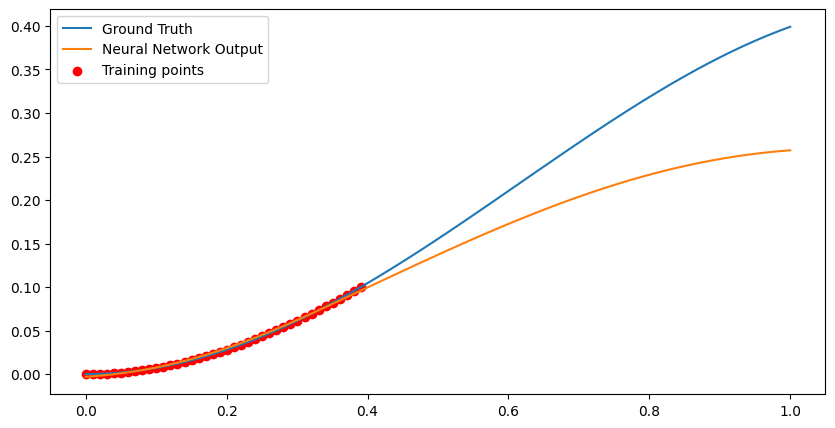

Loss at Step 830 : 0.0001382055488647893
Epoch 830, Total Data Processed: 4249600


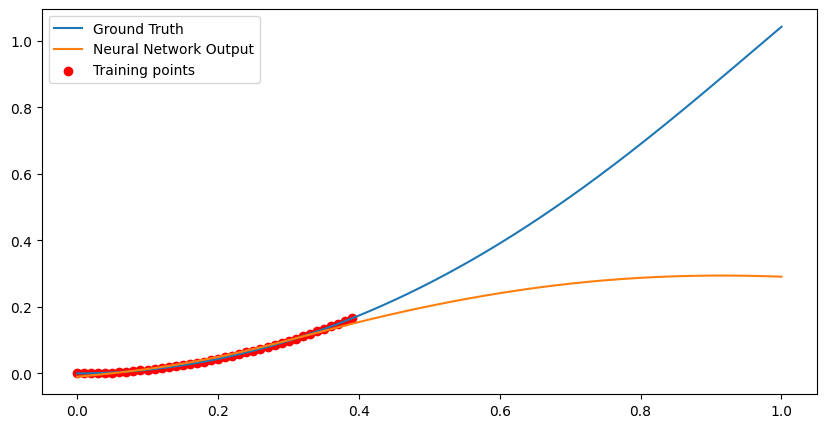

Loss at Step 840 : 8.191368397092447e-05
Epoch 840, Total Data Processed: 4300800


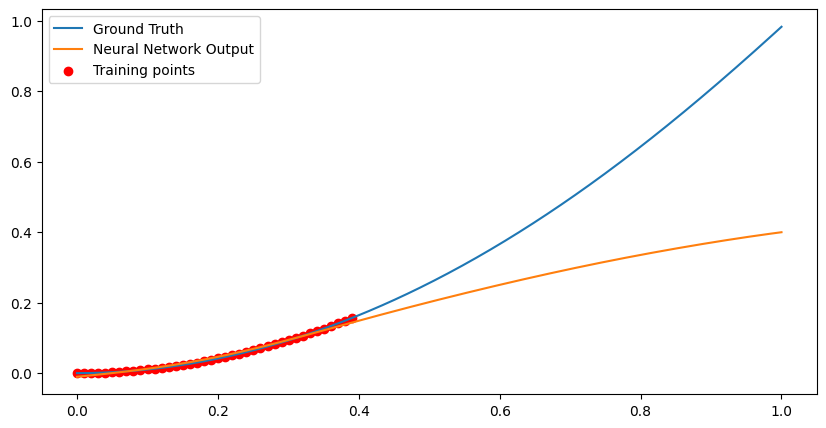

Loss at Step 850 : 0.0002097691030940041
Epoch 850, Total Data Processed: 4352000


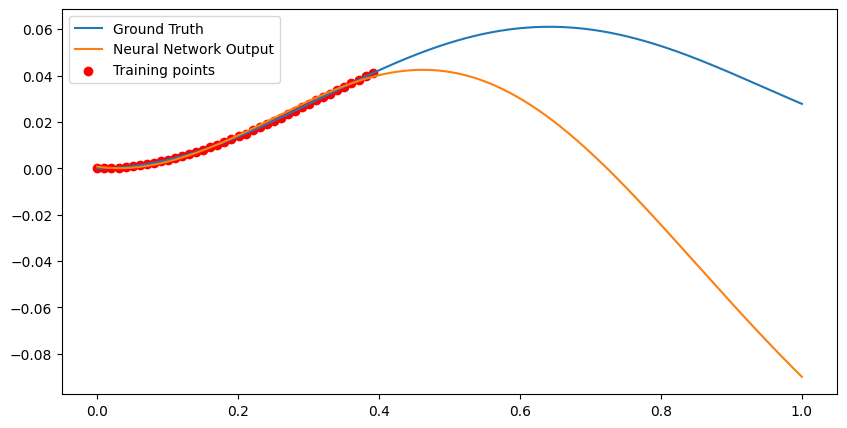

Loss at Step 860 : 8.009724842850119e-05
Epoch 860, Total Data Processed: 4403200


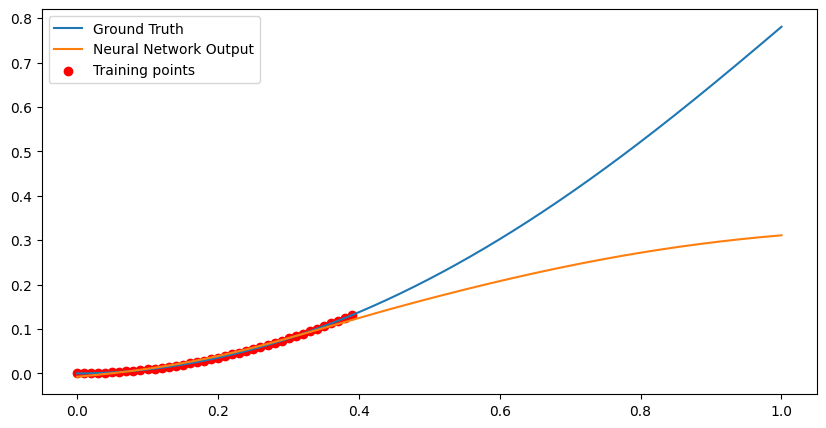

Loss at Step 870 : 0.0001529117434984073
Epoch 870, Total Data Processed: 4454400


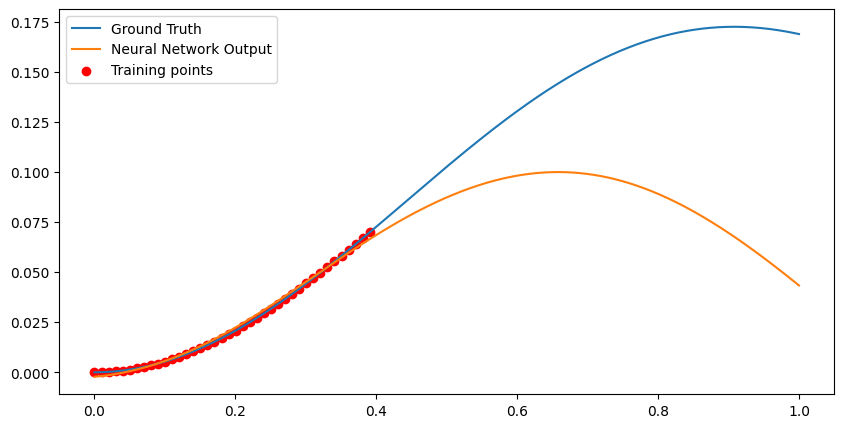

Loss at Step 880 : 0.00016037854948081076
Epoch 880, Total Data Processed: 4505600


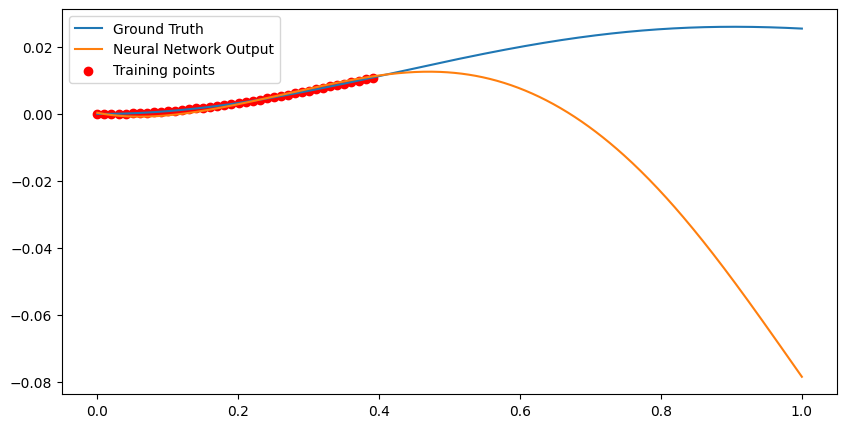

Loss at Step 890 : 3.7716781662311405e-05
Epoch 890, Total Data Processed: 4556800


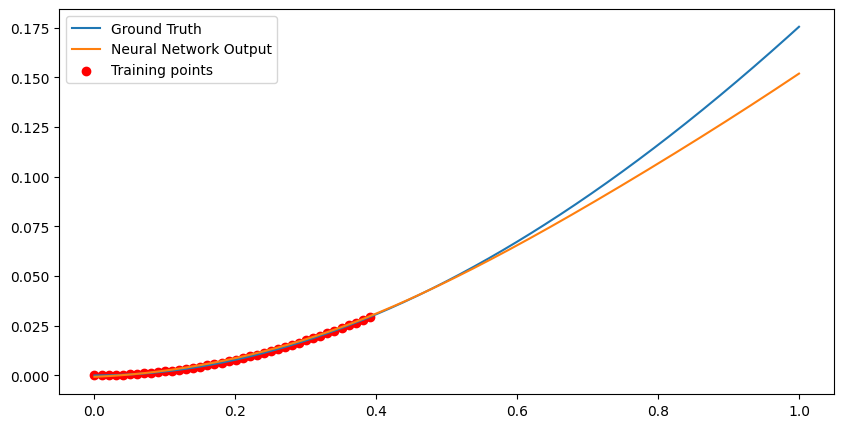

Epoch 900, Variance: 8.685077773407102e-06, Loss Change: 1.6194668635449716e-05
Loss at Step 900 : 2.870969365176279e-05
Epoch 900, Total Data Processed: 4608000


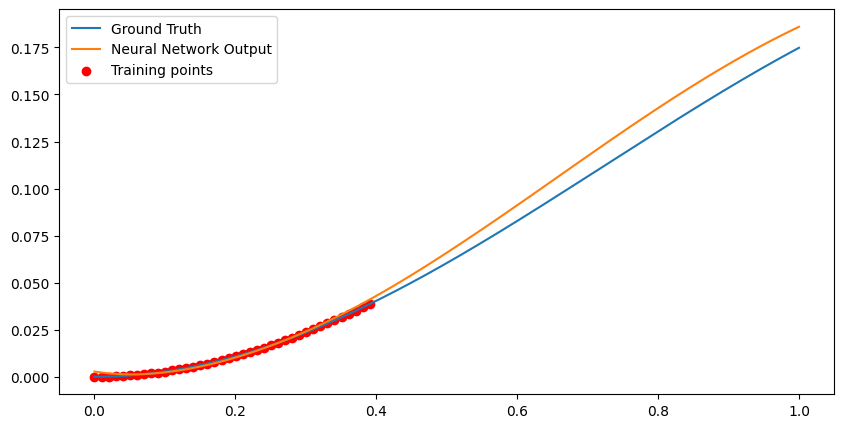

Loss at Step 910 : 0.0001444272929802537
Epoch 910, Total Data Processed: 4659200


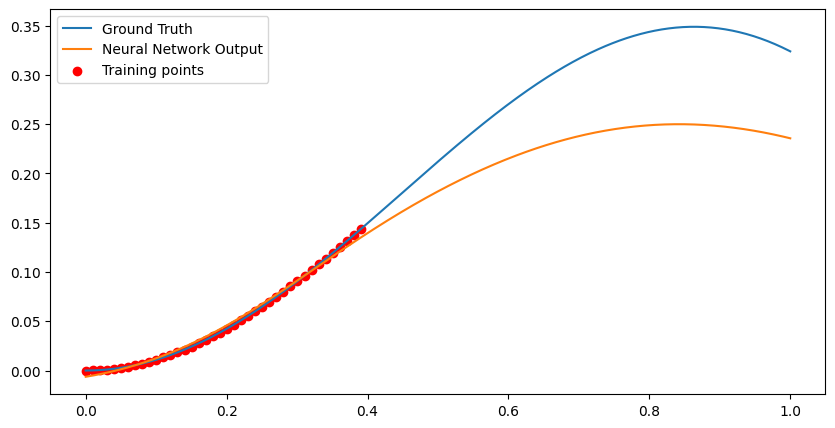

Loss at Step 920 : 0.00020549268811009824
Epoch 920, Total Data Processed: 4710400


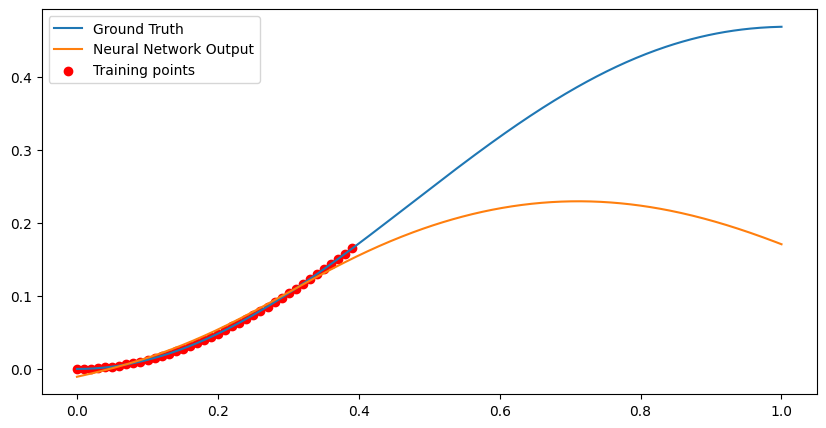

Loss at Step 930 : 0.00015490657824557275
Epoch 930, Total Data Processed: 4761600


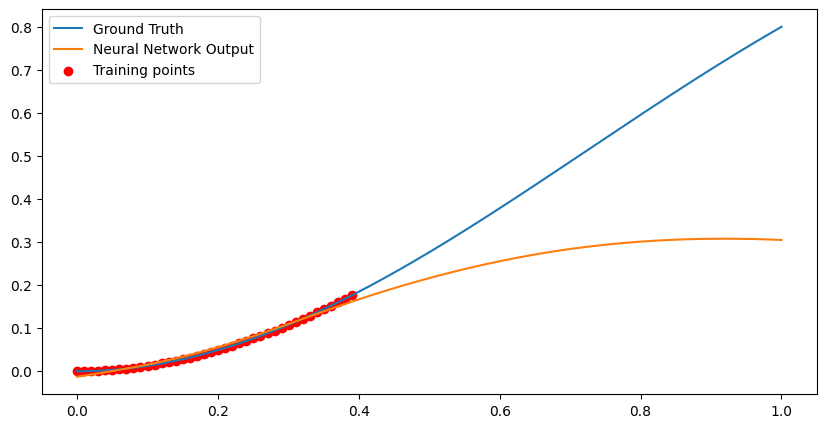

Loss at Step 940 : 0.00013542296073865145
Epoch 940, Total Data Processed: 4812800


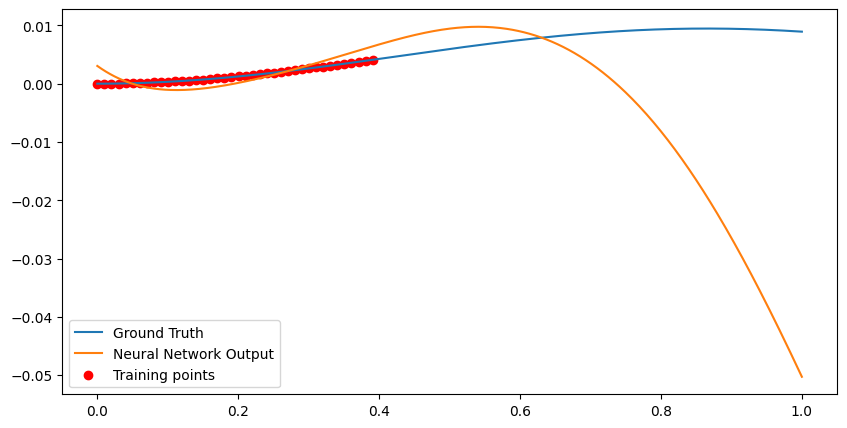

Loss at Step 950 : 8.971717034000903e-05
Epoch 950, Total Data Processed: 4864000


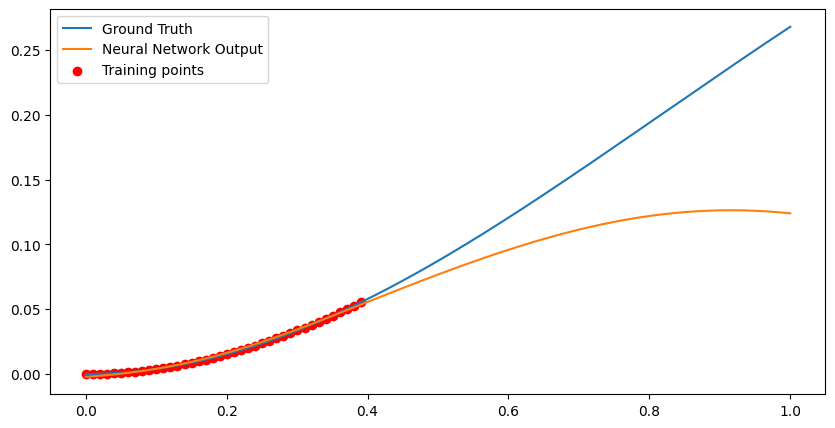

Loss at Step 960 : 0.00012015282845823094
Epoch 960, Total Data Processed: 4915200


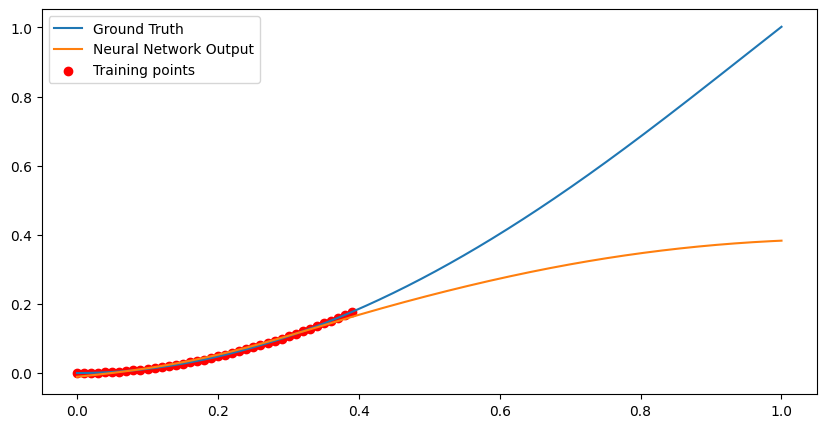

Loss at Step 970 : 7.255066884681582e-05
Epoch 970, Total Data Processed: 4966400


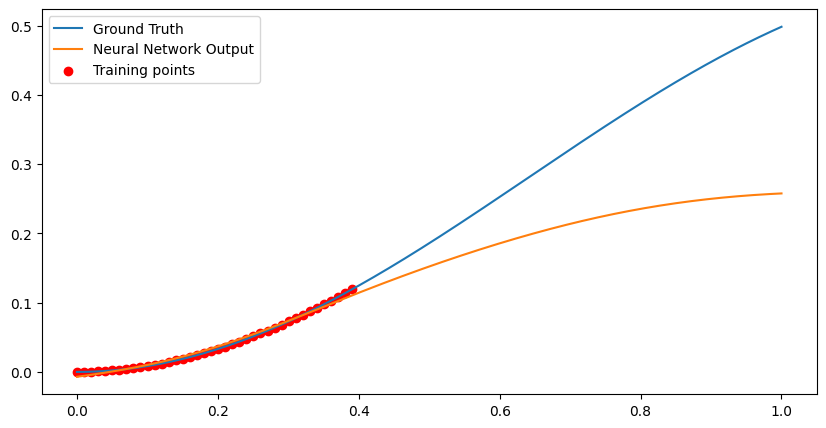

Loss at Step 980 : 0.00022169598378241062
Epoch 980, Total Data Processed: 5017600


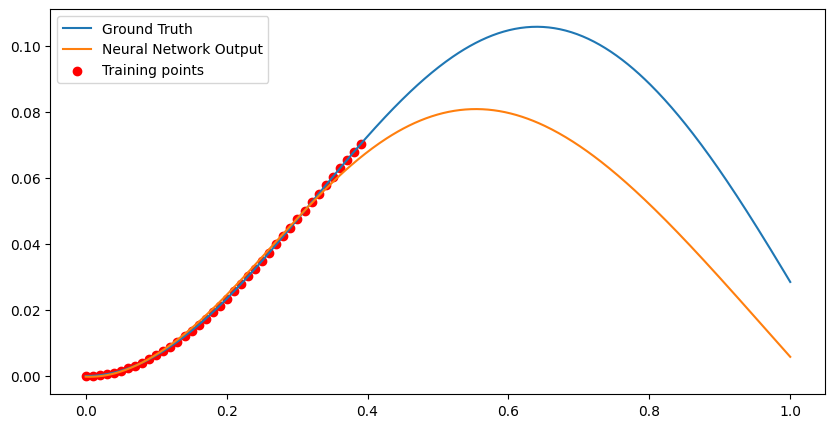

Loss at Step 990 : 0.00010403546912129968
Epoch 990, Total Data Processed: 5068800


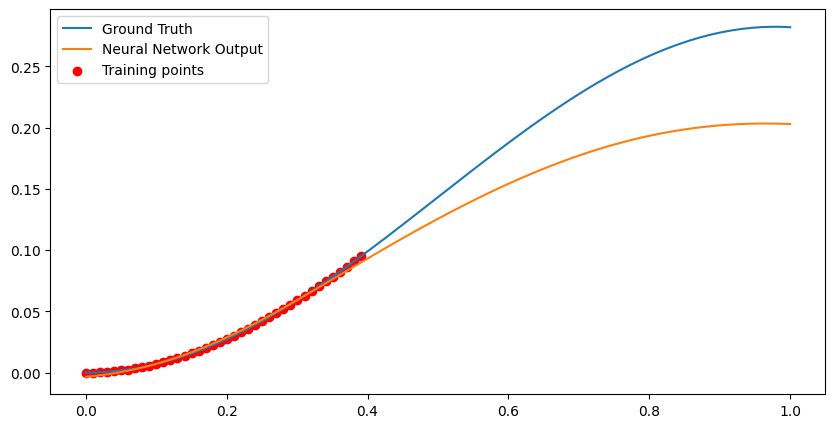

Epoch 1000, Variance: 1.0225752703263424e-05, Loss Change: 8.965078034606222e-06
Loss at Step 1000 : 0.00017369016131851822
Epoch 1000, Total Data Processed: 5120000


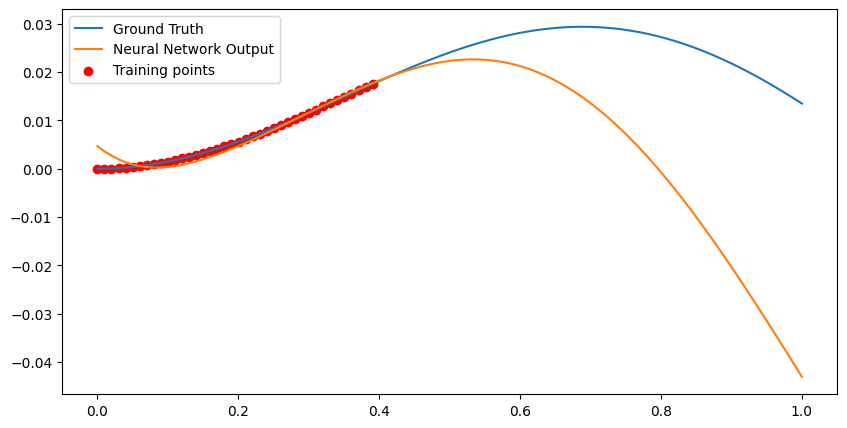

Loss at Step 1010 : 0.00018497108248993754
Epoch 1010, Total Data Processed: 5171200


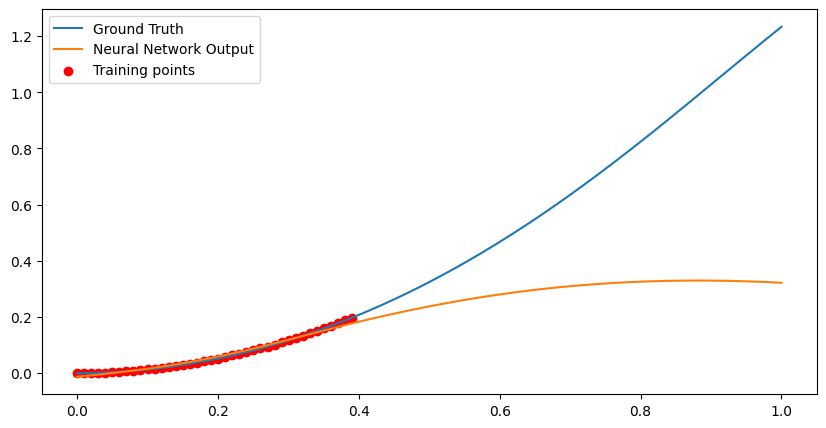

Loss at Step 1020 : 0.0002578513522166759
Epoch 1020, Total Data Processed: 5222400


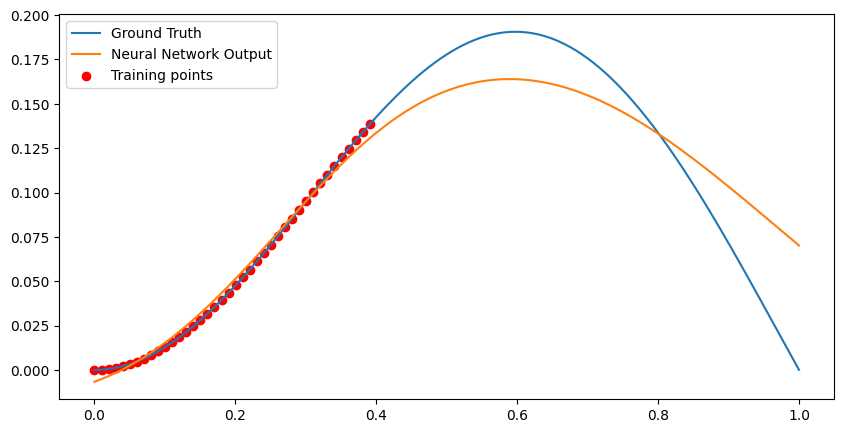

Loss at Step 1030 : 9.339405369246379e-05
Epoch 1030, Total Data Processed: 5273600


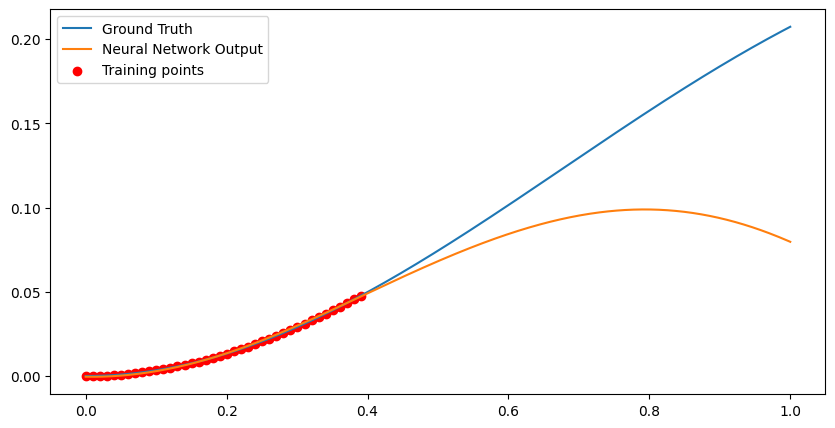

Loss at Step 1040 : 8.086318121058866e-05
Epoch 1040, Total Data Processed: 5324800


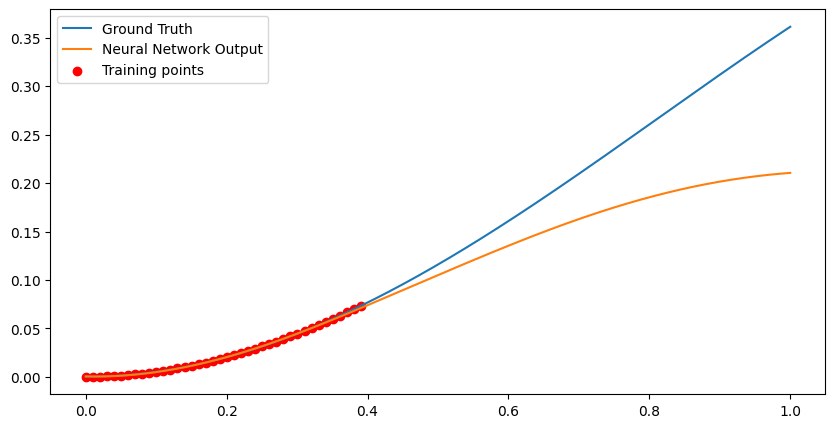

Loss at Step 1050 : 0.00013786957424599677
Epoch 1050, Total Data Processed: 5376000


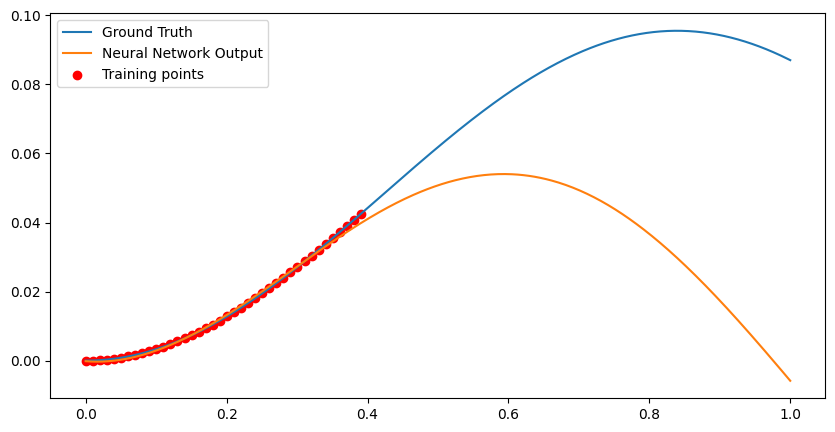

Loss at Step 1060 : 3.599278716137633e-05
Epoch 1060, Total Data Processed: 5427200


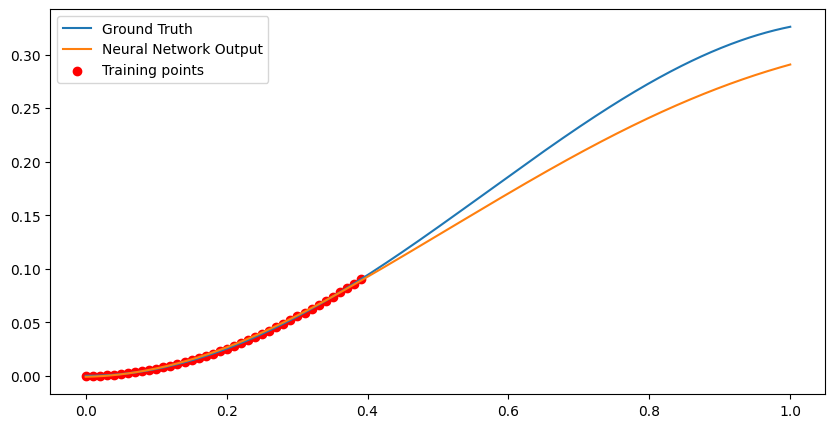

Loss at Step 1070 : 0.00026781109045259655
Epoch 1070, Total Data Processed: 5478400


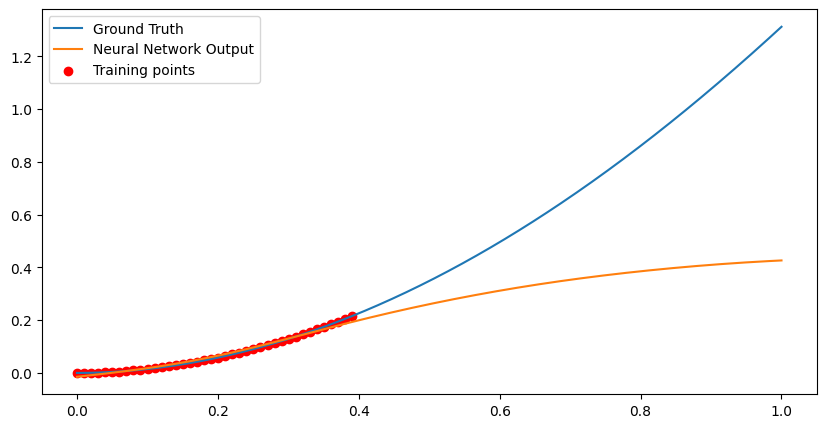

Loss at Step 1080 : 9.655606118030846e-05
Epoch 1080, Total Data Processed: 5529600


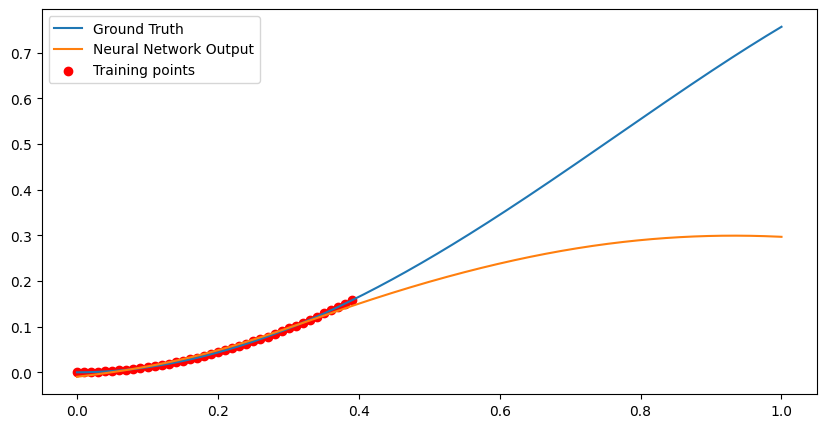

Loss at Step 1090 : 1.9126433471683413e-05
Epoch 1090, Total Data Processed: 5580800


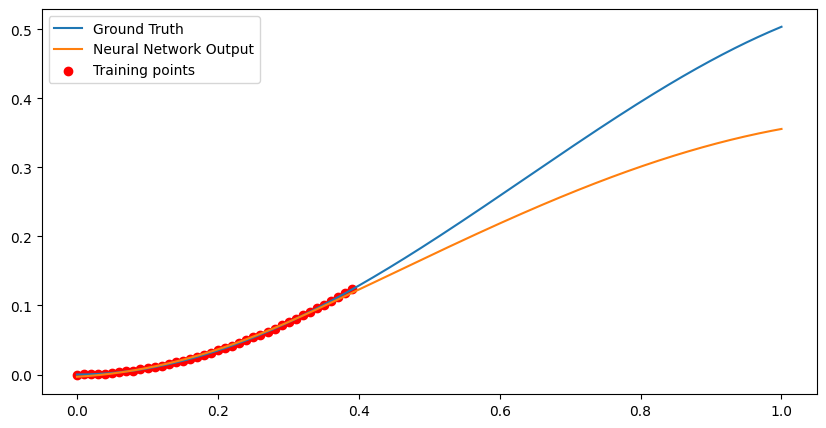

Epoch 1100, Variance: 1.2923274880449753e-05, Loss Change: 7.711609944394127e-06
Loss at Step 1100 : 0.00026082684053108096
Epoch 1100, Total Data Processed: 5632000


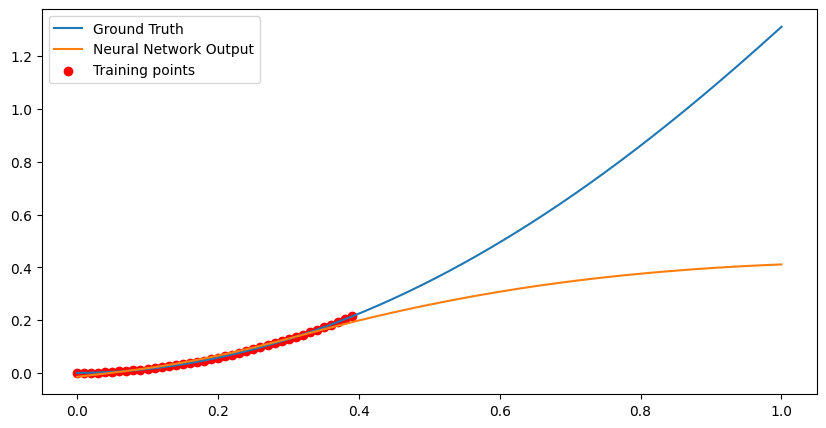

Loss at Step 1110 : 2.9498971343855374e-05
Epoch 1110, Total Data Processed: 5683200


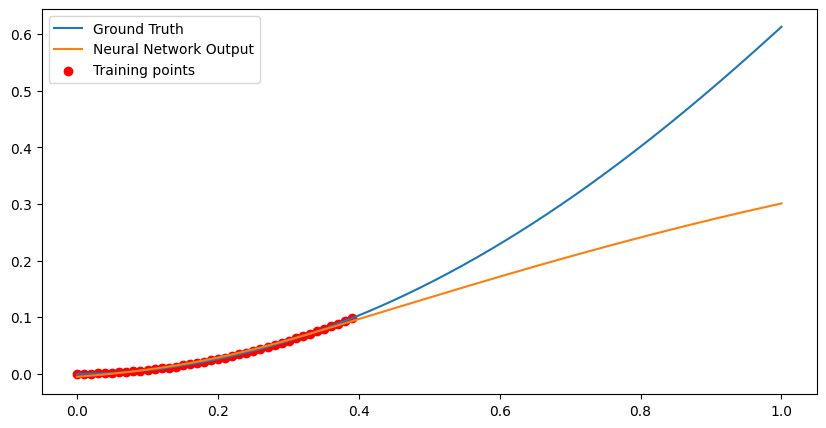

Loss at Step 1120 : 0.00013937453331891447
Epoch 1120, Total Data Processed: 5734400


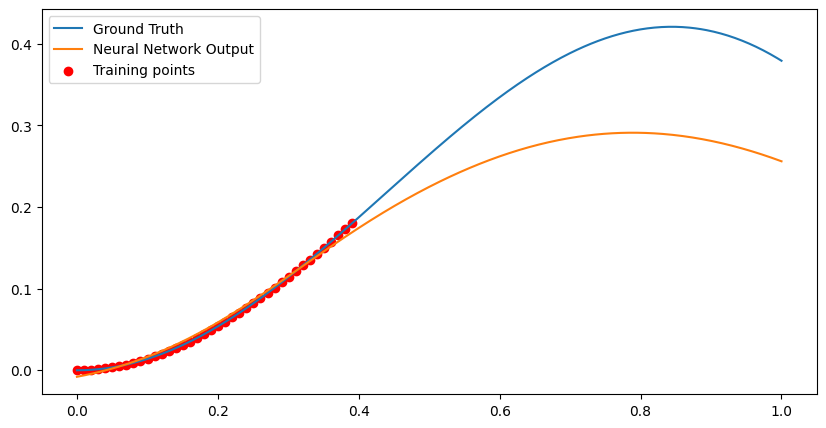

Loss at Step 1130 : 5.659921225742437e-05
Epoch 1130, Total Data Processed: 5785600


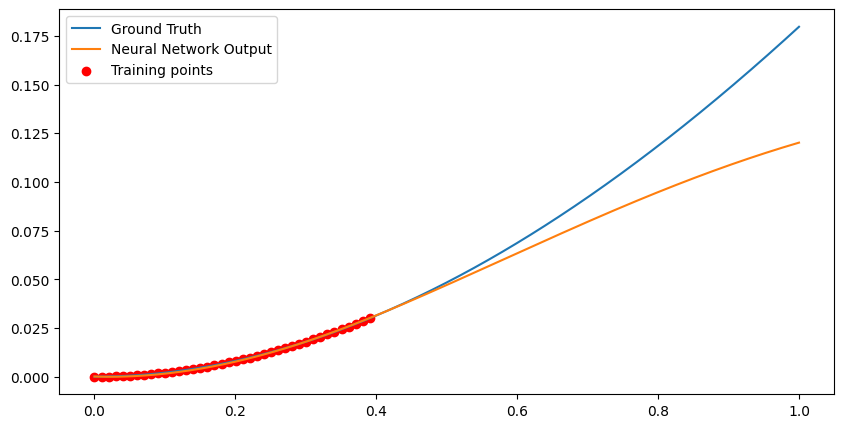

Loss at Step 1140 : 0.0001165065259556286
Epoch 1140, Total Data Processed: 5836800


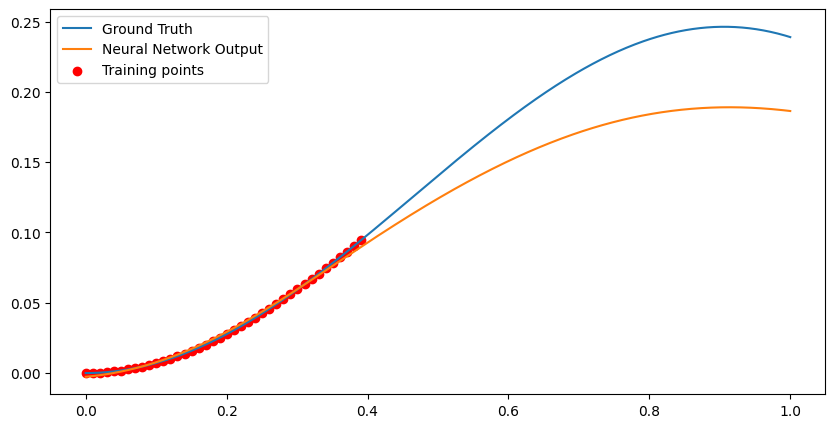

Loss at Step 1150 : 0.00018213516159448773
Epoch 1150, Total Data Processed: 5888000


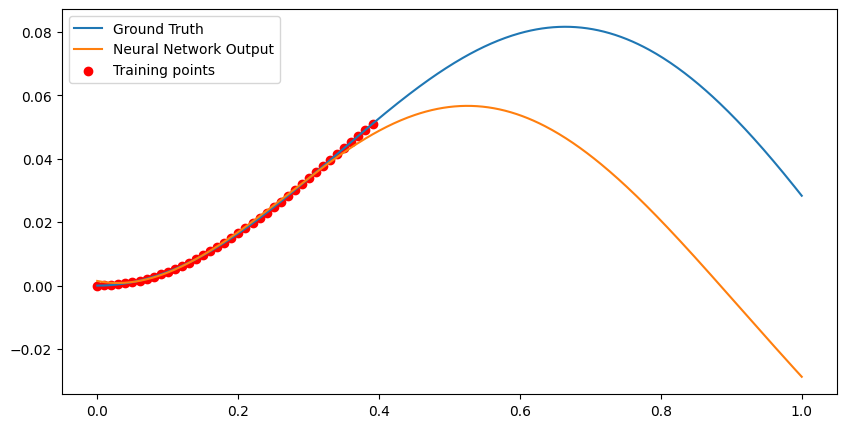

Loss at Step 1160 : 2.6468211217434146e-05
Epoch 1160, Total Data Processed: 5939200


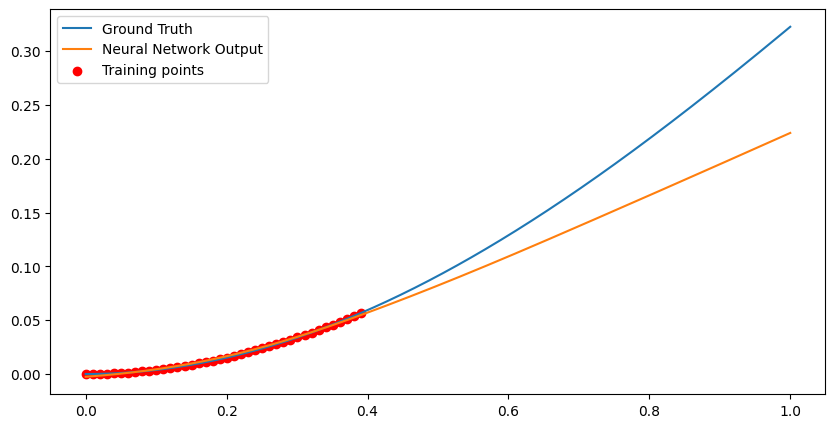

Loss at Step 1170 : 0.00020473389304243028
Epoch 1170, Total Data Processed: 5990400


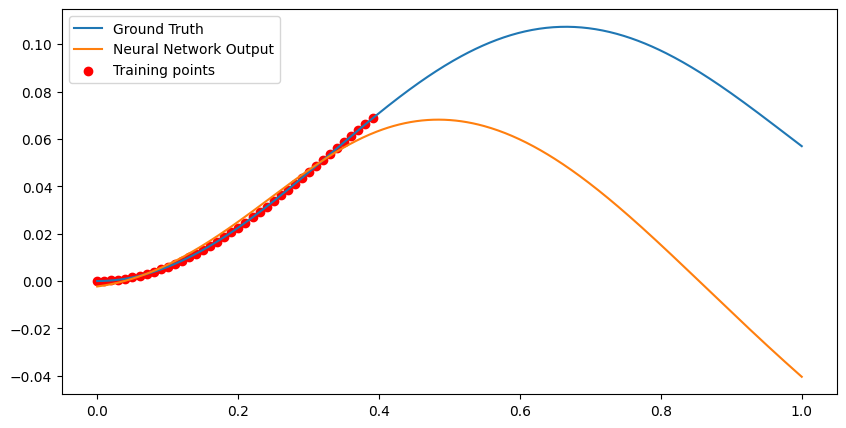

Loss at Step 1180 : 5.314094960340299e-05
Epoch 1180, Total Data Processed: 6041600


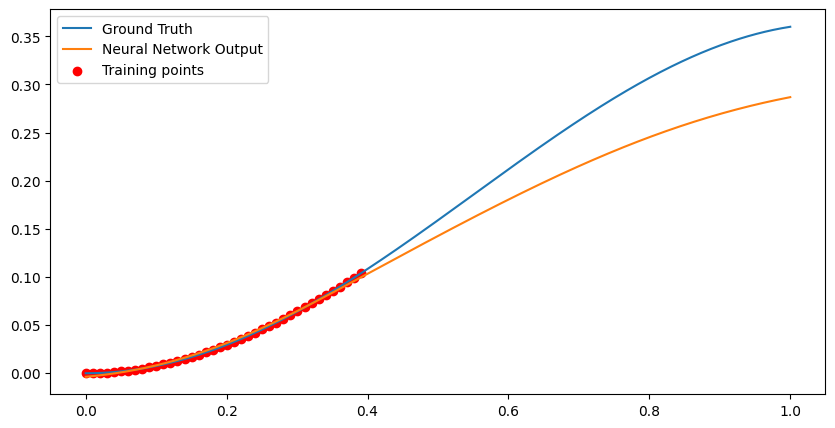

Loss at Step 1190 : 0.0002057614183286205
Epoch 1190, Total Data Processed: 6092800


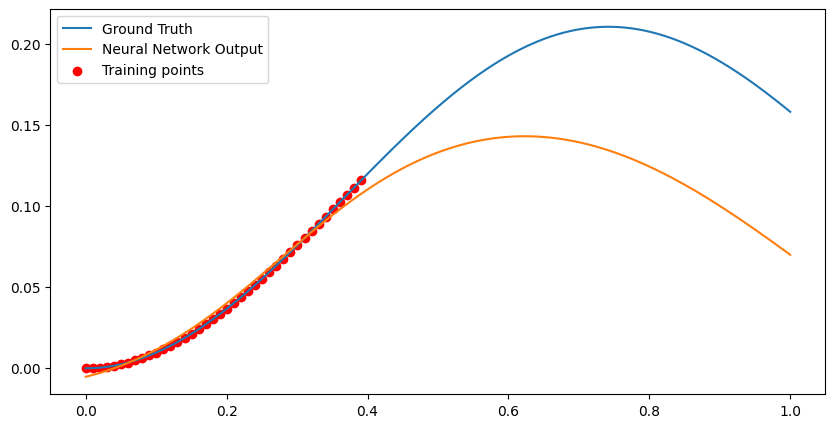

Epoch 1200, Variance: 1.106470972445095e-05, Loss Change: 1.4334117537373459e-06
Loss at Step 1200 : 3.0902472644811496e-05
Epoch 1200, Total Data Processed: 6144000


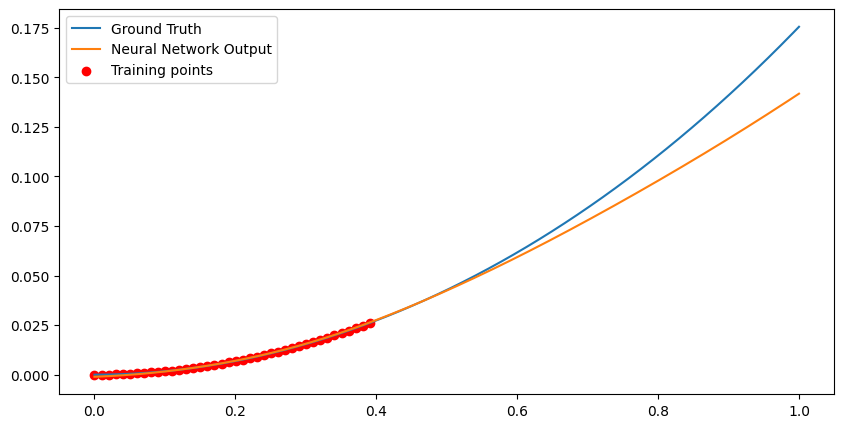

Loss at Step 1210 : 1.9828952645184472e-05
Epoch 1210, Total Data Processed: 6195200


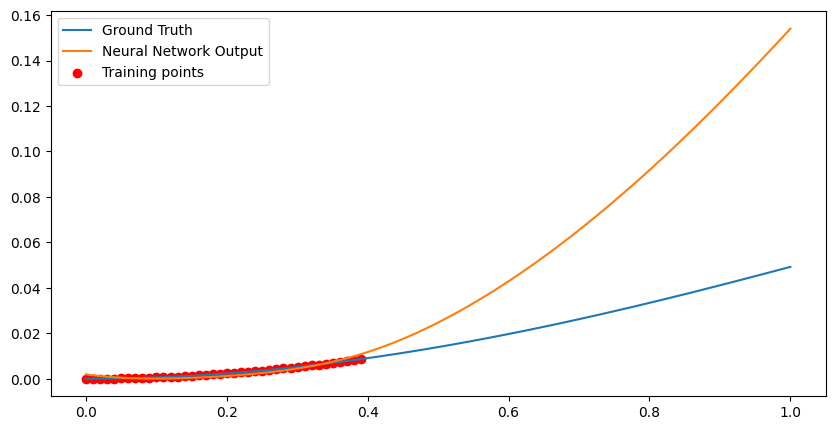

Loss at Step 1220 : 0.00010325264156563208
Epoch 1220, Total Data Processed: 6246400


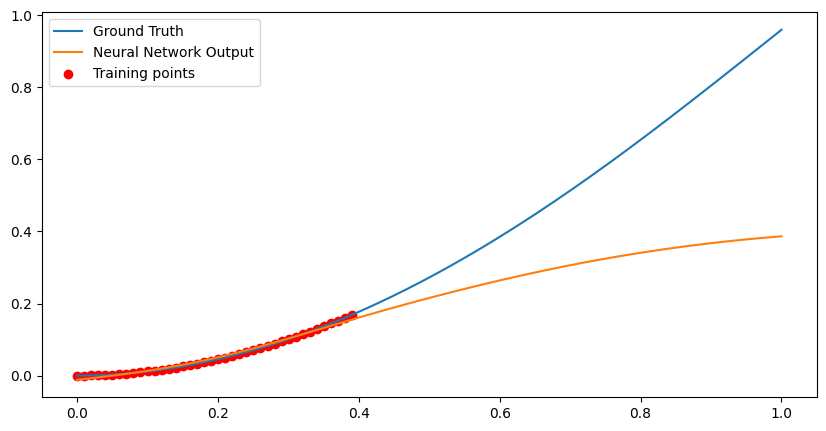

Loss at Step 1230 : 4.3080399336759e-05
Epoch 1230, Total Data Processed: 6297600


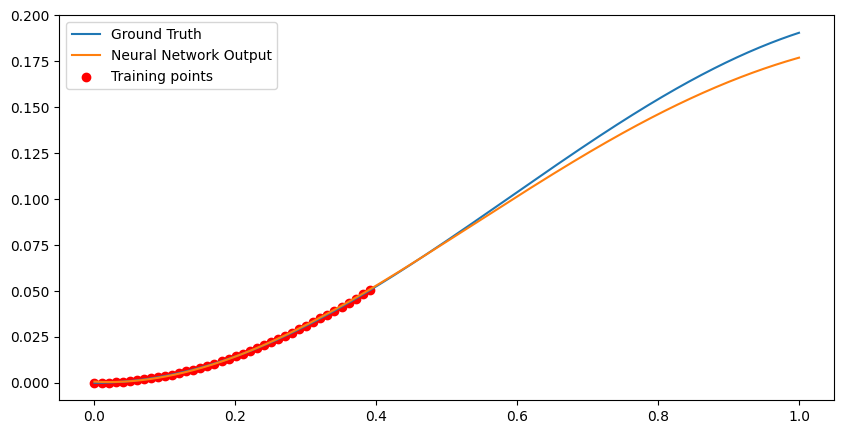

Loss at Step 1240 : 0.0002022005501203239
Epoch 1240, Total Data Processed: 6348800


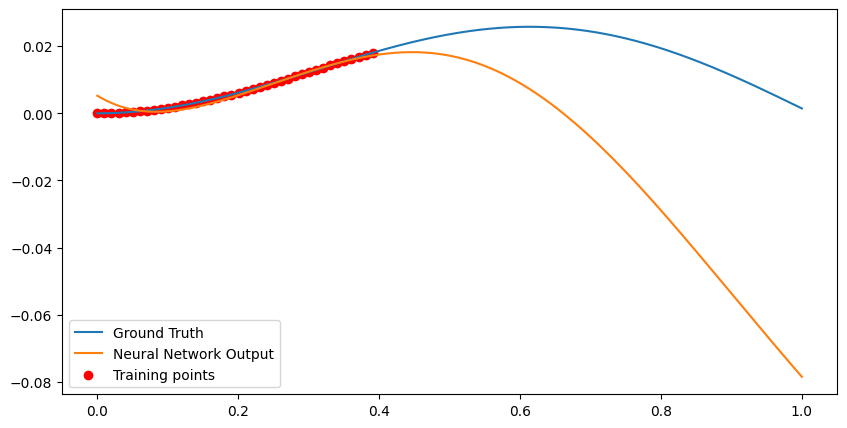

Loss at Step 1250 : 0.0002376046177232638
Epoch 1250, Total Data Processed: 6400000


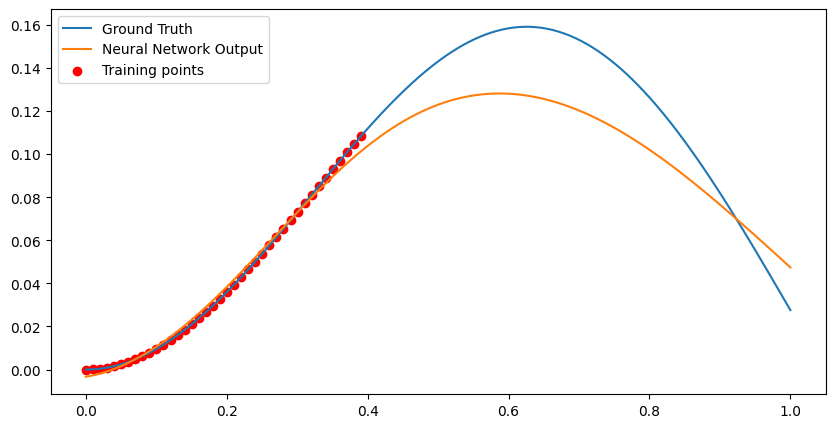

Loss at Step 1260 : 0.00017079015378840268
Epoch 1260, Total Data Processed: 6451200


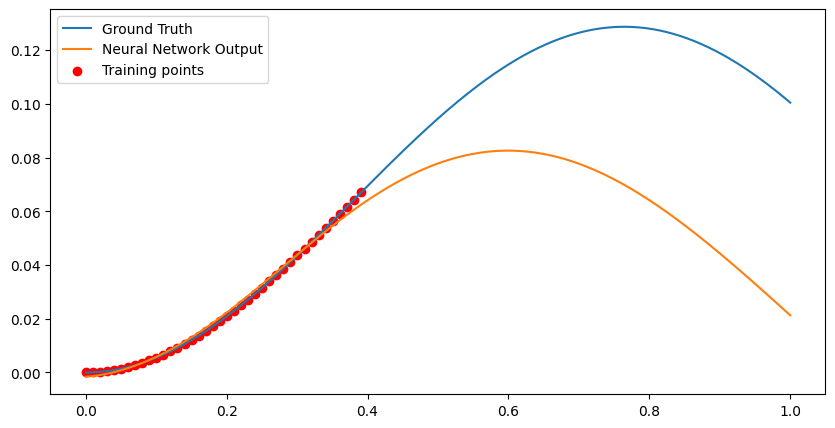

Loss at Step 1270 : 0.00021086215565446764
Epoch 1270, Total Data Processed: 6502400


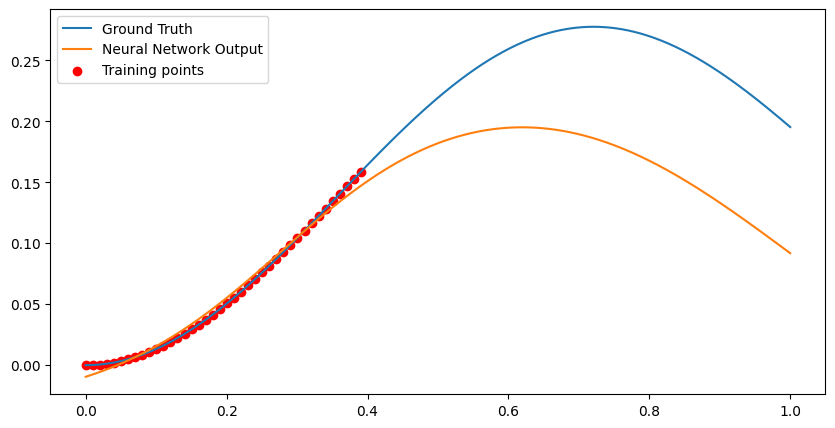

Loss at Step 1280 : 8.854625775711611e-05
Epoch 1280, Total Data Processed: 6553600


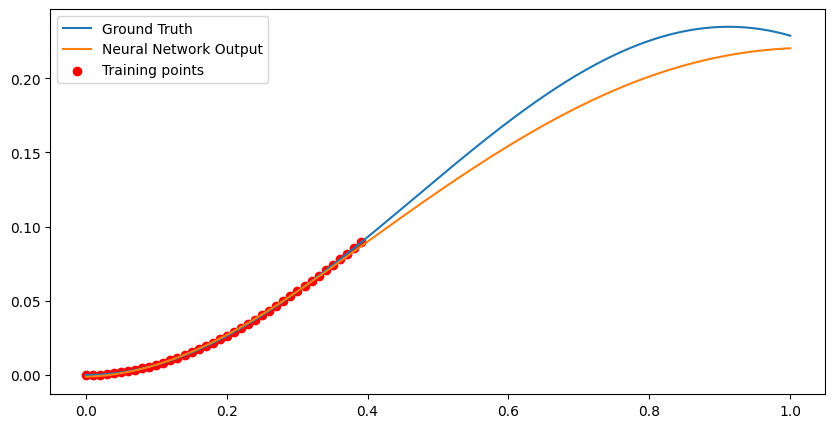

Loss at Step 1290 : 0.00016978612984530628
Epoch 1290, Total Data Processed: 6604800


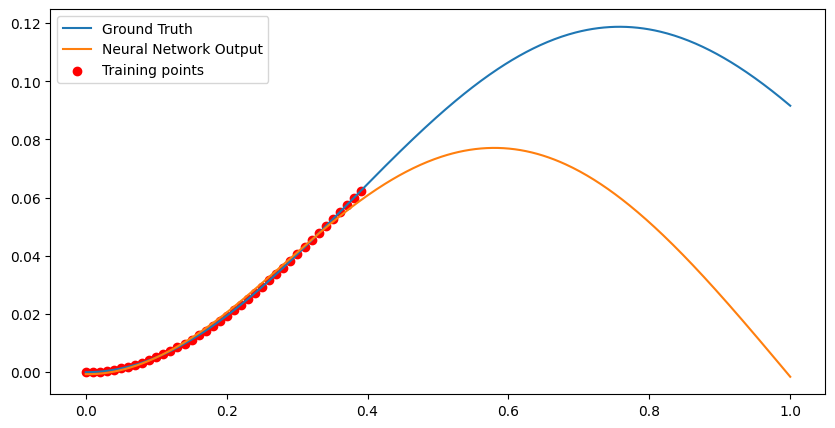

Epoch 1300, Variance: 1.158483610197436e-05, Loss Change: 7.247873924143278e-06
Loss at Step 1300 : 0.0002802143571898341
Epoch 1300, Total Data Processed: 6656000


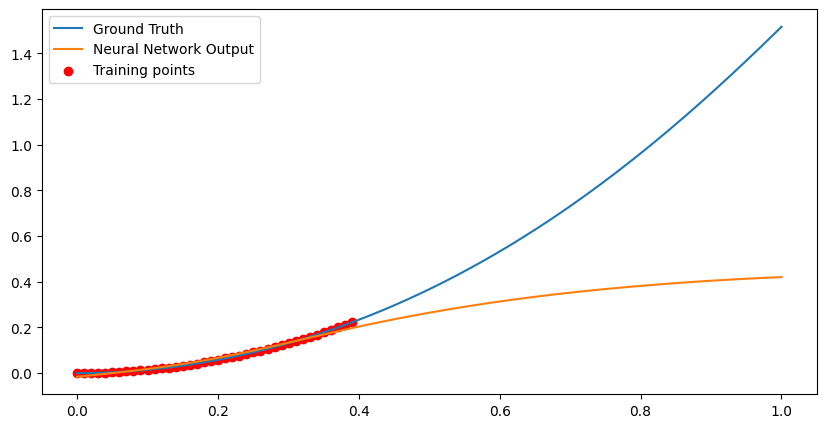

Loss at Step 1310 : 0.00011864376574521884
Epoch 1310, Total Data Processed: 6707200


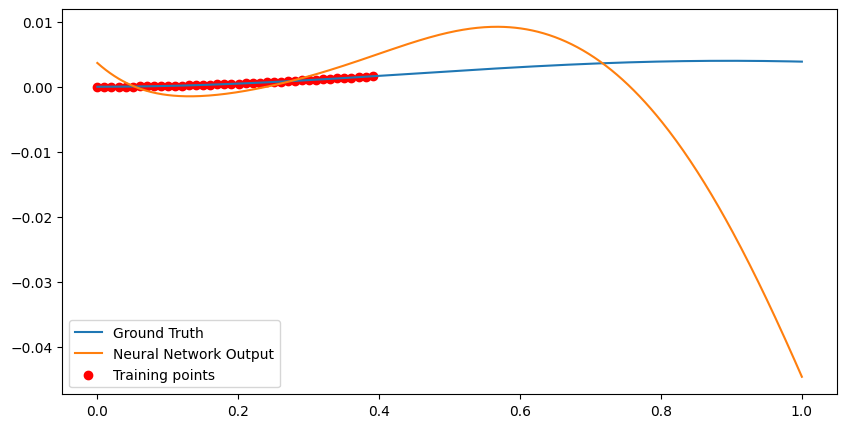

Loss at Step 1320 : 0.00017957520321942866
Epoch 1320, Total Data Processed: 6758400


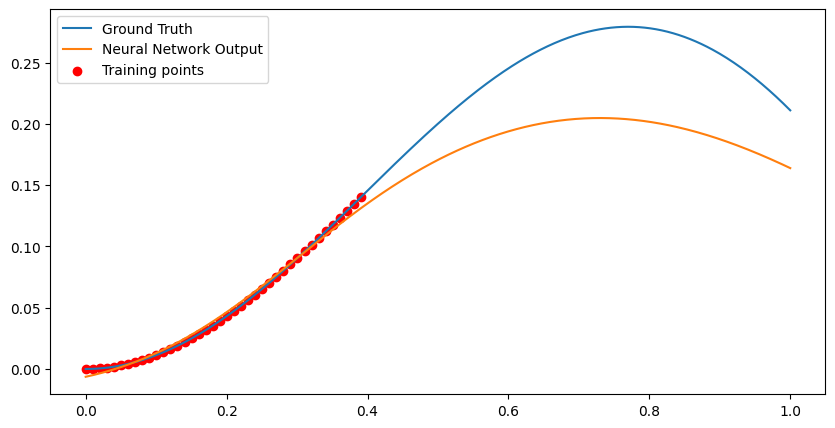

Loss at Step 1330 : 8.993529627332464e-05
Epoch 1330, Total Data Processed: 6809600


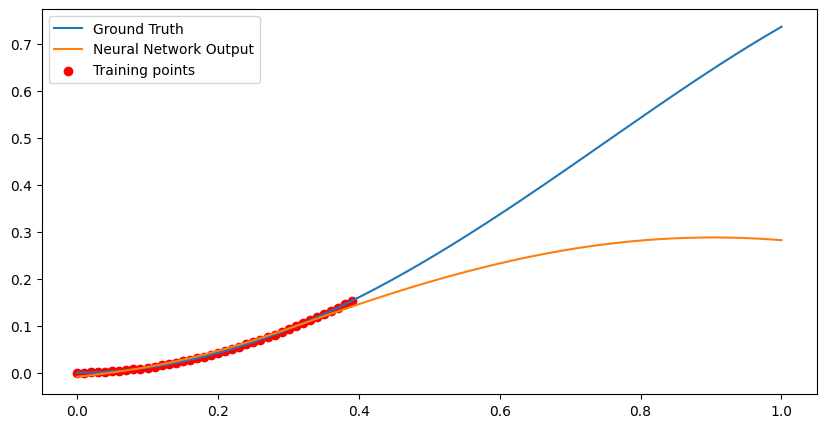

Loss at Step 1340 : 6.801464769523591e-05
Epoch 1340, Total Data Processed: 6860800


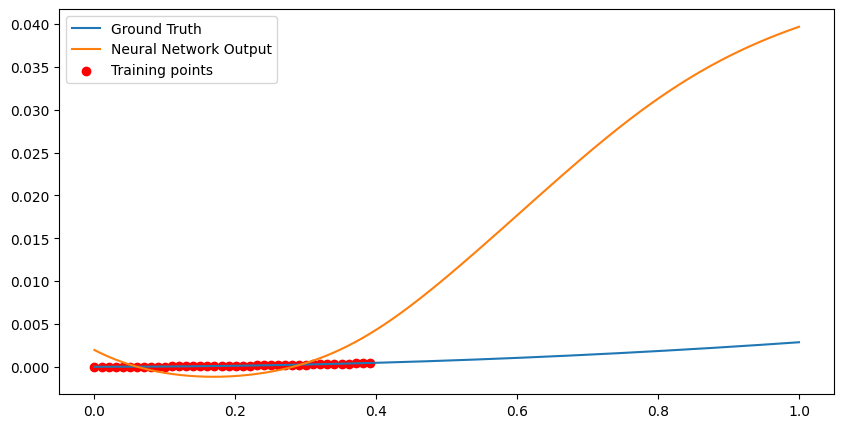

Loss at Step 1350 : 9.331569162895903e-05
Epoch 1350, Total Data Processed: 6912000


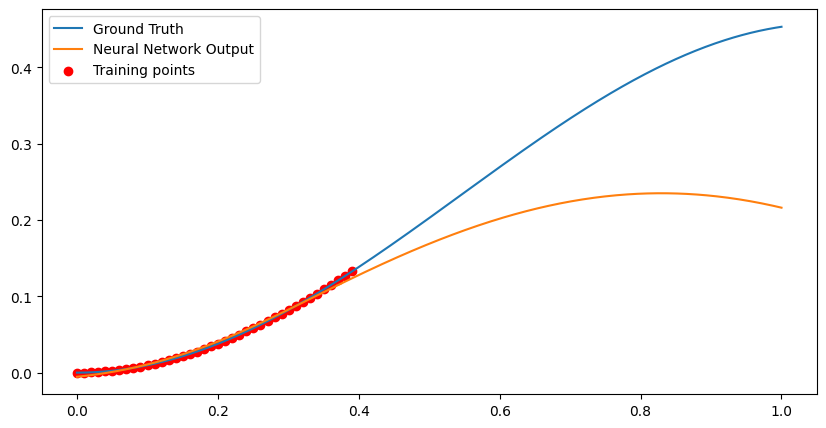

Loss at Step 1360 : 0.00012349270400591195
Epoch 1360, Total Data Processed: 6963200


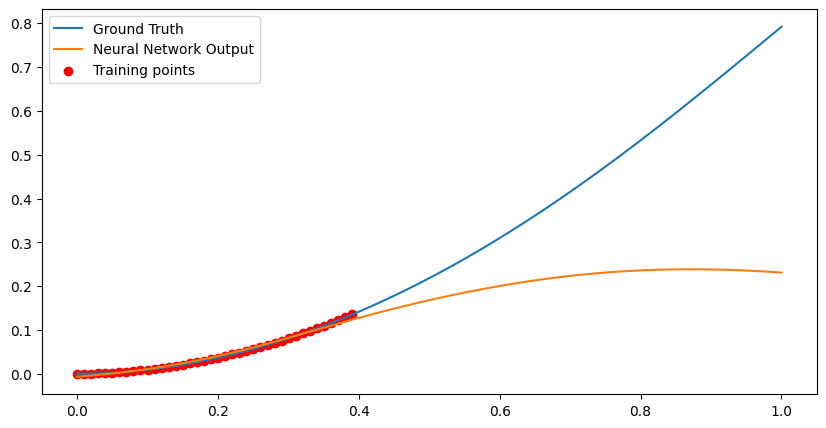

Loss at Step 1370 : 0.00017837576160673052
Epoch 1370, Total Data Processed: 7014400


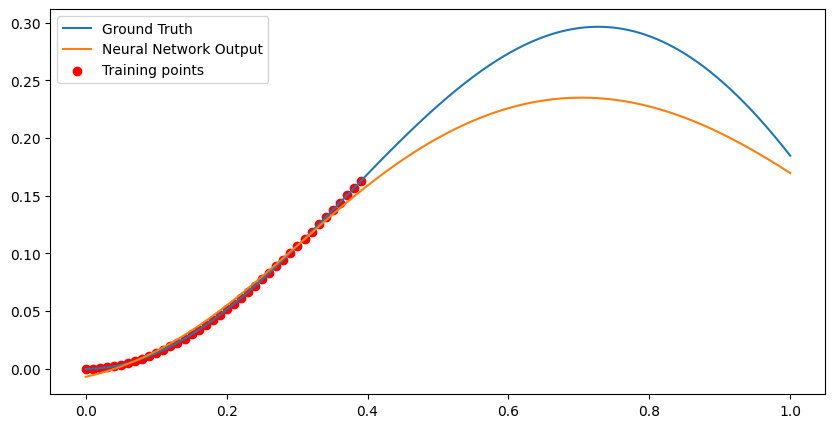

Loss at Step 1380 : 2.4237051547970623e-05
Epoch 1380, Total Data Processed: 7065600


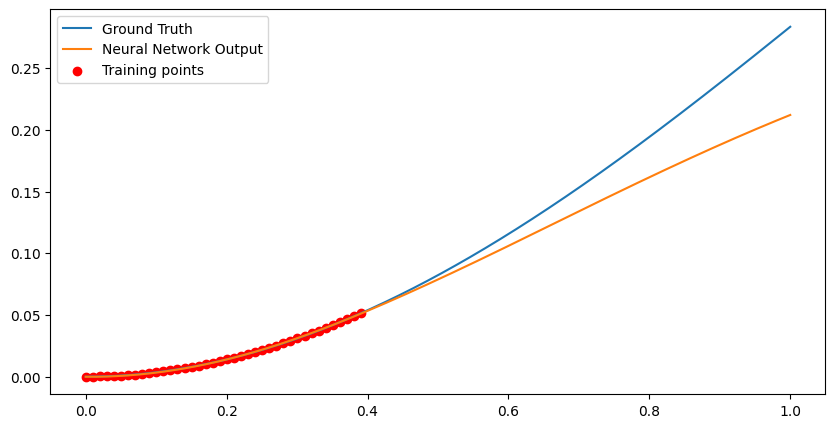

Loss at Step 1390 : 0.00020819719065912068
Epoch 1390, Total Data Processed: 7116800


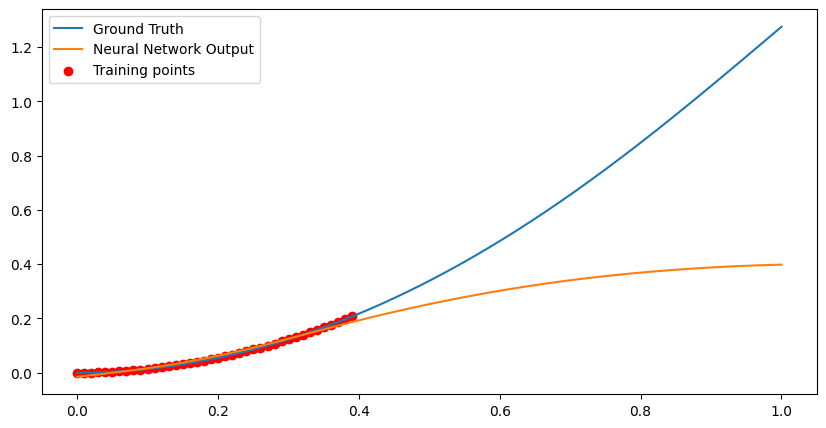

Epoch 1400, Variance: 1.3869840586266946e-05, Loss Change: 1.957404552044295e-05
Loss at Step 1400 : 5.3863786888541654e-05
Epoch 1400, Total Data Processed: 7168000


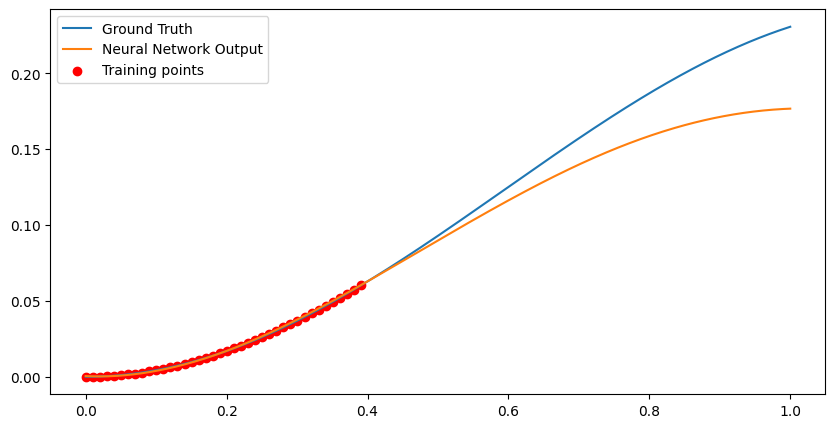

Loss at Step 1410 : 0.00017928724992088974
Epoch 1410, Total Data Processed: 7219200


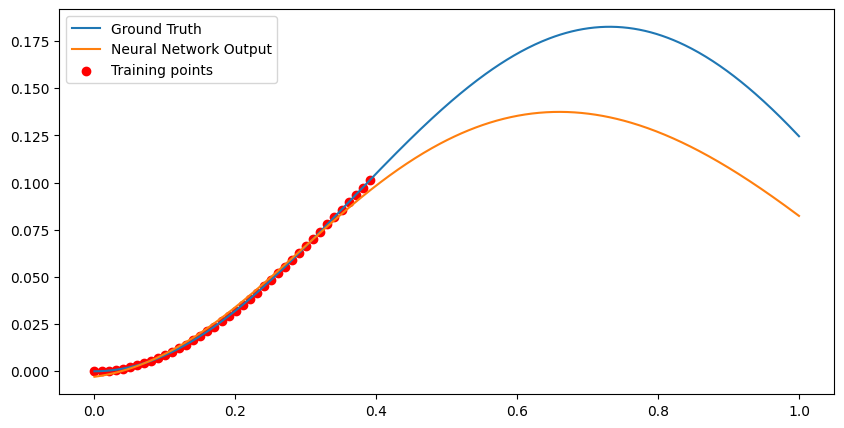

Loss at Step 1420 : 0.000182456336915493
Epoch 1420, Total Data Processed: 7270400


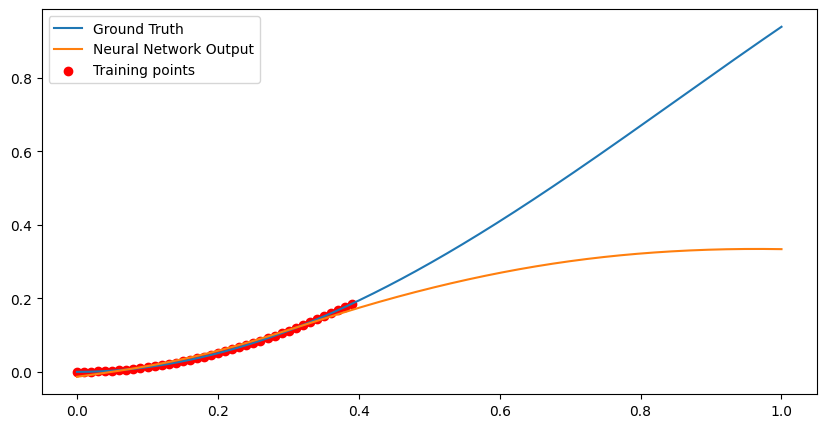

Loss at Step 1430 : 2.1782492694910616e-05
Epoch 1430, Total Data Processed: 7321600


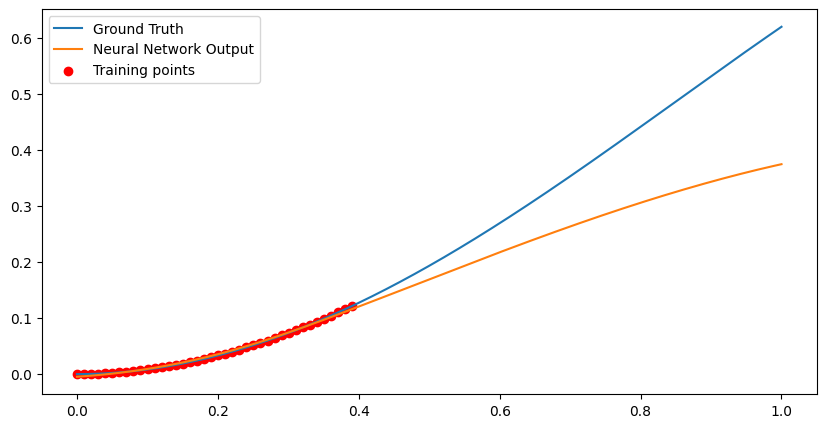

Loss at Step 1440 : 0.00016383059846702963
Epoch 1440, Total Data Processed: 7372800


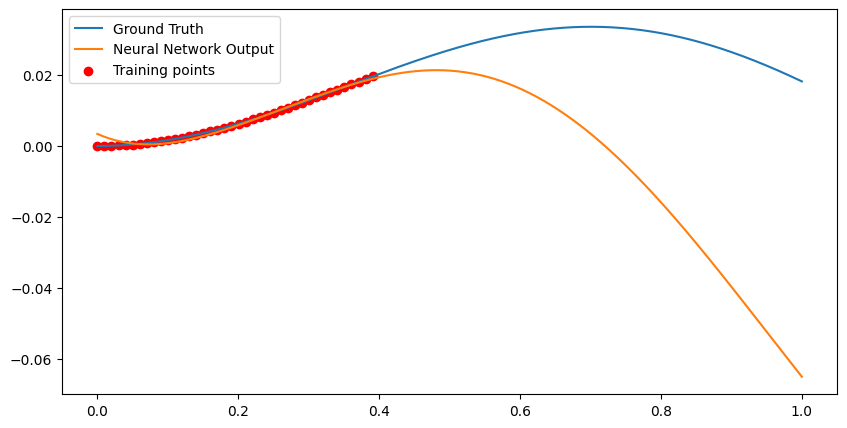

Loss at Step 1450 : 8.56053302413784e-05
Epoch 1450, Total Data Processed: 7424000


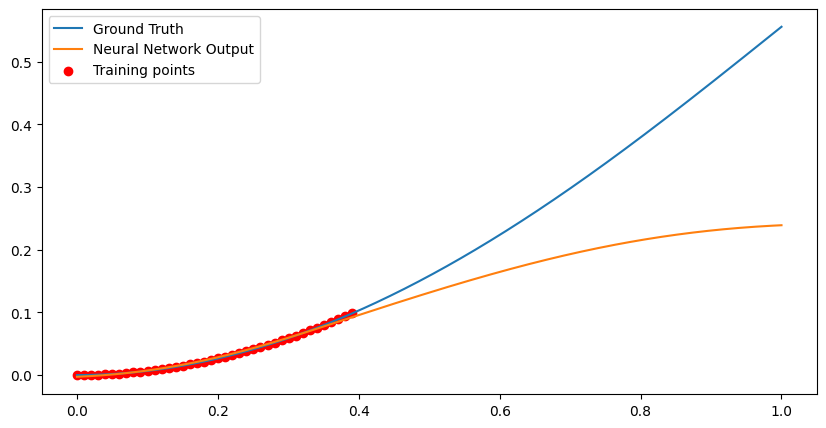

Loss at Step 1460 : 0.00024880209821276367
Epoch 1460, Total Data Processed: 7475200


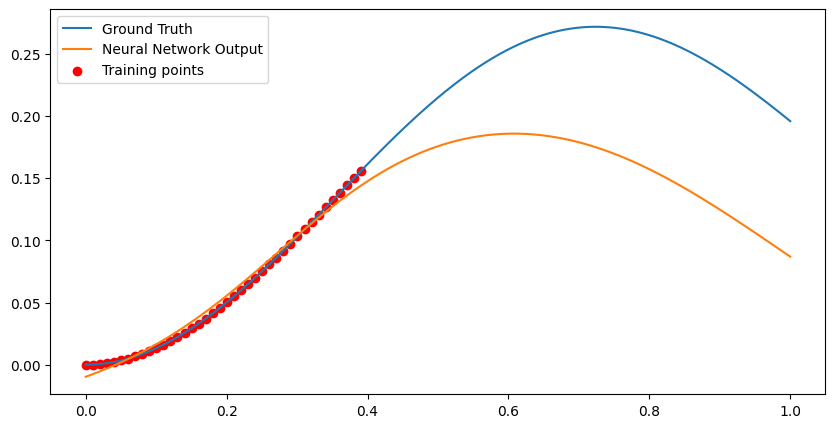

Loss at Step 1470 : 5.3127067076275125e-05
Epoch 1470, Total Data Processed: 7526400


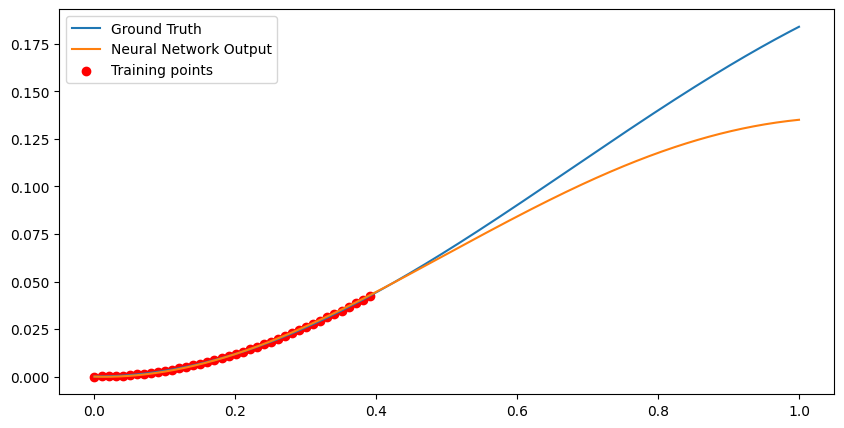

Loss at Step 1480 : 0.0001537030766485259
Epoch 1480, Total Data Processed: 7577600


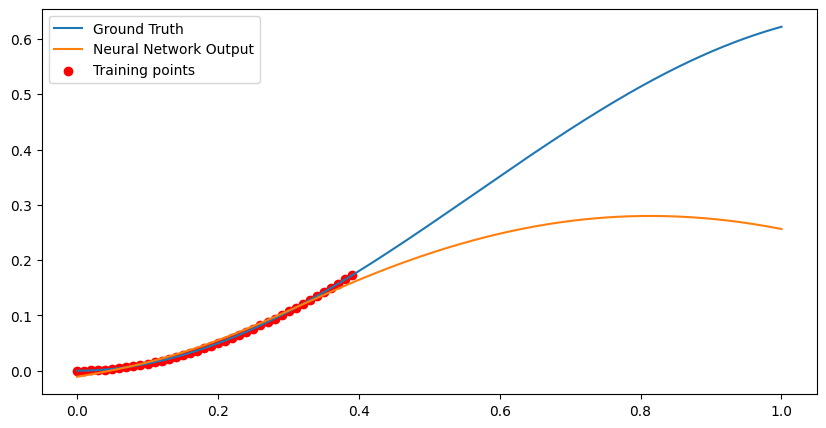

Loss at Step 1490 : 0.00012103796325391158
Epoch 1490, Total Data Processed: 7628800


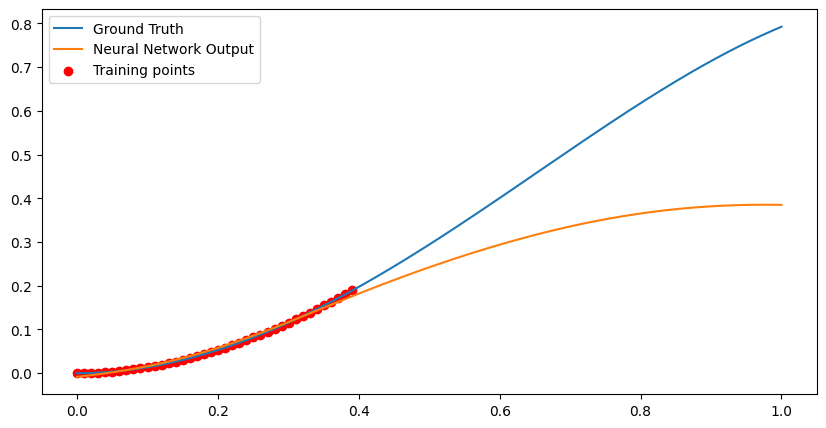

Epoch 1500, Variance: 9.331594810646493e-06, Loss Change: 1.10066062433134e-05
Loss at Step 1500 : 0.0001272780791623518
Epoch 1500, Total Data Processed: 7680000


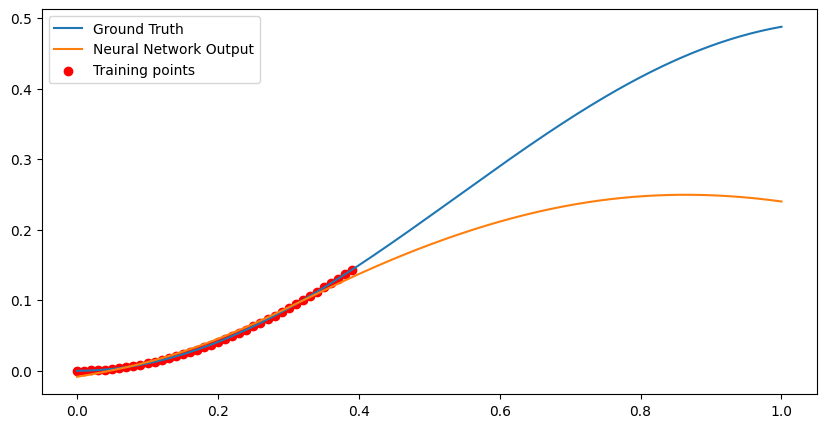

Loss at Step 1510 : 0.0002611843519844115
Epoch 1510, Total Data Processed: 7731200


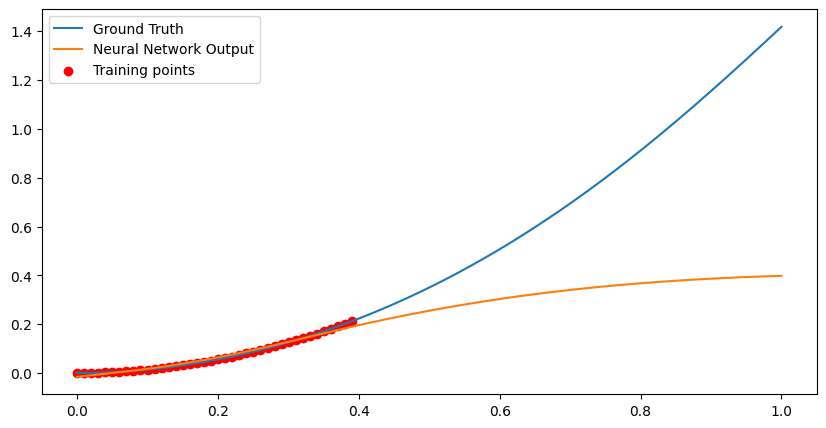

Loss at Step 1520 : 7.503046072088182e-05
Epoch 1520, Total Data Processed: 7782400


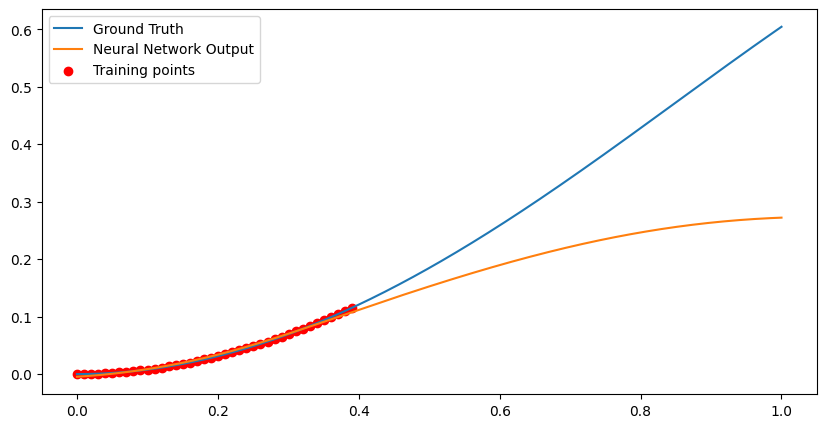

Loss at Step 1530 : 0.0001608724269317463
Epoch 1530, Total Data Processed: 7833600


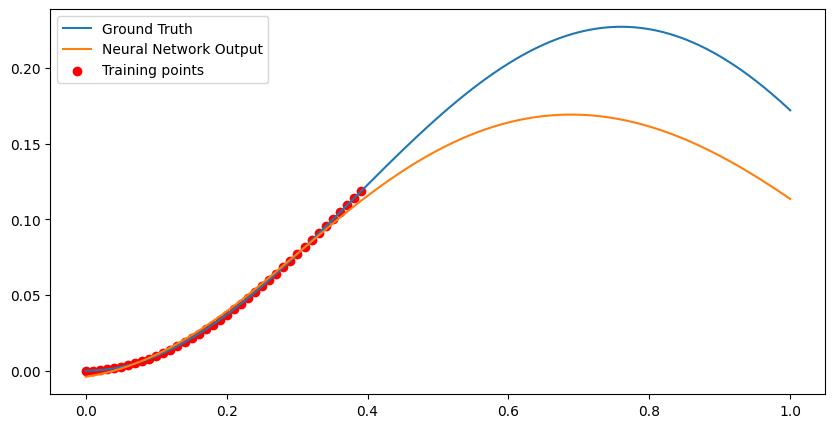

Loss at Step 1540 : 3.108637611148879e-05
Epoch 1540, Total Data Processed: 7884800


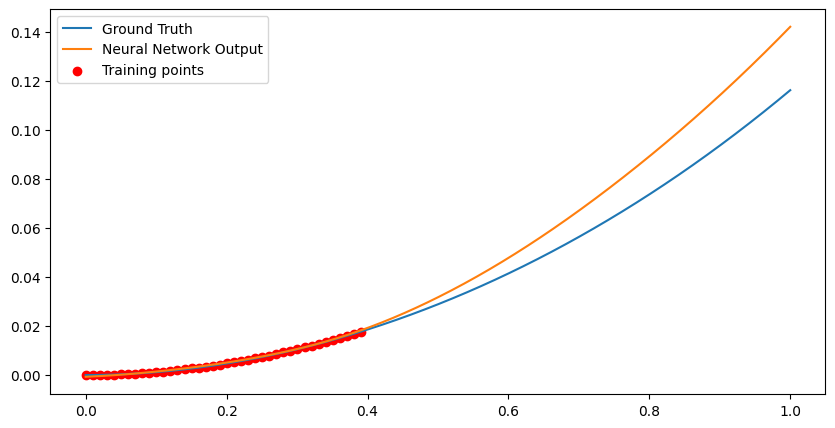

Loss at Step 1550 : 0.00015992397675290704
Epoch 1550, Total Data Processed: 7936000


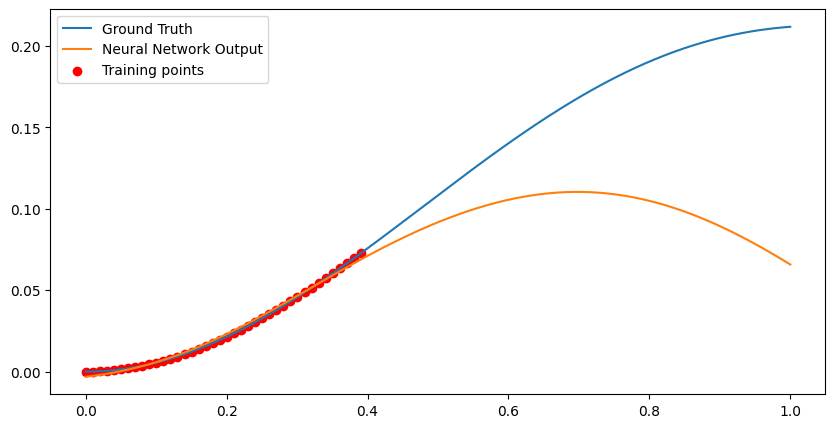

Loss at Step 1560 : 2.587708513601683e-05
Epoch 1560, Total Data Processed: 7987200


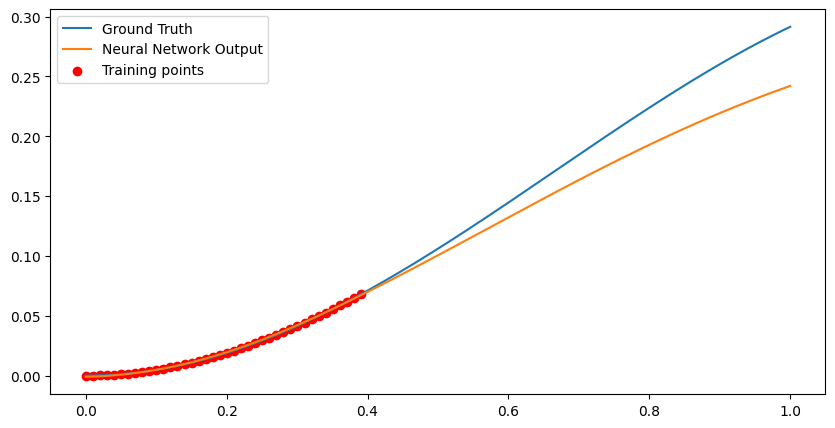

Loss at Step 1570 : 2.6869878638535738e-05
Epoch 1570, Total Data Processed: 8038400


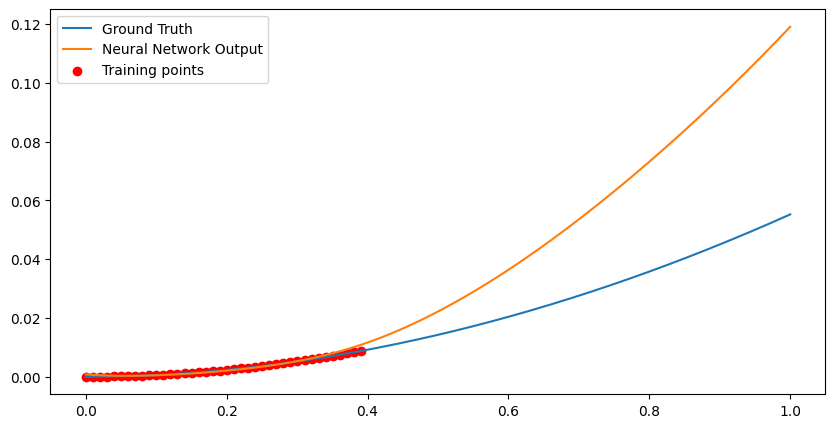

Loss at Step 1580 : 7.217179518193007e-05
Epoch 1580, Total Data Processed: 8089600


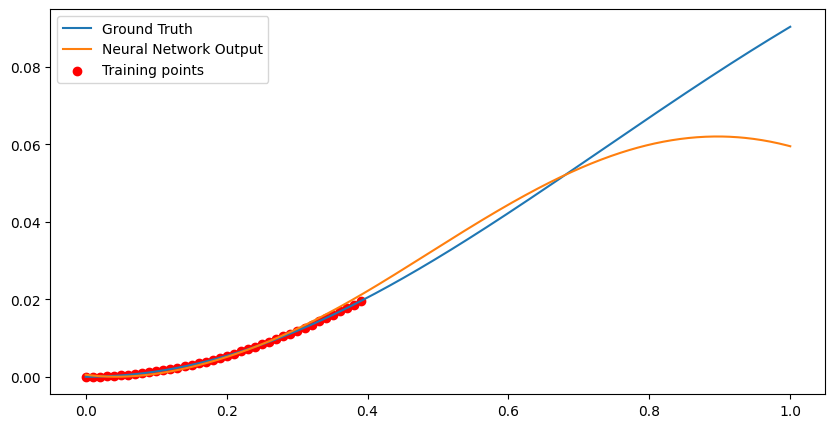

Loss at Step 1590 : 0.00016956578474491835
Epoch 1590, Total Data Processed: 8140800


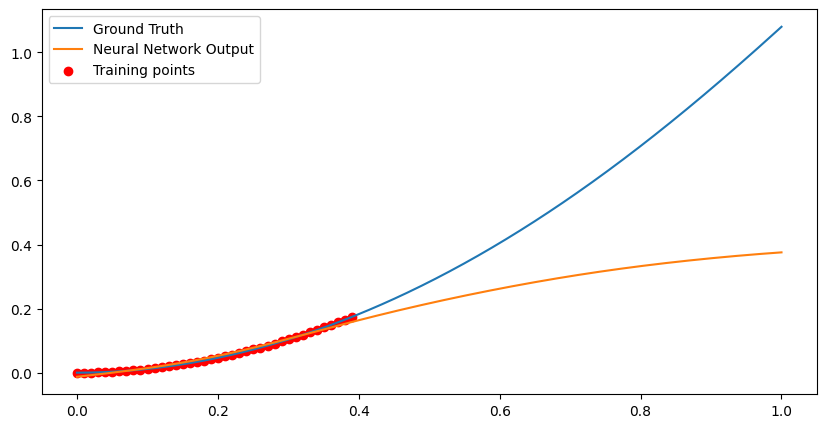

Epoch 1600, Variance: 1.173078635474667e-05, Loss Change: 4.214699844240499e-06
Loss at Step 1600 : 6.689933798043057e-05
Epoch 1600, Total Data Processed: 8192000


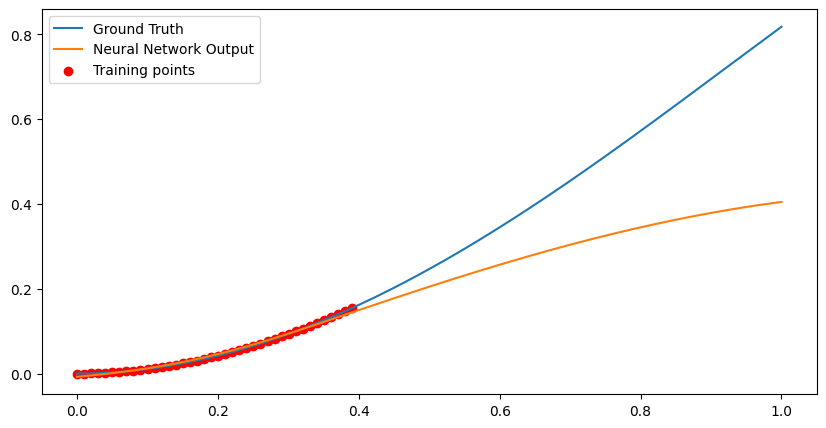

Loss at Step 1610 : 0.00010742169251898304
Epoch 1610, Total Data Processed: 8243200


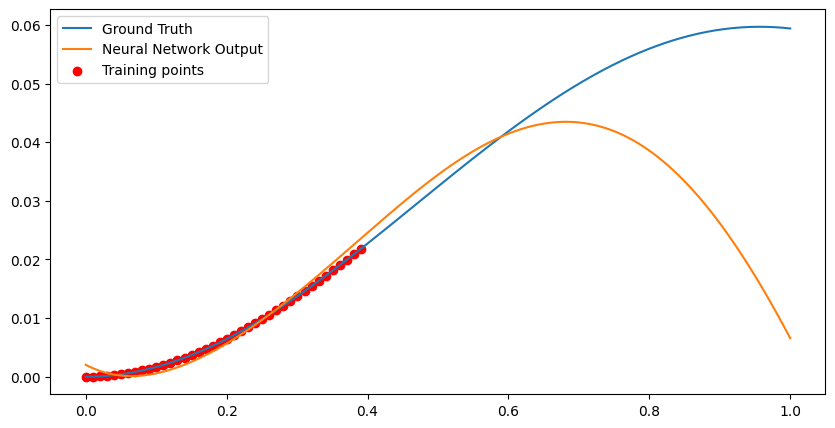

Loss at Step 1620 : 1.6624569980194792e-05
Epoch 1620, Total Data Processed: 8294400


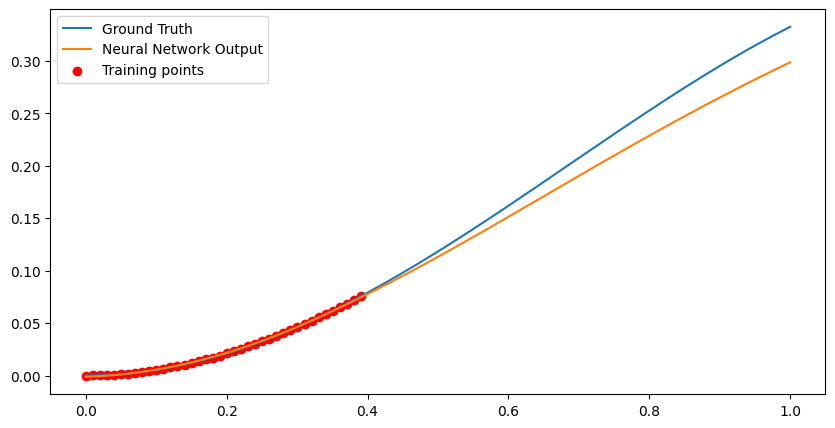

Loss at Step 1630 : 1.4871813618810847e-05
Epoch 1630, Total Data Processed: 8345600


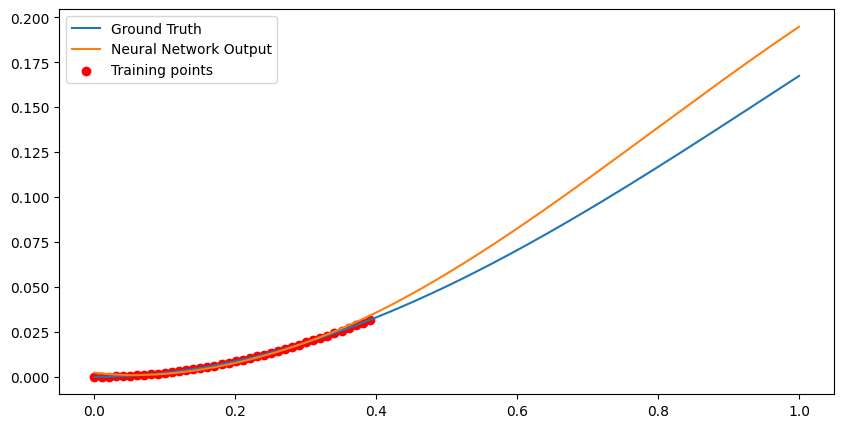

Loss at Step 1640 : 0.00012119674647692591
Epoch 1640, Total Data Processed: 8396800


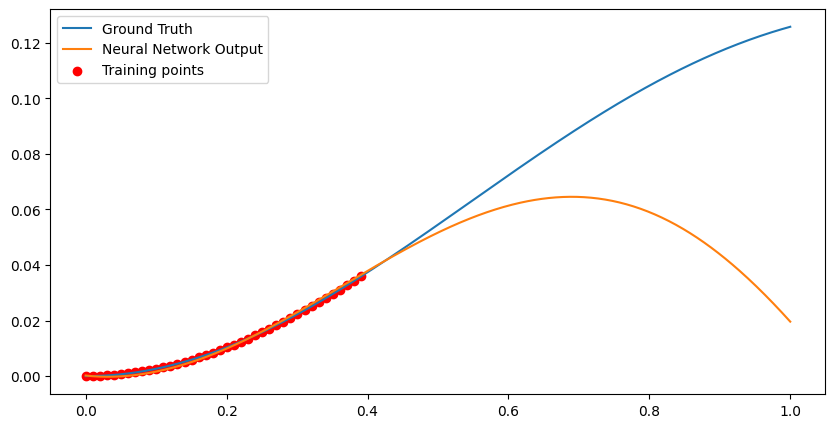

Loss at Step 1650 : 0.00014726311201229692
Epoch 1650, Total Data Processed: 8448000


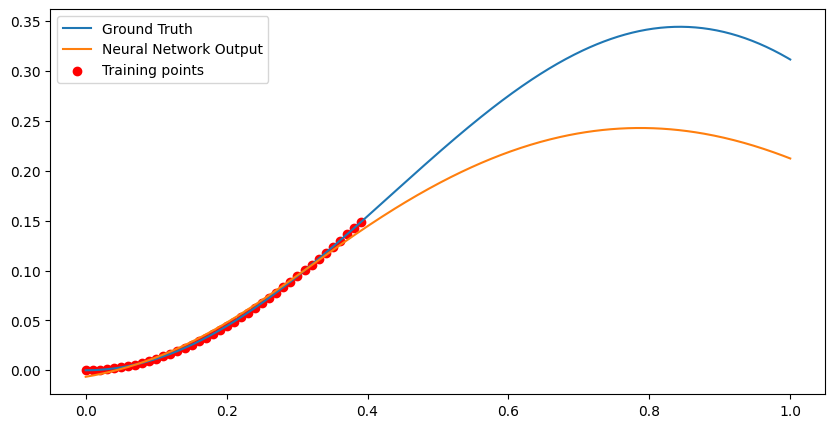

Loss at Step 1660 : 5.651609171763994e-05
Epoch 1660, Total Data Processed: 8499200


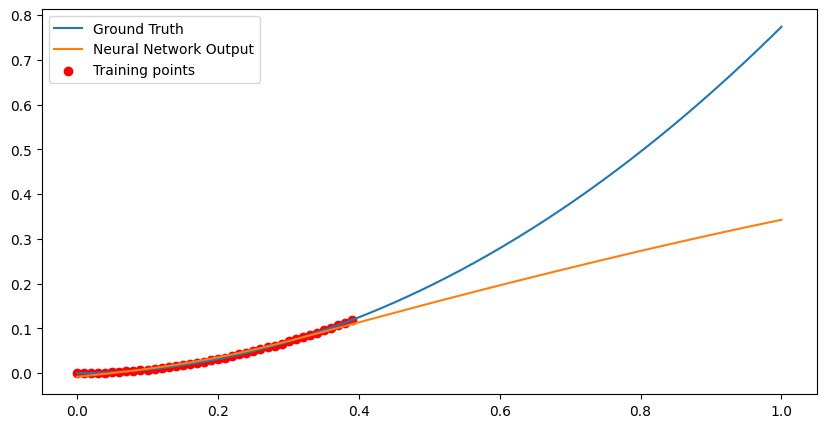

Loss at Step 1670 : 0.00022854920825921
Epoch 1670, Total Data Processed: 8550400


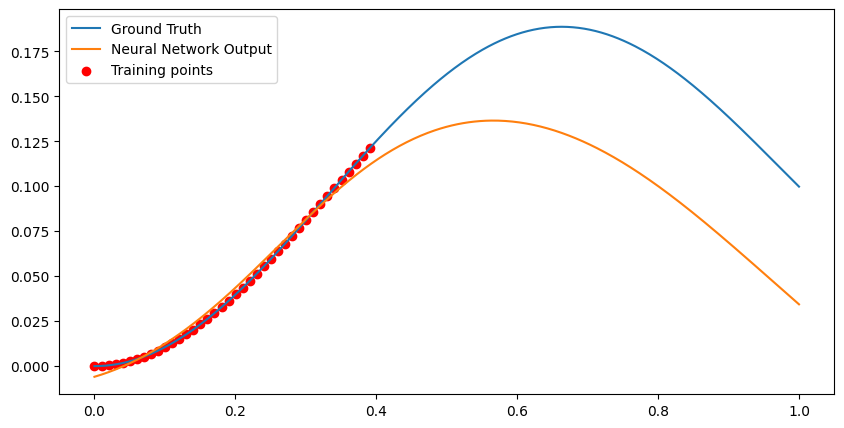

Loss at Step 1680 : 0.00015039990830700845
Epoch 1680, Total Data Processed: 8601600


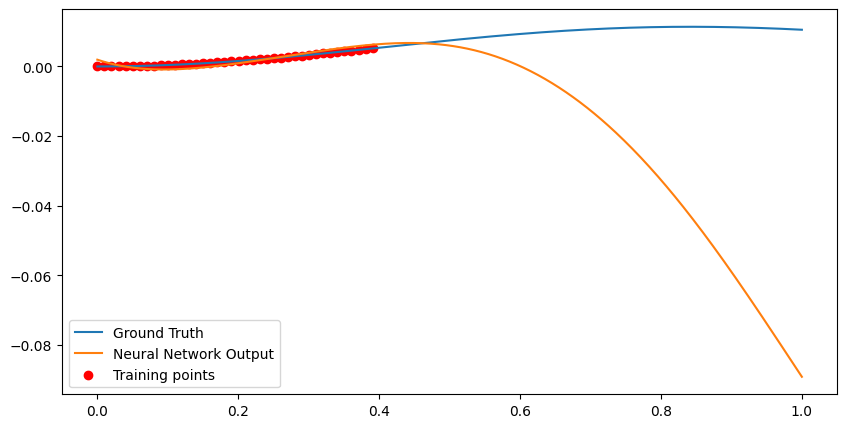

Loss at Step 1690 : 4.55244880868122e-05
Epoch 1690, Total Data Processed: 8652800


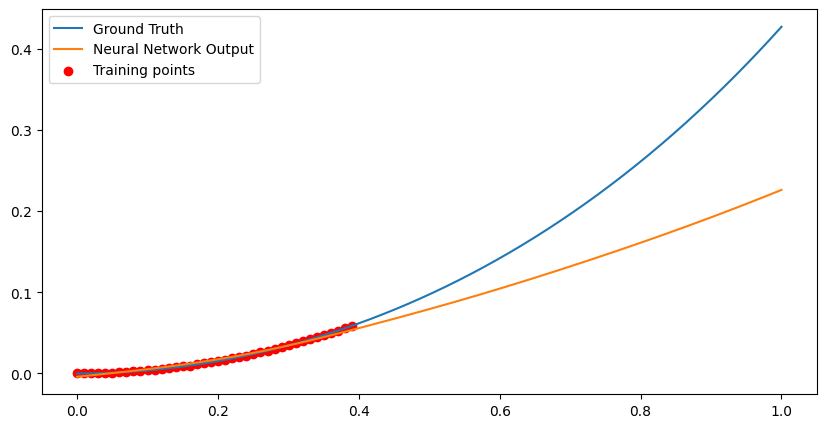

Epoch 1700, Variance: 8.934267498261761e-06, Loss Change: 6.200783808196775e-06
Loss at Step 1700 : 0.00012206034443806857
Epoch 1700, Total Data Processed: 8704000


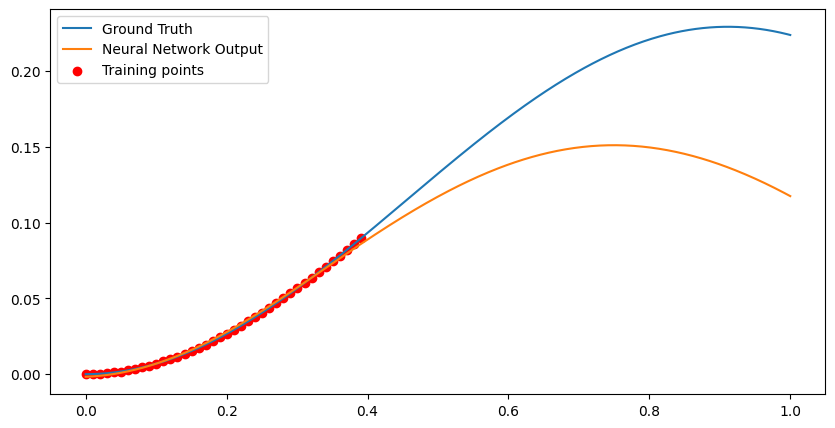

Loss at Step 1710 : 9.380903793498874e-05
Epoch 1710, Total Data Processed: 8755200


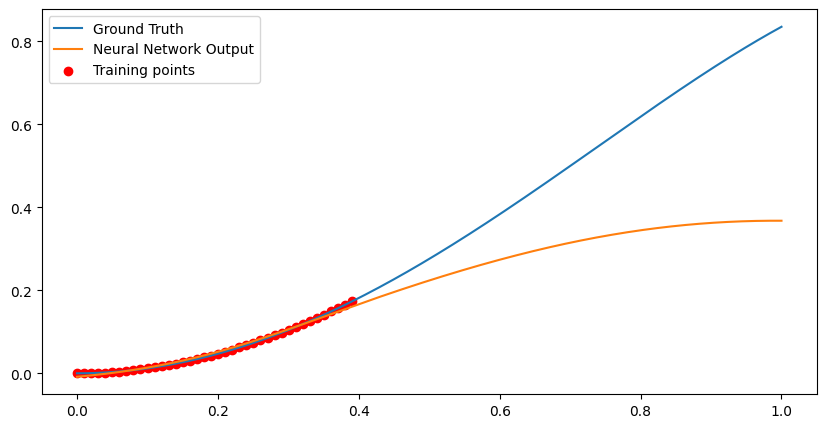

Loss at Step 1720 : 0.00023597260587848723
Epoch 1720, Total Data Processed: 8806400


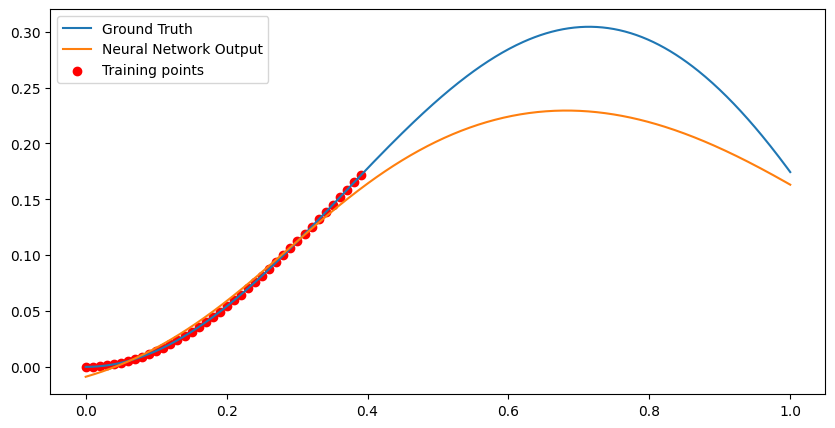

Loss at Step 1730 : 8.81808009580709e-05
Epoch 1730, Total Data Processed: 8857600


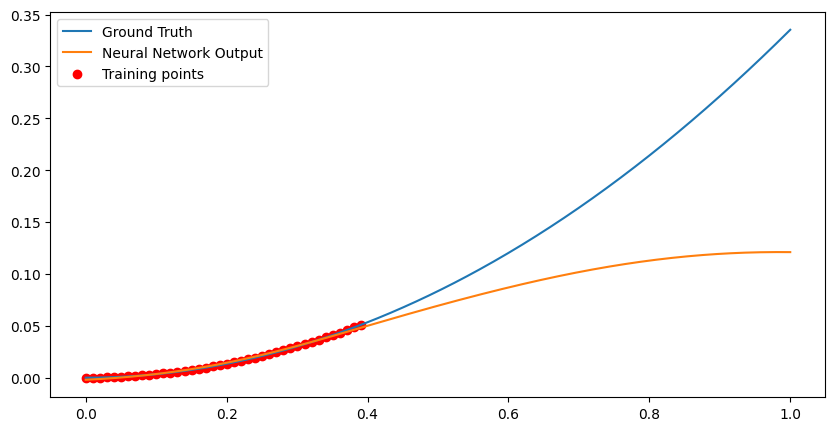

Loss at Step 1740 : 0.00011052093032049015
Epoch 1740, Total Data Processed: 8908800


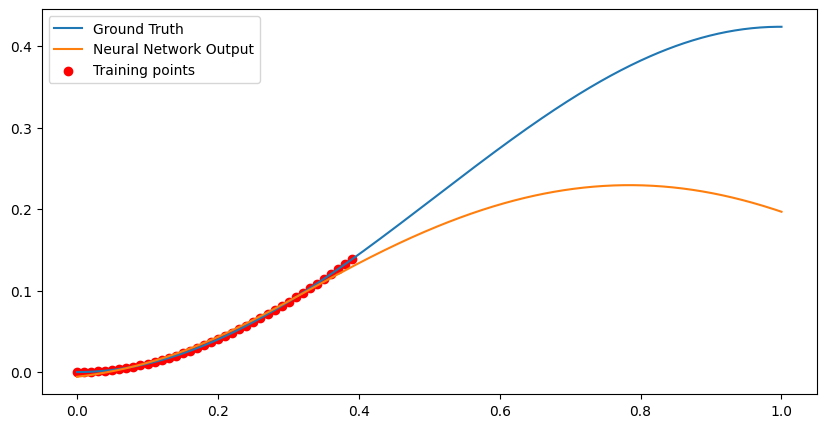

Loss at Step 1750 : 8.629582589492202e-05
Epoch 1750, Total Data Processed: 8960000


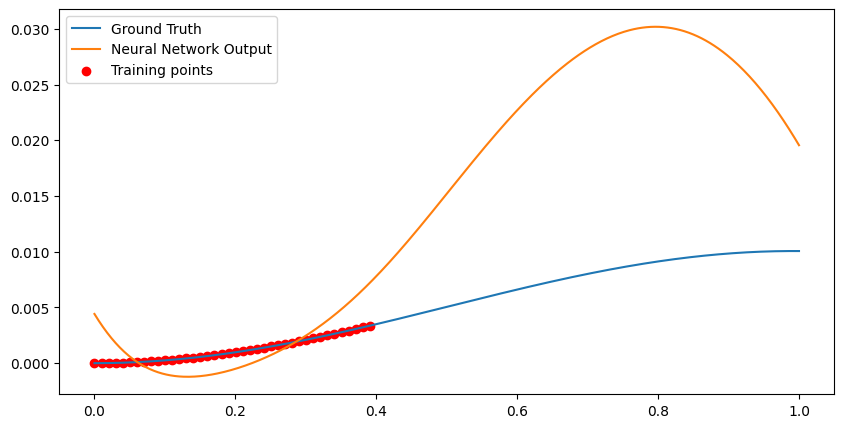

Loss at Step 1760 : 0.0001376021100440994
Epoch 1760, Total Data Processed: 9011200


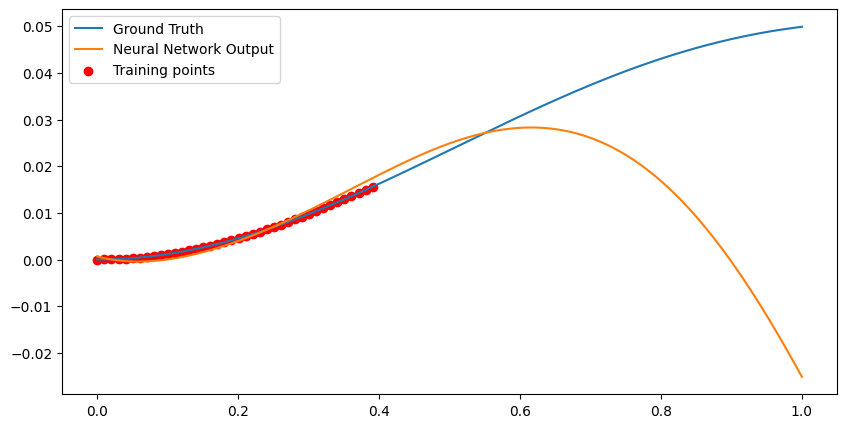

Loss at Step 1770 : 7.327488128794357e-05
Epoch 1770, Total Data Processed: 9062400


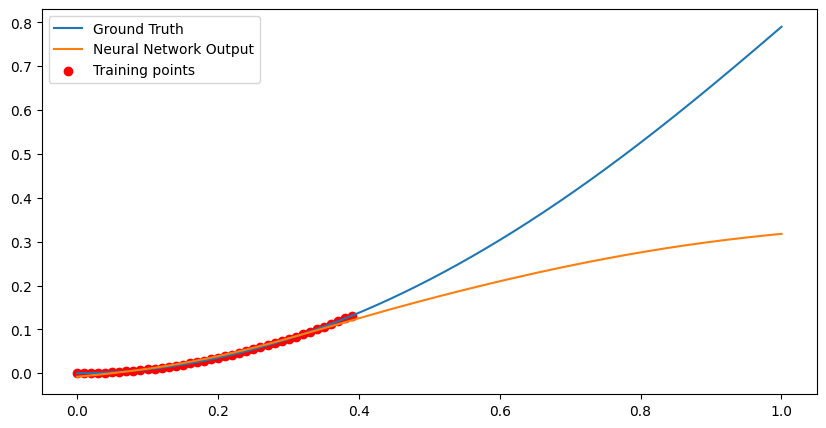

Loss at Step 1780 : 0.0002224501658929512
Epoch 1780, Total Data Processed: 9113600


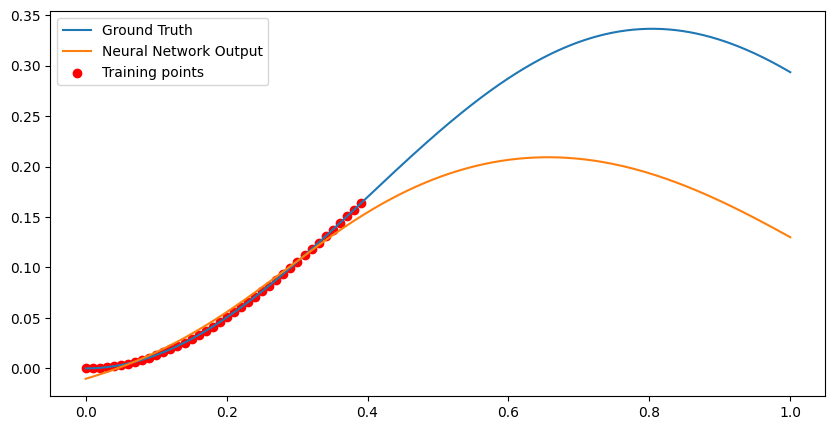

Loss at Step 1790 : 0.00015944460756145418
Epoch 1790, Total Data Processed: 9164800


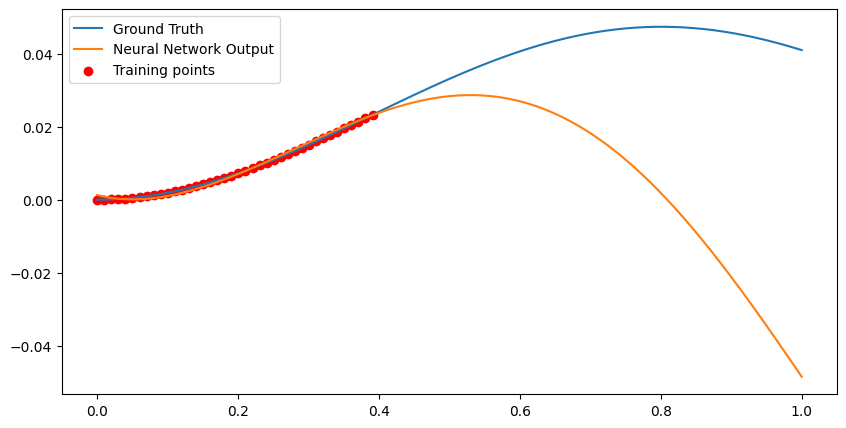

Epoch 1800, Variance: 1.1520996849867515e-05, Loss Change: 6.47674869114212e-06
Loss at Step 1800 : 8.396560588153079e-05
Epoch 1800, Total Data Processed: 9216000


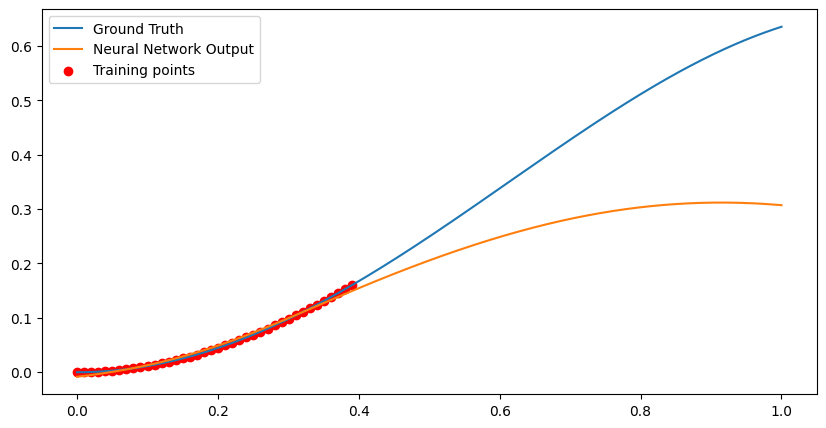

Loss at Step 1810 : 6.641828804276884e-05
Epoch 1810, Total Data Processed: 9267200


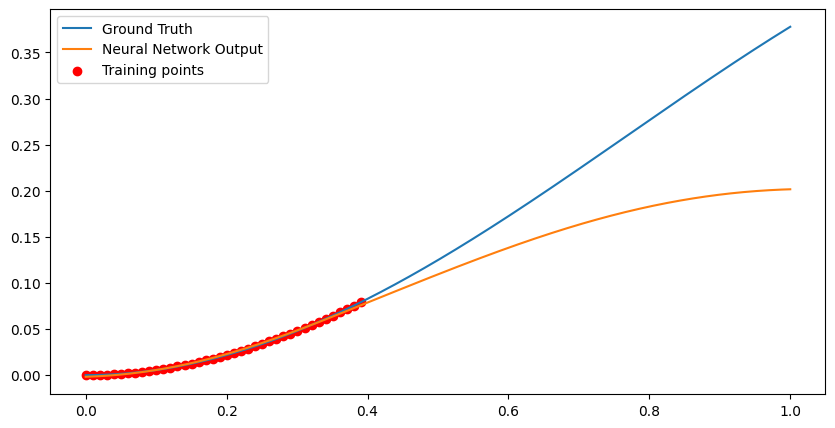

Loss at Step 1820 : 0.00025460519827902317
Epoch 1820, Total Data Processed: 9318400


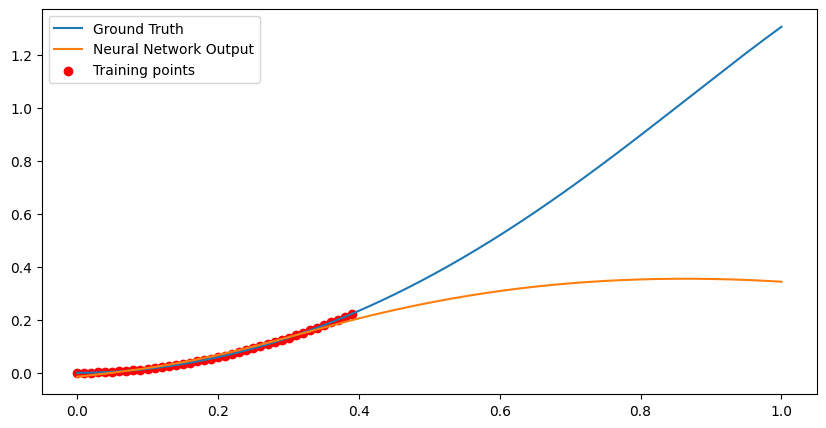

Loss at Step 1830 : 0.00022477615857496858
Epoch 1830, Total Data Processed: 9369600


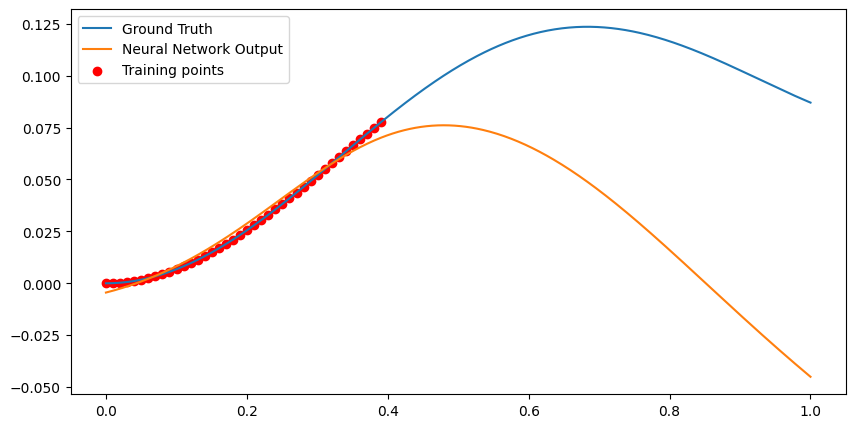

Loss at Step 1840 : 0.00016105346730910242
Epoch 1840, Total Data Processed: 9420800


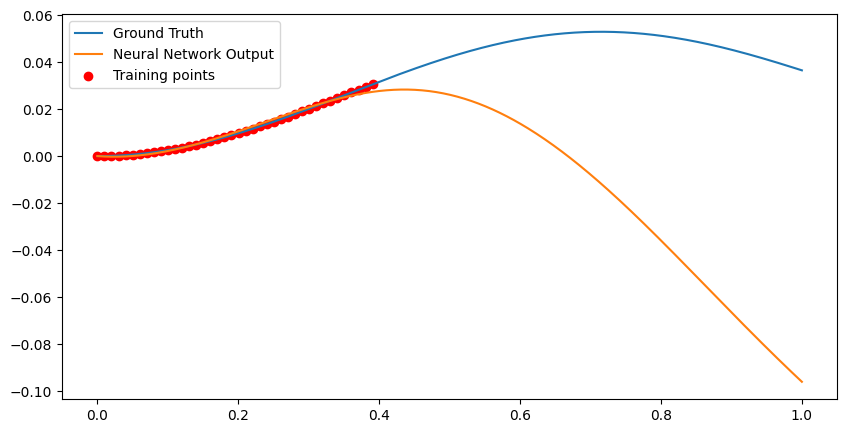

Loss at Step 1850 : 0.00013681079144589603
Epoch 1850, Total Data Processed: 9472000


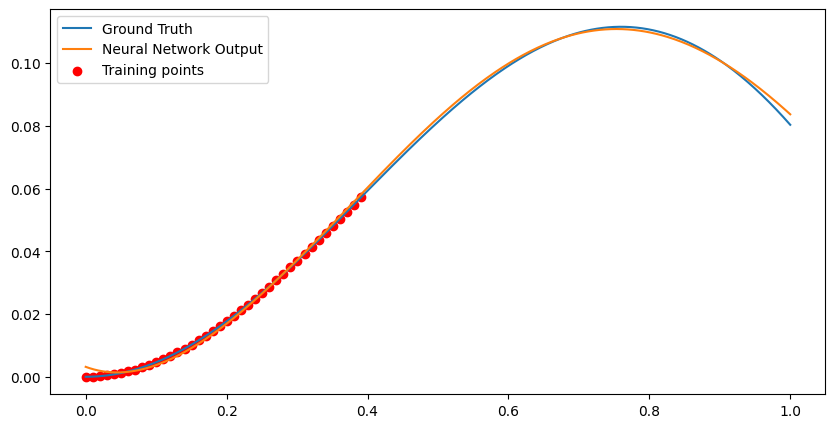

Loss at Step 1860 : 0.00012166328815510496
Epoch 1860, Total Data Processed: 9523200


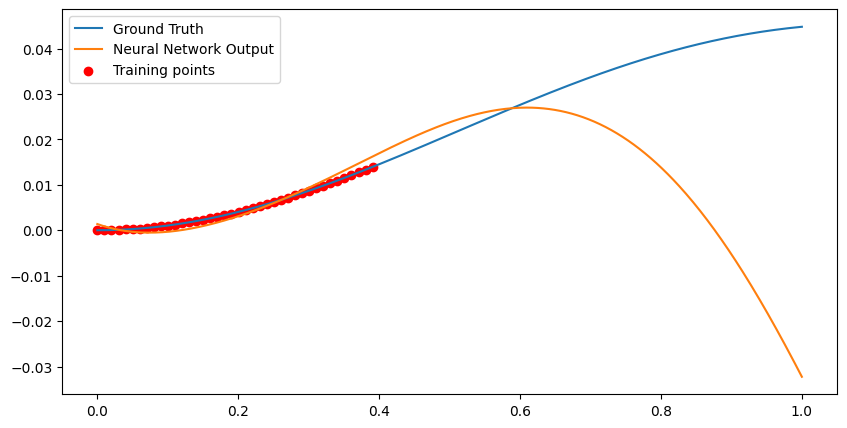

Loss at Step 1870 : 2.560489156167023e-05
Epoch 1870, Total Data Processed: 9574400


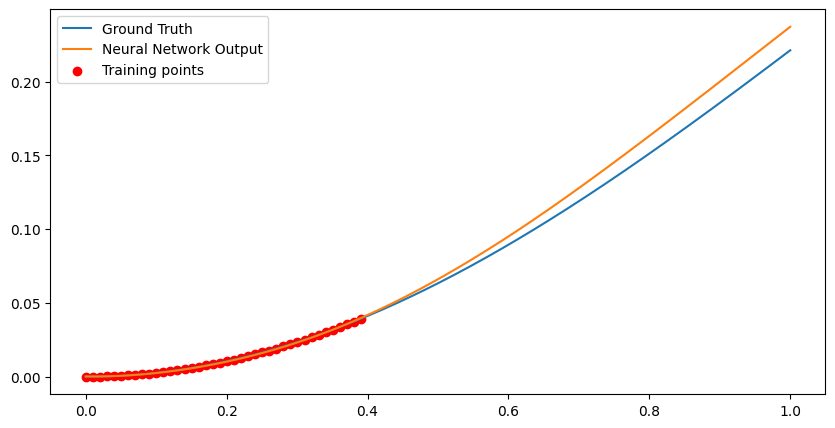

Loss at Step 1880 : 7.879325858084485e-05
Epoch 1880, Total Data Processed: 9625600


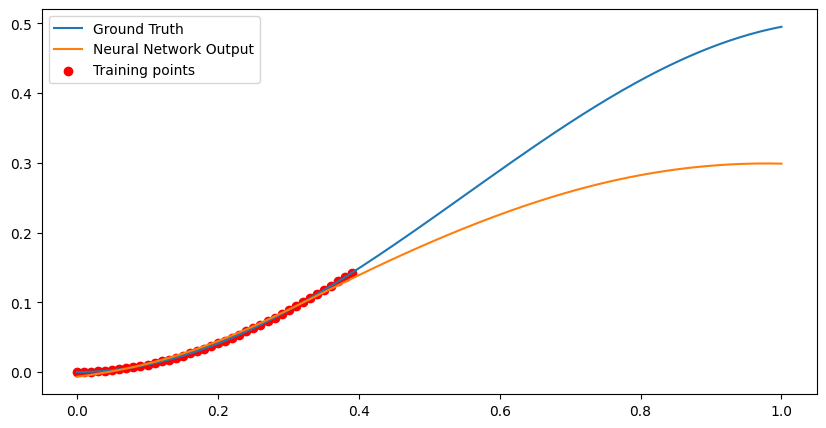

Loss at Step 1890 : 0.00014692526019643992
Epoch 1890, Total Data Processed: 9676800


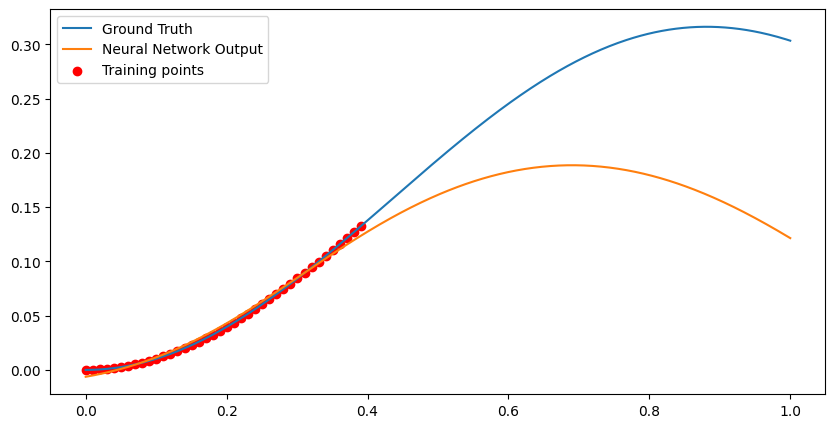

Epoch 1900, Variance: 1.1707790690707043e-05, Loss Change: 3.5546517604956307e-06
Loss at Step 1900 : 3.223998282919638e-05
Epoch 1900, Total Data Processed: 9728000


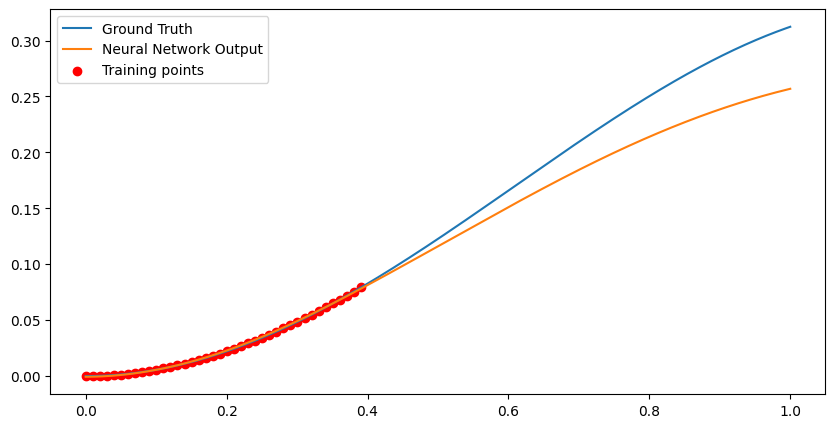

Loss at Step 1910 : 0.00023369694827124476
Epoch 1910, Total Data Processed: 9779200


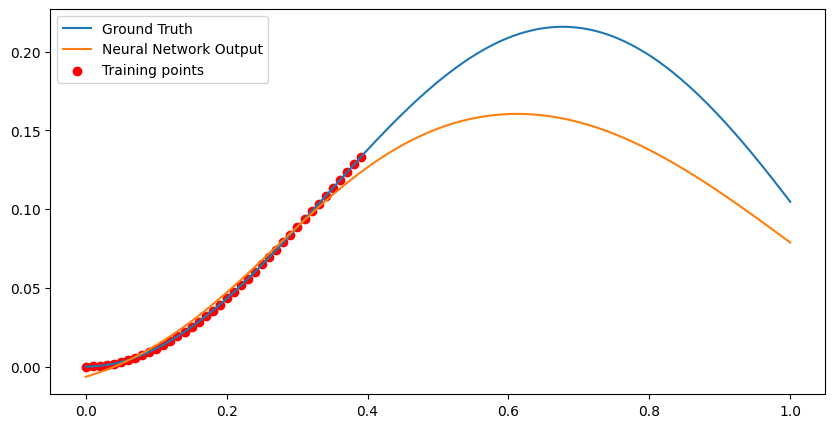

Loss at Step 1920 : 7.955574983498082e-05
Epoch 1920, Total Data Processed: 9830400


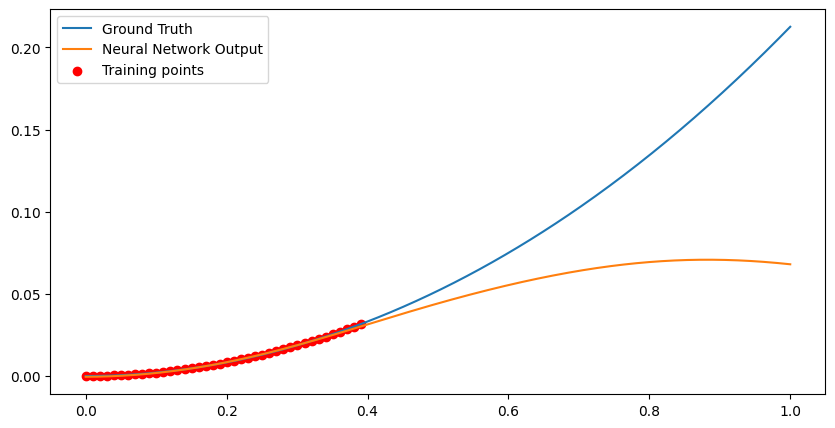

Loss at Step 1930 : 7.928598643047735e-05
Epoch 1930, Total Data Processed: 9881600


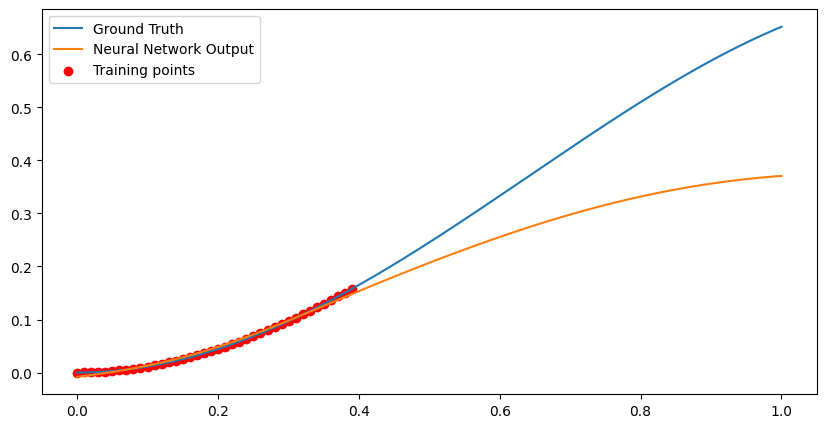

Loss at Step 1940 : 0.00010826873040059581
Epoch 1940, Total Data Processed: 9932800


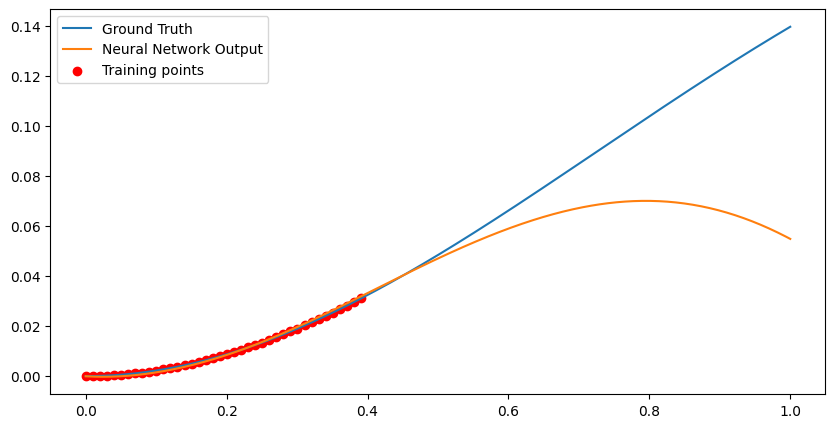

Loss at Step 1950 : 4.86162789457012e-05
Epoch 1950, Total Data Processed: 9984000


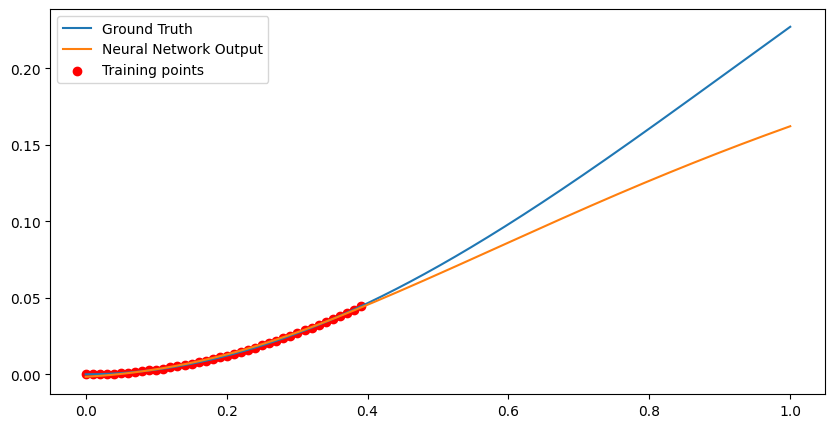

Loss at Step 1960 : 4.692932270700112e-05
Epoch 1960, Total Data Processed: 10035200


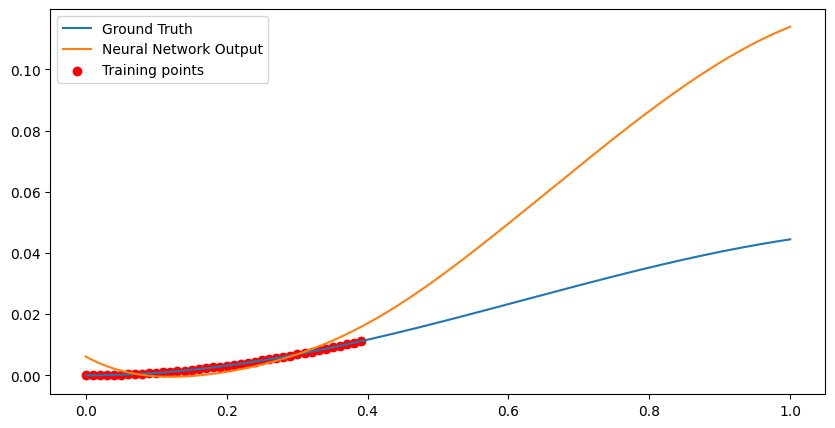

Loss at Step 1970 : 0.00022289292246568948
Epoch 1970, Total Data Processed: 10086400


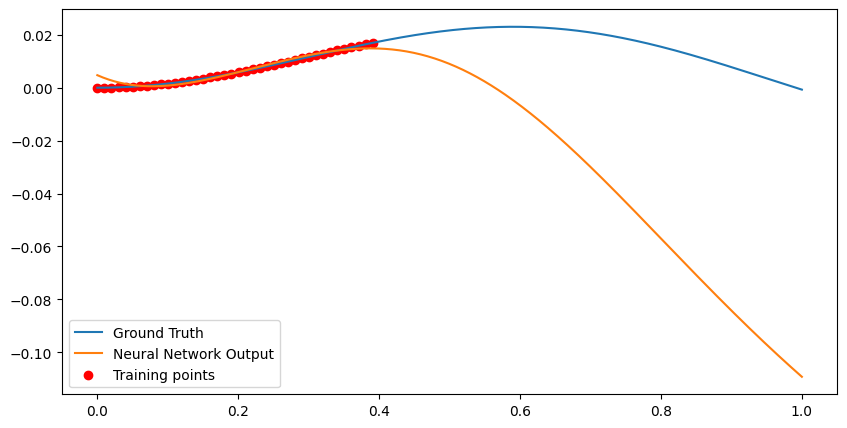

Loss at Step 1980 : 8.384424290852621e-05
Epoch 1980, Total Data Processed: 10137600


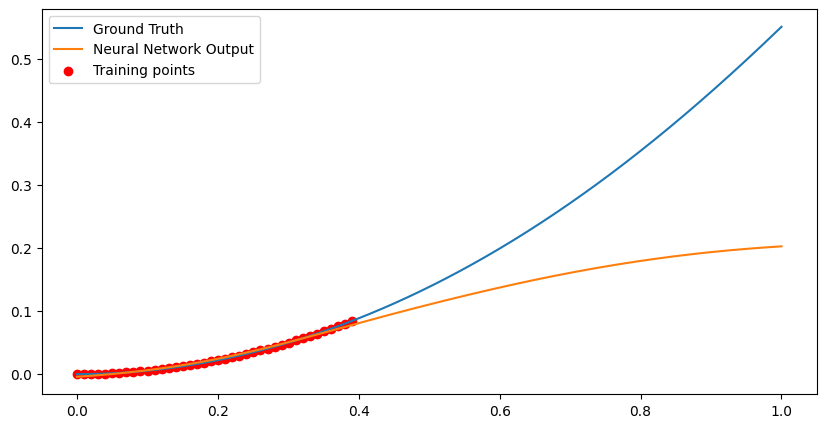

Loss at Step 1990 : 2.4501454390701838e-05
Epoch 1990, Total Data Processed: 10188800


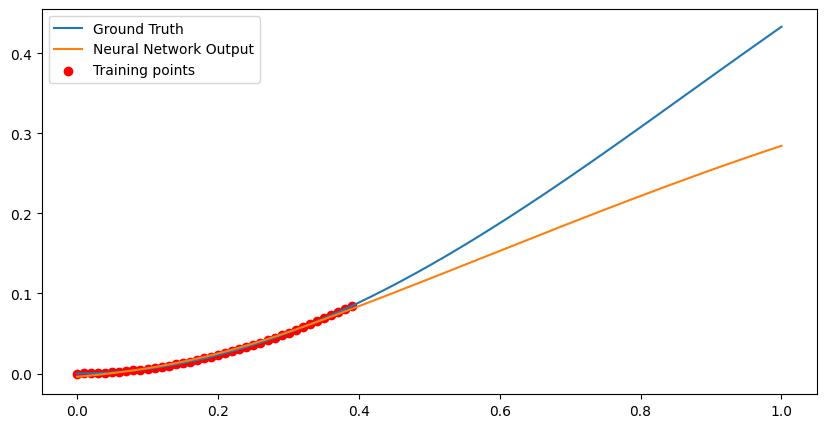

Epoch 2000, Variance: 1.0307836419087835e-05, Loss Change: 2.1867121766661057e-06
Loss at Step 2000 : 0.0001101155357901007
Epoch 2000, Total Data Processed: 10240000


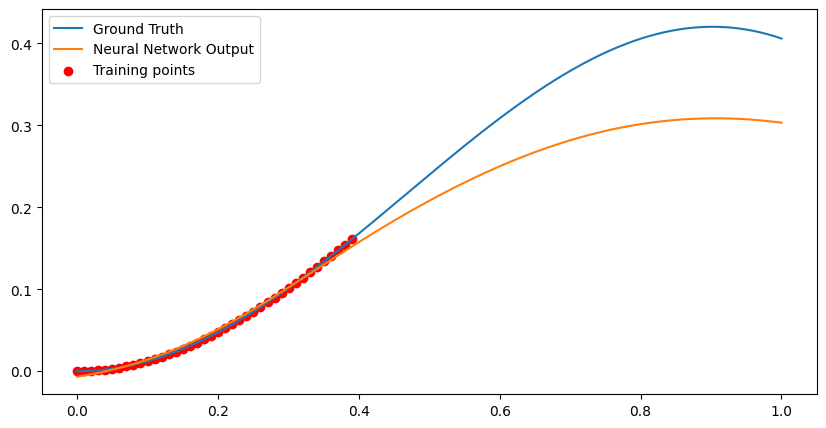

Loss at Step 2010 : 4.286506737116724e-05
Epoch 2010, Total Data Processed: 10291200


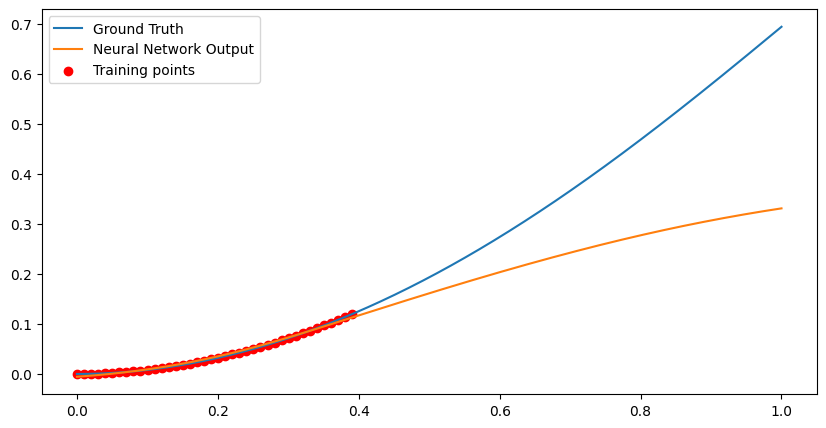

Loss at Step 2020 : 0.0002638657169882208
Epoch 2020, Total Data Processed: 10342400


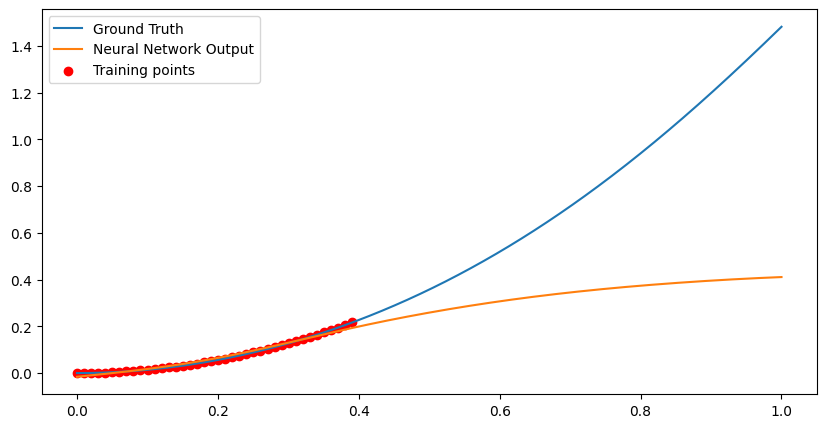

Loss at Step 2030 : 0.00019571509619709104
Epoch 2030, Total Data Processed: 10393600


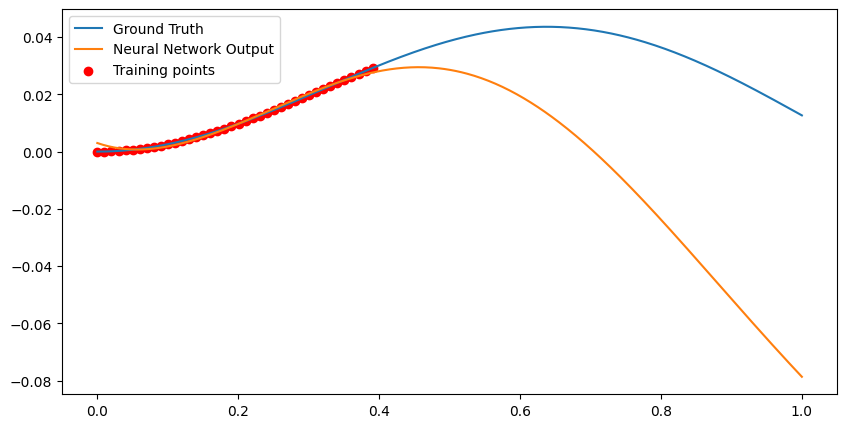

Loss at Step 2040 : 1.191517549159471e-05
Epoch 2040, Total Data Processed: 10444800


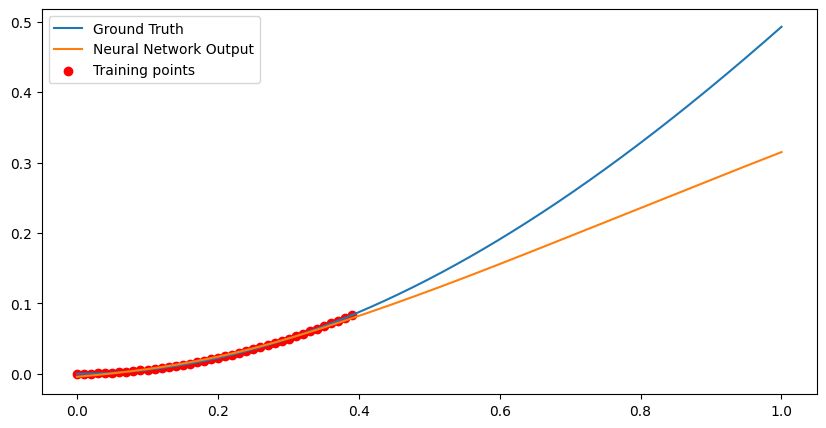

Loss at Step 2050 : 0.00011753888247767463
Epoch 2050, Total Data Processed: 10496000


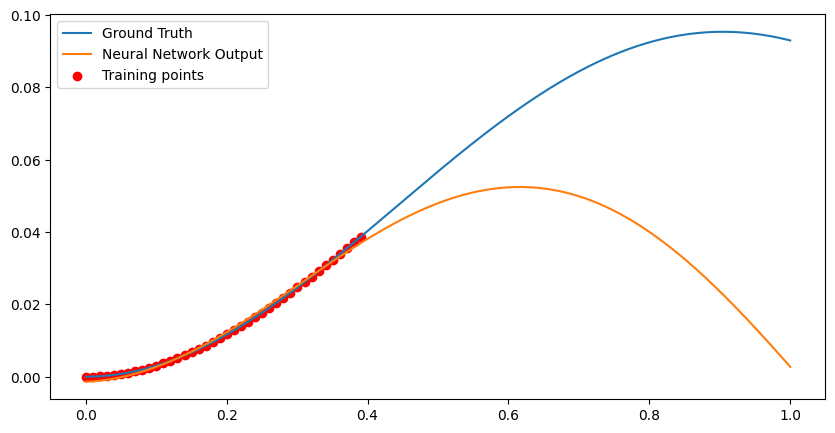

Loss at Step 2060 : 9.604963997844607e-05
Epoch 2060, Total Data Processed: 10547200


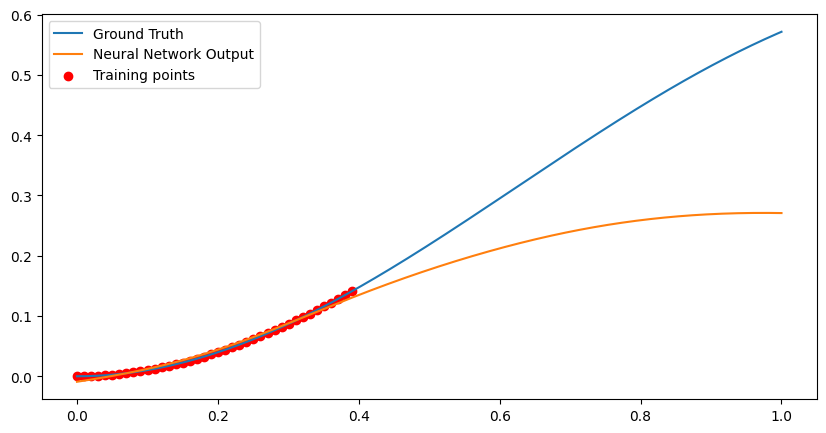

Loss at Step 2070 : 9.928088729793672e-06
Epoch 2070, Total Data Processed: 10598400


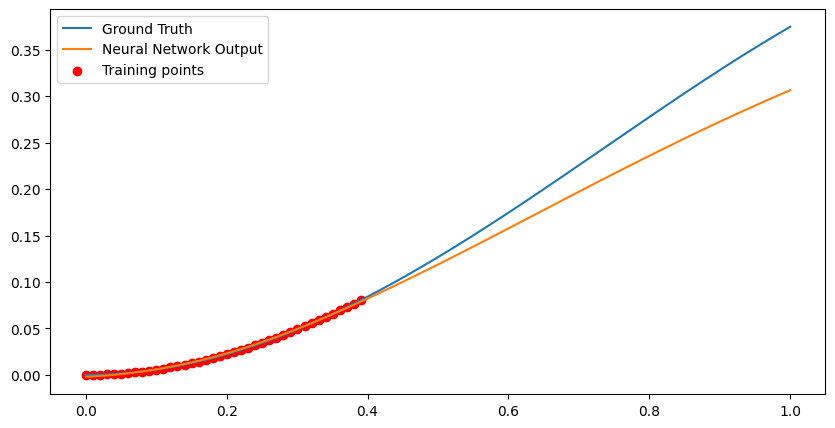

Loss at Step 2080 : 0.00010516322799958289
Epoch 2080, Total Data Processed: 10649600


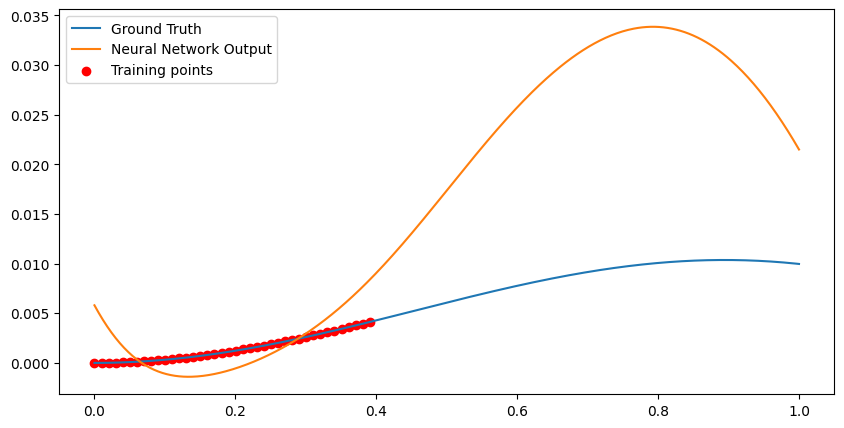

Loss at Step 2090 : 0.00023083675478119403
Epoch 2090, Total Data Processed: 10700800


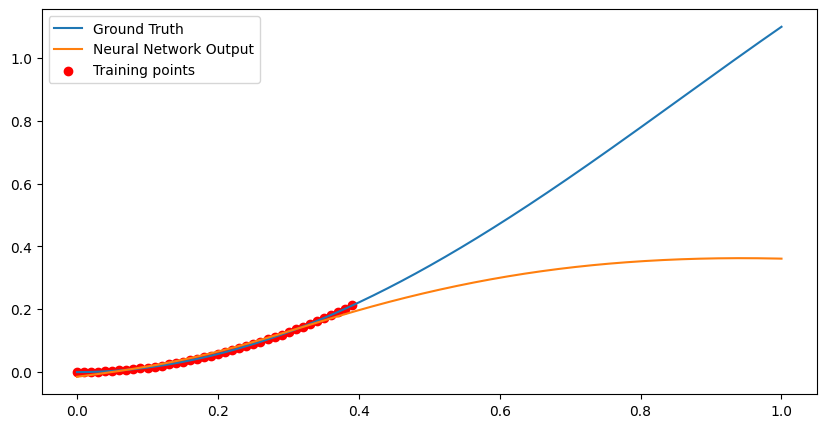

Epoch 2100, Variance: 1.3177271284803282e-05, Loss Change: 5.581471299365148e-06
Loss at Step 2100 : 0.00020423598471097648
Epoch 2100, Total Data Processed: 10752000


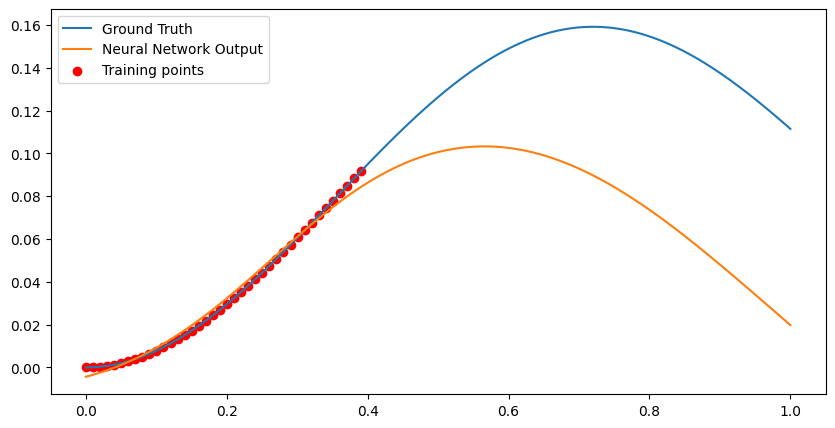

Loss at Step 2110 : 3.6050532798981294e-05
Epoch 2110, Total Data Processed: 10803200


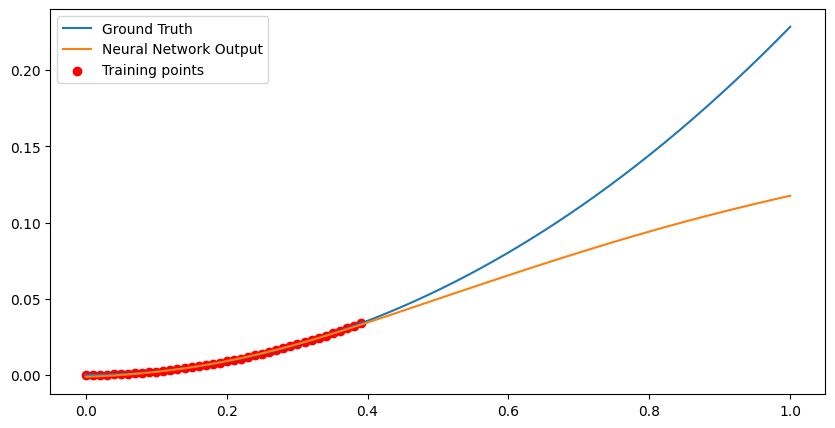

Loss at Step 2120 : 3.965969881392084e-05
Epoch 2120, Total Data Processed: 10854400


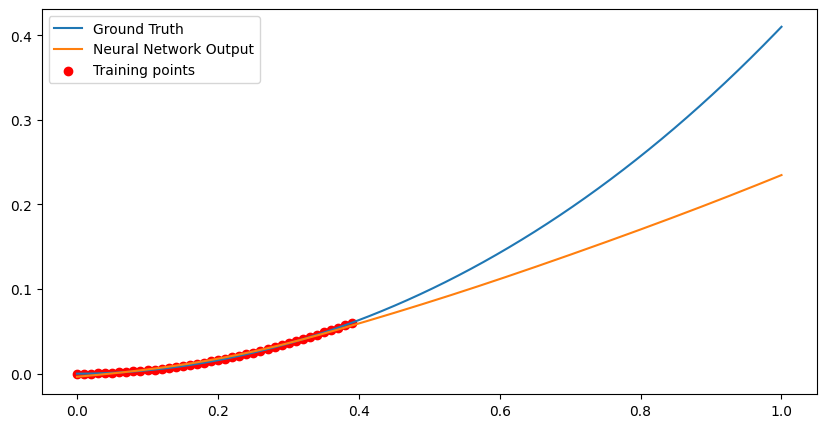

Loss at Step 2130 : 3.346371522638947e-05
Epoch 2130, Total Data Processed: 10905600


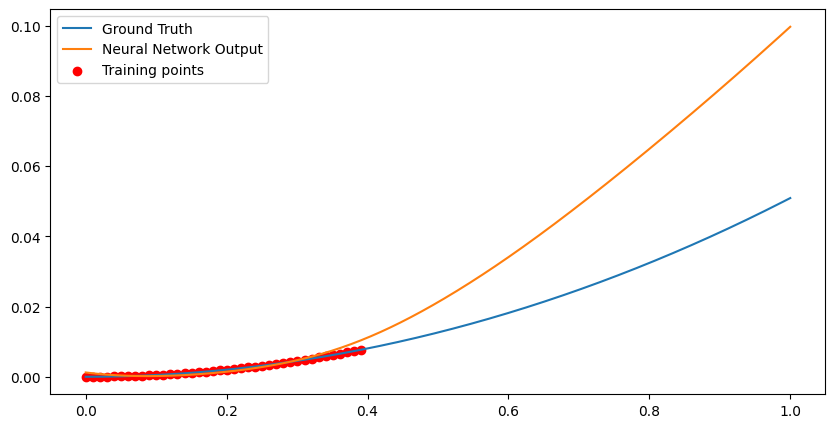

Loss at Step 2140 : 2.9149496185709722e-05
Epoch 2140, Total Data Processed: 10956800


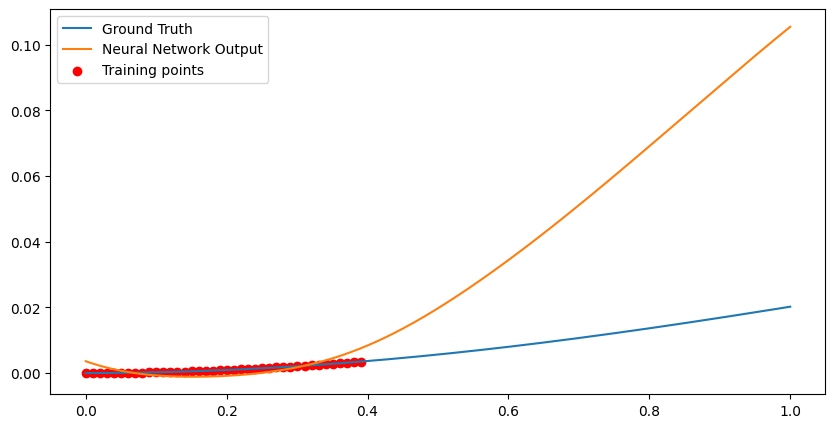

Loss at Step 2150 : 0.0002135119866579771
Epoch 2150, Total Data Processed: 11008000


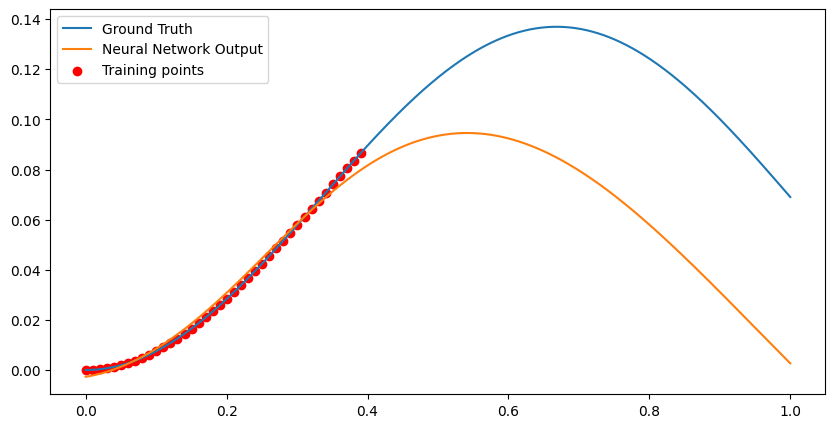

Loss at Step 2160 : 7.418074528686702e-05
Epoch 2160, Total Data Processed: 11059200


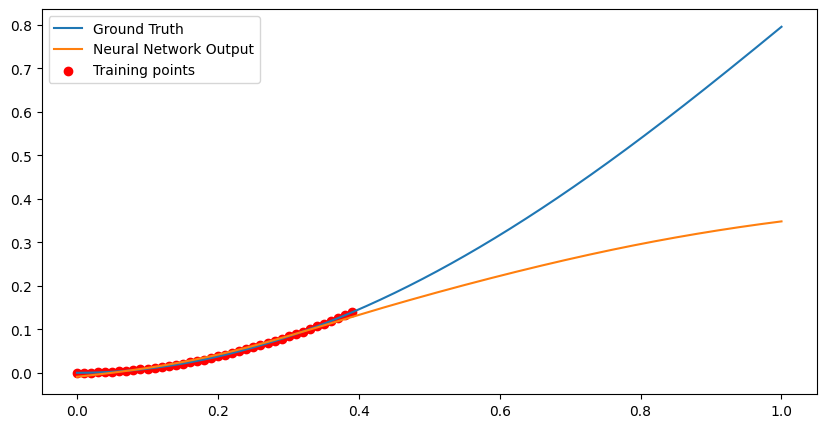

Loss at Step 2170 : 2.0263918486307375e-05
Epoch 2170, Total Data Processed: 11110400


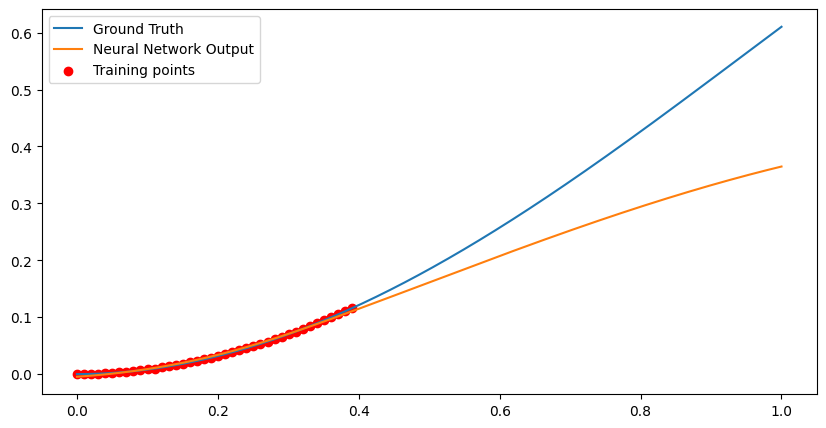

Loss at Step 2180 : 0.00020046796998940408
Epoch 2180, Total Data Processed: 11161600


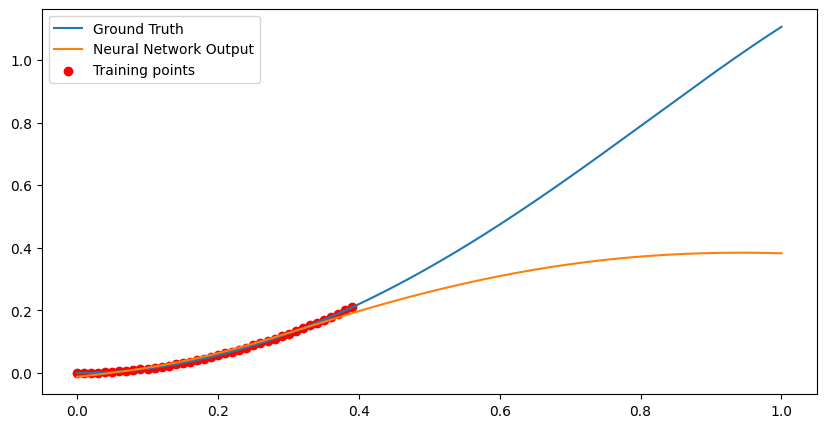

Loss at Step 2190 : 8.96931960596703e-05
Epoch 2190, Total Data Processed: 11212800


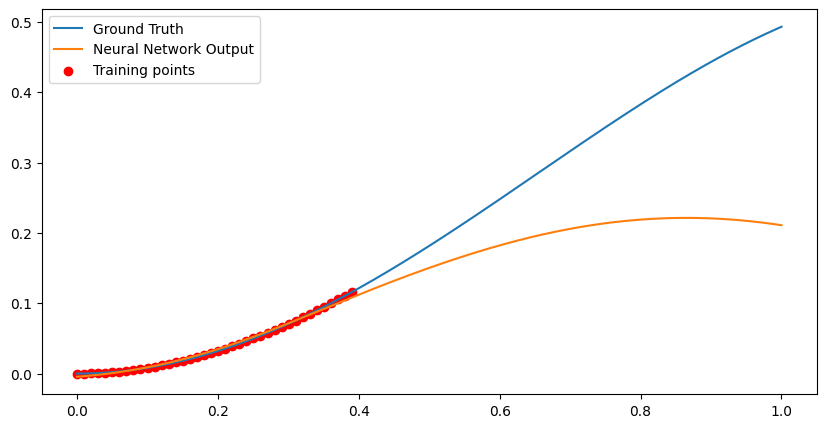

Epoch 2200, Variance: 1.3108717212162446e-05, Loss Change: 1.782167172592608e-05
Loss at Step 2200 : 0.0001525119150755927
Epoch 2200, Total Data Processed: 11264000


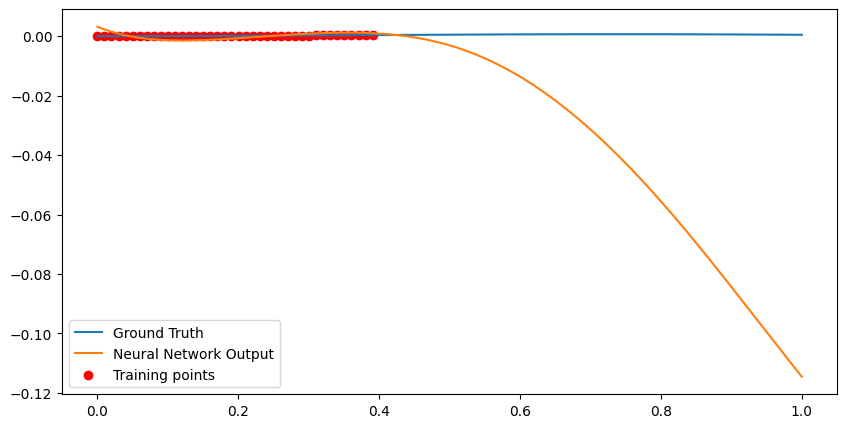

Loss at Step 2210 : 5.865822822670452e-05
Epoch 2210, Total Data Processed: 11315200


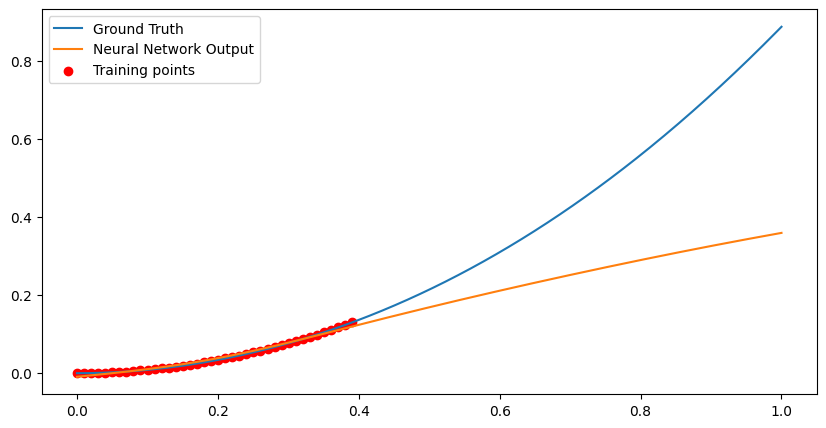

Loss at Step 2220 : 1.655403320910409e-05
Epoch 2220, Total Data Processed: 11366400


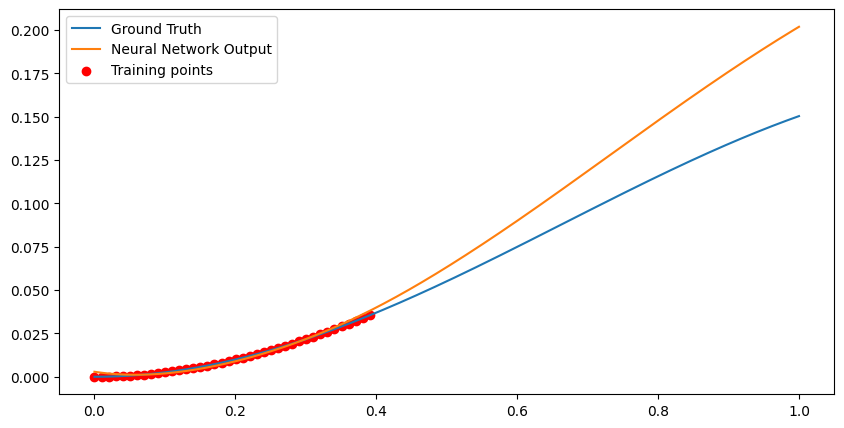

Loss at Step 2230 : 7.364710472756997e-05
Epoch 2230, Total Data Processed: 11417600


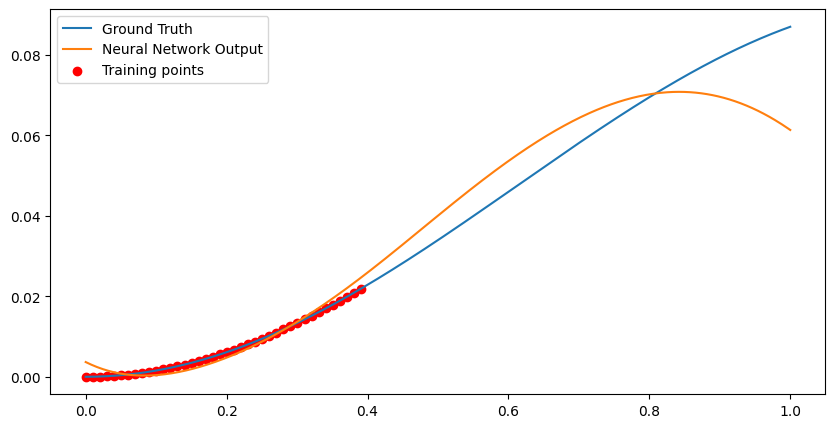

Loss at Step 2240 : 0.00023373386648017913
Epoch 2240, Total Data Processed: 11468800


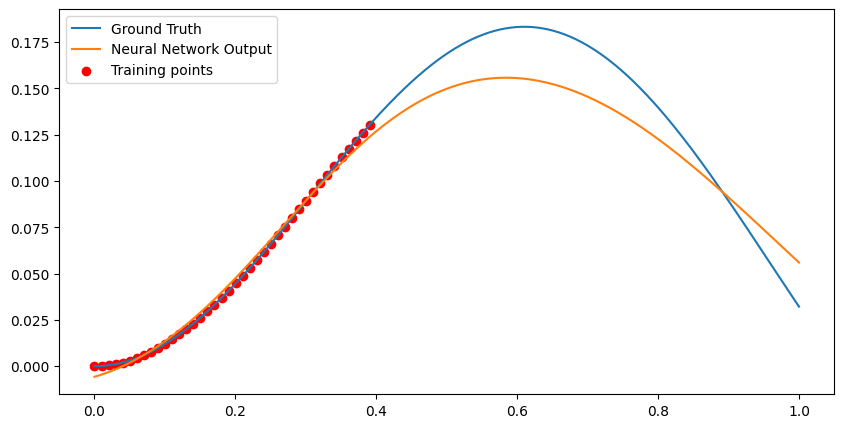

Loss at Step 2250 : 0.0001669637713348493
Epoch 2250, Total Data Processed: 11520000


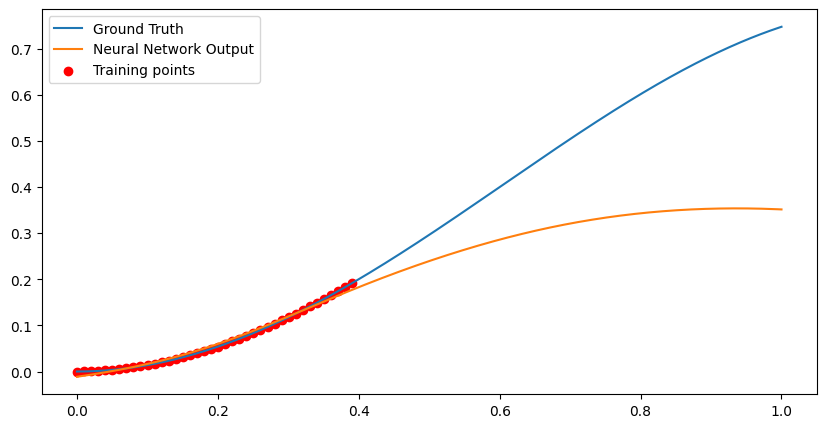

Loss at Step 2260 : 2.98998347716406e-05
Epoch 2260, Total Data Processed: 11571200


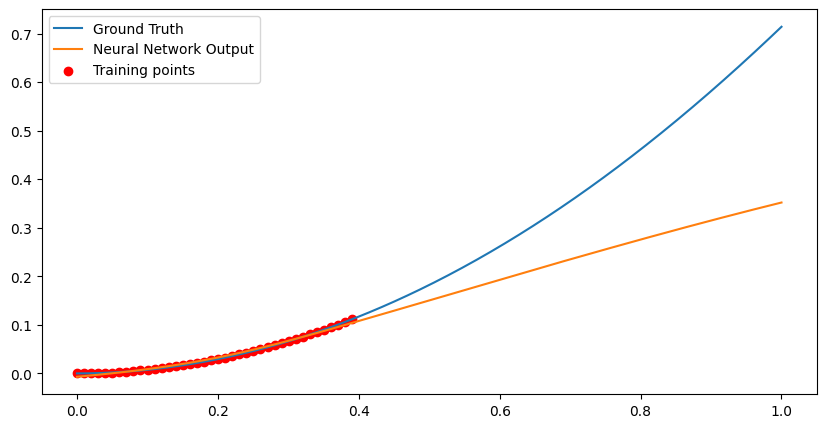

Loss at Step 2270 : 0.0002736804890446365
Epoch 2270, Total Data Processed: 11622400


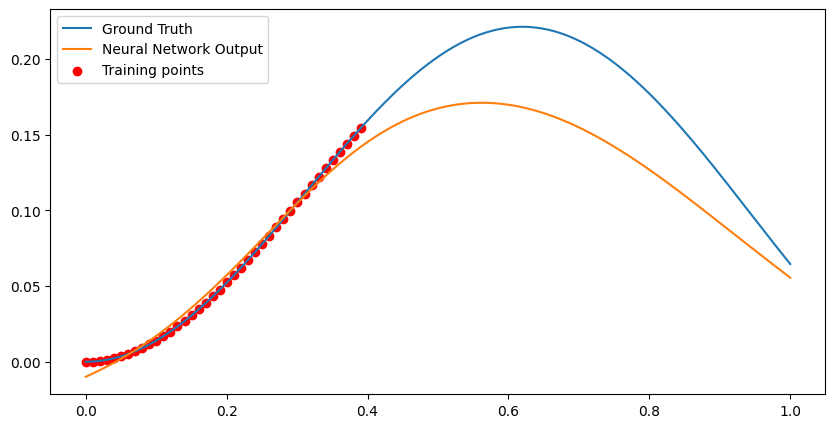

Loss at Step 2280 : 0.00015594226715620607
Epoch 2280, Total Data Processed: 11673600


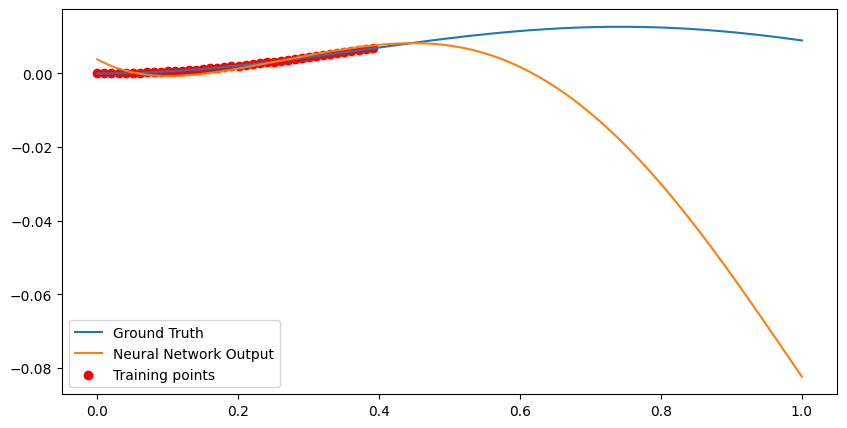

Loss at Step 2290 : 0.00021839140390511602
Epoch 2290, Total Data Processed: 11724800


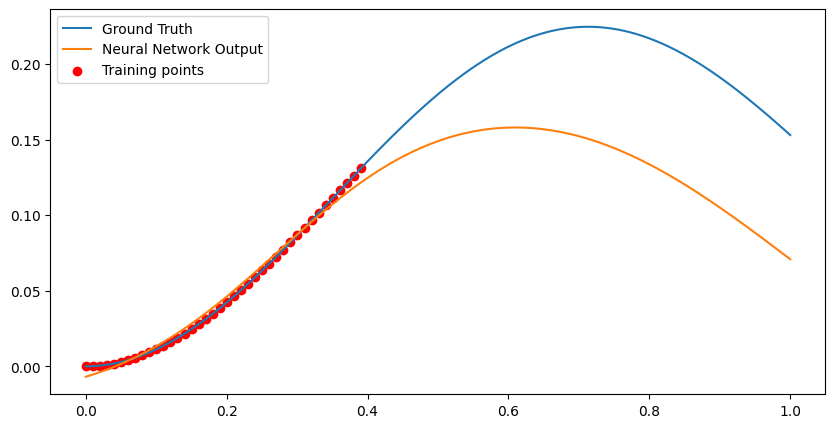

Epoch 2300, Variance: 1.2688341485045385e-05, Loss Change: 2.776596613074389e-06
Loss at Step 2300 : 0.00016925901581998914
Epoch 2300, Total Data Processed: 11776000


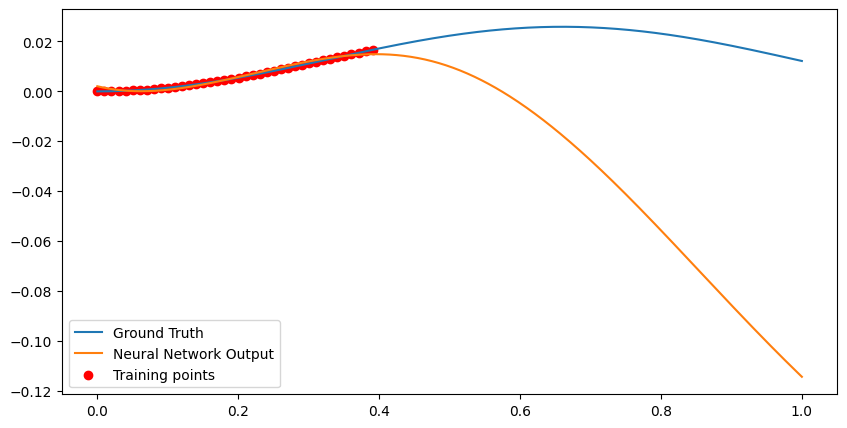

Loss at Step 2310 : 0.00019697773677762598
Epoch 2310, Total Data Processed: 11827200


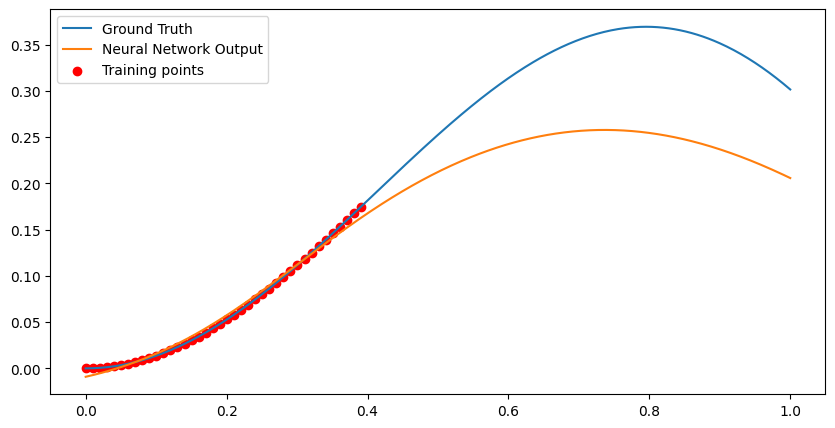

Loss at Step 2320 : 3.43189385603182e-05
Epoch 2320, Total Data Processed: 11878400


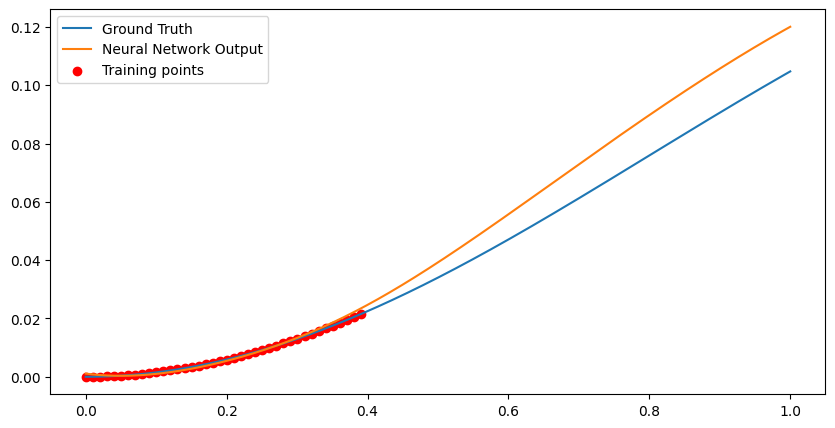

Loss at Step 2330 : 7.420902693411335e-05
Epoch 2330, Total Data Processed: 11929600


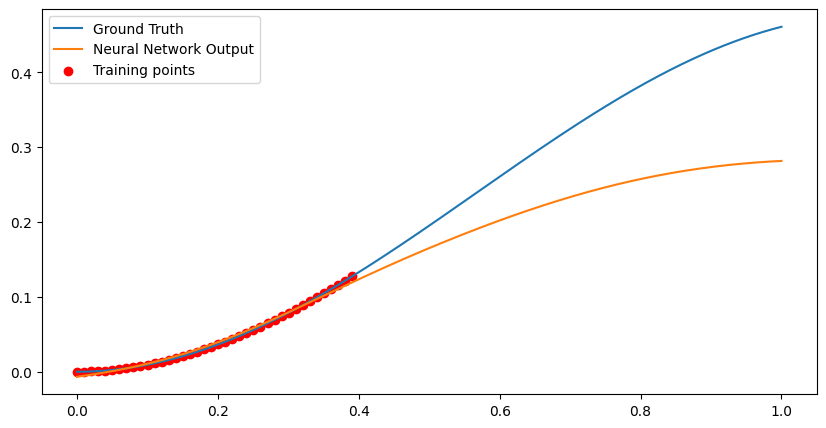

Loss at Step 2340 : 0.00015973234258126467
Epoch 2340, Total Data Processed: 11980800


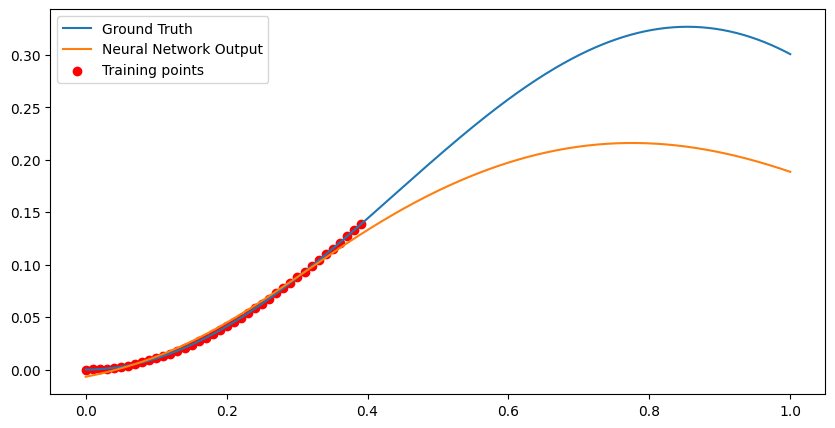

Loss at Step 2350 : 0.0001525932311778888
Epoch 2350, Total Data Processed: 12032000


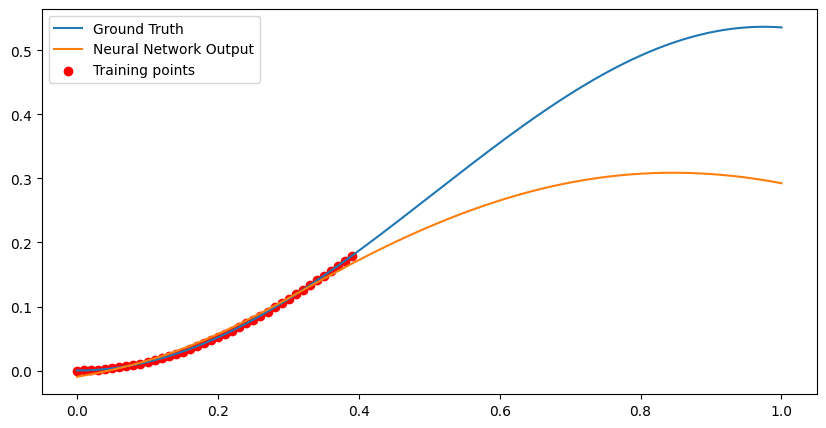

Loss at Step 2360 : 0.00015434282249771059
Epoch 2360, Total Data Processed: 12083200


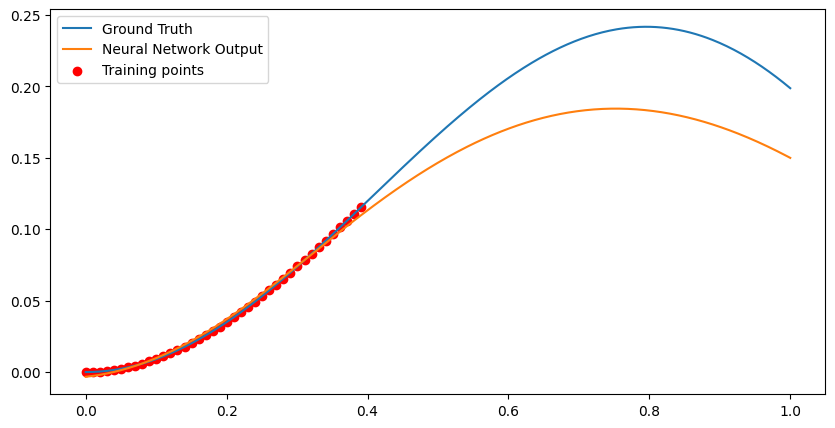

Loss at Step 2370 : 0.00022751510550733656
Epoch 2370, Total Data Processed: 12134400


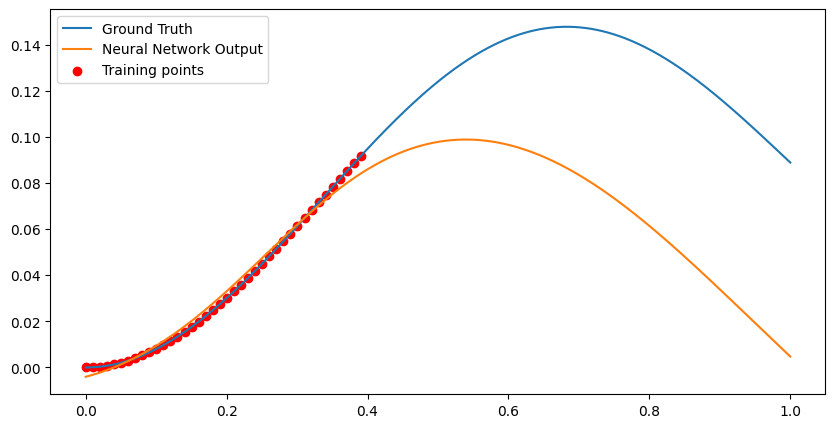

Loss at Step 2380 : 0.00019089772831648588
Epoch 2380, Total Data Processed: 12185600


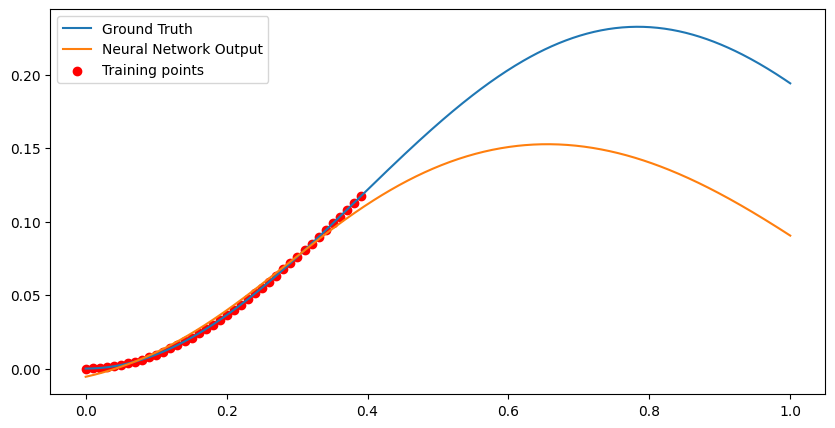

Loss at Step 2390 : 0.00015478514251299202
Epoch 2390, Total Data Processed: 12236800


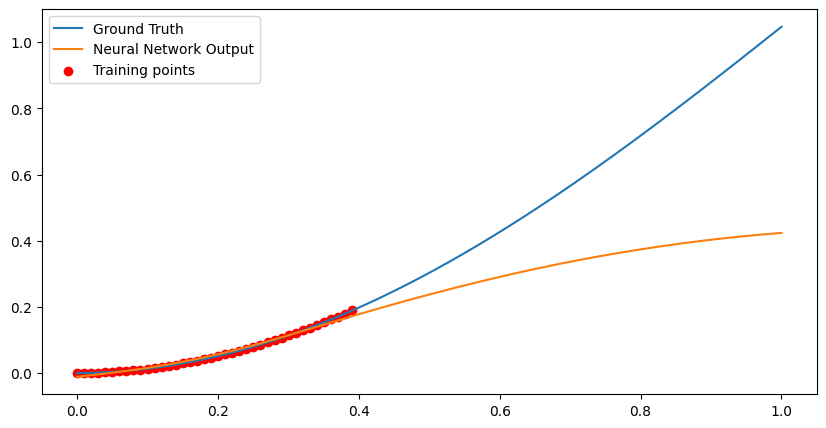

Epoch 2400, Variance: 1.082486687664641e-05, Loss Change: 1.8149277771328798e-05
Loss at Step 2400 : 0.00014801809447817504
Epoch 2400, Total Data Processed: 12288000


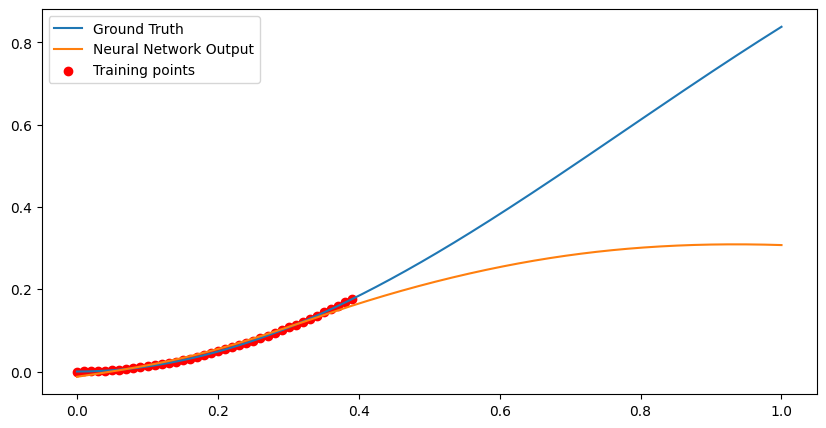

Loss at Step 2410 : 6.4987747464329e-05
Epoch 2410, Total Data Processed: 12339200


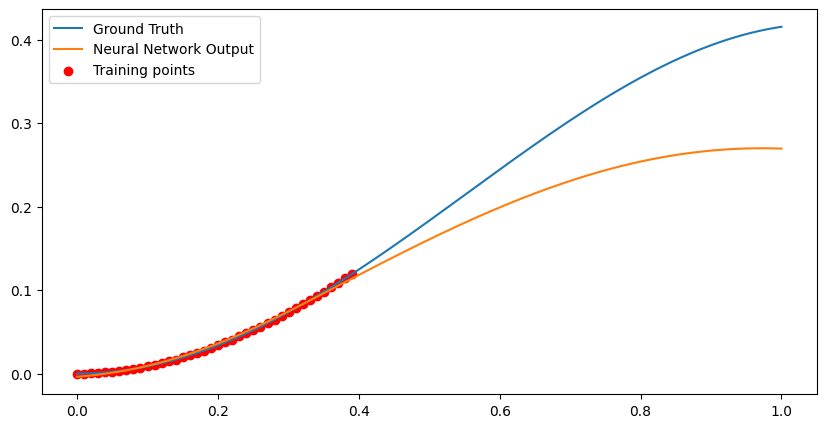

Loss at Step 2420 : 6.308720185188577e-05
Epoch 2420, Total Data Processed: 12390400


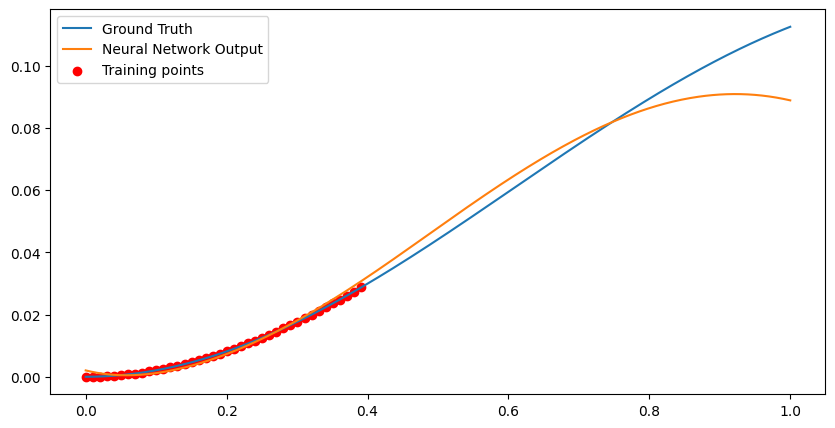

Loss at Step 2430 : 6.840003334218636e-05
Epoch 2430, Total Data Processed: 12441600


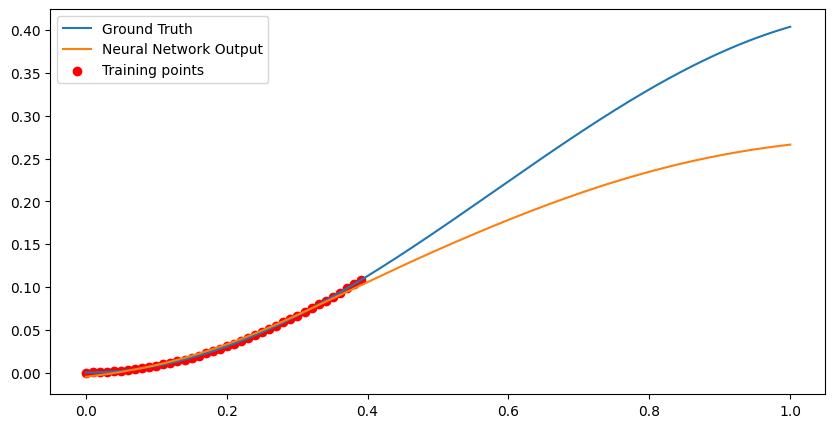

Loss at Step 2440 : 0.00011266222281847149
Epoch 2440, Total Data Processed: 12492800


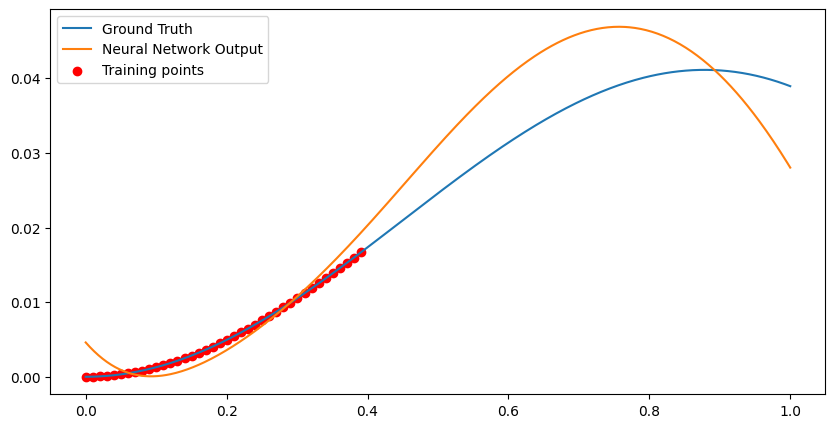

Loss at Step 2450 : 8.218001312343404e-05
Epoch 2450, Total Data Processed: 12544000


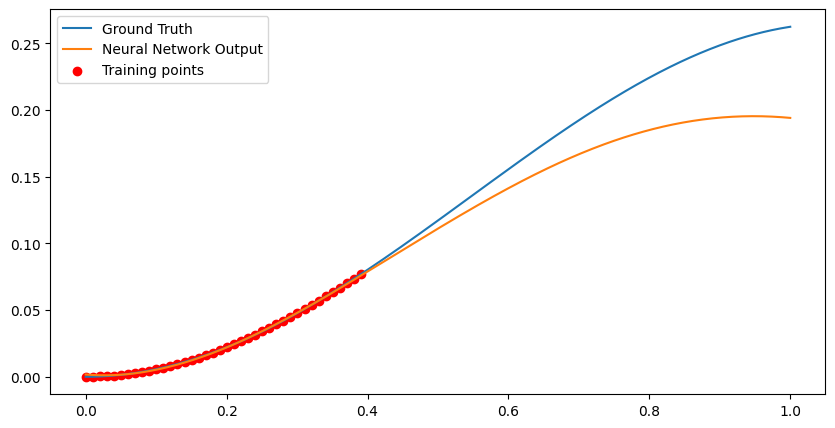

Loss at Step 2460 : 0.00017587440379429609
Epoch 2460, Total Data Processed: 12595200


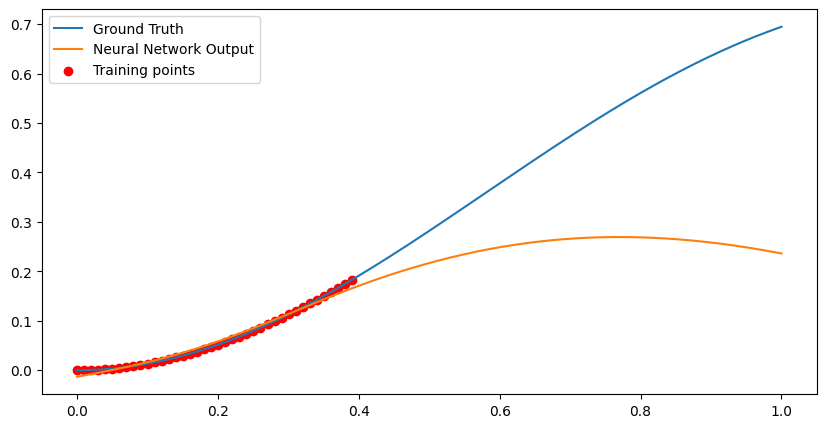

Loss at Step 2470 : 0.00015012196672614664
Epoch 2470, Total Data Processed: 12646400


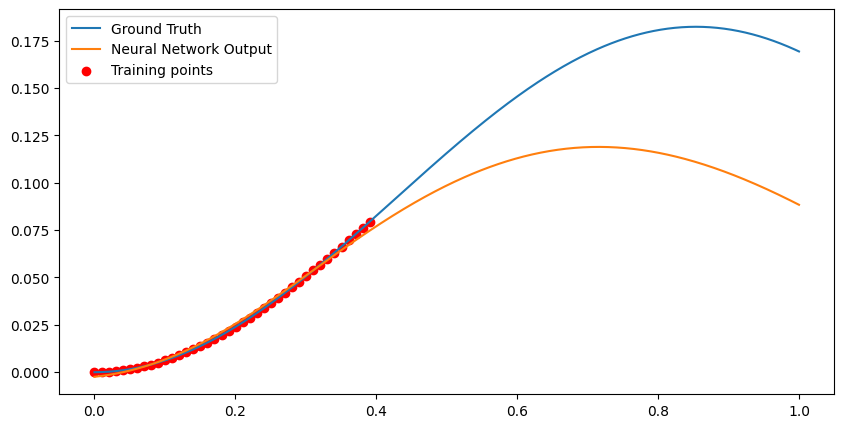

Loss at Step 2480 : 0.00010312865197192878
Epoch 2480, Total Data Processed: 12697600


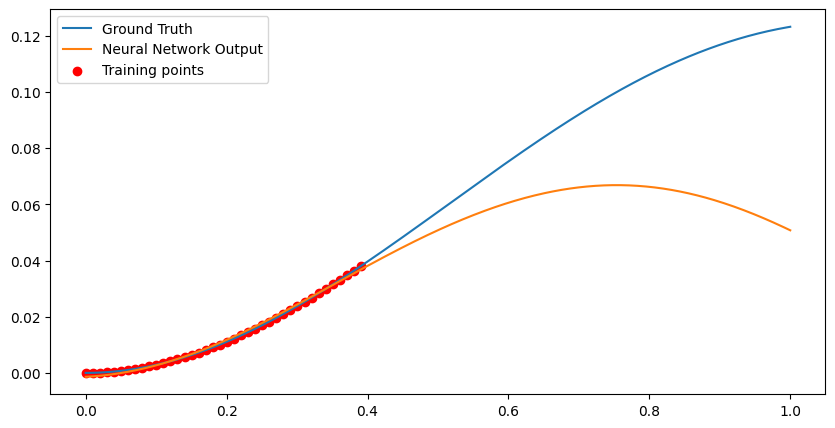

Loss at Step 2490 : 3.9866590668680146e-05
Epoch 2490, Total Data Processed: 12748800


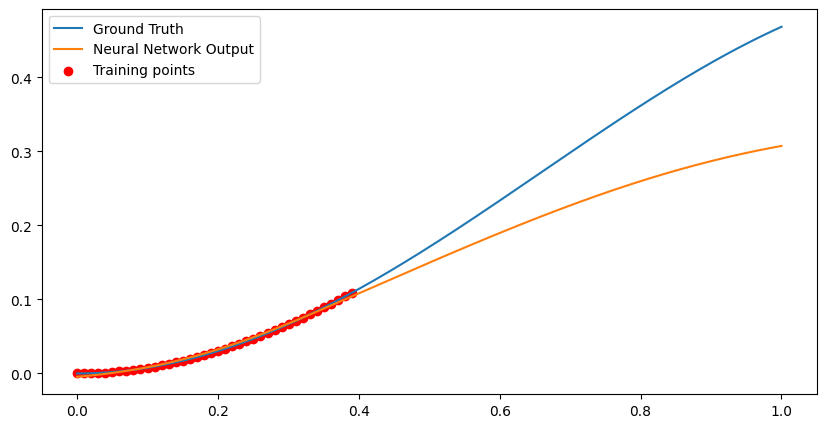

Epoch 2500, Variance: 1.0648272109392565e-05, Loss Change: 1.48948186655673e-05
Loss at Step 2500 : 5.4639331210637465e-05
Epoch 2500, Total Data Processed: 12800000


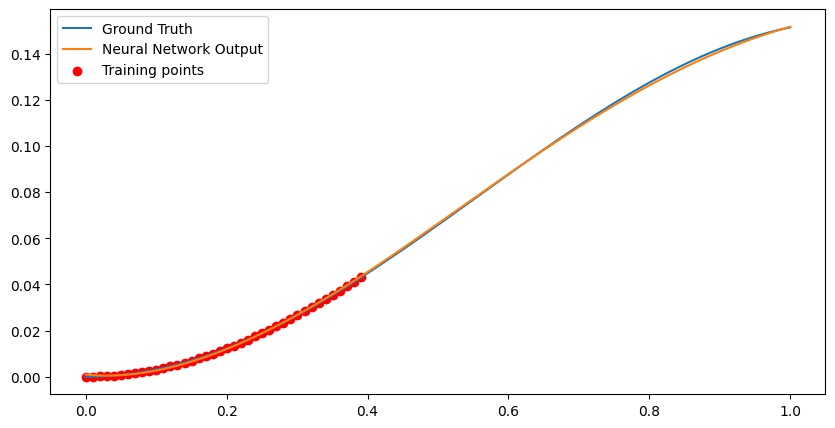

Loss at Step 2510 : 0.00021383292914833874
Epoch 2510, Total Data Processed: 12851200


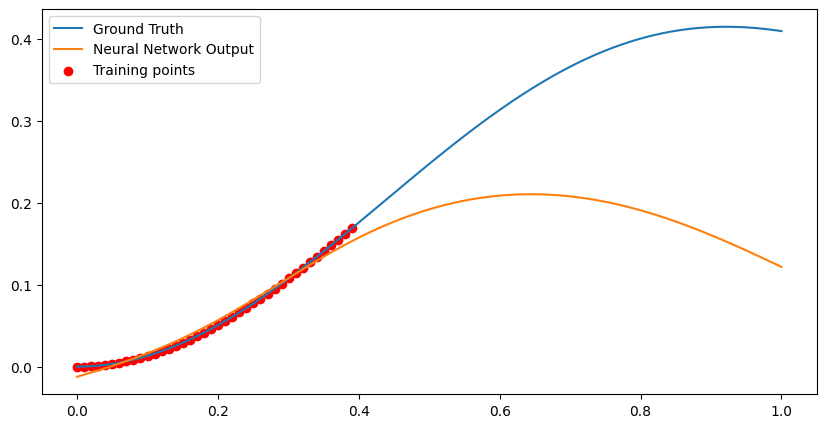

Loss at Step 2520 : 0.00011194511171197519
Epoch 2520, Total Data Processed: 12902400


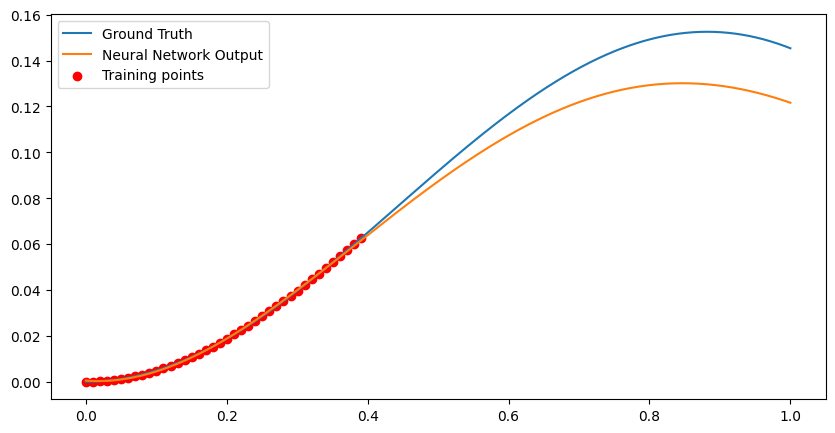

Loss at Step 2530 : 0.0001712870434857905
Epoch 2530, Total Data Processed: 12953600


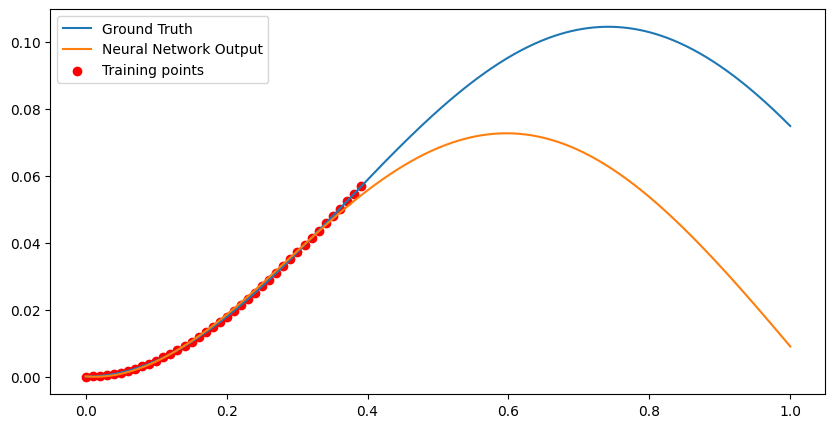

Loss at Step 2540 : 2.8166316042188555e-05
Epoch 2540, Total Data Processed: 13004800


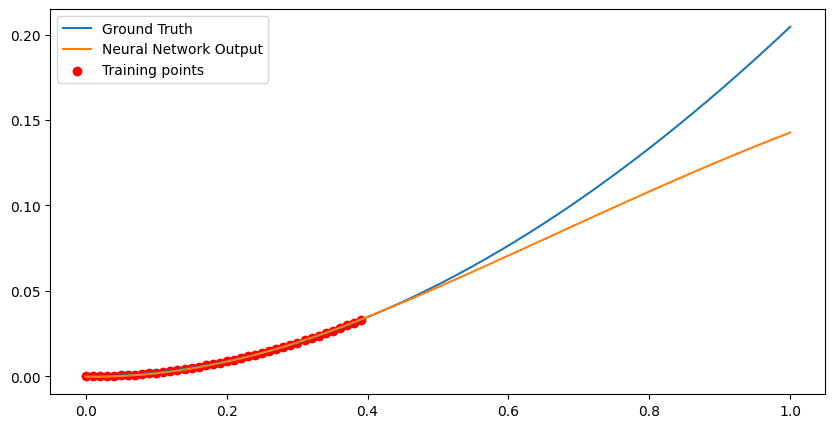

Loss at Step 2550 : 0.00011560025450307876
Epoch 2550, Total Data Processed: 13056000


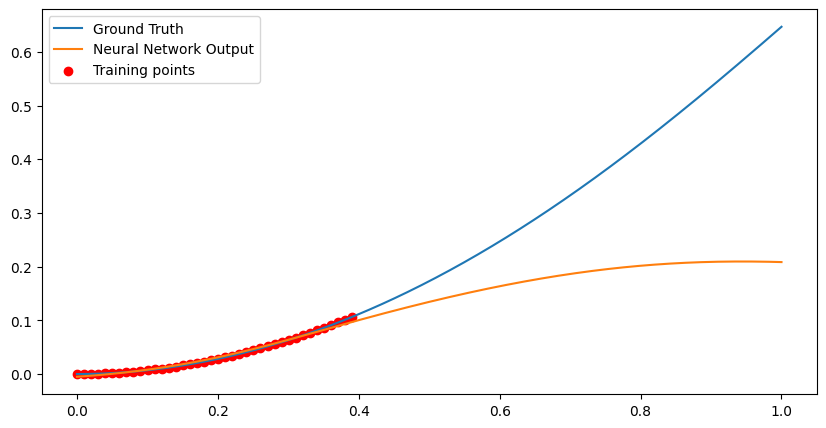

Loss at Step 2560 : 0.00020956434309482574
Epoch 2560, Total Data Processed: 13107200


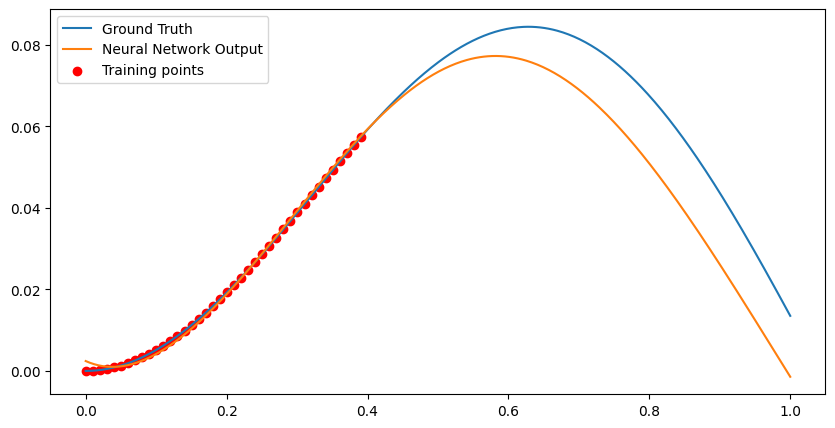

Loss at Step 2570 : 0.00020387909899000078
Epoch 2570, Total Data Processed: 13158400


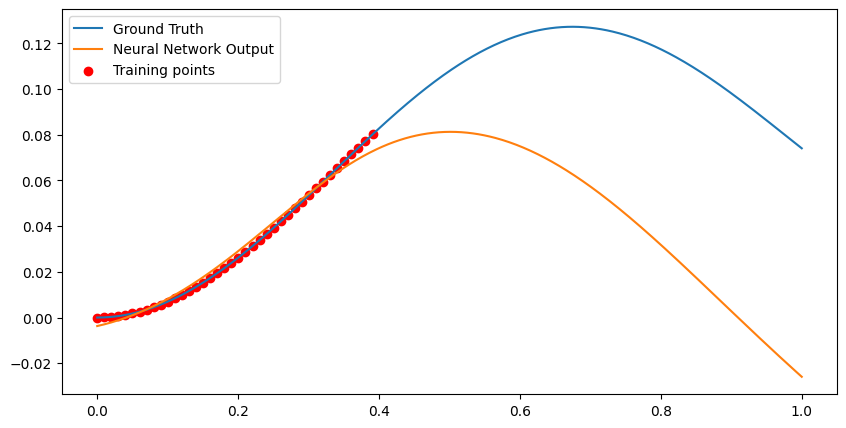

Loss at Step 2580 : 9.08749716472812e-05
Epoch 2580, Total Data Processed: 13209600


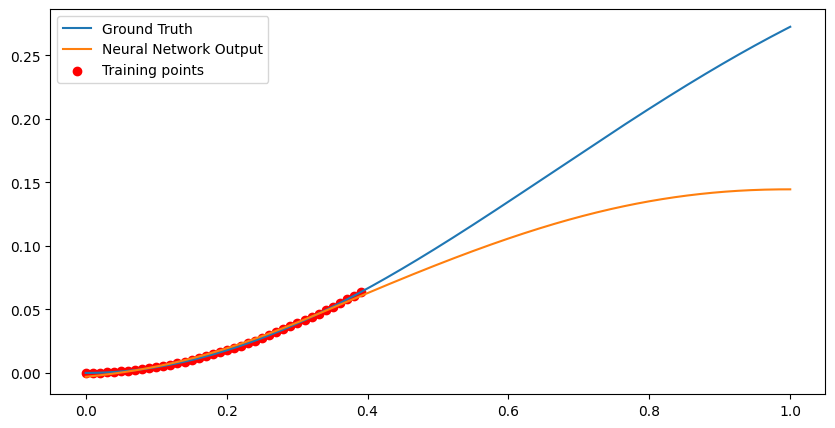

Loss at Step 2590 : 0.0002042201958829537
Epoch 2590, Total Data Processed: 13260800


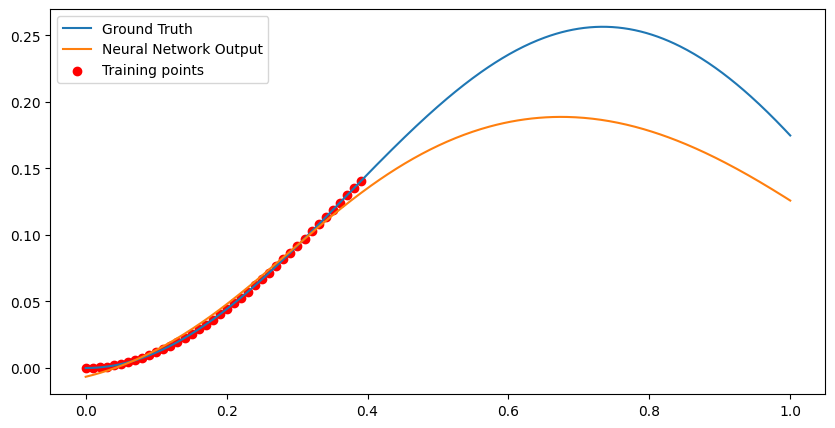

Epoch 2600, Variance: 1.0243435099255294e-05, Loss Change: 1.5710925023171285e-06
Loss at Step 2600 : 0.00023059462546370924
Epoch 2600, Total Data Processed: 13312000


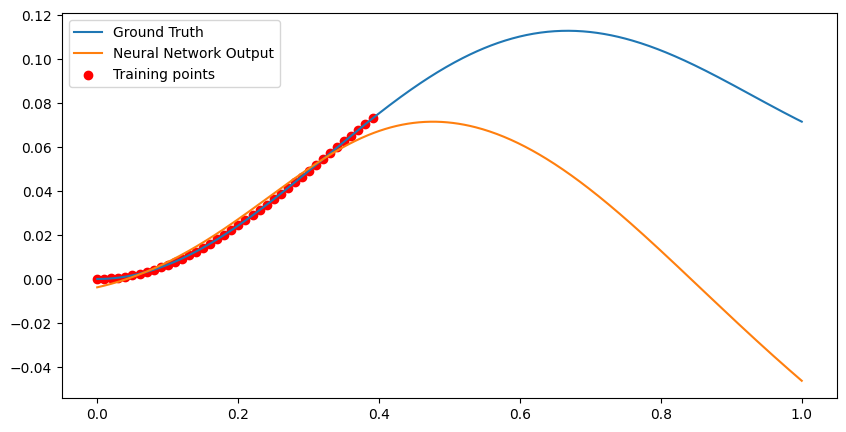

Loss at Step 2610 : 8.45805334392935e-05
Epoch 2610, Total Data Processed: 13363200


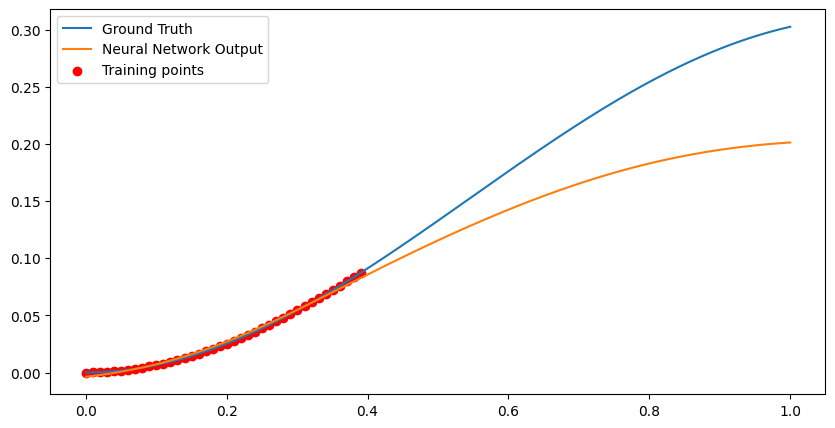

Loss at Step 2620 : 5.883790799998678e-05
Epoch 2620, Total Data Processed: 13414400


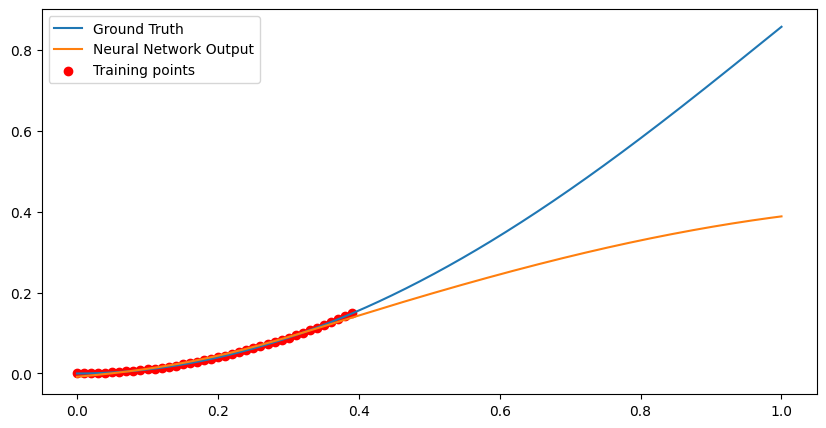

Loss at Step 2630 : 5.161779699847102e-05
Epoch 2630, Total Data Processed: 13465600


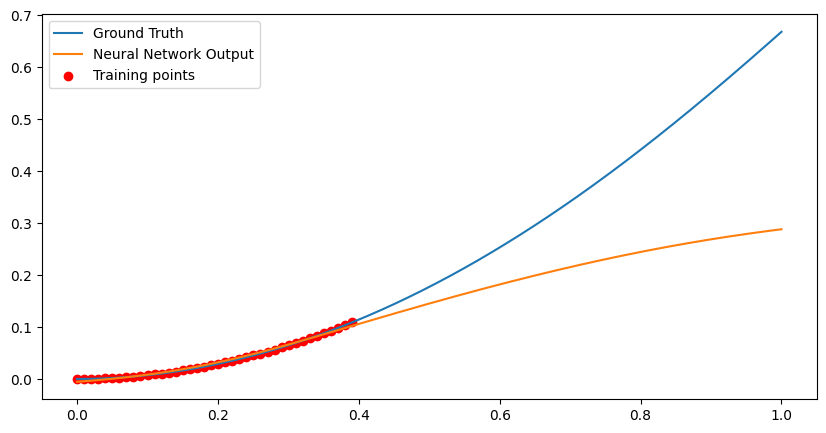

Loss at Step 2640 : 2.9807513783453032e-05
Epoch 2640, Total Data Processed: 13516800


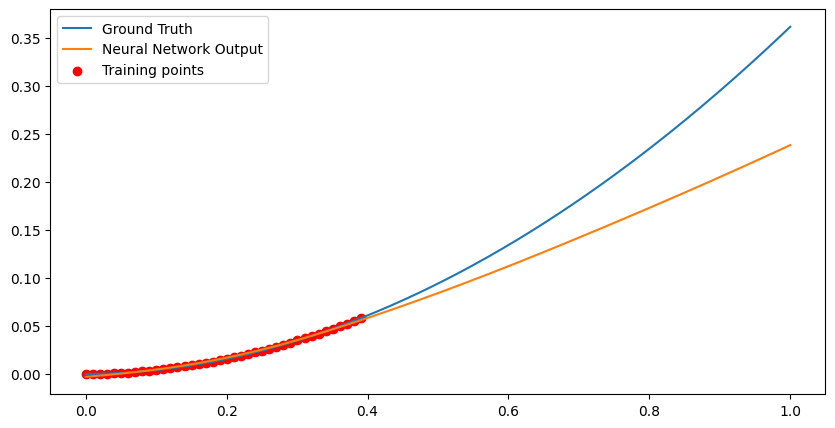

Loss at Step 2650 : 0.00013411740656010807
Epoch 2650, Total Data Processed: 13568000


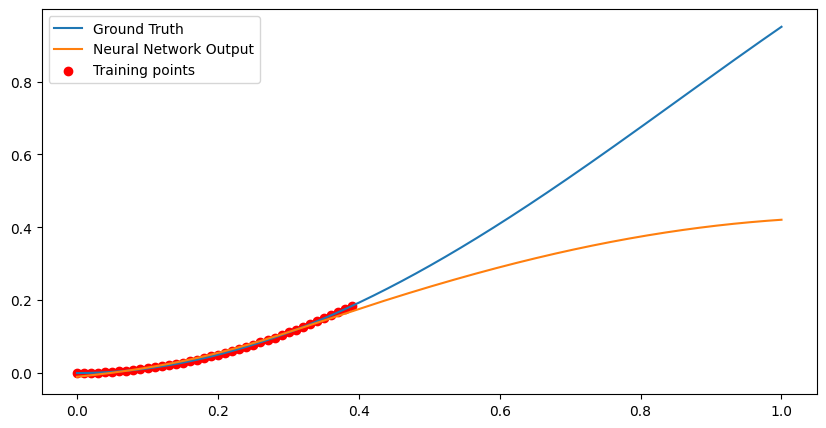

Loss at Step 2660 : 0.00012263323878869414
Epoch 2660, Total Data Processed: 13619200


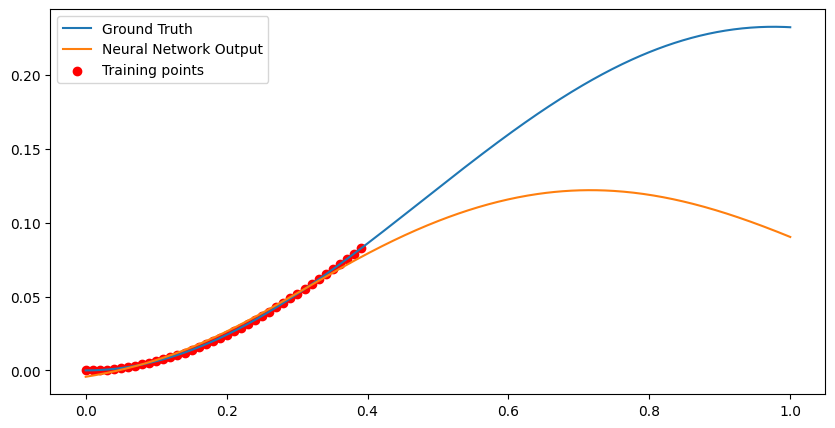

Loss at Step 2670 : 3.9676731830695644e-05
Epoch 2670, Total Data Processed: 13670400


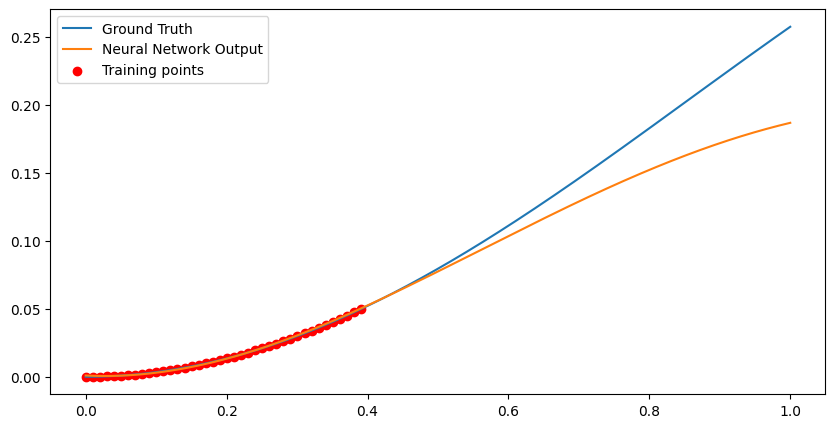

Loss at Step 2680 : 0.00020633316307794303
Epoch 2680, Total Data Processed: 13721600


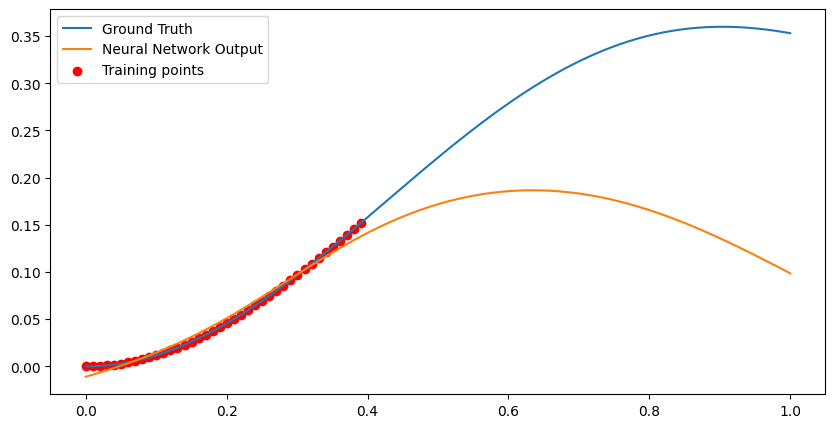

Loss at Step 2690 : 0.0001251966750714928
Epoch 2690, Total Data Processed: 13772800


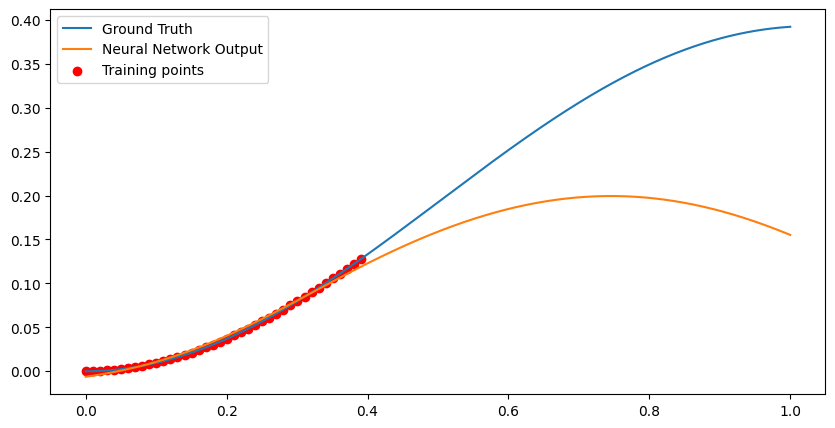

Epoch 2700, Variance: 9.720124580780976e-06, Loss Change: 7.984689460727168e-06
Loss at Step 2700 : 9.964531636796892e-05
Epoch 2700, Total Data Processed: 13824000


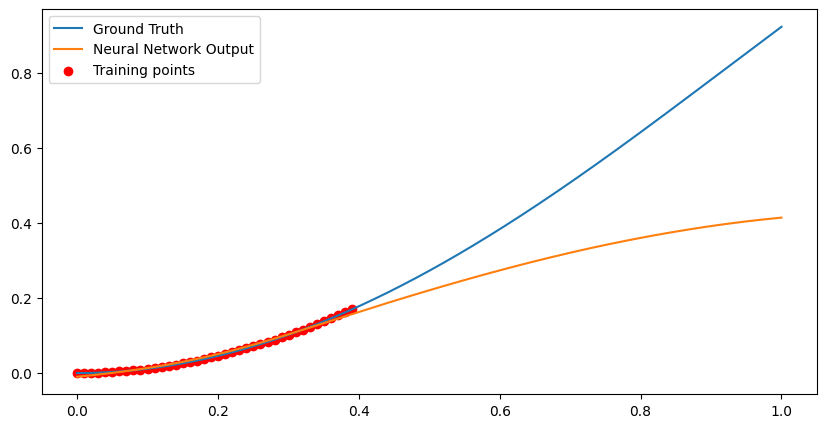

Loss at Step 2710 : 0.00021918014681432396
Epoch 2710, Total Data Processed: 13875200


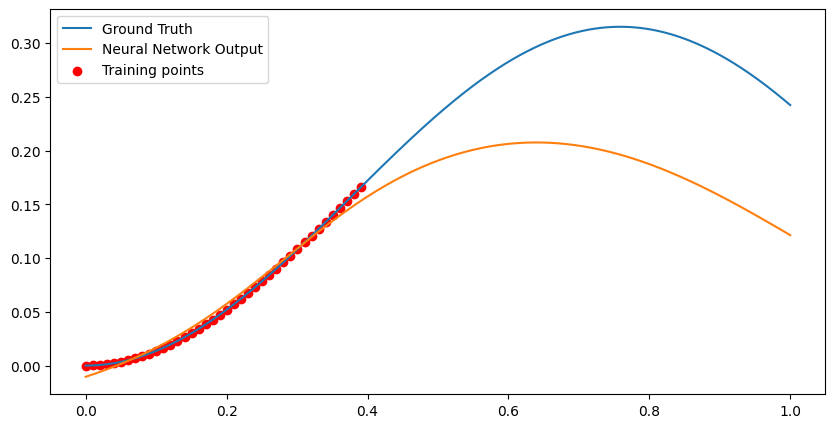

Loss at Step 2720 : 5.5119176977314055e-05
Epoch 2720, Total Data Processed: 13926400


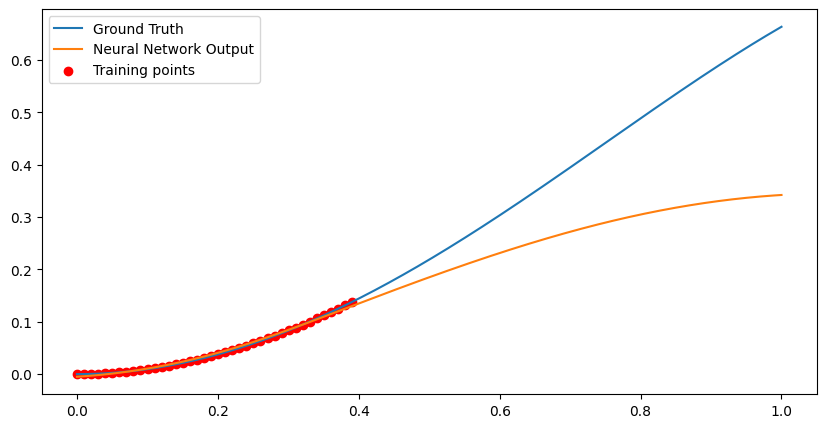

Loss at Step 2730 : 7.951261795824394e-05
Epoch 2730, Total Data Processed: 13977600


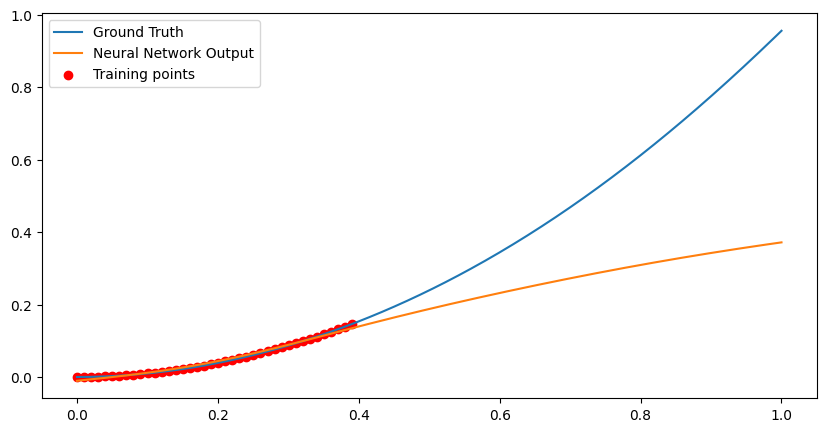

Loss at Step 2740 : 0.00017264379130210727
Epoch 2740, Total Data Processed: 14028800


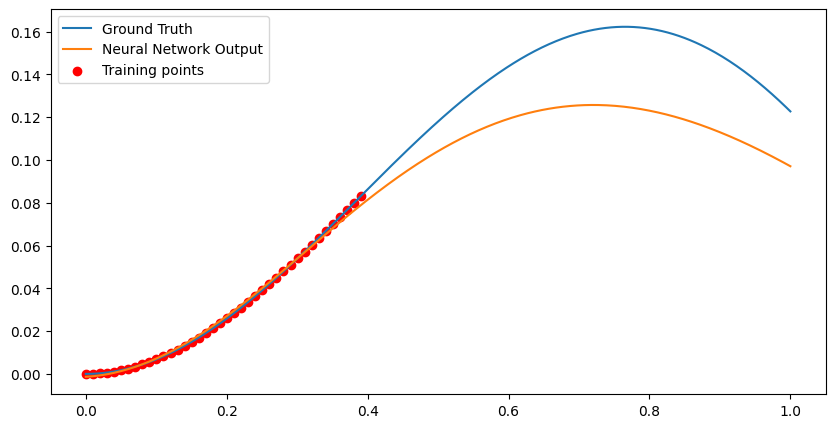

Loss at Step 2750 : 7.718758570263162e-05
Epoch 2750, Total Data Processed: 14080000


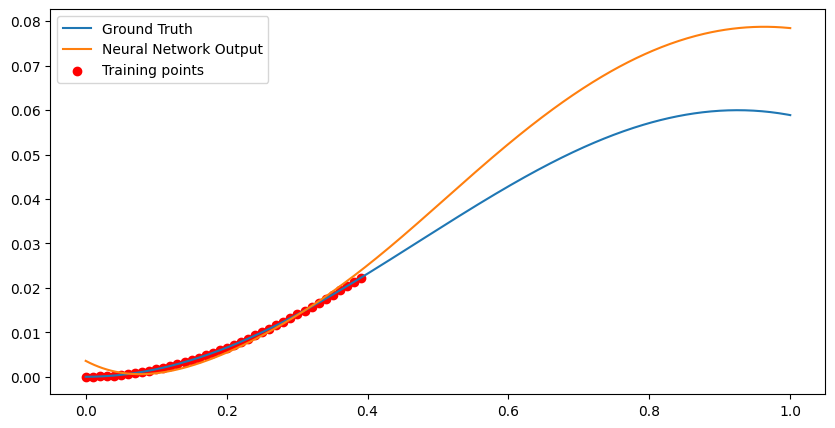

Loss at Step 2760 : 2.34956150961807e-05
Epoch 2760, Total Data Processed: 14131200


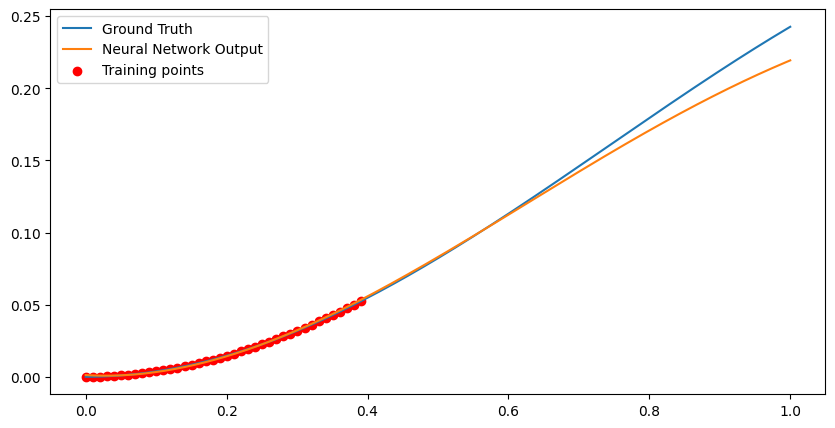

Loss at Step 2770 : 5.611405140371062e-05
Epoch 2770, Total Data Processed: 14182400


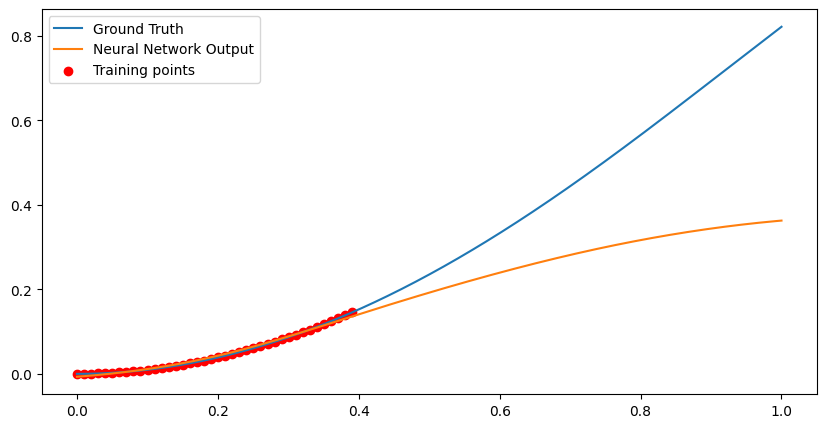

Loss at Step 2780 : 0.00012098353181499988
Epoch 2780, Total Data Processed: 14233600


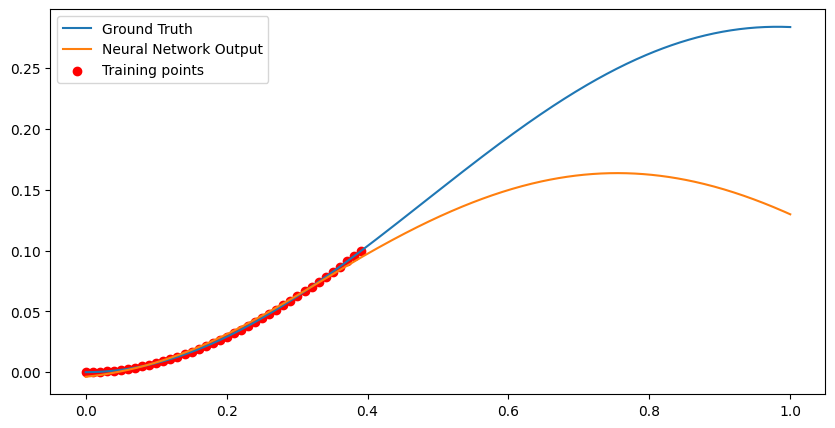

Loss at Step 2790 : 3.4181099181296304e-05
Epoch 2790, Total Data Processed: 14284800


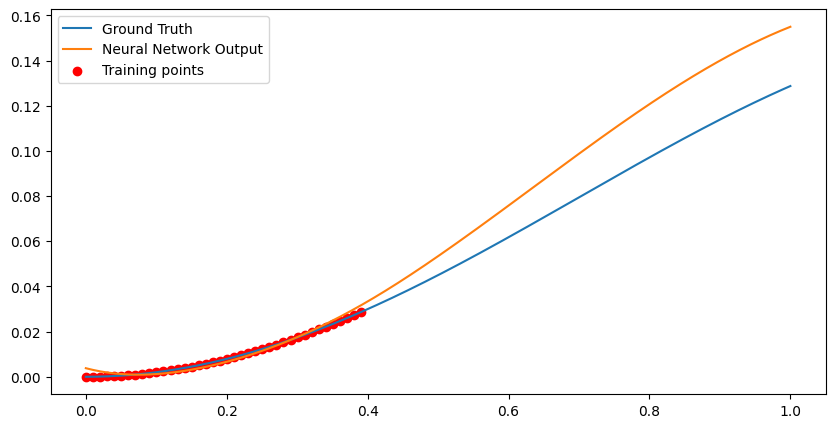

Epoch 2800, Variance: 1.2224627425894141e-05, Loss Change: 1.1585936311675482e-05
Loss at Step 2800 : 0.0001092881357180886
Epoch 2800, Total Data Processed: 14336000


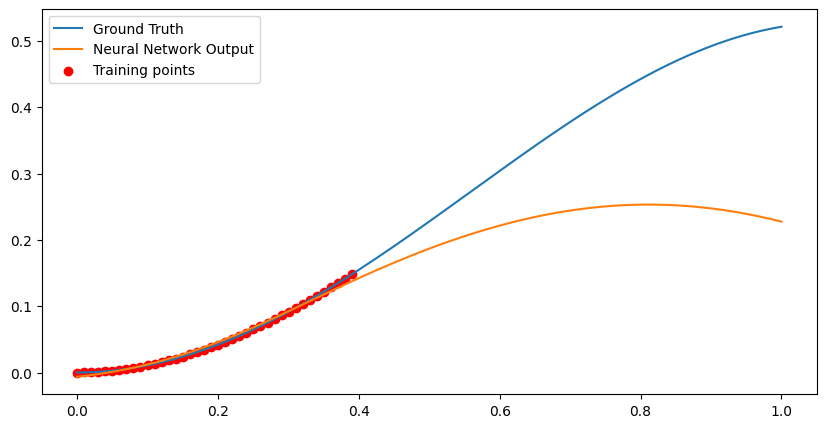

Loss at Step 2810 : 0.0001519028446637094
Epoch 2810, Total Data Processed: 14387200


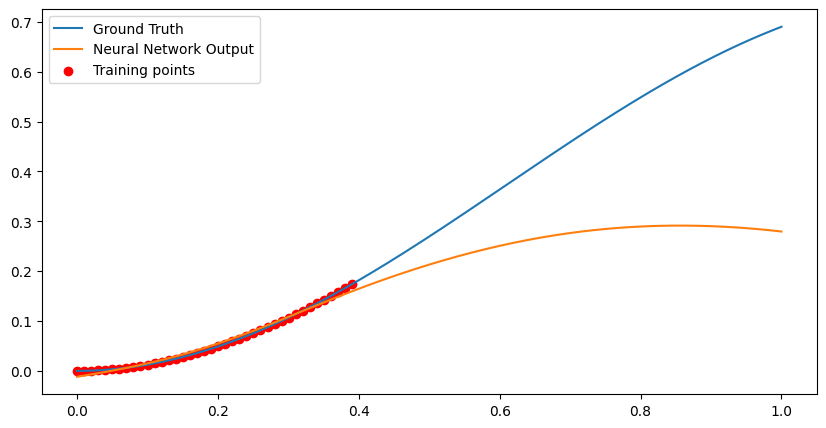

Loss at Step 2820 : 0.00016698677791282535
Epoch 2820, Total Data Processed: 14438400


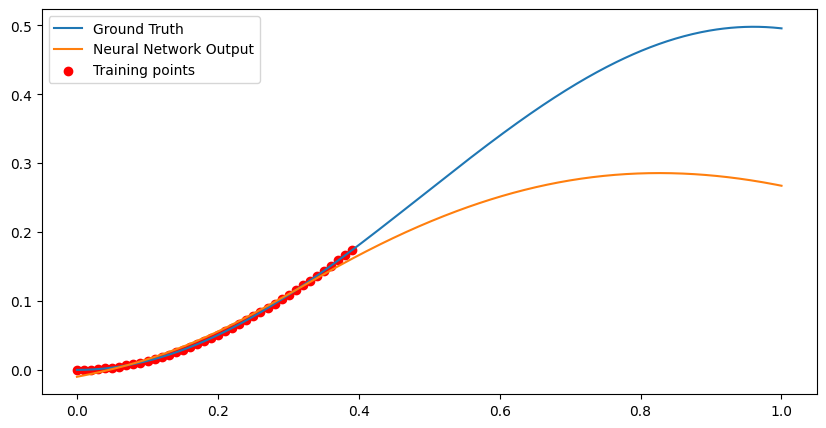

Loss at Step 2830 : 0.00018643111980054528
Epoch 2830, Total Data Processed: 14489600


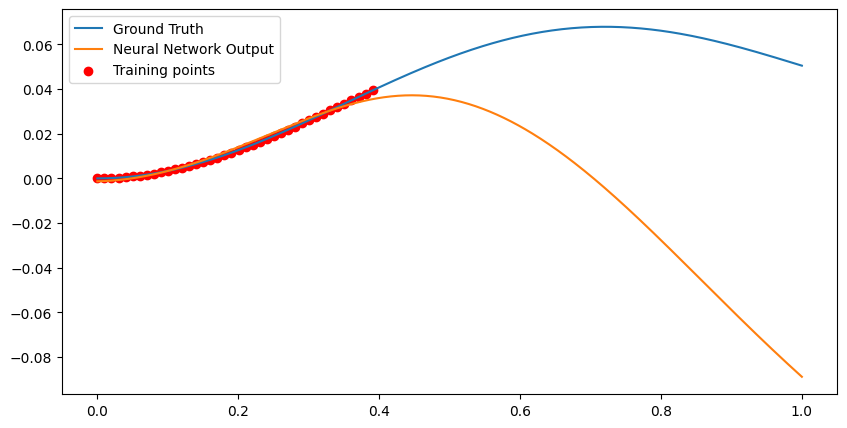

Loss at Step 2840 : 4.838822496822104e-05
Epoch 2840, Total Data Processed: 14540800


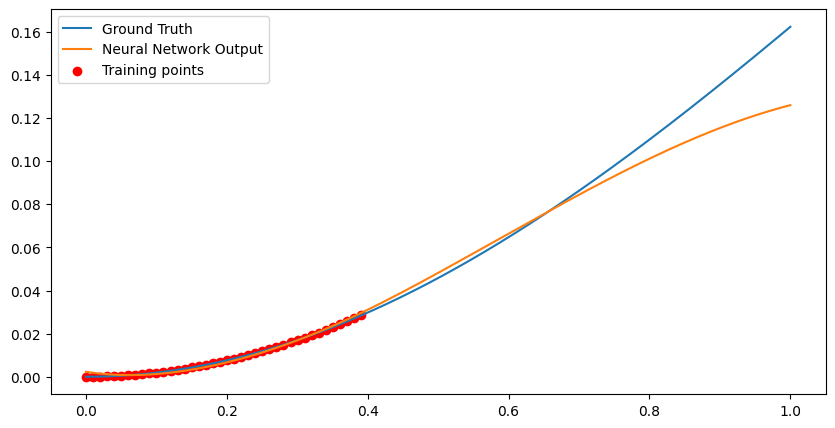

Loss at Step 2850 : 0.0002263300120830536
Epoch 2850, Total Data Processed: 14592000


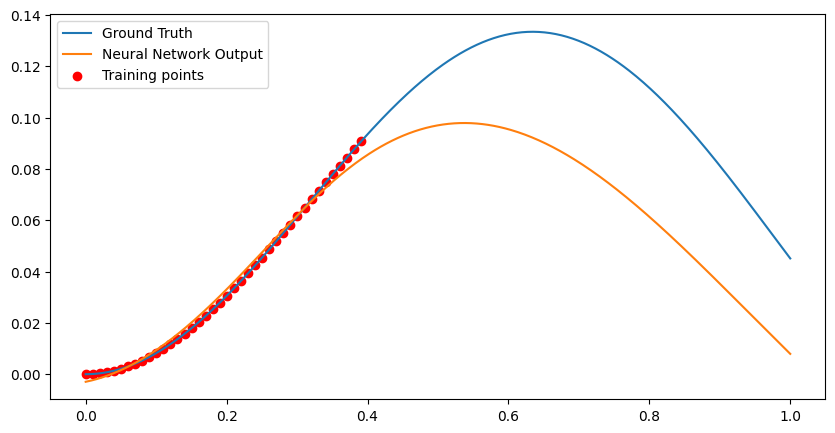

Loss at Step 2860 : 0.00016660516848787665
Epoch 2860, Total Data Processed: 14643200


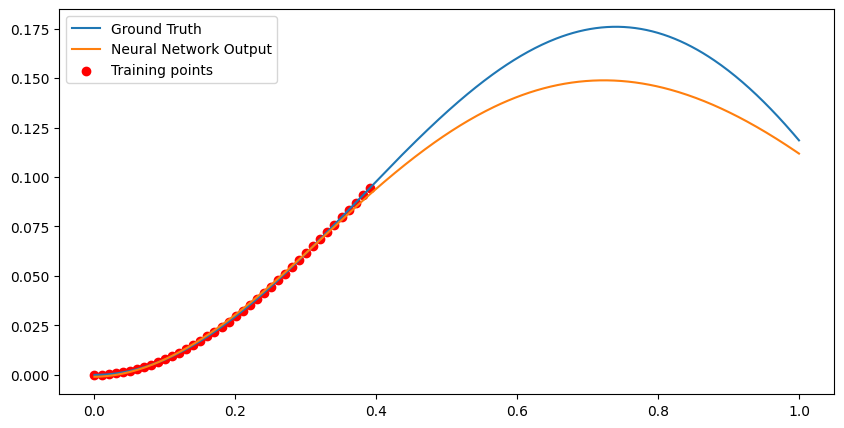

Loss at Step 2870 : 0.00023244837939273566
Epoch 2870, Total Data Processed: 14694400


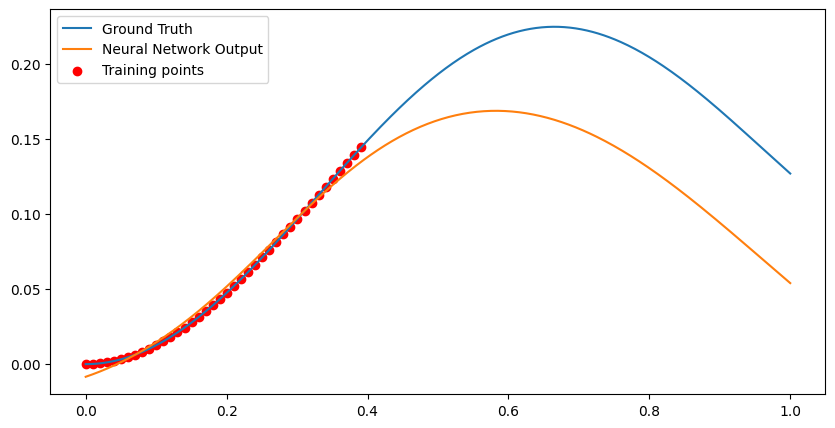

Loss at Step 2880 : 7.083560194587335e-05
Epoch 2880, Total Data Processed: 14745600


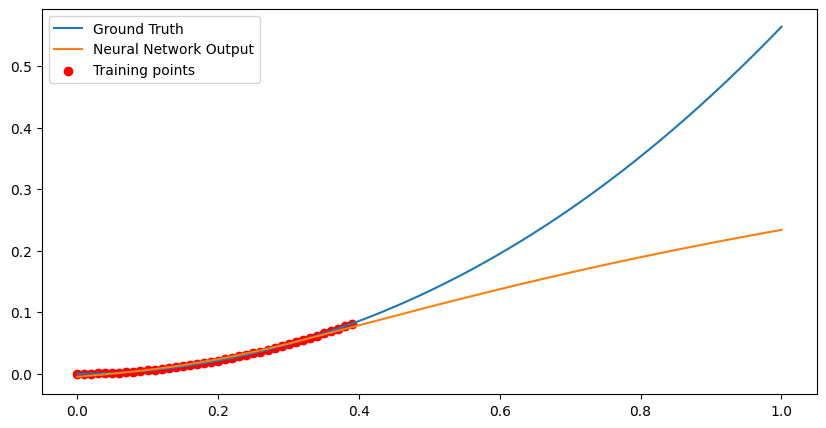

Loss at Step 2890 : 0.0001342897885479033
Epoch 2890, Total Data Processed: 14796800


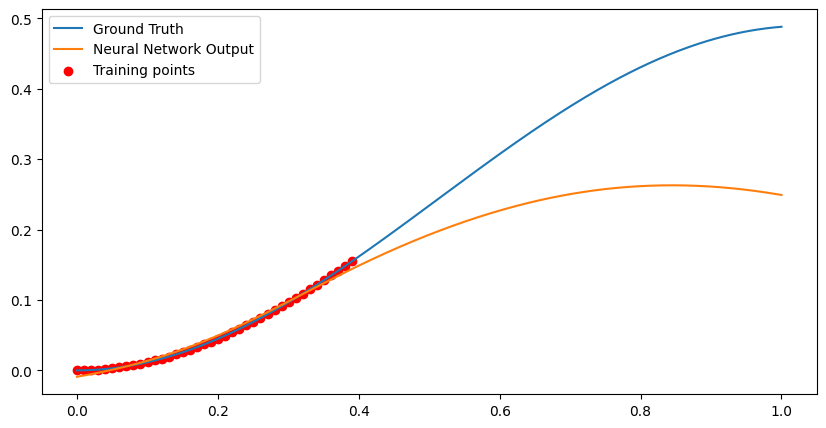

Epoch 2900, Variance: 8.87510941538494e-06, Loss Change: 2.4008500282945988e-05
Loss at Step 2900 : 3.4544220397947356e-05
Epoch 2900, Total Data Processed: 14848000


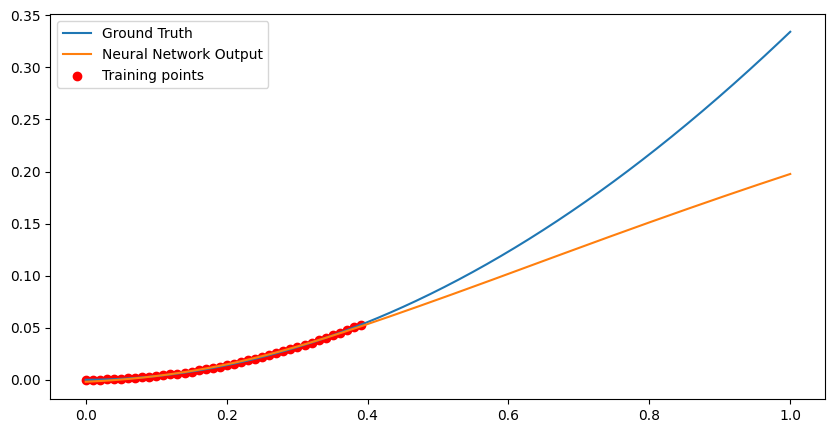

Loss at Step 2910 : 0.0001933016028488055
Epoch 2910, Total Data Processed: 14899200


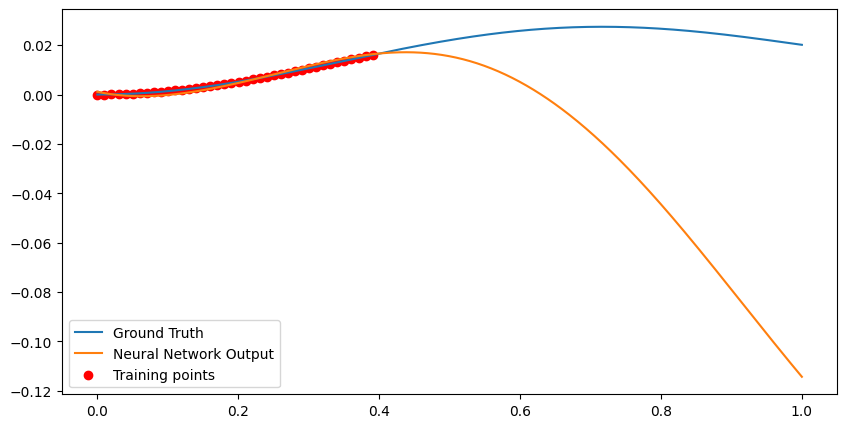

Loss at Step 2920 : 4.724927930510603e-05
Epoch 2920, Total Data Processed: 14950400


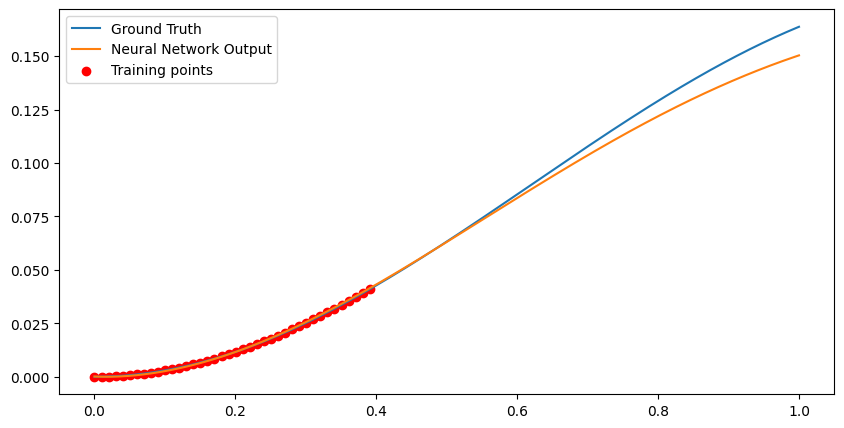

Loss at Step 2930 : 0.00012936758866999298
Epoch 2930, Total Data Processed: 15001600


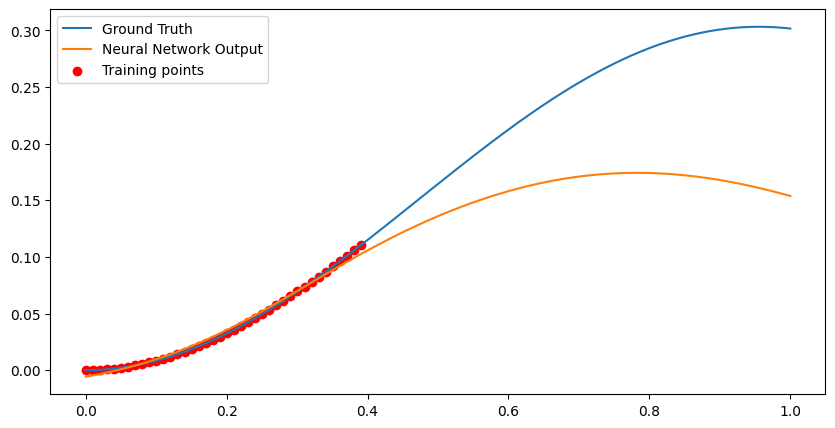

Loss at Step 2940 : 7.682691830268595e-06
Epoch 2940, Total Data Processed: 15052800


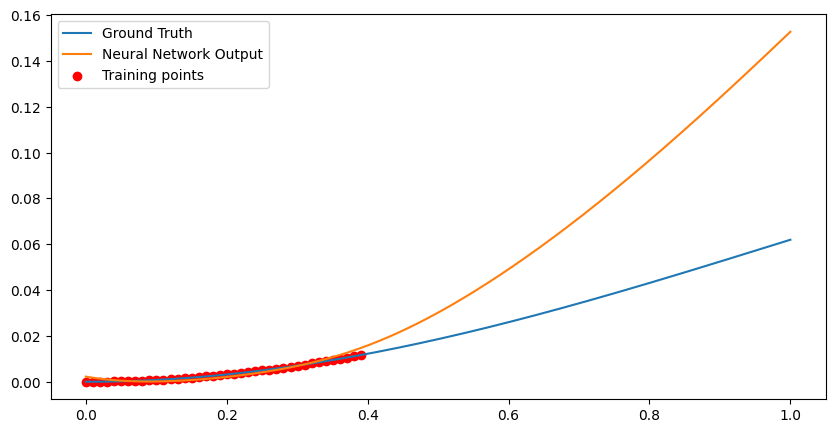

Loss at Step 2950 : 0.00018014157831203192
Epoch 2950, Total Data Processed: 15104000


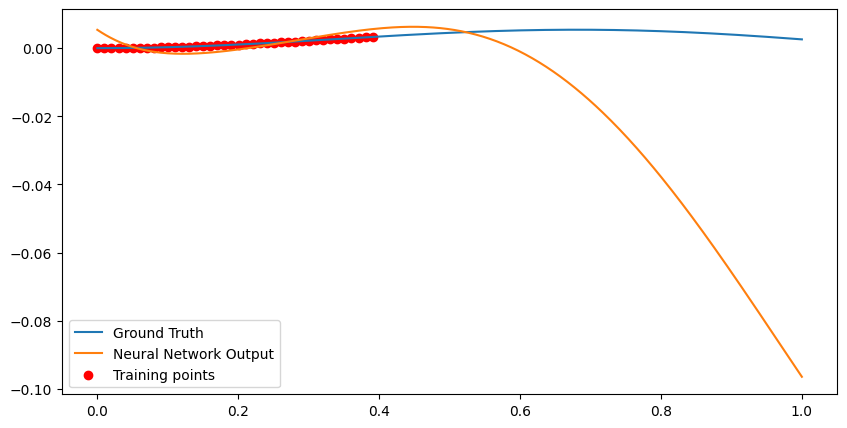

Loss at Step 2960 : 0.0002058936224784702
Epoch 2960, Total Data Processed: 15155200


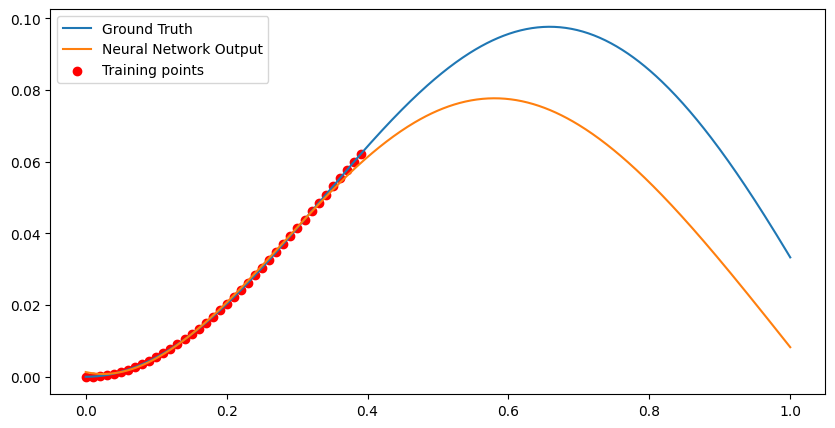

Loss at Step 2970 : 0.00017225065676029772
Epoch 2970, Total Data Processed: 15206400


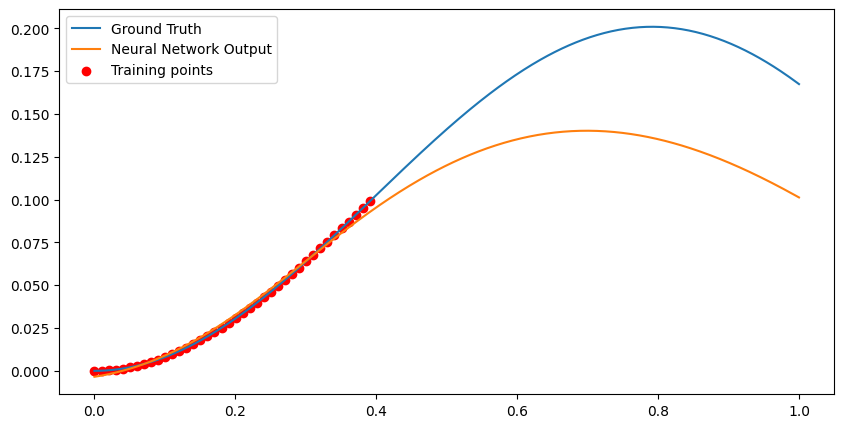

Loss at Step 2980 : 2.2660096874460578e-05
Epoch 2980, Total Data Processed: 15257600


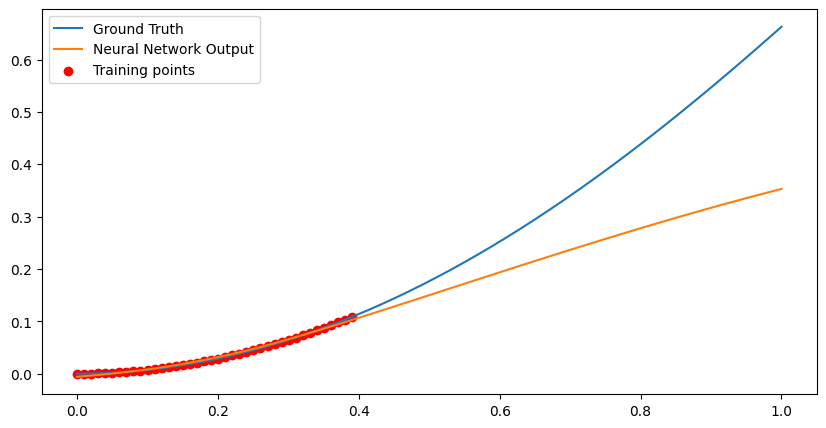

Loss at Step 2990 : 8.288167009595782e-05
Epoch 2990, Total Data Processed: 15308800


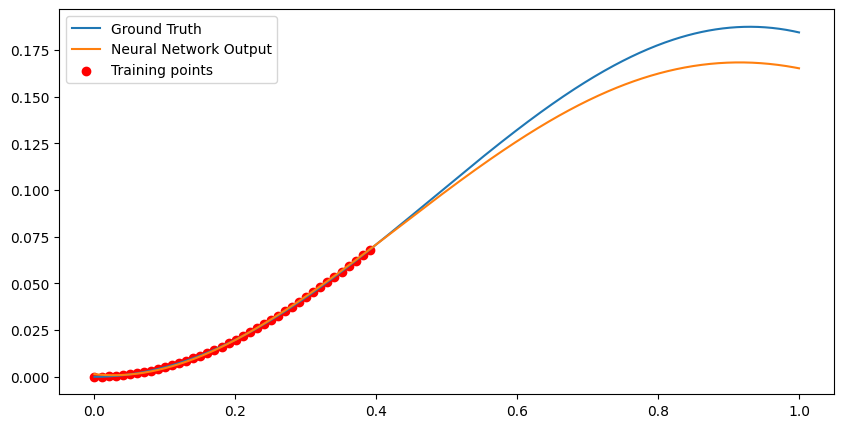

Epoch 3000, Variance: 1.2052458259859122e-05, Loss Change: 9.10960243061254e-06
Loss at Step 3000 : 0.0001626423909328878
Epoch 3000, Total Data Processed: 15360000


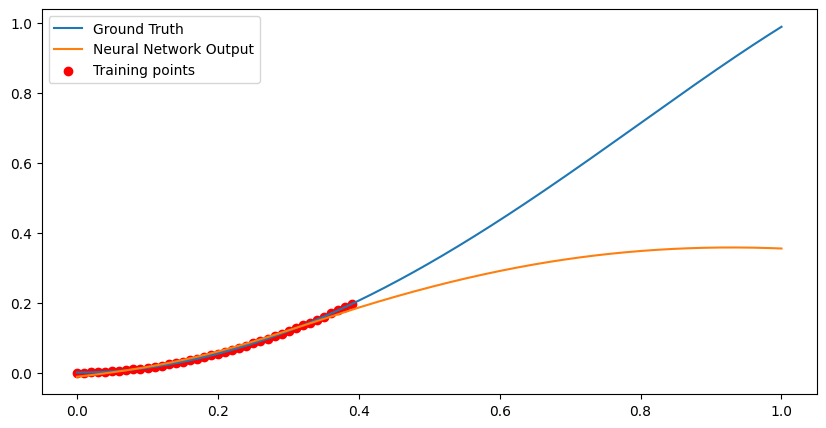

Loss at Step 3010 : 3.282068792032078e-05
Epoch 3010, Total Data Processed: 15411200


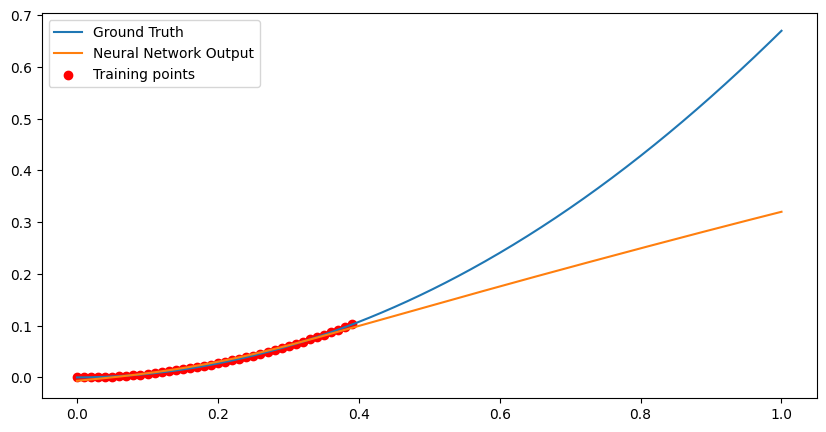

Loss at Step 3020 : 5.6949193094624206e-05
Epoch 3020, Total Data Processed: 15462400


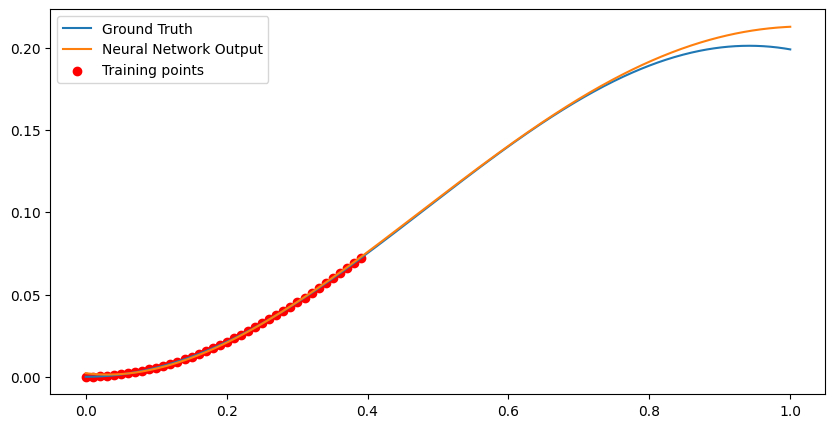

Loss at Step 3030 : 8.817230263957754e-05
Epoch 3030, Total Data Processed: 15513600


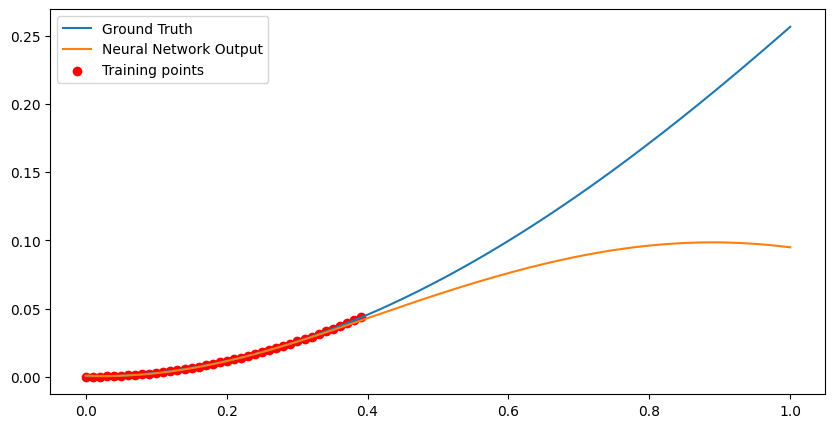

Loss at Step 3040 : 6.714963092235848e-05
Epoch 3040, Total Data Processed: 15564800


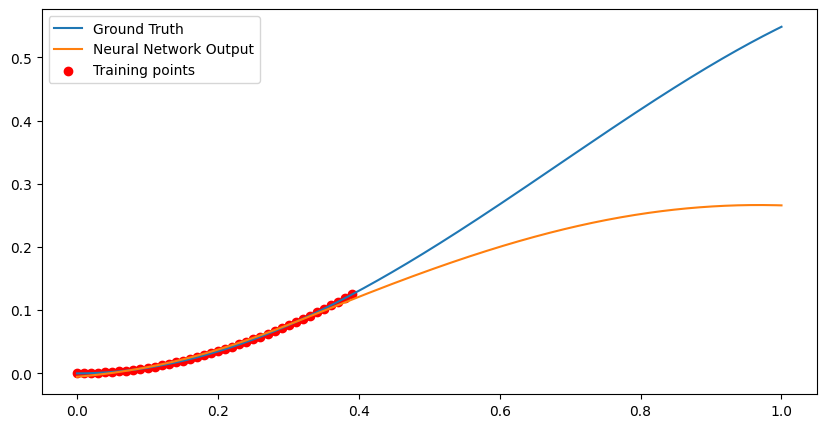

Loss at Step 3050 : 2.527753349568229e-05
Epoch 3050, Total Data Processed: 15616000


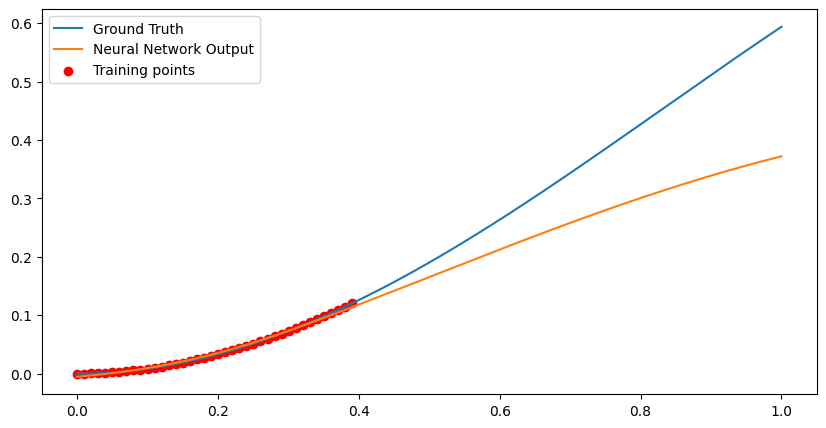

Loss at Step 3060 : 5.728498945245519e-05
Epoch 3060, Total Data Processed: 15667200


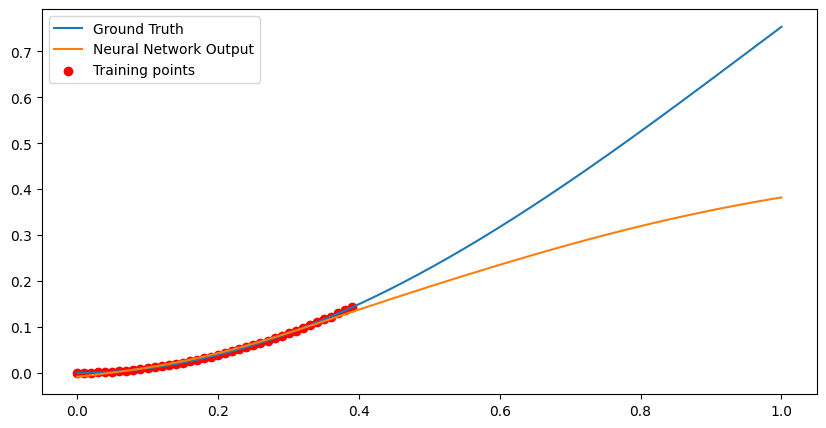

Loss at Step 3070 : 0.00011525046284077689
Epoch 3070, Total Data Processed: 15718400


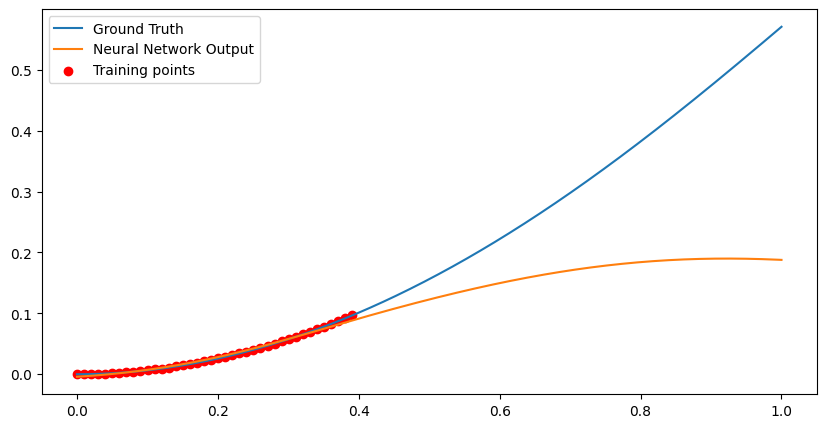

Loss at Step 3080 : 6.327544542727992e-05
Epoch 3080, Total Data Processed: 15769600


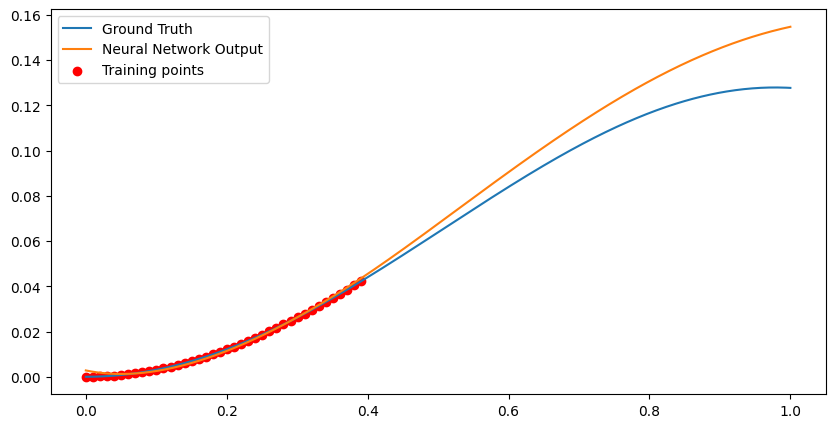

Loss at Step 3090 : 1.2939920452481601e-05
Epoch 3090, Total Data Processed: 15820800


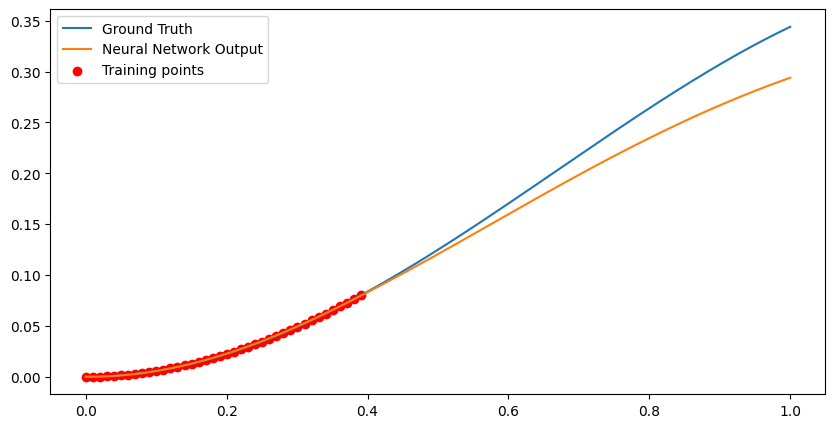

Epoch 3100, Variance: 1.129431439039763e-05, Loss Change: 1.0241459101223427e-05
Loss at Step 3100 : 5.5774988140910864e-05
Epoch 3100, Total Data Processed: 15872000


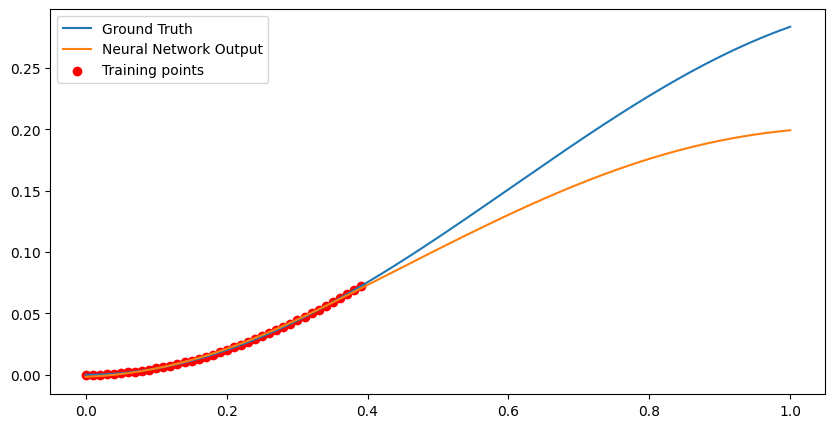

Loss at Step 3110 : 0.00019738334231078625
Epoch 3110, Total Data Processed: 15923200


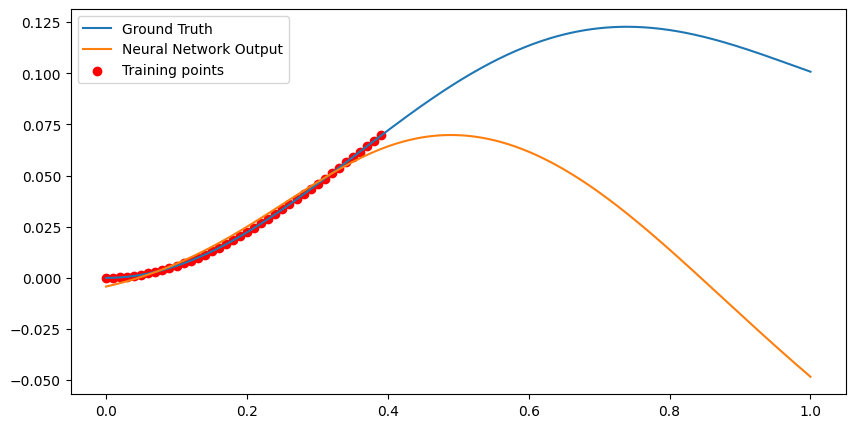

Loss at Step 3120 : 4.477163020055741e-05
Epoch 3120, Total Data Processed: 15974400


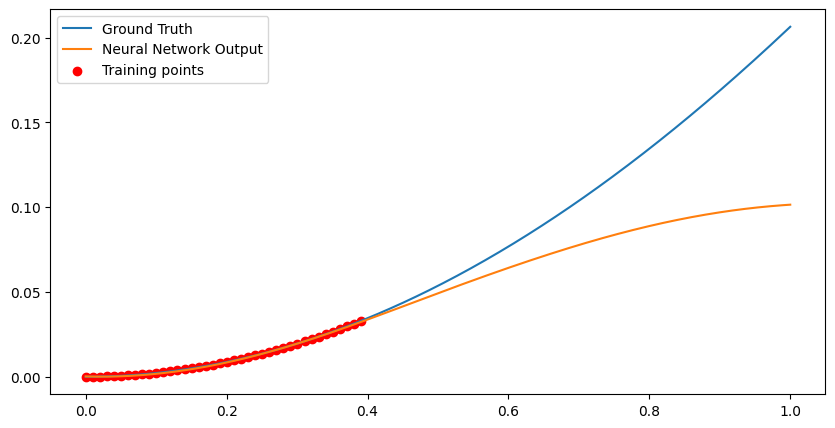

Loss at Step 3130 : 5.717445310438052e-05
Epoch 3130, Total Data Processed: 16025600


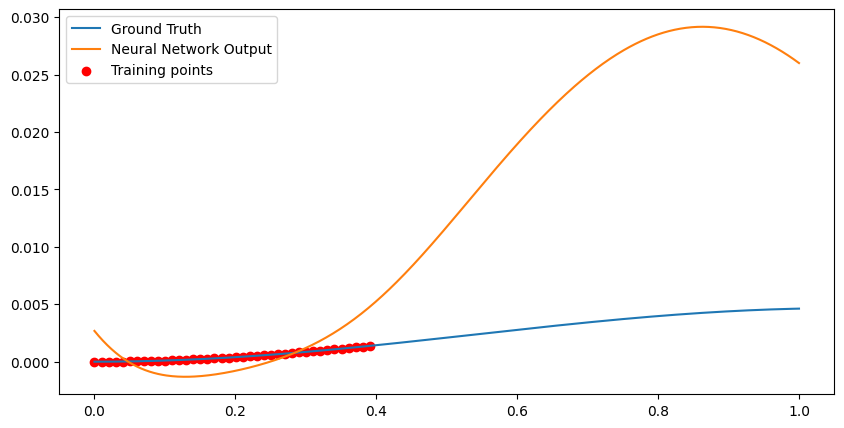

Loss at Step 3140 : 0.00016826500359456986
Epoch 3140, Total Data Processed: 16076800


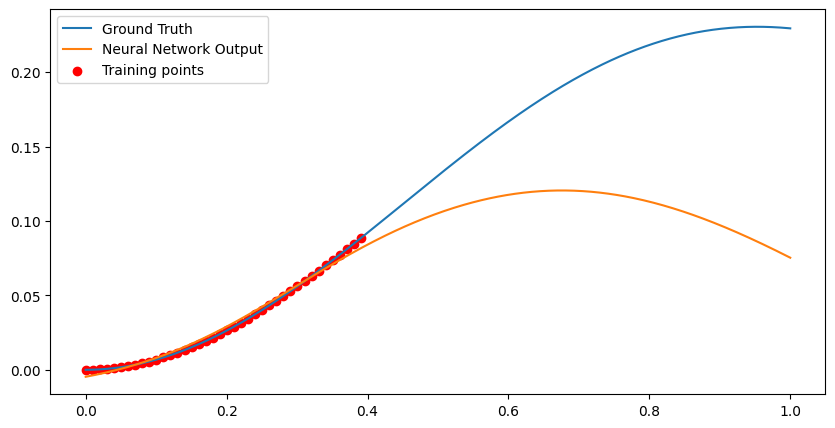

Loss at Step 3150 : 2.0798201148863882e-05
Epoch 3150, Total Data Processed: 16128000


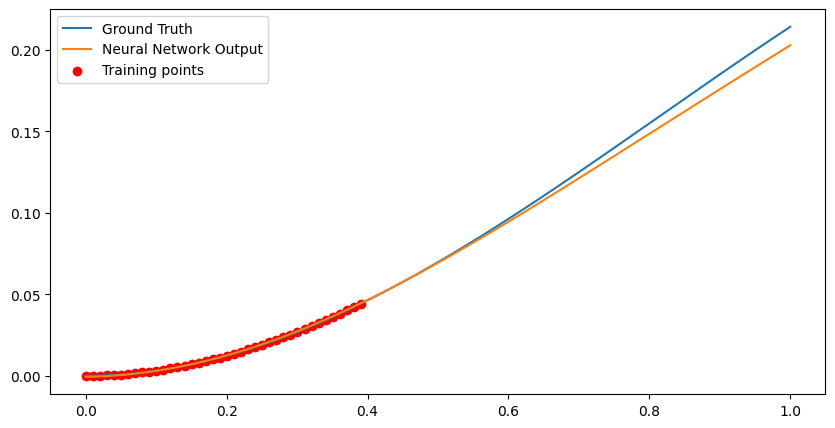

Loss at Step 3160 : 0.00017763320647645742
Epoch 3160, Total Data Processed: 16179200


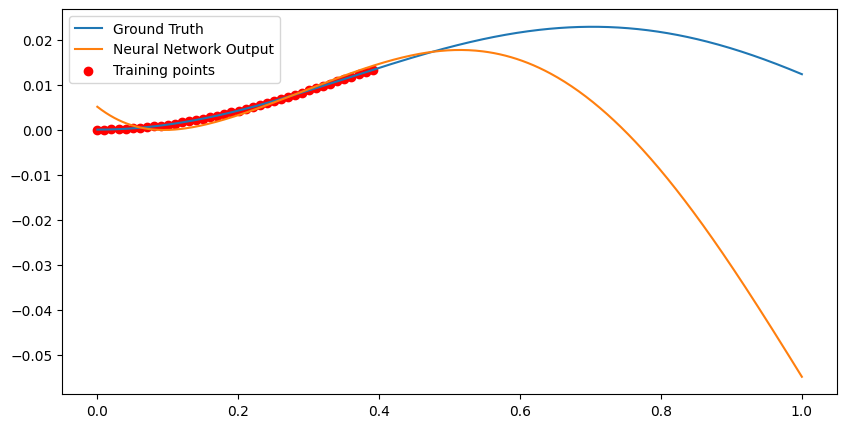

Loss at Step 3170 : 0.00015208528202492744
Epoch 3170, Total Data Processed: 16230400


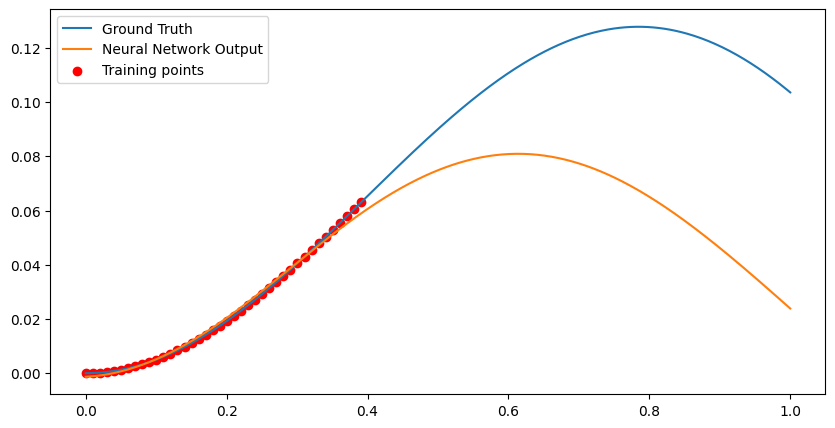

Loss at Step 3180 : 0.00012619525659829378
Epoch 3180, Total Data Processed: 16281600


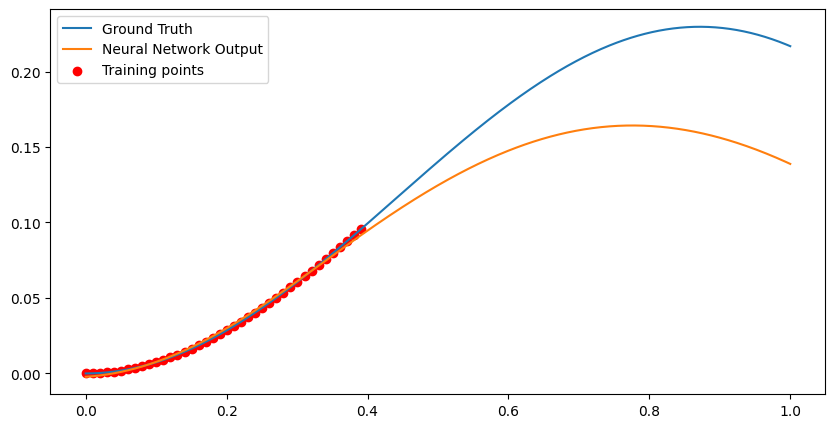

Loss at Step 3190 : 0.0002100796700688079
Epoch 3190, Total Data Processed: 16332800


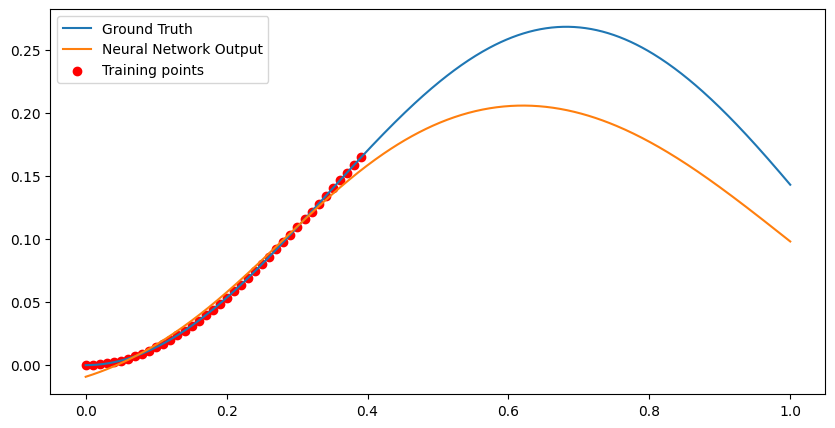

Epoch 3200, Variance: 1.1714694664988201e-05, Loss Change: 1.2008964574761194e-05
Loss at Step 3200 : 4.937151970807463e-05
Epoch 3200, Total Data Processed: 16384000


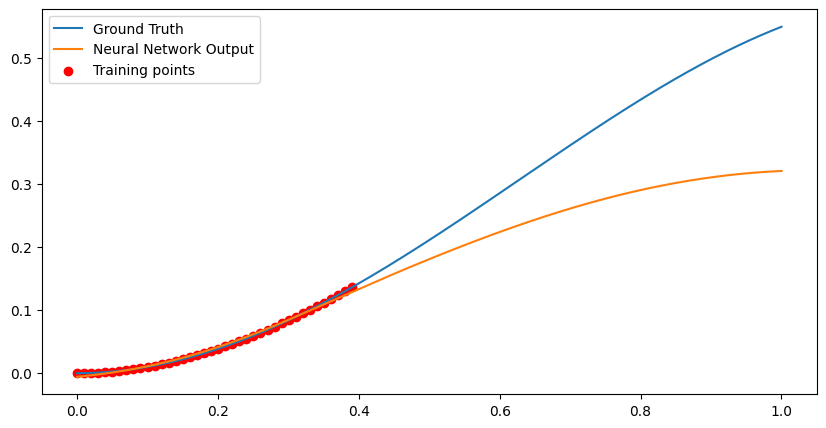

Loss at Step 3210 : 0.0001048917110892944
Epoch 3210, Total Data Processed: 16435200


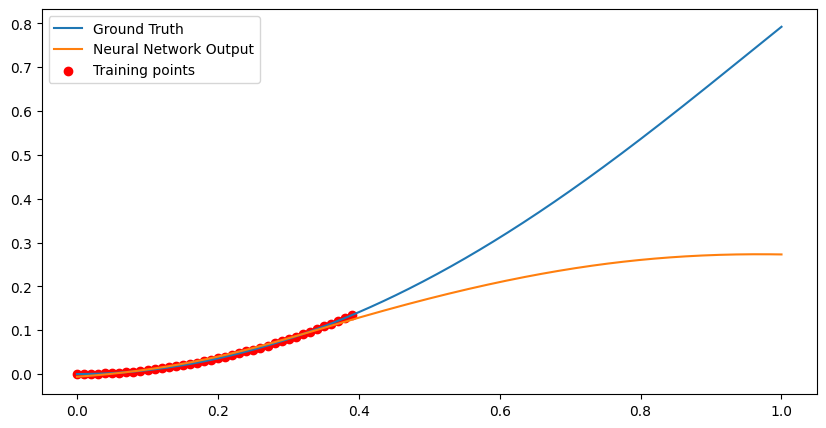

Loss at Step 3220 : 1.3142069292371161e-05
Epoch 3220, Total Data Processed: 16486400


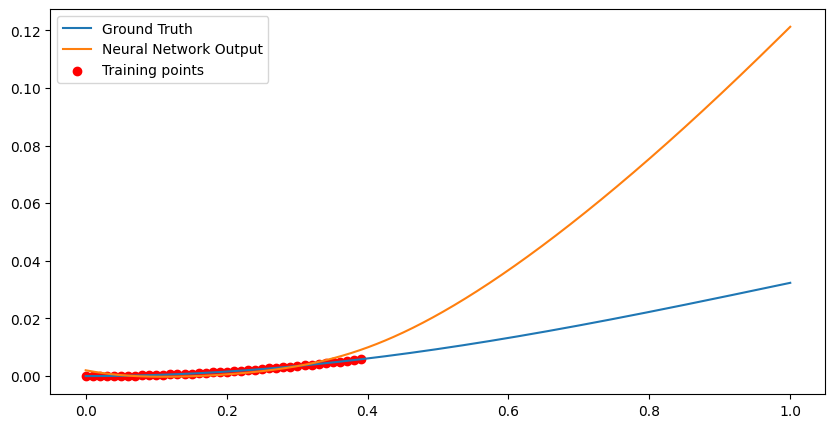

Loss at Step 3230 : 5.663348929374479e-05
Epoch 3230, Total Data Processed: 16537600


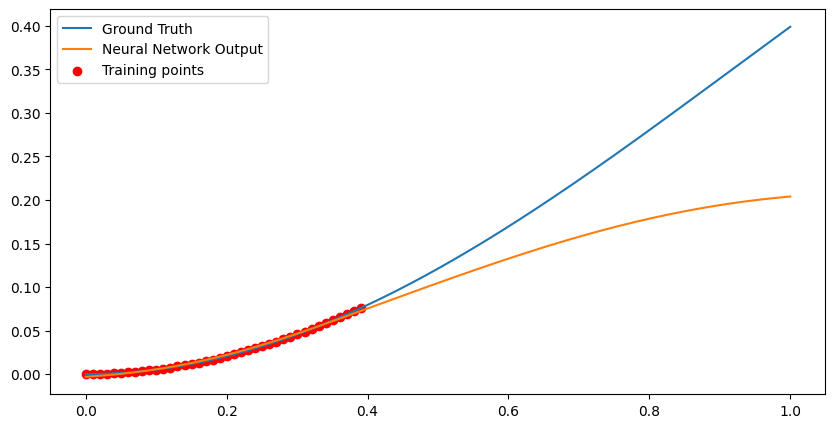

Loss at Step 3240 : 7.744596223346889e-05
Epoch 3240, Total Data Processed: 16588800


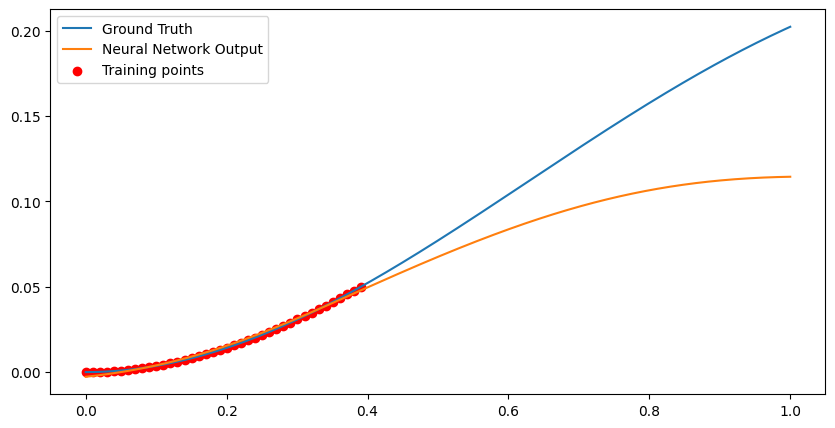

Loss at Step 3250 : 0.00010951844160445035
Epoch 3250, Total Data Processed: 16640000


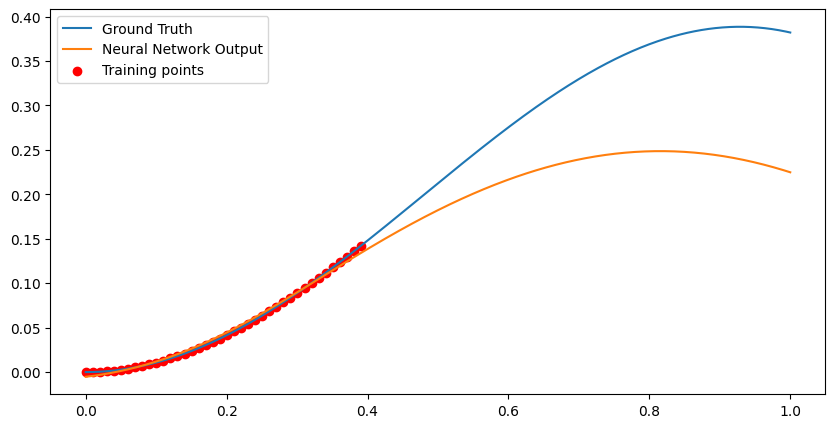

Loss at Step 3260 : 7.317068229895085e-05
Epoch 3260, Total Data Processed: 16691200


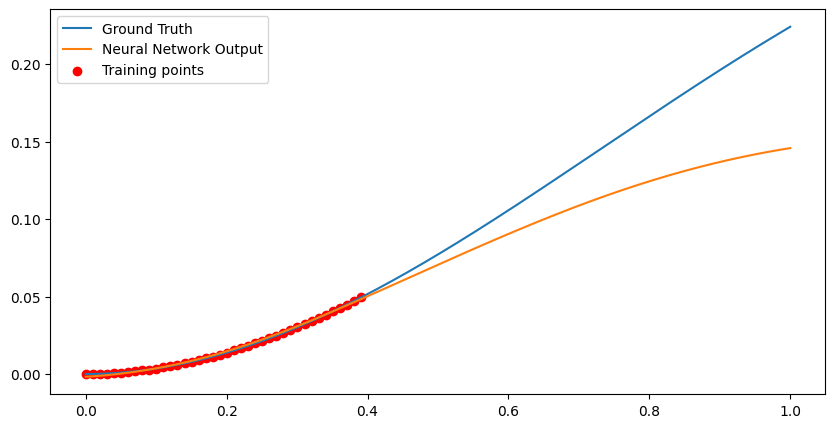

Loss at Step 3270 : 0.00015548503142781556
Epoch 3270, Total Data Processed: 16742400


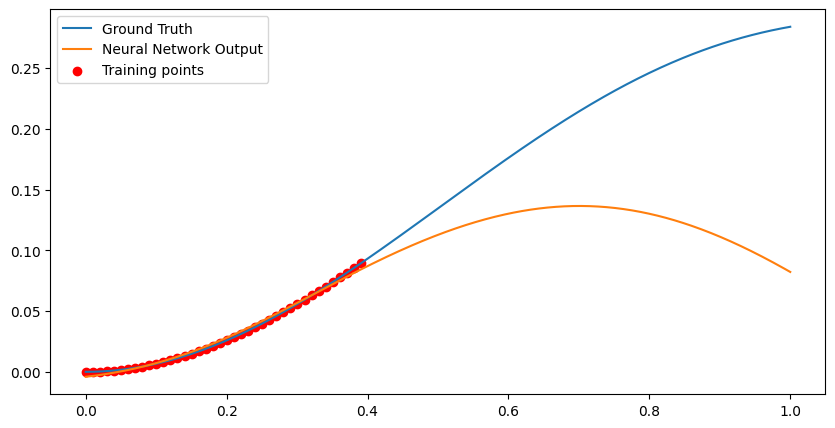

Loss at Step 3280 : 0.00014078119420446455
Epoch 3280, Total Data Processed: 16793600


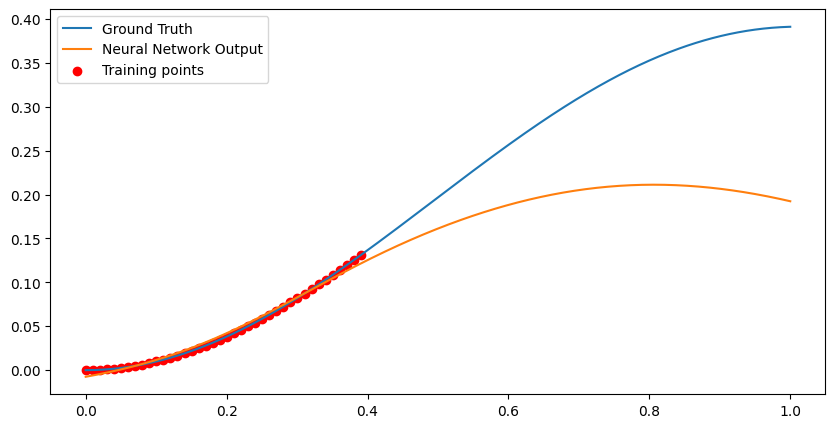

Loss at Step 3290 : 0.0001086962001863867
Epoch 3290, Total Data Processed: 16844800


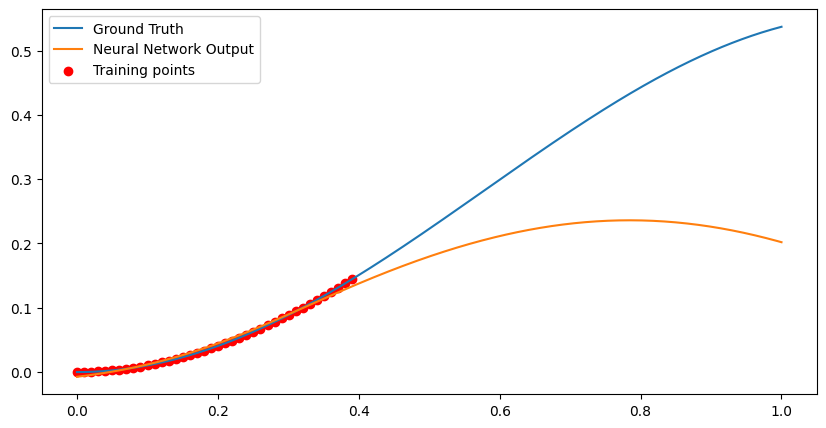

Epoch 3300, Variance: 9.994974789151456e-06, Loss Change: 3.4863106925797638e-06
Loss at Step 3300 : 0.00017085106810554862
Epoch 3300, Total Data Processed: 16896000


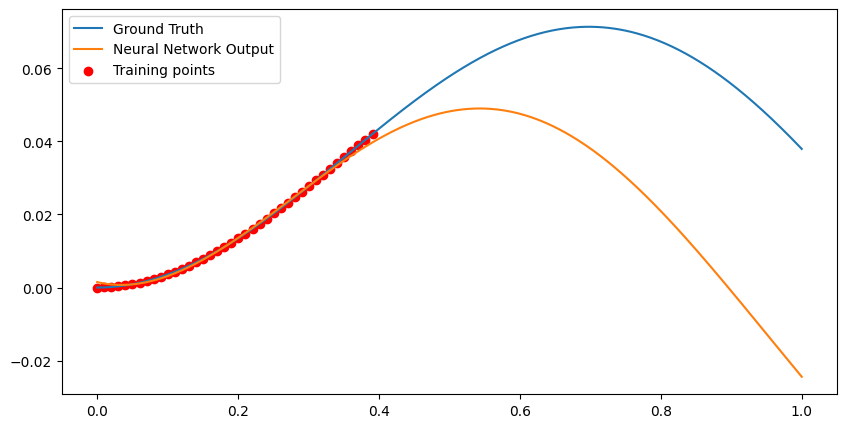

Loss at Step 3310 : 0.0001566951395943761
Epoch 3310, Total Data Processed: 16947200


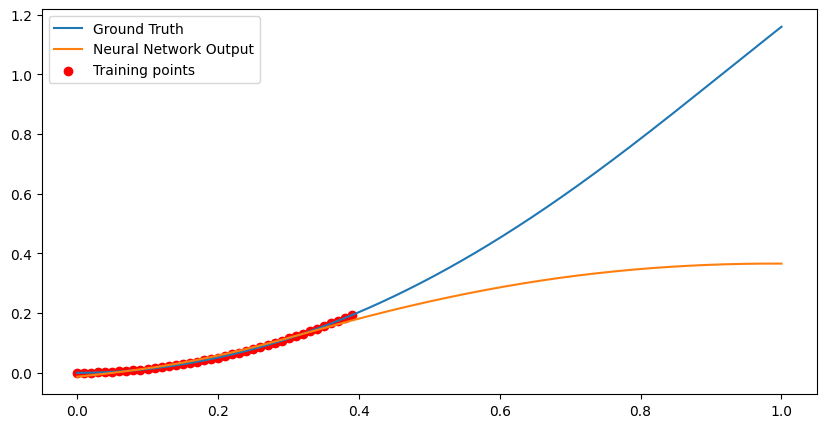

Loss at Step 3320 : 0.00011356068716850132
Epoch 3320, Total Data Processed: 16998400


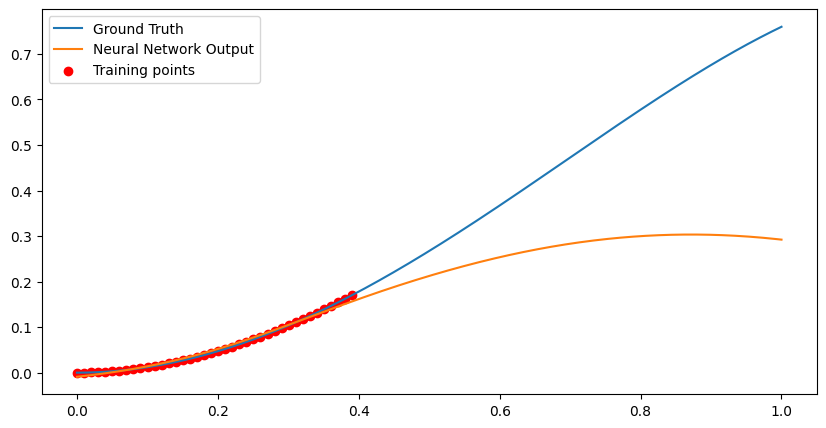

Loss at Step 3330 : 7.136465865187347e-05
Epoch 3330, Total Data Processed: 17049600


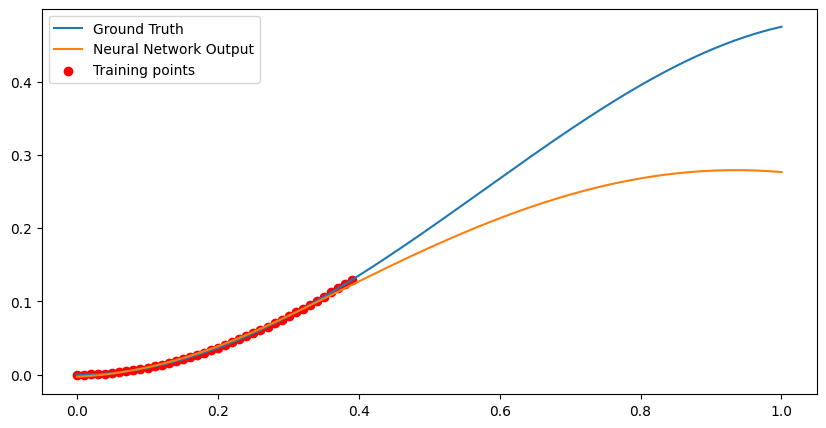

Loss at Step 3340 : 0.00015996418369468302
Epoch 3340, Total Data Processed: 17100800


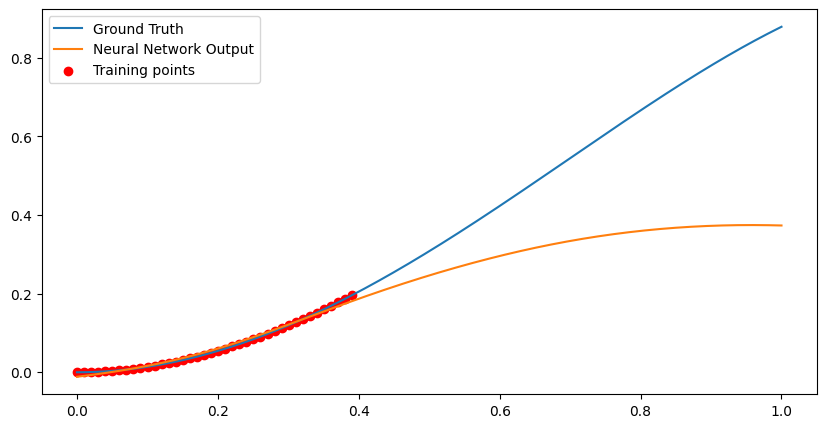

Loss at Step 3350 : 6.756037328159437e-05
Epoch 3350, Total Data Processed: 17152000


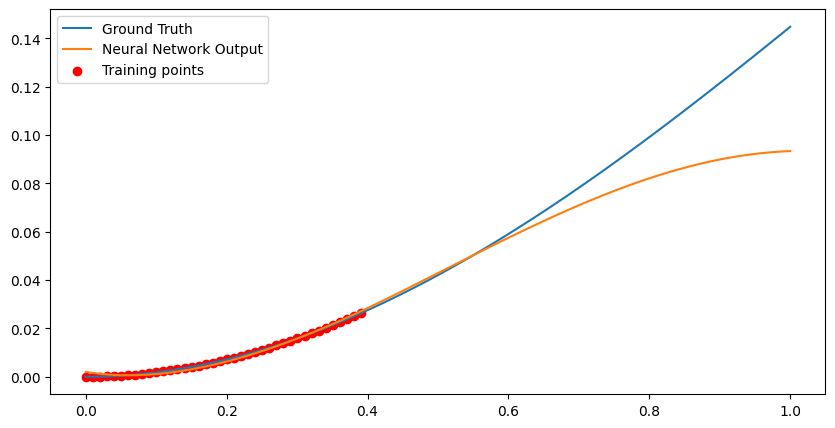

Loss at Step 3360 : 8.70447329361923e-05
Epoch 3360, Total Data Processed: 17203200


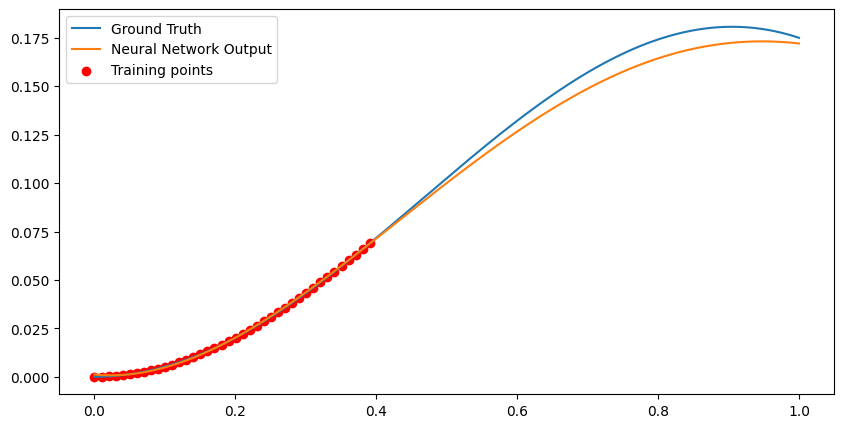

Loss at Step 3370 : 1.3181053873267956e-05
Epoch 3370, Total Data Processed: 17254400


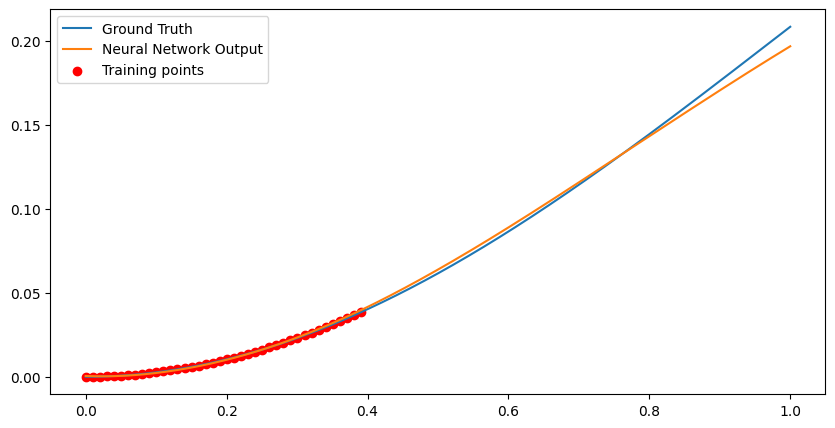

Loss at Step 3380 : 0.00018607141100801528
Epoch 3380, Total Data Processed: 17305600


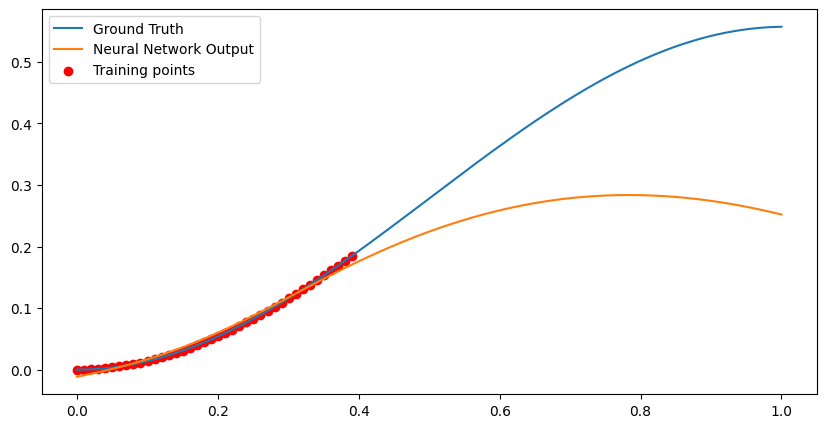

Loss at Step 3390 : 0.00014872170868329704
Epoch 3390, Total Data Processed: 17356800


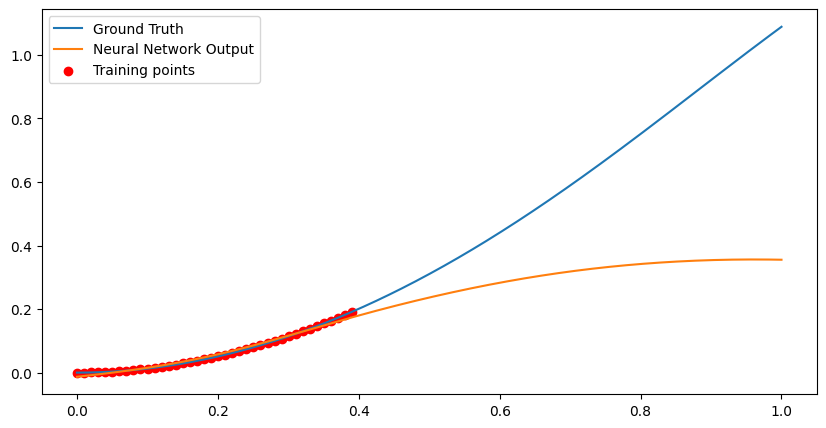

Epoch 3400, Variance: 1.1950316547881812e-05, Loss Change: 5.886278561462177e-06
Loss at Step 3400 : 6.217714690137655e-05
Epoch 3400, Total Data Processed: 17408000


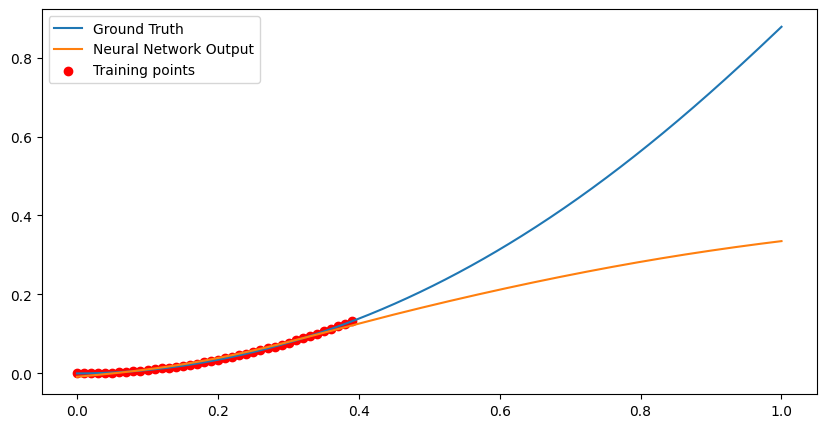

Loss at Step 3410 : 4.221478593535721e-05
Epoch 3410, Total Data Processed: 17459200


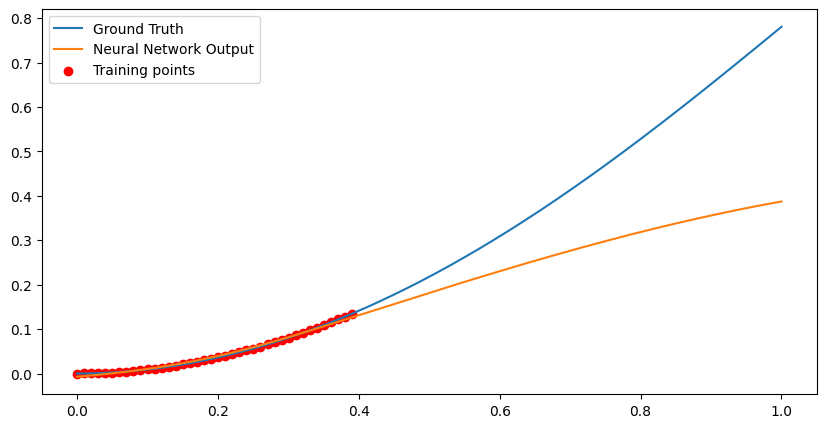

Loss at Step 3420 : 0.00014580583956558257
Epoch 3420, Total Data Processed: 17510400


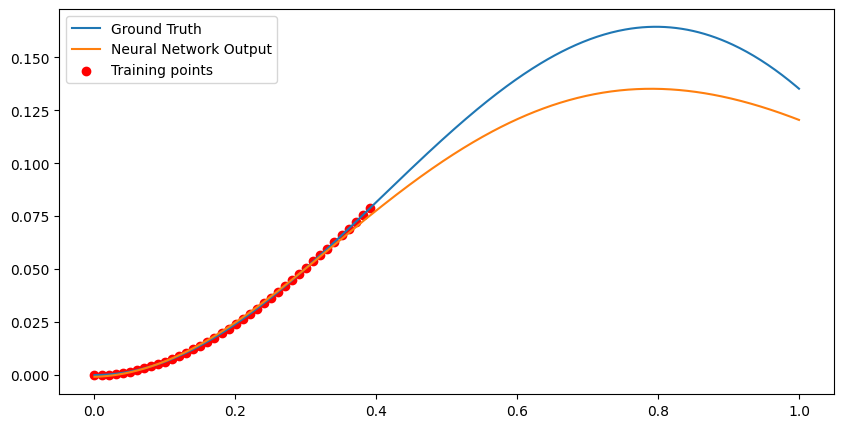

Loss at Step 3430 : 0.00017588243645150214
Epoch 3430, Total Data Processed: 17561600


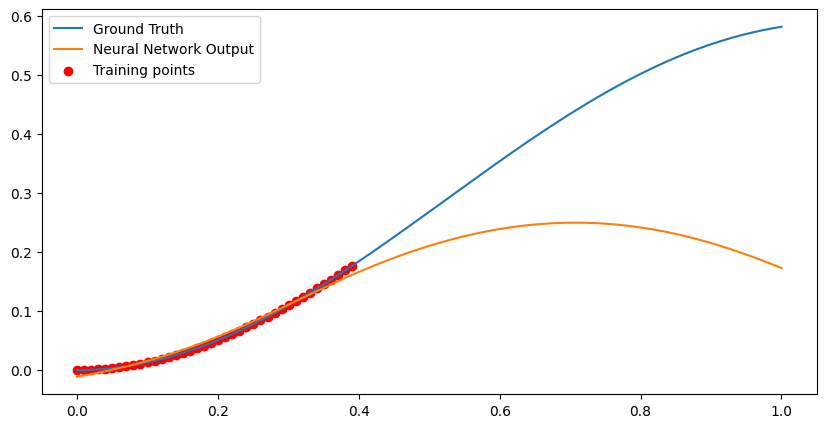

Loss at Step 3440 : 8.799865463515744e-05
Epoch 3440, Total Data Processed: 17612800


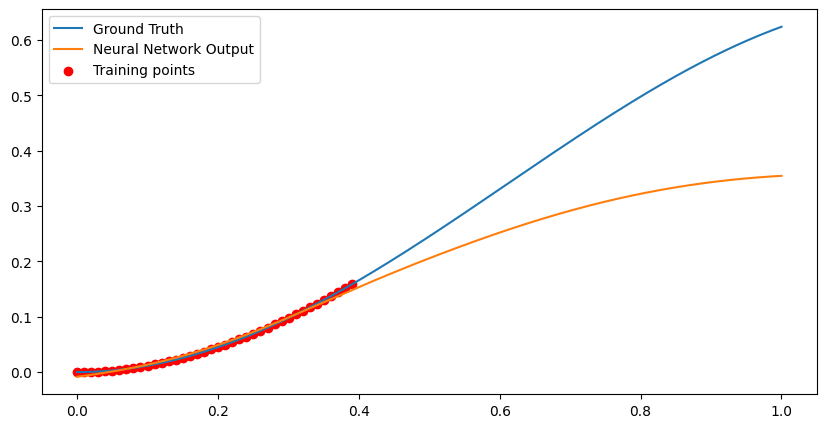

Loss at Step 3450 : 0.0002471775806043297
Epoch 3450, Total Data Processed: 17664000


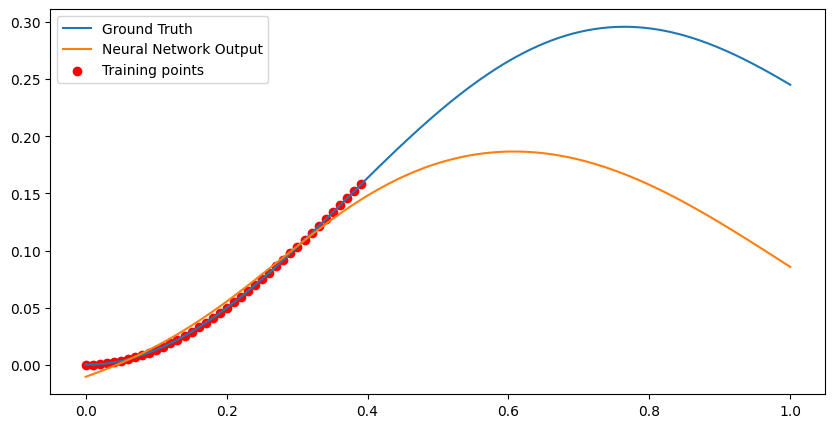

Loss at Step 3460 : 0.00015553977573290467
Epoch 3460, Total Data Processed: 17715200


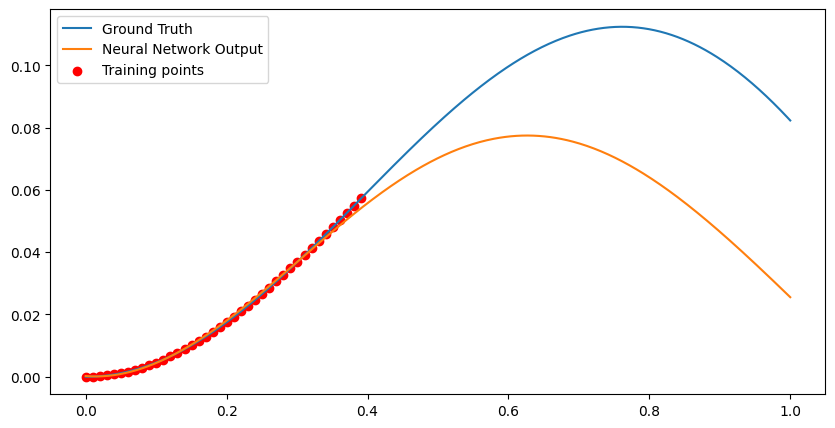

Loss at Step 3470 : 0.00013739164569415152
Epoch 3470, Total Data Processed: 17766400


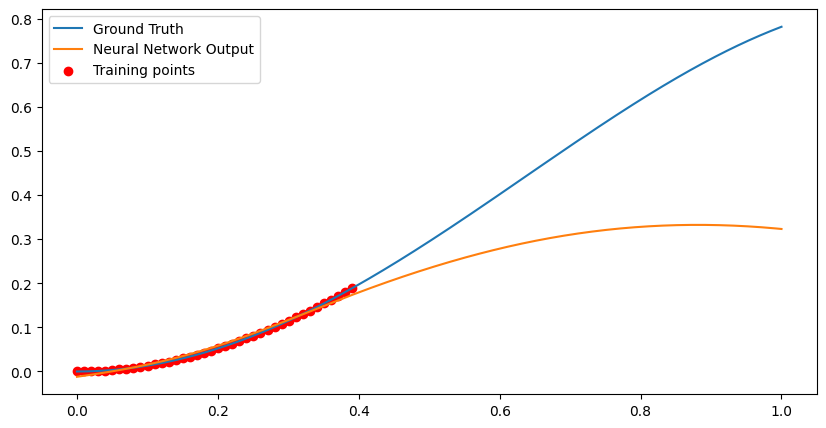

Loss at Step 3480 : 6.501561438199133e-05
Epoch 3480, Total Data Processed: 17817600


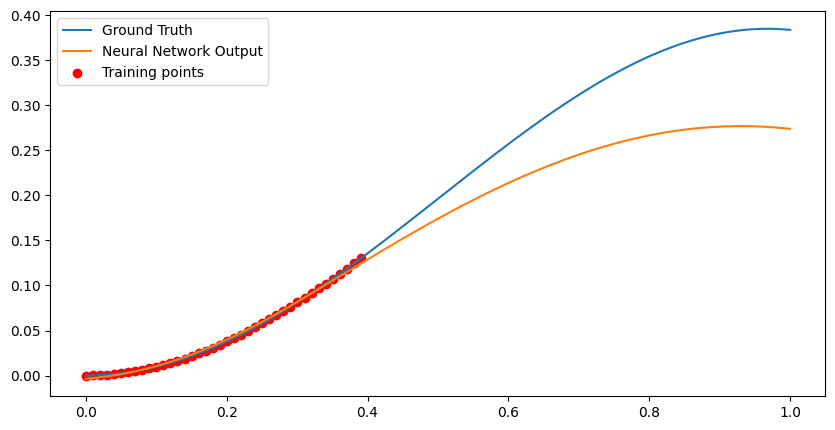

Loss at Step 3490 : 5.248944944469258e-05
Epoch 3490, Total Data Processed: 17868800


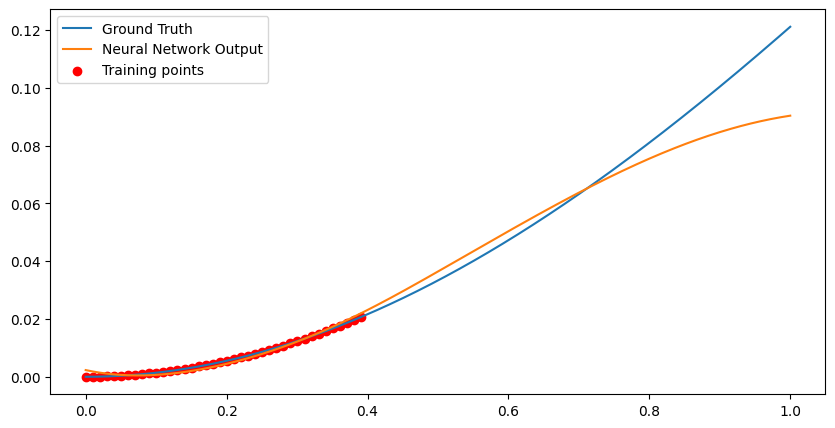

Epoch 3500, Variance: 1.0567759090918116e-05, Loss Change: 1.8951427271929333e-06
Loss at Step 3500 : 0.00022641519899480045
Epoch 3500, Total Data Processed: 17920000


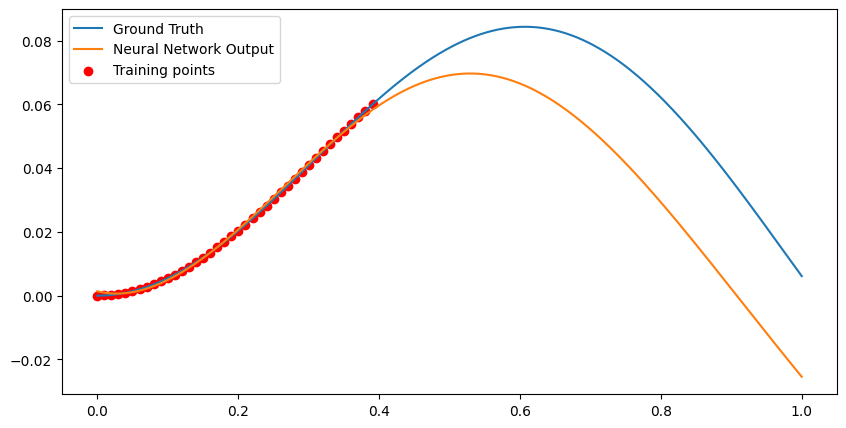

Loss at Step 3510 : 0.00025597098283469677
Epoch 3510, Total Data Processed: 17971200


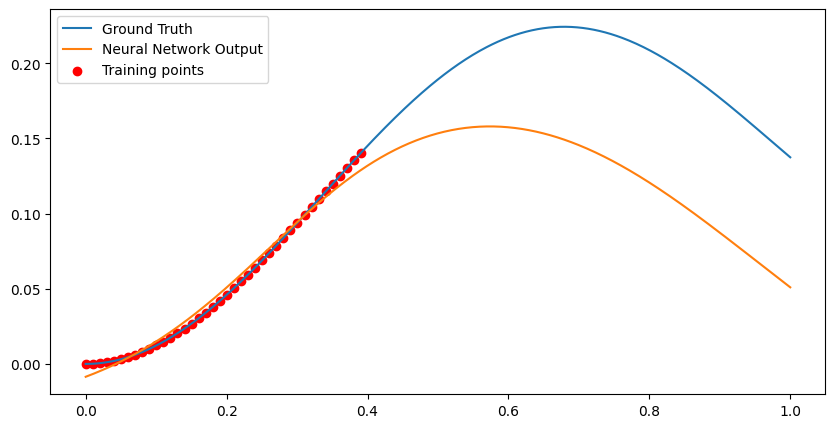

Loss at Step 3520 : 0.00013703307195100933
Epoch 3520, Total Data Processed: 18022400


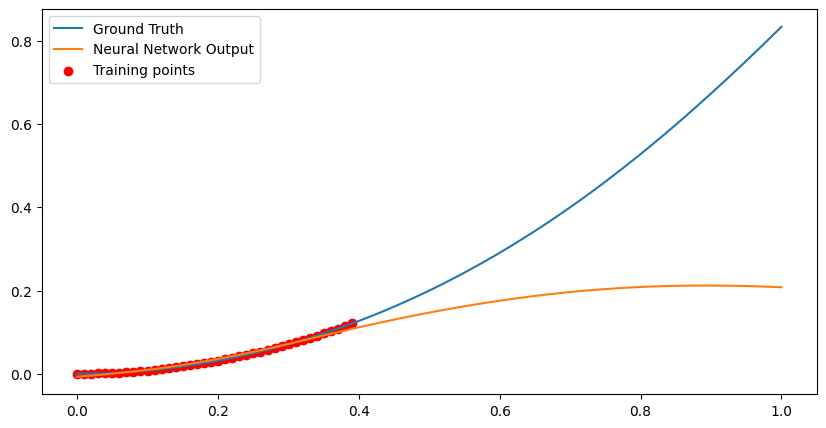

Loss at Step 3530 : 2.165606383641716e-05
Epoch 3530, Total Data Processed: 18073600


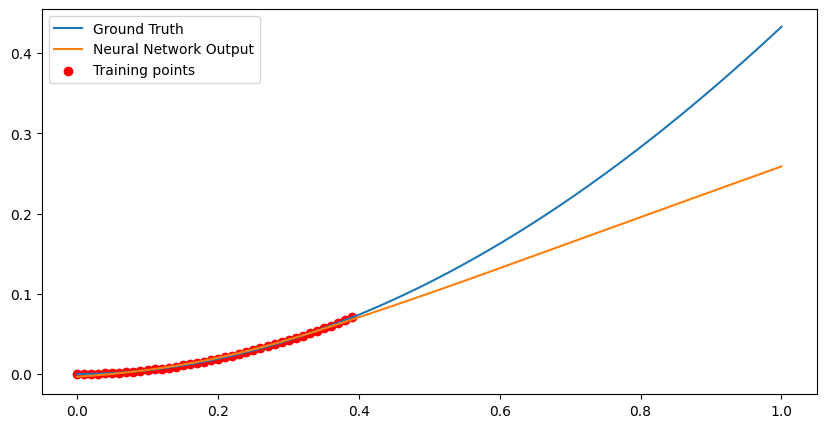

Loss at Step 3540 : 2.0945328287780285e-05
Epoch 3540, Total Data Processed: 18124800


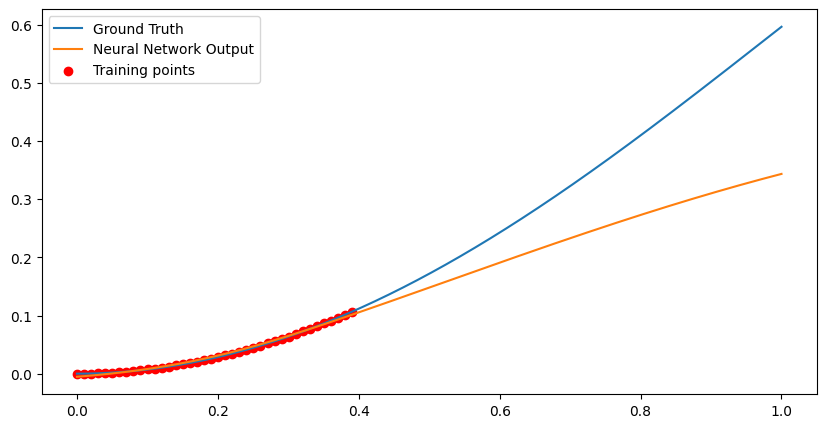

Loss at Step 3550 : 4.934458775096573e-05
Epoch 3550, Total Data Processed: 18176000


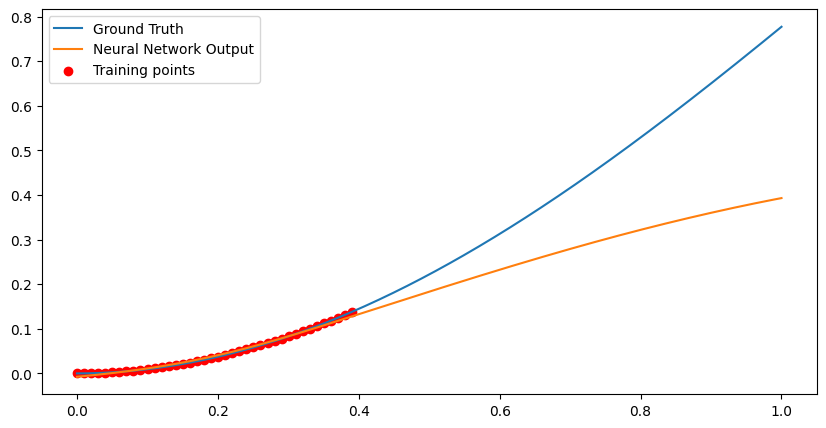

Loss at Step 3560 : 0.00016974701429717243
Epoch 3560, Total Data Processed: 18227200


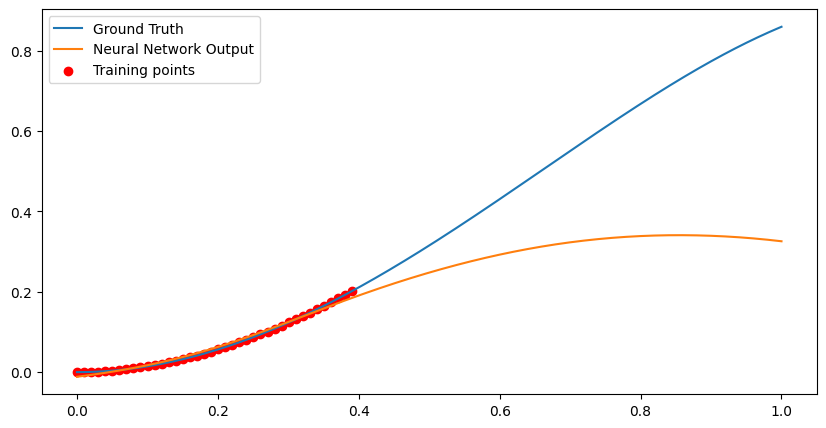

Loss at Step 3570 : 0.00013261202548164874
Epoch 3570, Total Data Processed: 18278400


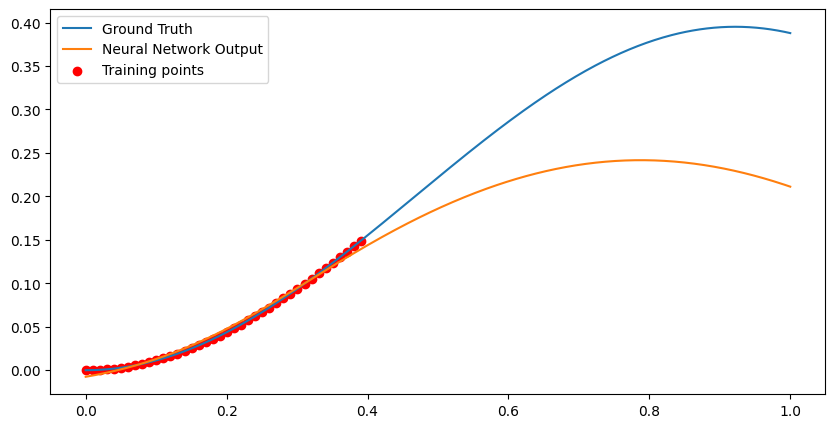

Loss at Step 3580 : 7.742659363429993e-05
Epoch 3580, Total Data Processed: 18329600


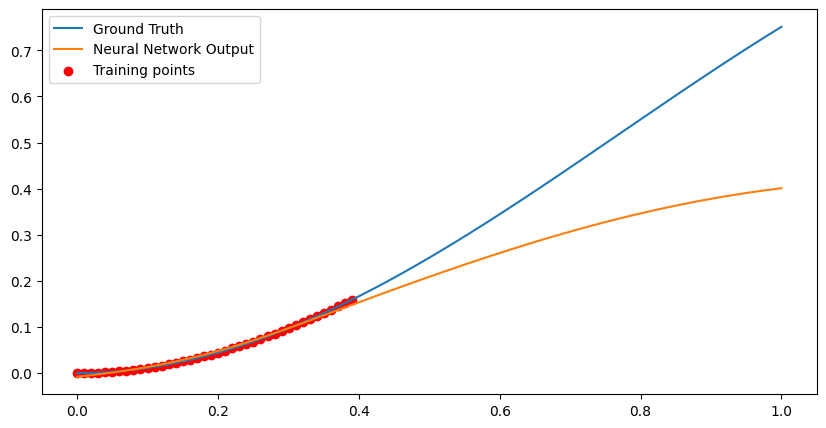

Loss at Step 3590 : 0.00010729647328844294
Epoch 3590, Total Data Processed: 18380800


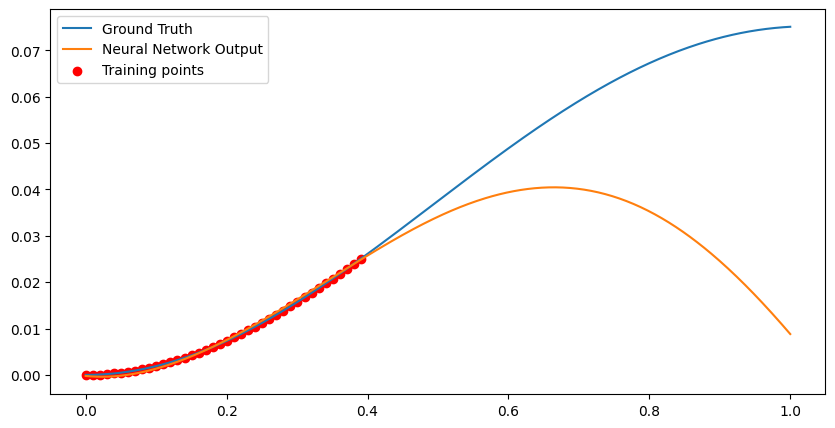

Epoch 3600, Variance: 1.0575453416095115e-05, Loss Change: 6.5892170493242475e-06
Loss at Step 3600 : 0.0002291952259838581
Epoch 3600, Total Data Processed: 18432000


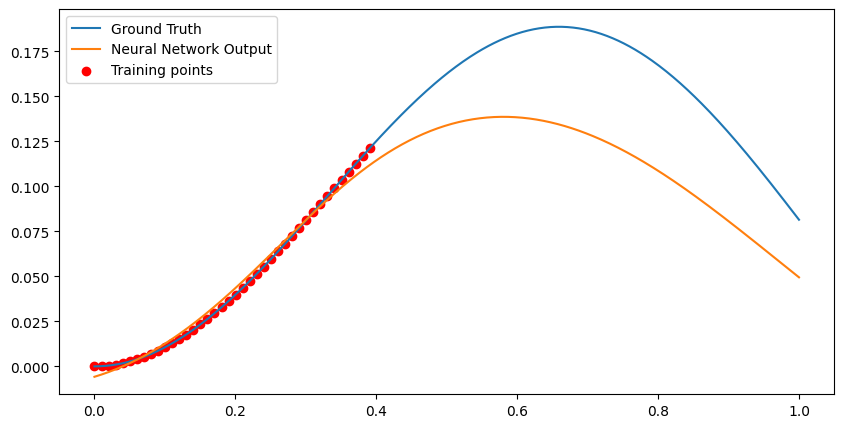

Loss at Step 3610 : 0.00021094779367558658
Epoch 3610, Total Data Processed: 18483200


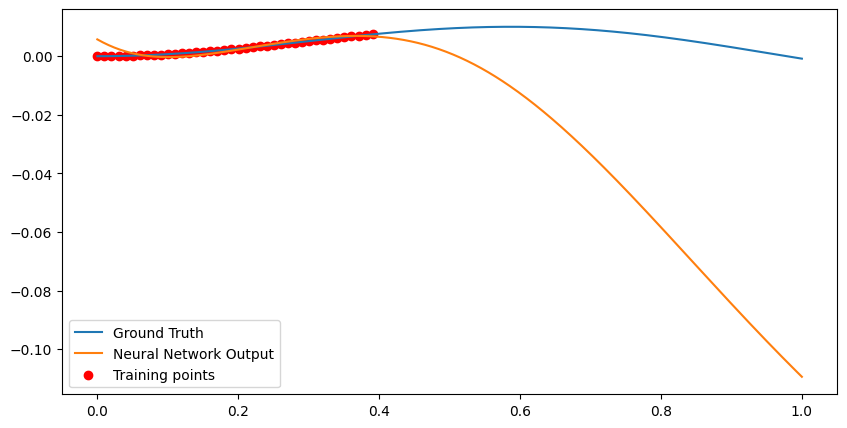

Loss at Step 3620 : 6.153890717541799e-05
Epoch 3620, Total Data Processed: 18534400


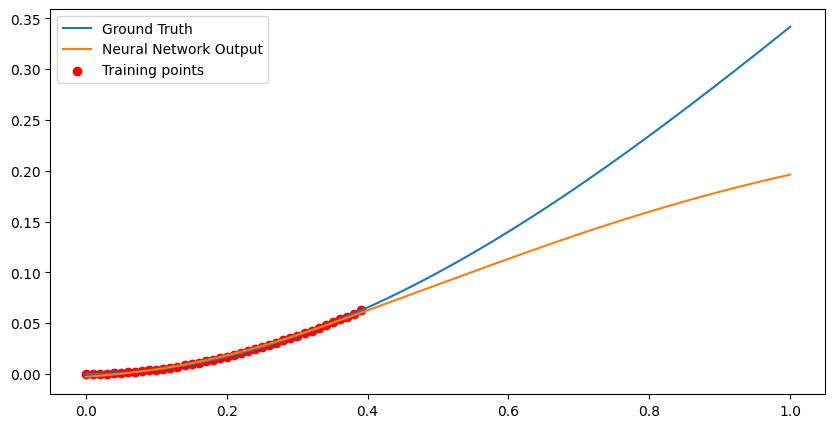

Loss at Step 3630 : 0.00011994533997494727
Epoch 3630, Total Data Processed: 18585600


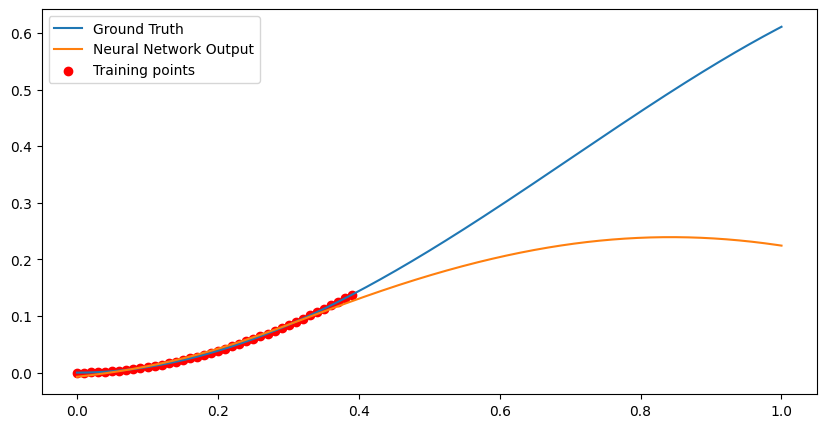

Loss at Step 3640 : 0.00023022732057143003
Epoch 3640, Total Data Processed: 18636800


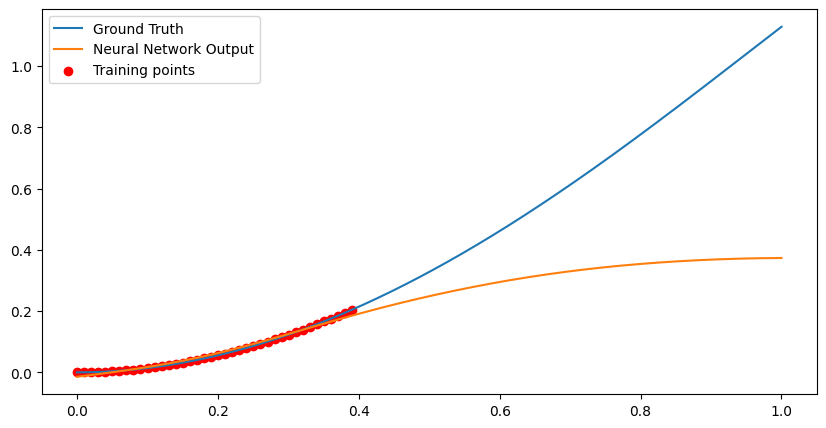

Loss at Step 3650 : 0.0001635225780773908
Epoch 3650, Total Data Processed: 18688000


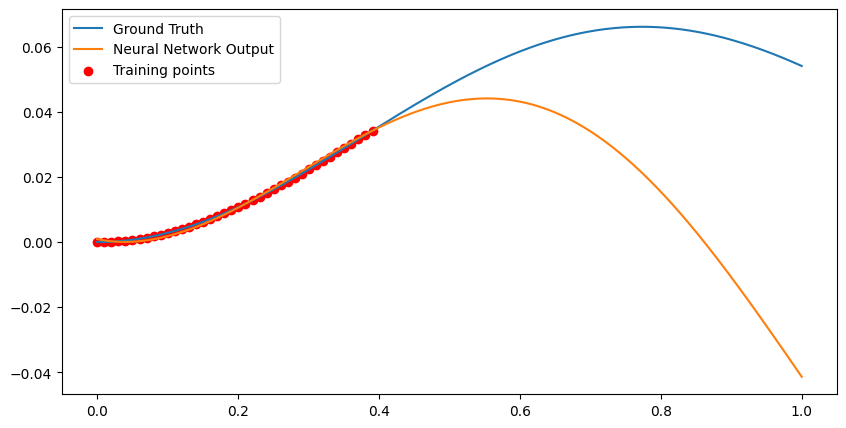

Loss at Step 3660 : 1.9136798073304817e-05
Epoch 3660, Total Data Processed: 18739200


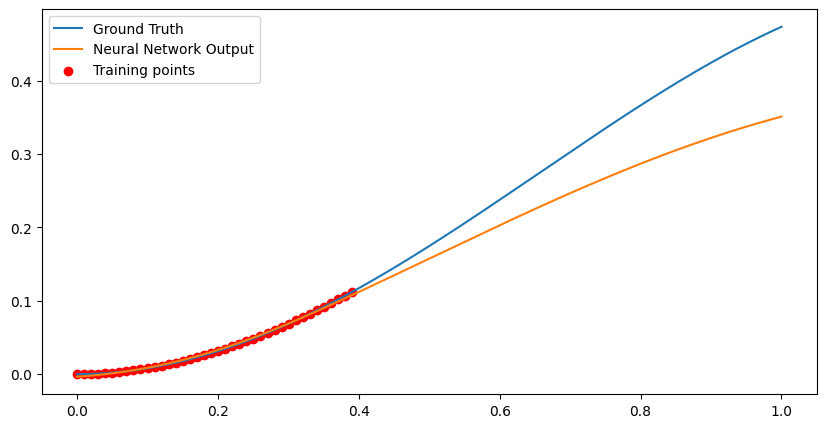

Loss at Step 3670 : 0.00026365561643615365
Epoch 3670, Total Data Processed: 18790400


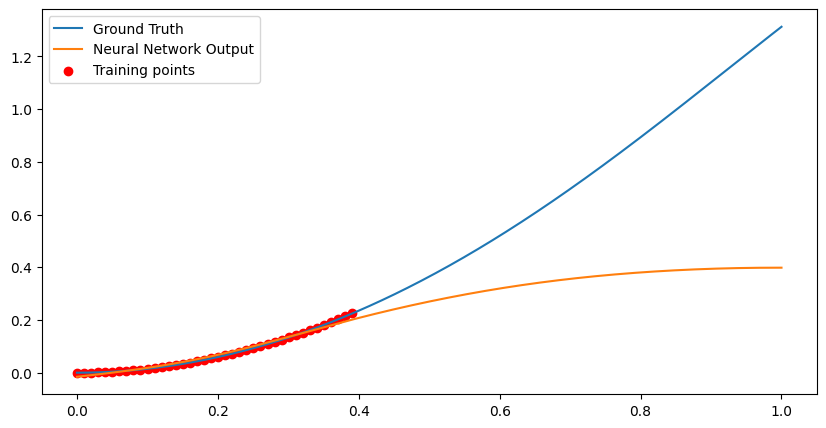

Loss at Step 3680 : 4.194209395791404e-05
Epoch 3680, Total Data Processed: 18841600


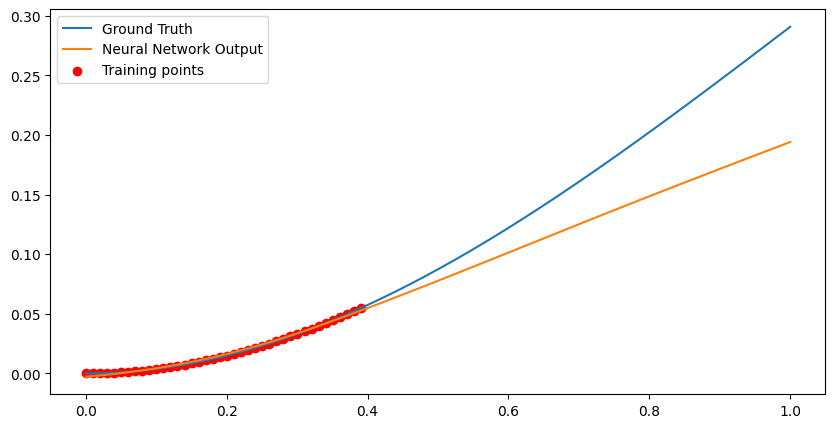

Loss at Step 3690 : 0.00015793707279954106
Epoch 3690, Total Data Processed: 18892800


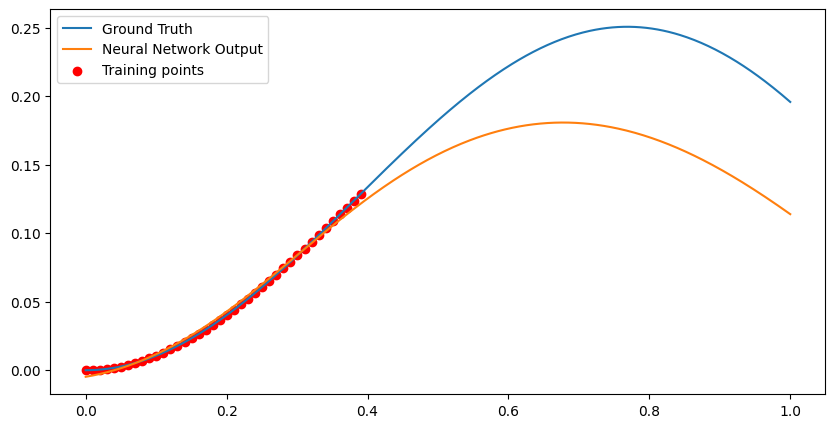

Epoch 3700, Variance: 1.2564545613713562e-05, Loss Change: 4.962988114698419e-06
Loss at Step 3700 : 7.399669266305864e-05
Epoch 3700, Total Data Processed: 18944000


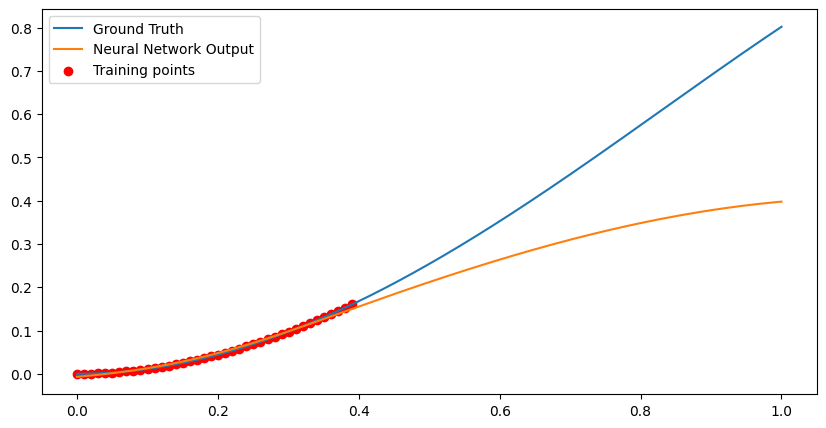

Loss at Step 3710 : 5.143082671565935e-05
Epoch 3710, Total Data Processed: 18995200


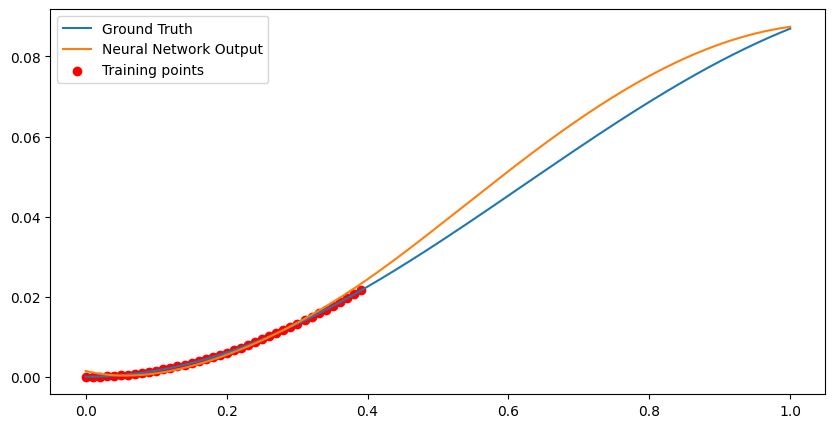

Loss at Step 3720 : 0.00012573068670462817
Epoch 3720, Total Data Processed: 19046400


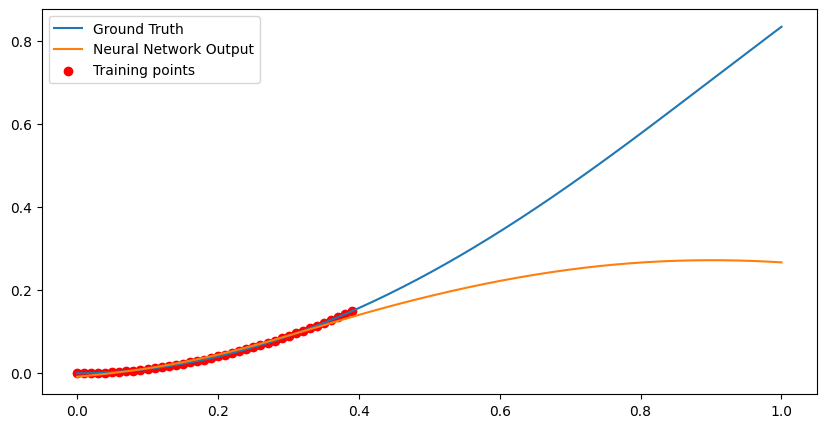

Loss at Step 3730 : 0.00020673208928201348
Epoch 3730, Total Data Processed: 19097600


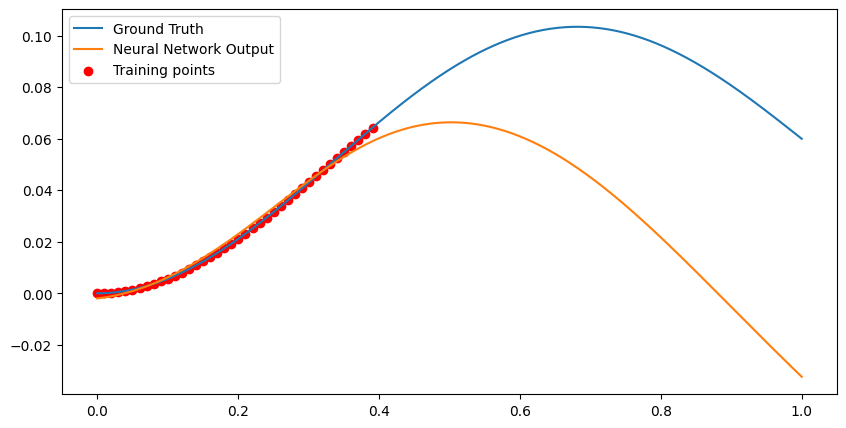

Loss at Step 3740 : 7.993826147867367e-05
Epoch 3740, Total Data Processed: 19148800


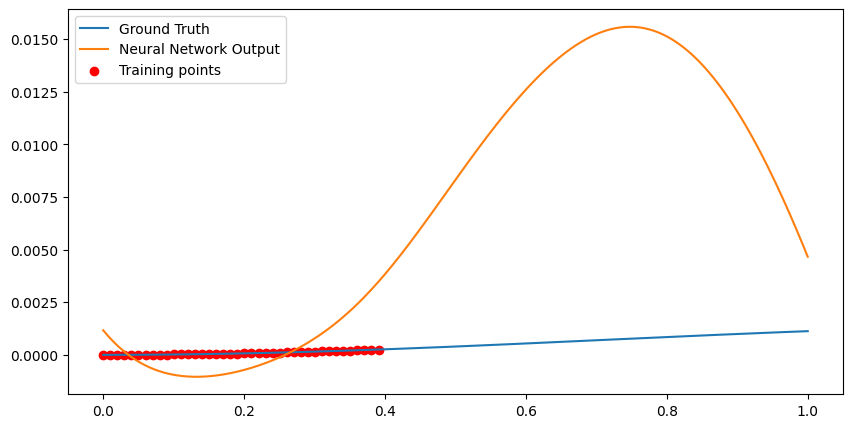

Loss at Step 3750 : 0.00011550309864105657
Epoch 3750, Total Data Processed: 19200000


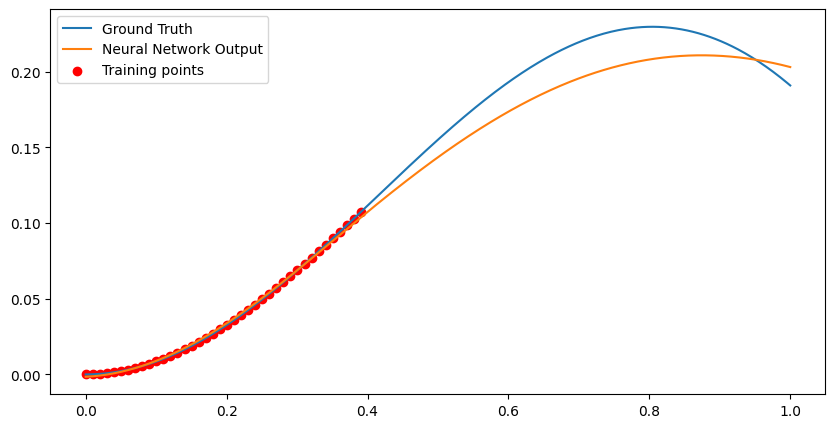

Loss at Step 3760 : 0.00017506828589830548
Epoch 3760, Total Data Processed: 19251200


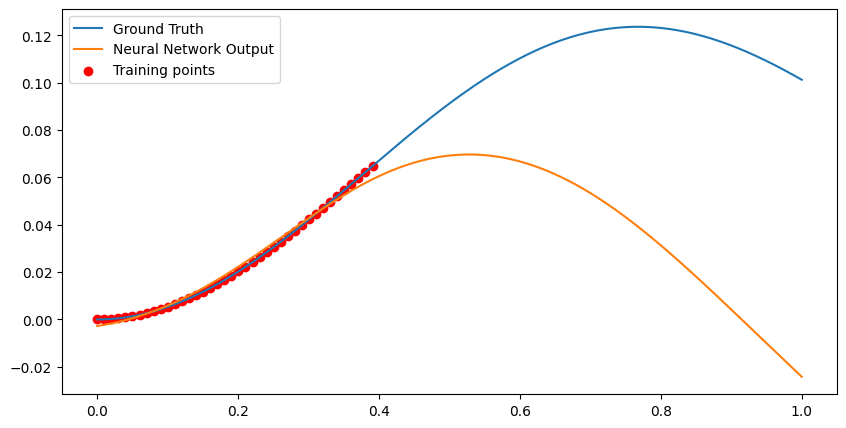

Loss at Step 3770 : 6.825799937359989e-05
Epoch 3770, Total Data Processed: 19302400


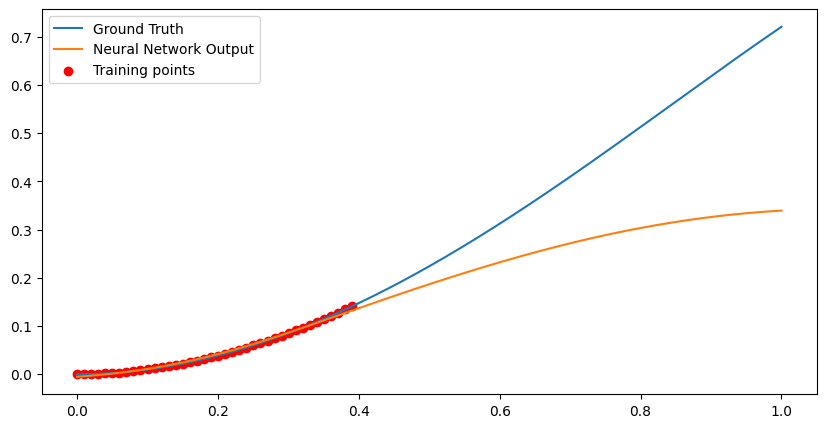

Loss at Step 3780 : 6.192014552652836e-06
Epoch 3780, Total Data Processed: 19353600


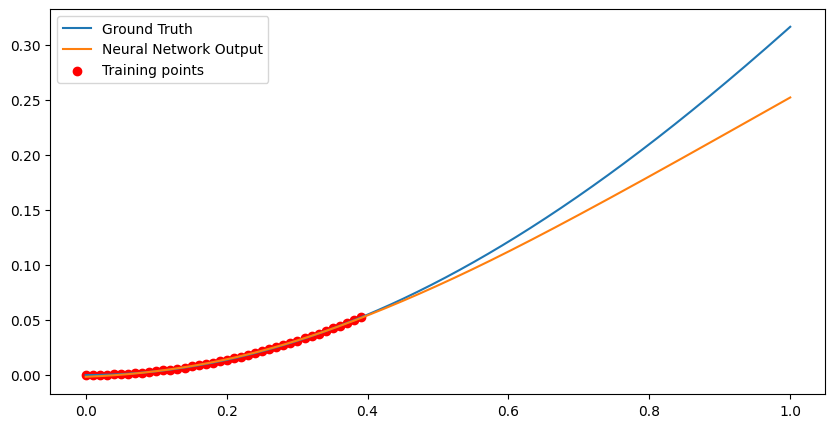

Loss at Step 3790 : 0.00027849426260218024
Epoch 3790, Total Data Processed: 19404800


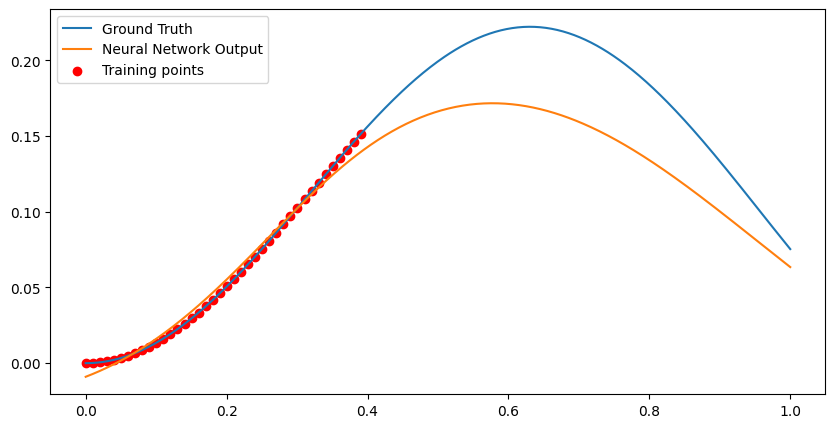

Epoch 3800, Variance: 1.207805507874582e-05, Loss Change: 2.6500697352105362e-06
Loss at Step 3800 : 6.98025678502745e-06
Epoch 3800, Total Data Processed: 19456000


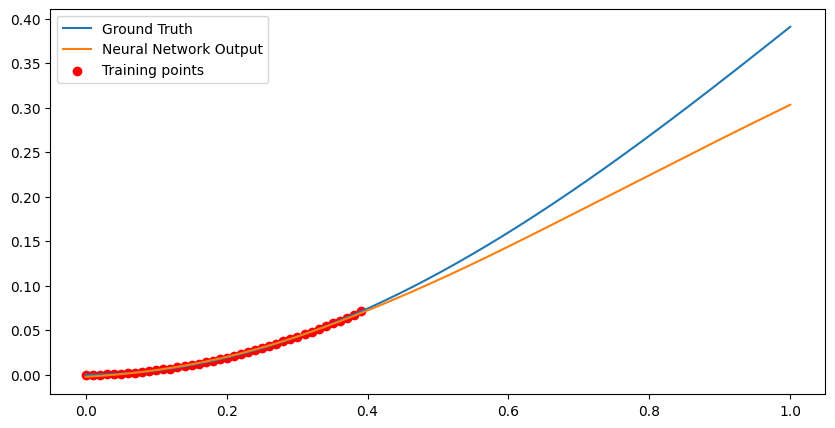

Loss at Step 3810 : 0.00020780526392627507
Epoch 3810, Total Data Processed: 19507200


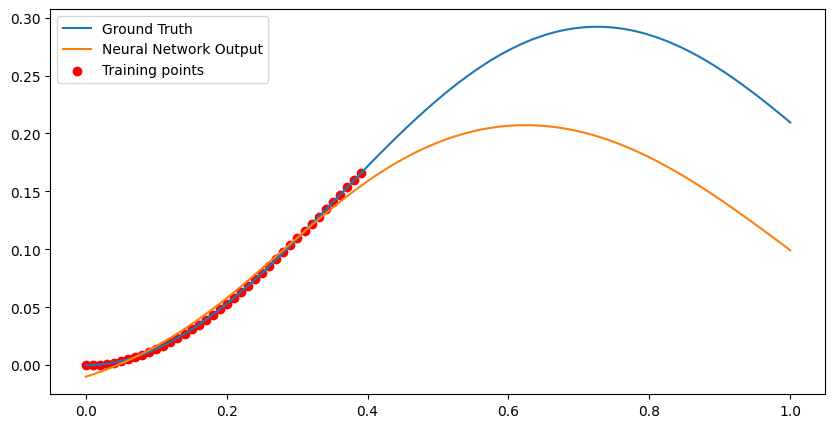

Loss at Step 3820 : 0.00021544568880926818
Epoch 3820, Total Data Processed: 19558400


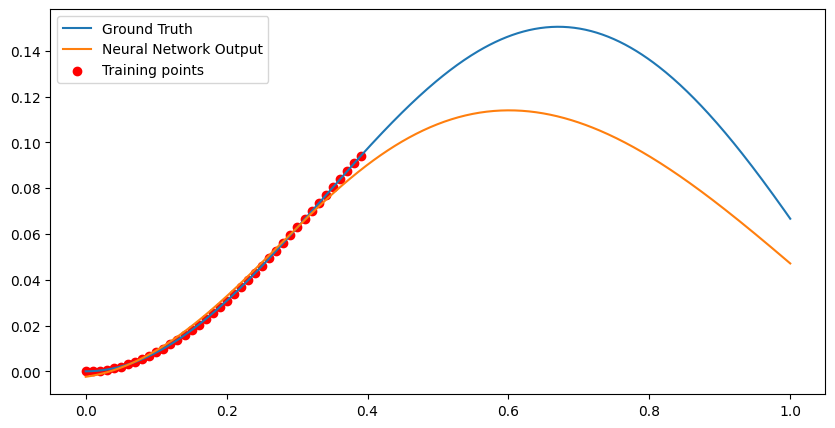

Loss at Step 3830 : 4.0943228668766096e-05
Epoch 3830, Total Data Processed: 19609600


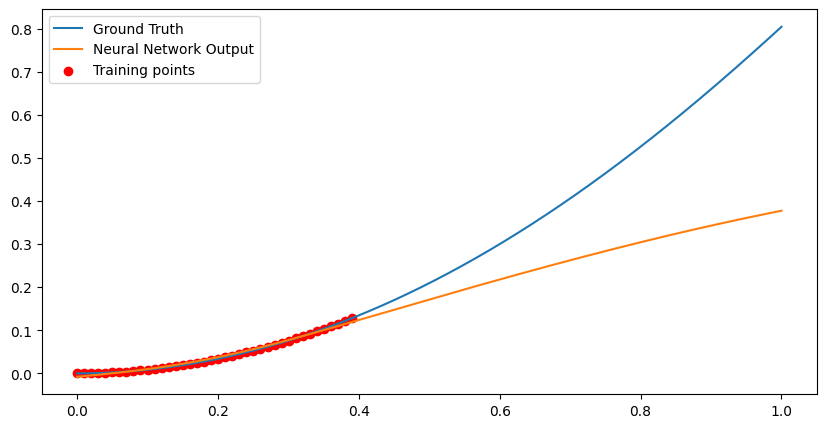

Loss at Step 3840 : 0.00012610040721483529
Epoch 3840, Total Data Processed: 19660800


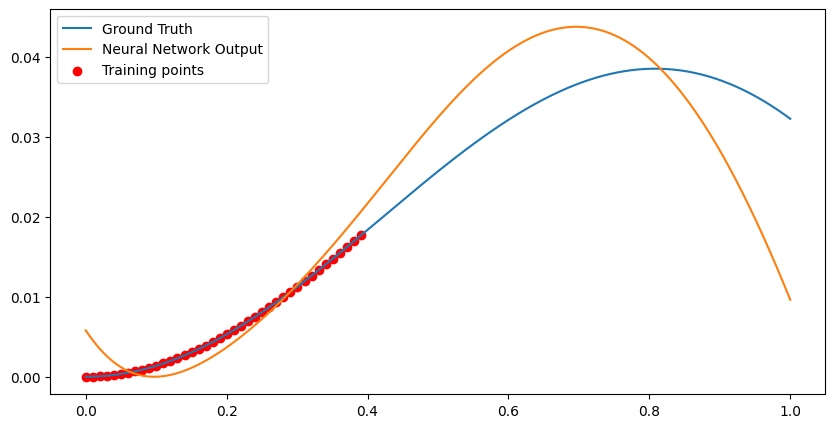

Loss at Step 3850 : 0.00018715749320108443
Epoch 3850, Total Data Processed: 19712000


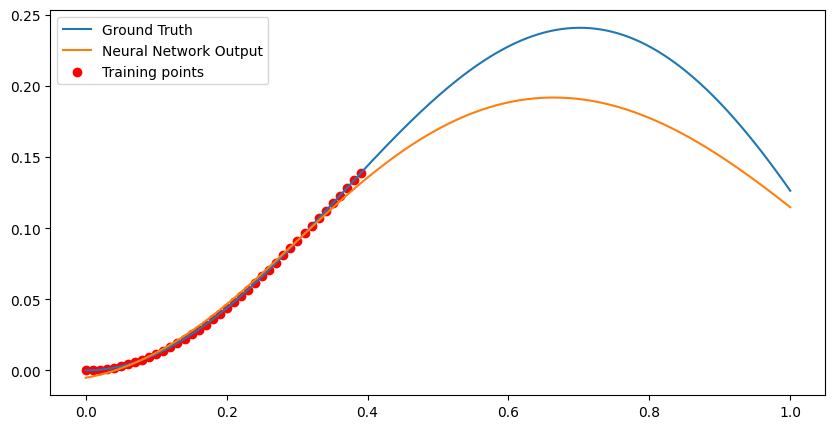

Loss at Step 3860 : 9.61014156928286e-05
Epoch 3860, Total Data Processed: 19763200


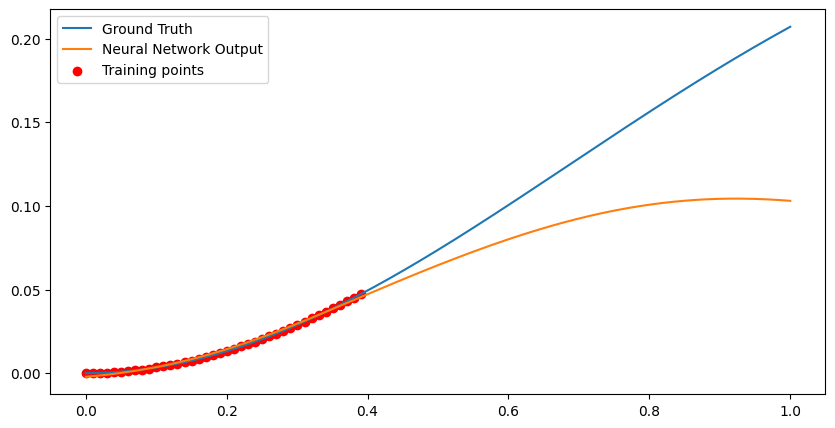

Loss at Step 3870 : 3.265948180342093e-05
Epoch 3870, Total Data Processed: 19814400


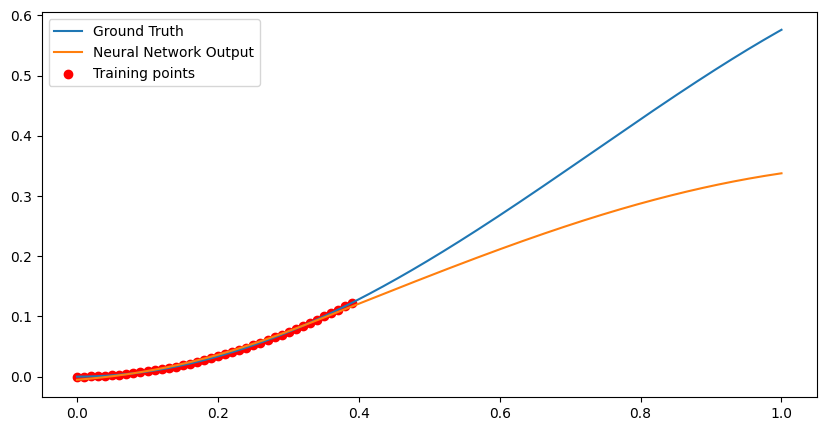

Loss at Step 3880 : 0.00014994510274846107
Epoch 3880, Total Data Processed: 19865600


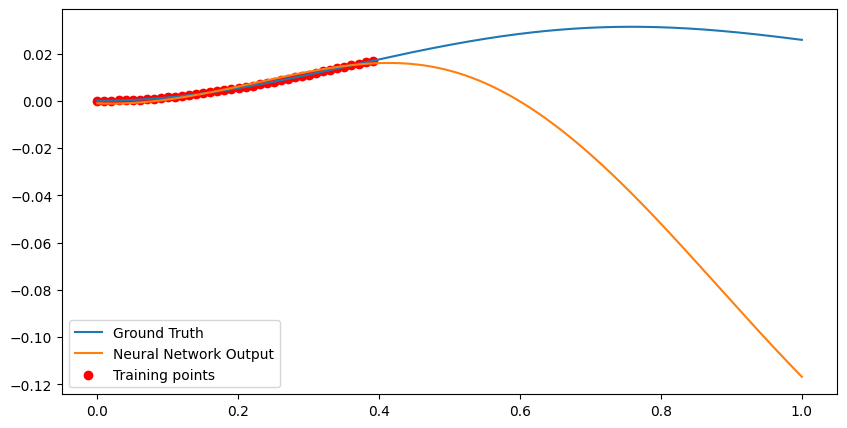

Loss at Step 3890 : 9.928658255375922e-05
Epoch 3890, Total Data Processed: 19916800


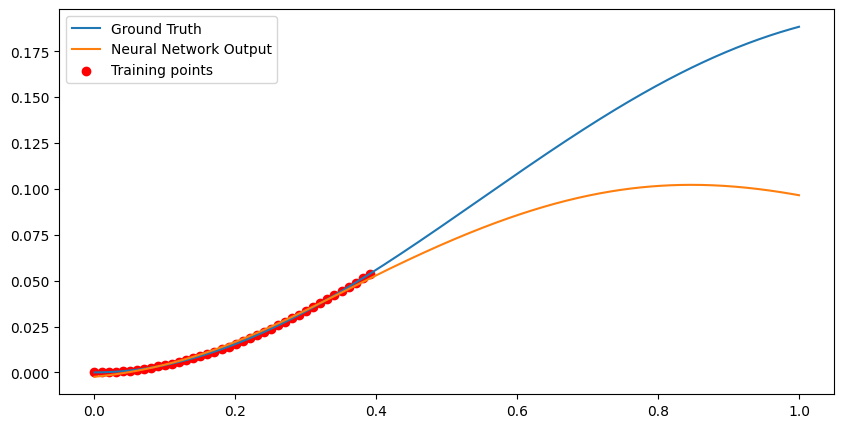

Epoch 3900, Variance: 1.1721157534339e-05, Loss Change: 9.26589308036796e-06
Loss at Step 3900 : 0.00015161209739744663
Epoch 3900, Total Data Processed: 19968000


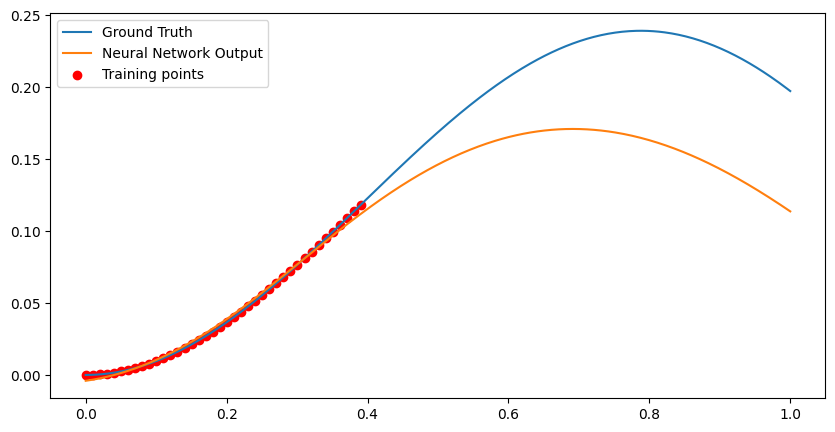

Loss at Step 3910 : 0.00020113518985453993
Epoch 3910, Total Data Processed: 20019200


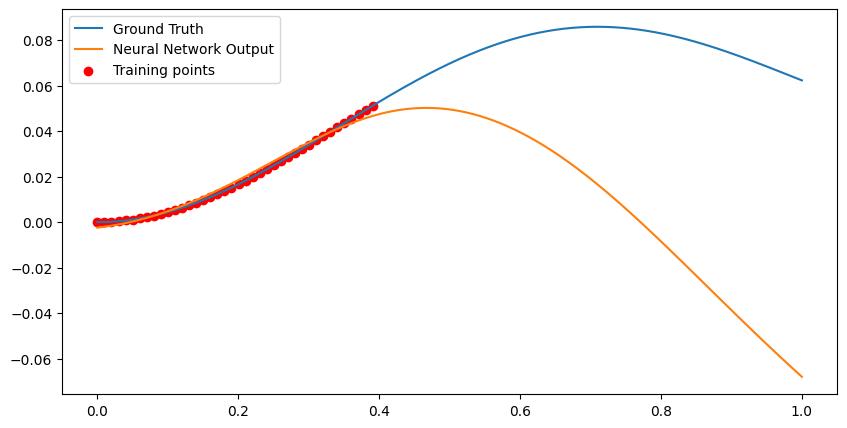

Loss at Step 3920 : 3.5120261600241065e-05
Epoch 3920, Total Data Processed: 20070400


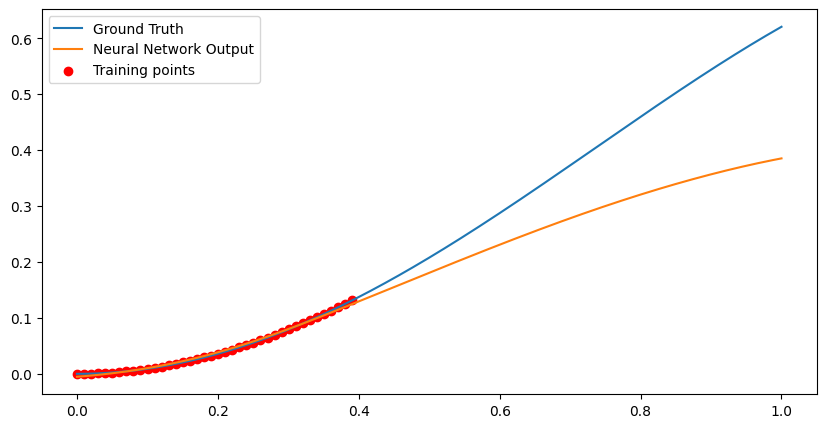

Loss at Step 3930 : 4.1594150388846174e-05
Epoch 3930, Total Data Processed: 20121600


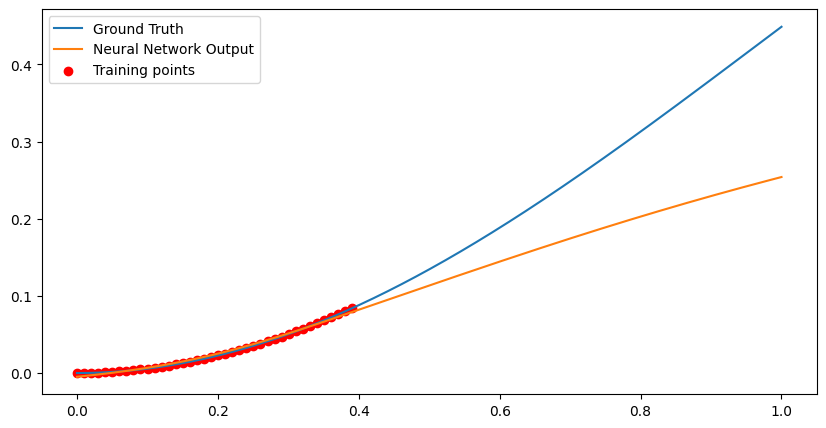

Loss at Step 3940 : 0.00024240092898253351
Epoch 3940, Total Data Processed: 20172800


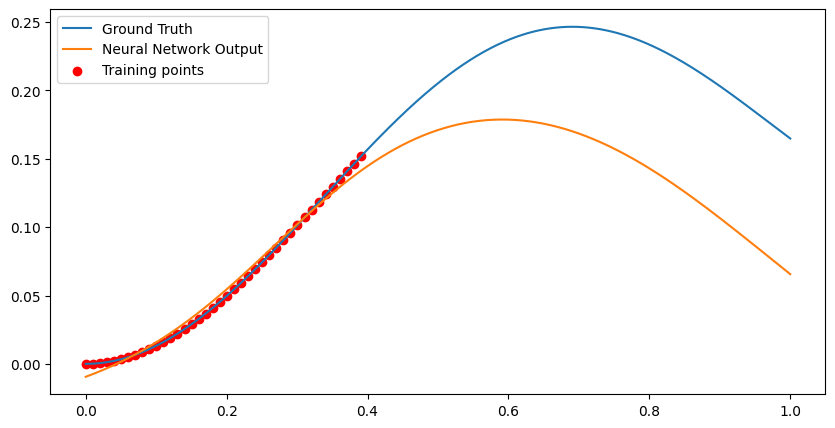

Loss at Step 3950 : 0.00017225739429704845
Epoch 3950, Total Data Processed: 20224000


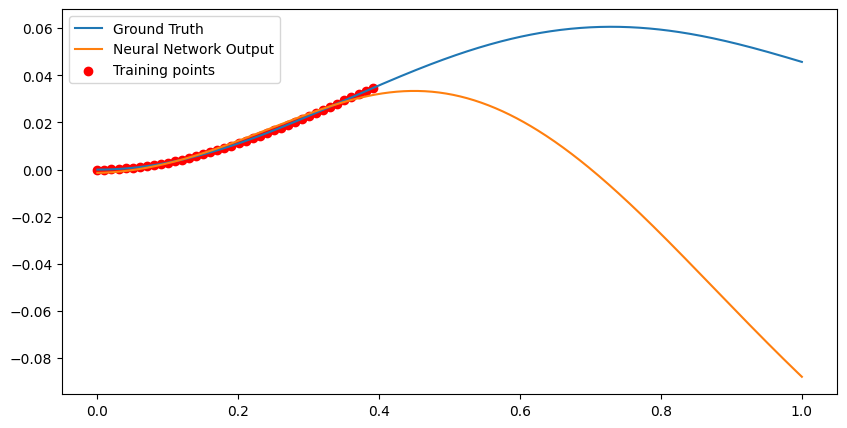

Loss at Step 3960 : 6.186848622746766e-05
Epoch 3960, Total Data Processed: 20275200


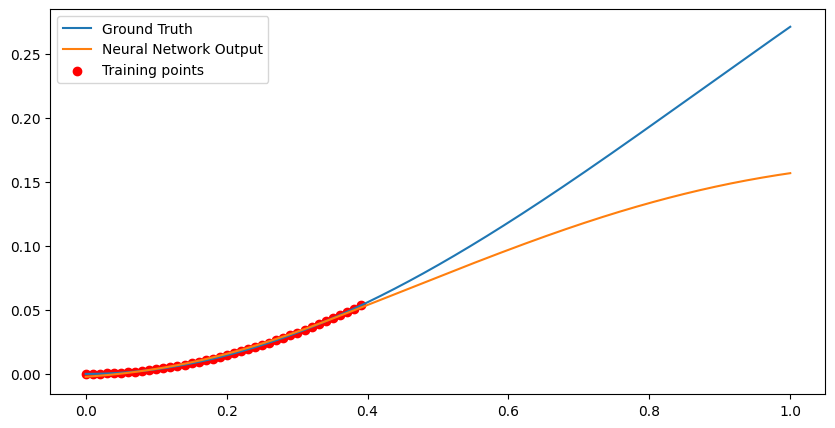

Loss at Step 3970 : 5.095976302982308e-05
Epoch 3970, Total Data Processed: 20326400


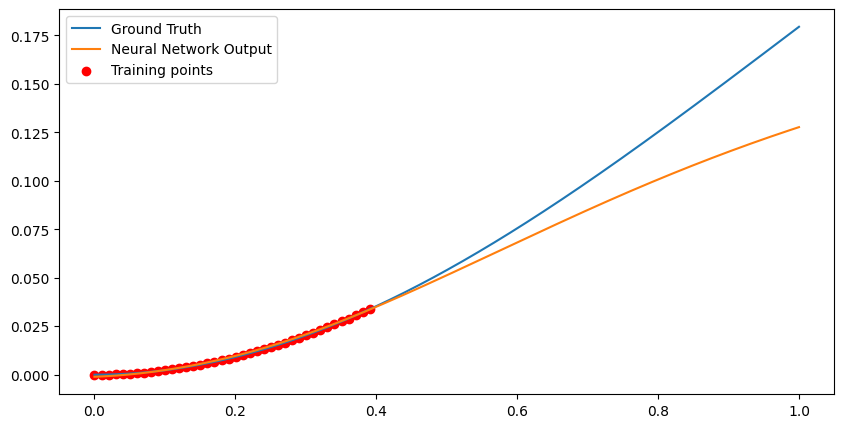

Loss at Step 3980 : 0.00017134399968199432
Epoch 3980, Total Data Processed: 20377600


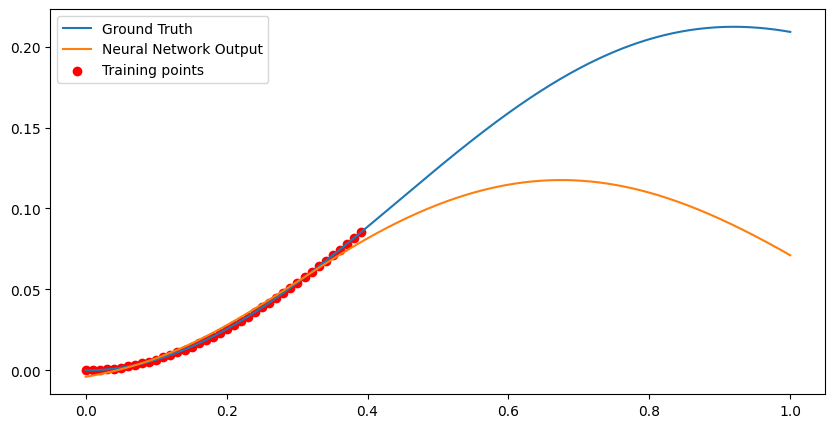

Loss at Step 3990 : 0.00025913413264788687
Epoch 3990, Total Data Processed: 20428800


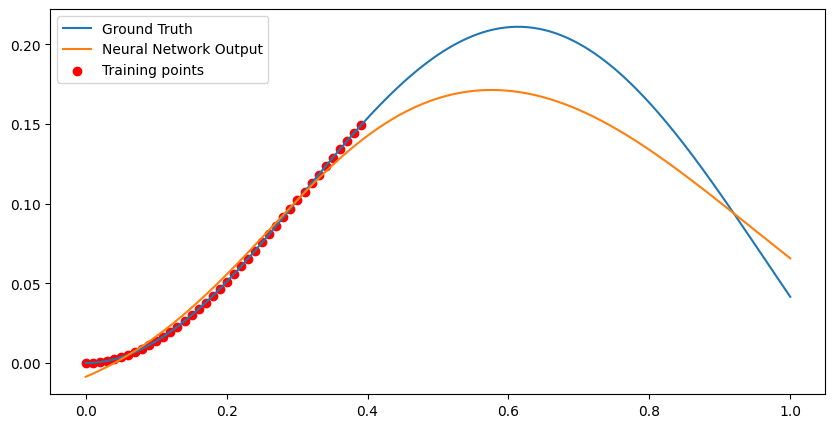

Epoch 4000, Variance: 9.525264431431424e-06, Loss Change: 1.118136012934201e-05
Loss at Step 4000 : 7.261068822117522e-05
Epoch 4000, Total Data Processed: 20480000


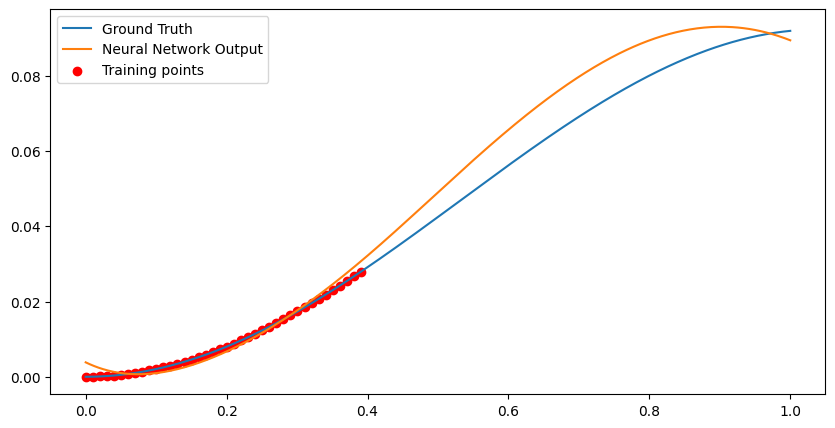

Loss at Step 4010 : 0.00019150252046529204
Epoch 4010, Total Data Processed: 20531200


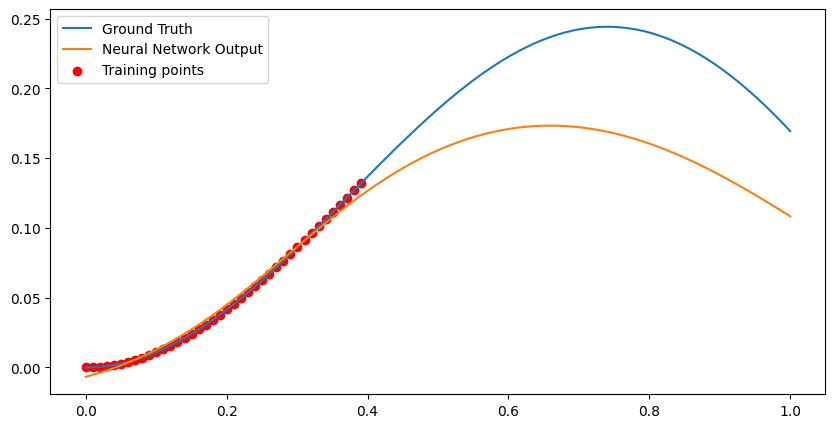

Loss at Step 4020 : 0.00015975587302818894
Epoch 4020, Total Data Processed: 20582400


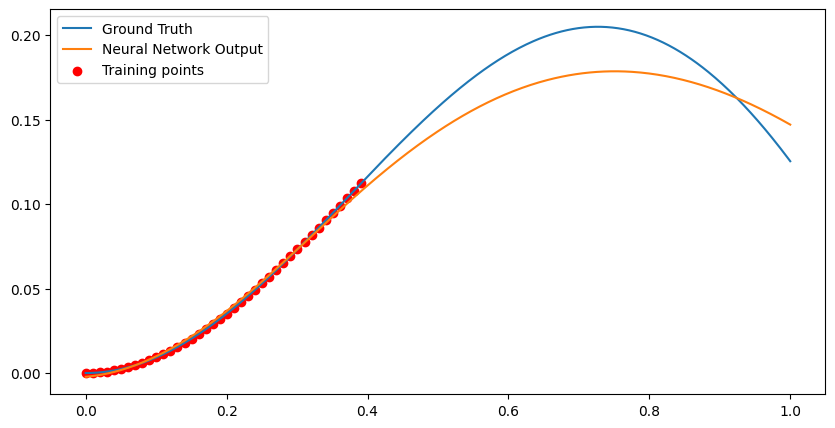

Loss at Step 4030 : 8.447853178950027e-05
Epoch 4030, Total Data Processed: 20633600


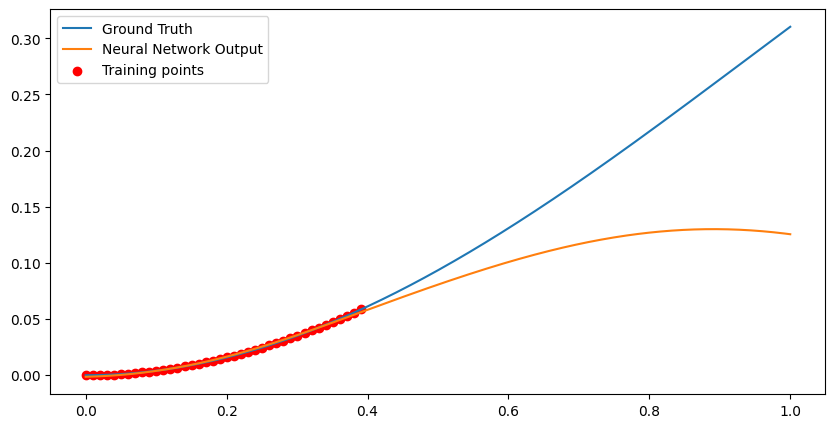

Loss at Step 4040 : 2.914807919296436e-05
Epoch 4040, Total Data Processed: 20684800


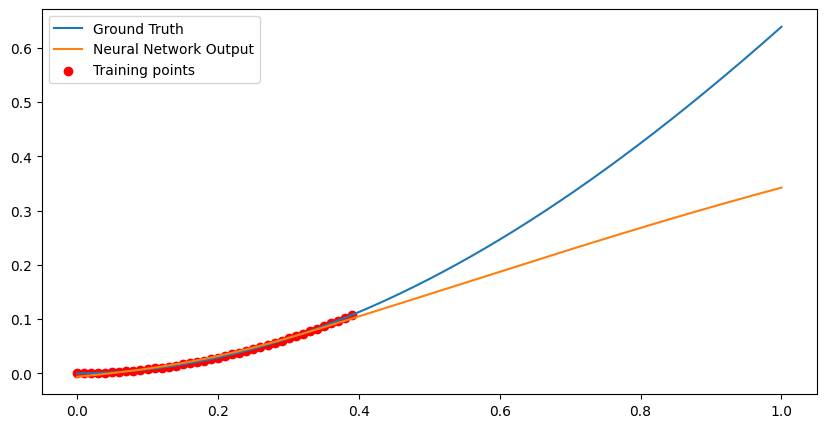

Loss at Step 4050 : 0.00013286000466905534
Epoch 4050, Total Data Processed: 20736000


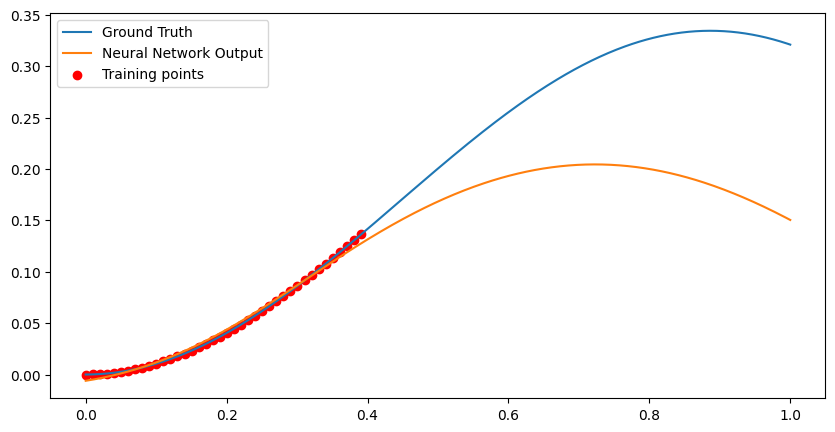

Loss at Step 4060 : 0.0001446966198273003
Epoch 4060, Total Data Processed: 20787200


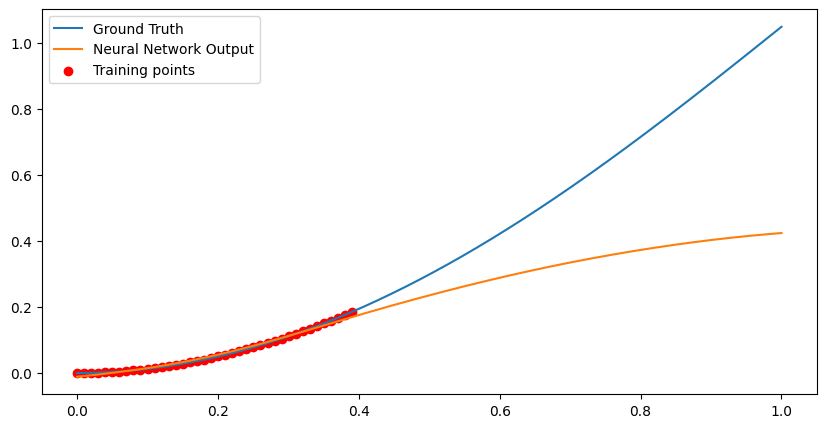

Loss at Step 4070 : 0.00020106168813072145
Epoch 4070, Total Data Processed: 20838400


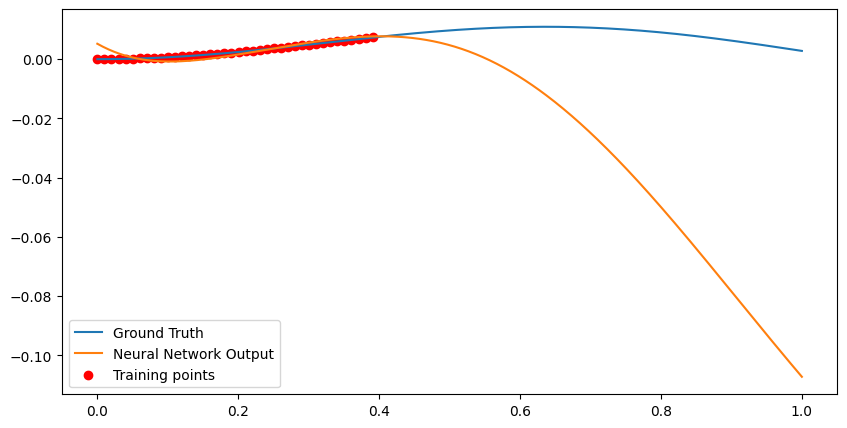

Loss at Step 4080 : 9.021637379191816e-05
Epoch 4080, Total Data Processed: 20889600


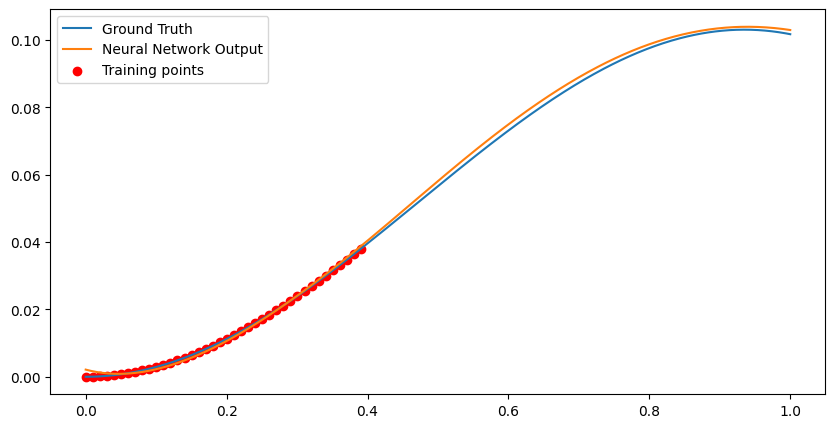

Loss at Step 4090 : 8.232013351516798e-05
Epoch 4090, Total Data Processed: 20940800


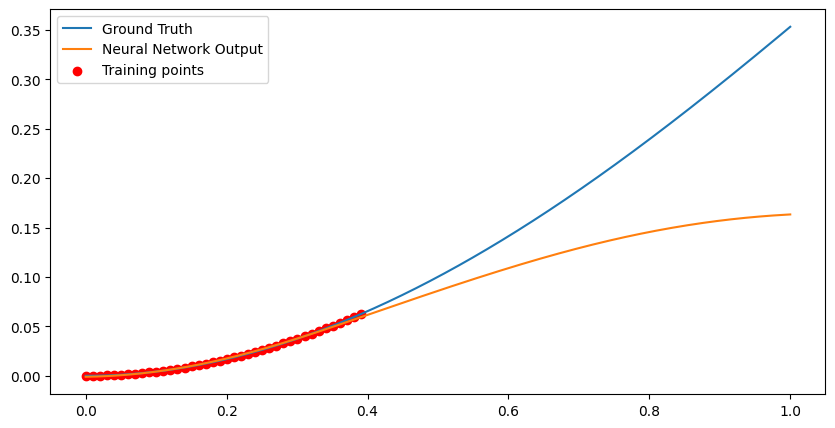

Epoch 4100, Variance: 1.2273760148673318e-05, Loss Change: 3.7901436478193773e-07
Loss at Step 4100 : 0.00020051852334290743
Epoch 4100, Total Data Processed: 20992000


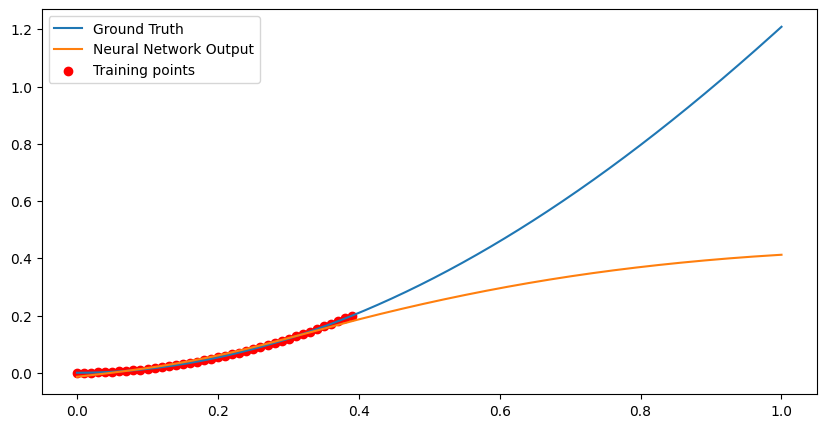

Loss at Step 4110 : 0.00018200851627625525
Epoch 4110, Total Data Processed: 21043200


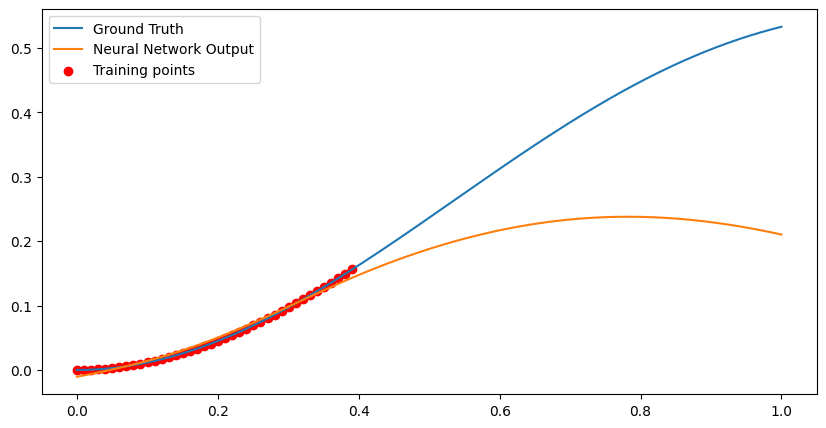

Loss at Step 4120 : 0.00011707274097716436
Epoch 4120, Total Data Processed: 21094400


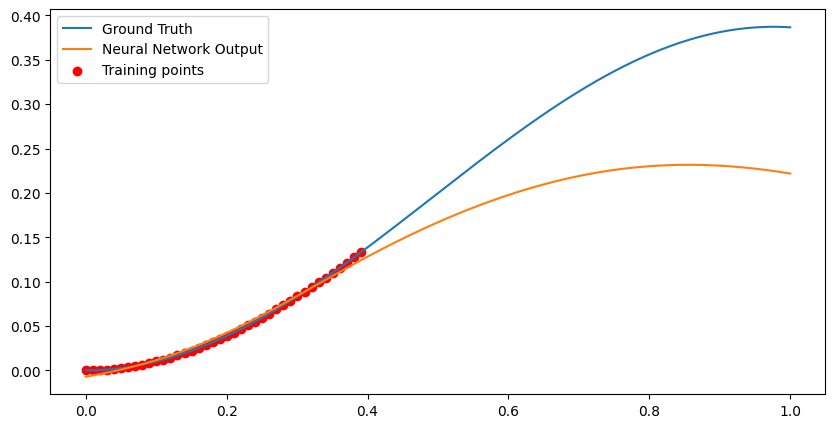

Loss at Step 4130 : 0.00010978095815517008
Epoch 4130, Total Data Processed: 21145600


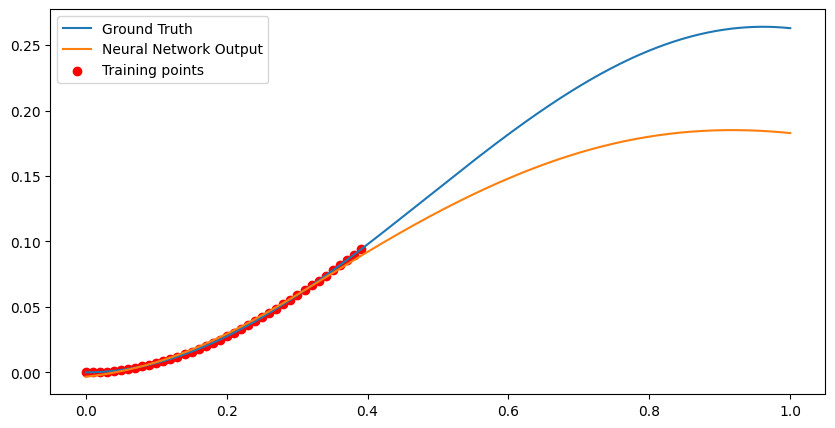

Loss at Step 4140 : 0.00018442509463056922
Epoch 4140, Total Data Processed: 21196800


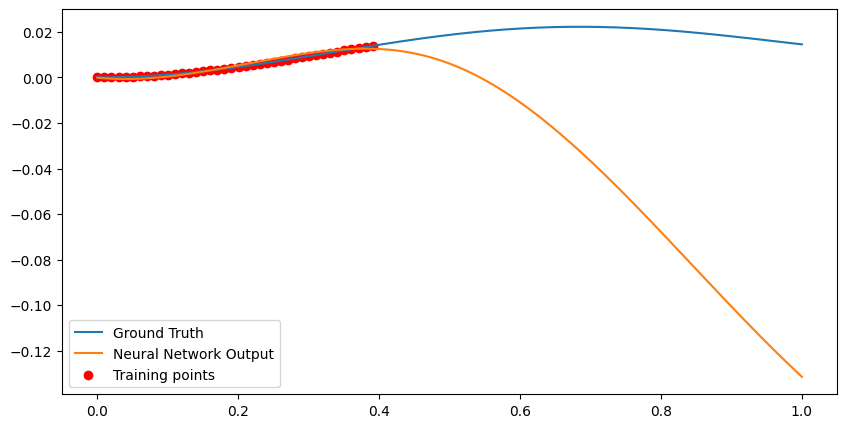

Loss at Step 4150 : 0.00023239398433361202
Epoch 4150, Total Data Processed: 21248000


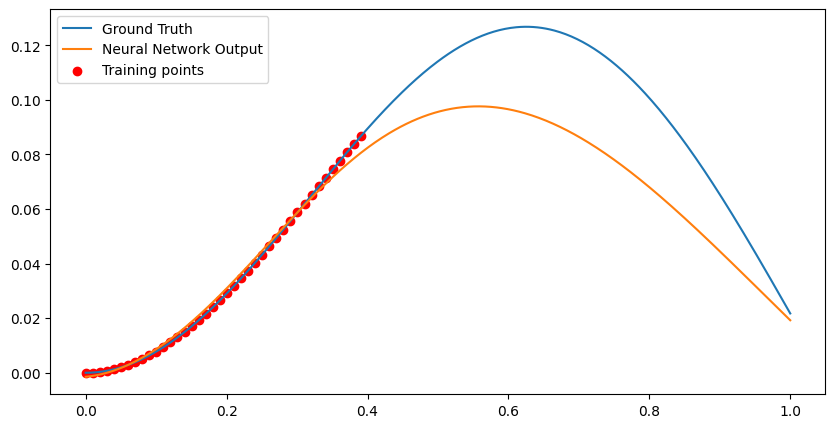

Loss at Step 4160 : 5.302048157318495e-05
Epoch 4160, Total Data Processed: 21299200


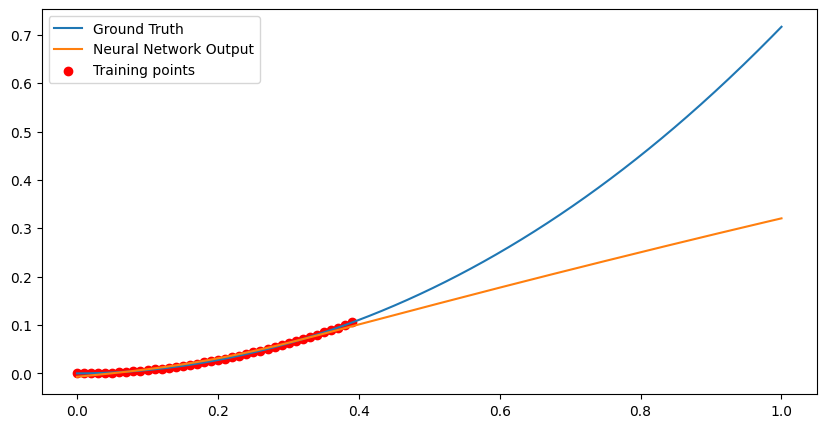

Loss at Step 4170 : 0.00025899586034938693
Epoch 4170, Total Data Processed: 21350400


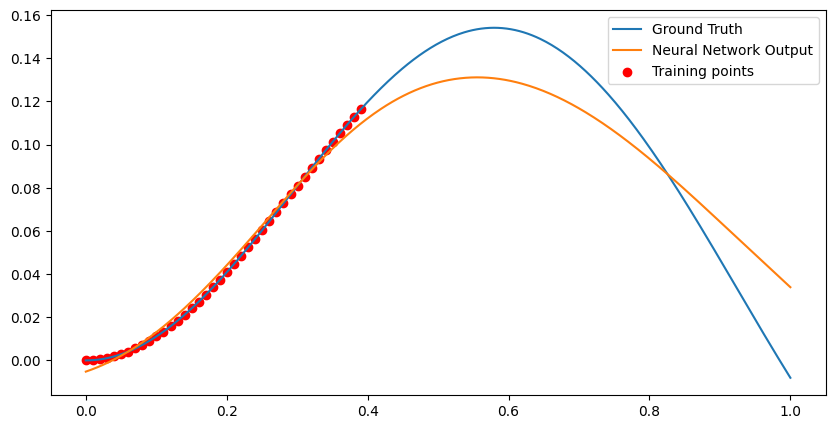

Loss at Step 4180 : 1.7957365344045684e-05
Epoch 4180, Total Data Processed: 21401600


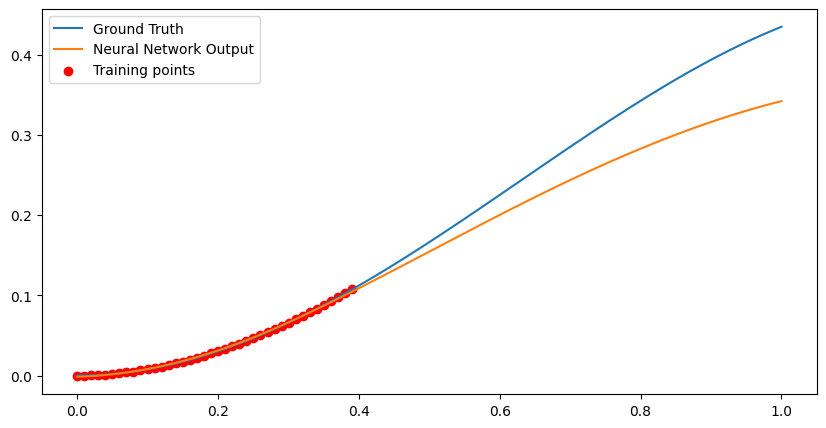

Loss at Step 4190 : 0.00011566692410269752
Epoch 4190, Total Data Processed: 21452800


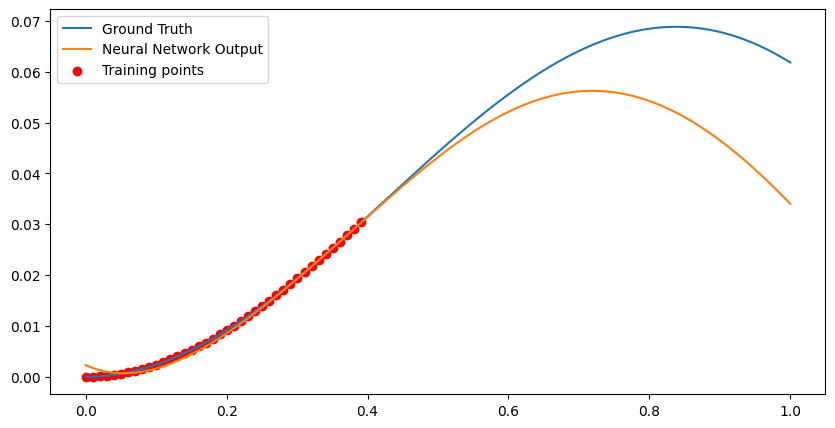

Epoch 4200, Variance: 1.1508038369356655e-05, Loss Change: 1.440889417381186e-05
Loss at Step 4200 : 0.0002088183828163892
Epoch 4200, Total Data Processed: 21504000


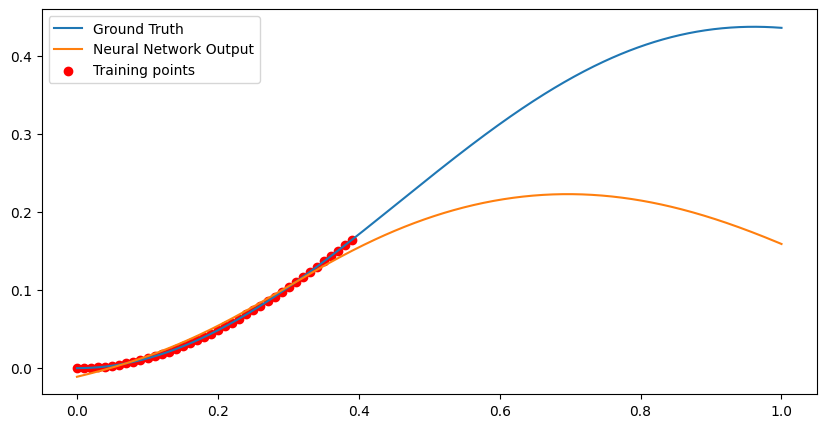

Loss at Step 4210 : 2.10125890589552e-05
Epoch 4210, Total Data Processed: 21555200


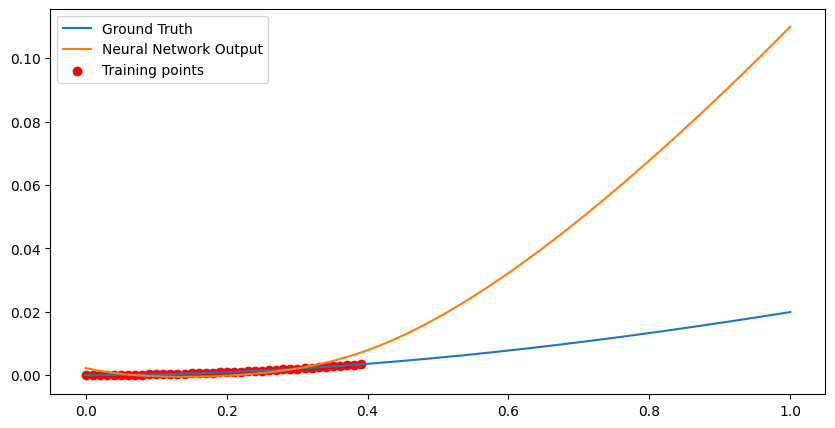

Loss at Step 4220 : 2.1964024199405685e-05
Epoch 4220, Total Data Processed: 21606400


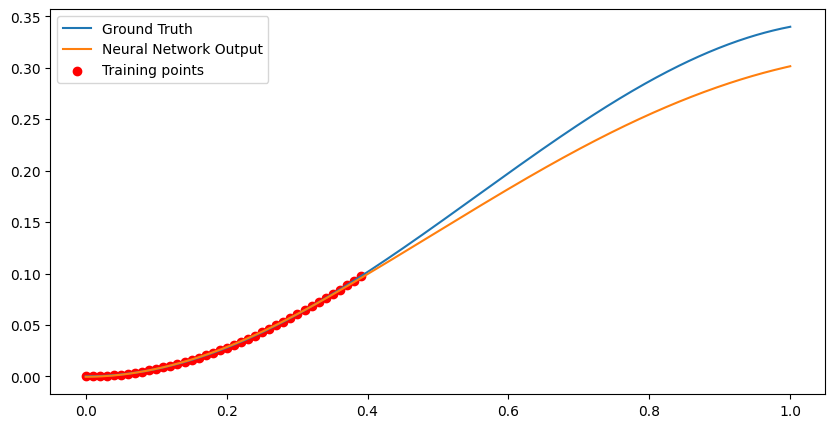

Loss at Step 4230 : 7.5229108915664256e-06
Epoch 4230, Total Data Processed: 21657600


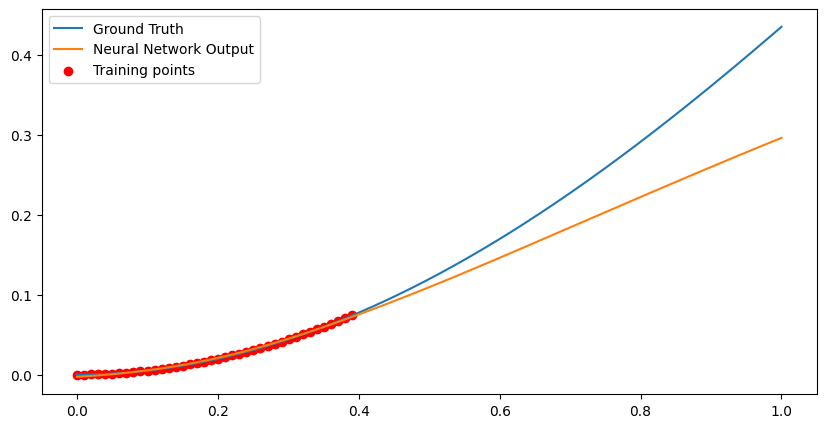

Loss at Step 4240 : 0.00010533823660807684
Epoch 4240, Total Data Processed: 21708800


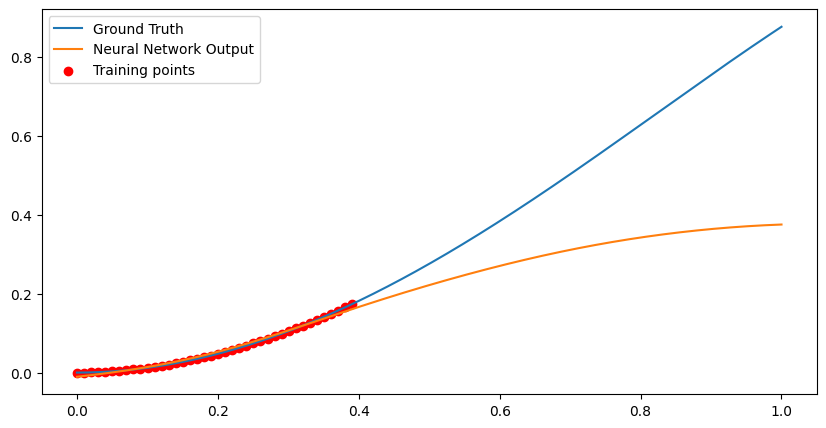

Loss at Step 4250 : 0.00018971906683873385
Epoch 4250, Total Data Processed: 21760000


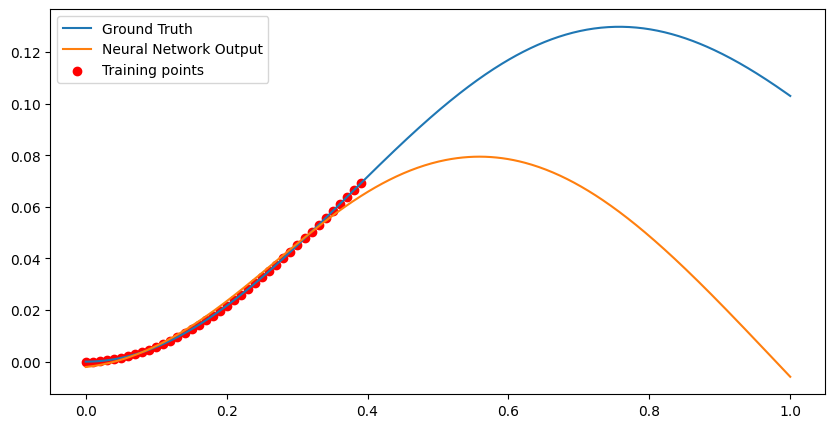

Loss at Step 4260 : 0.00023809286358300596
Epoch 4260, Total Data Processed: 21811200


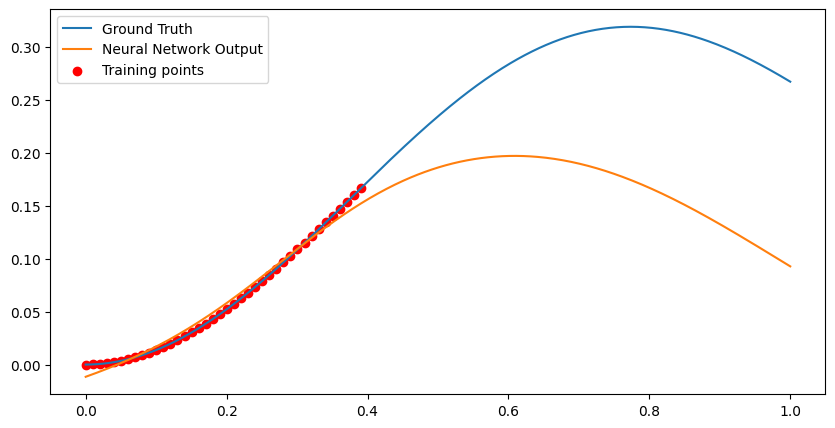

Loss at Step 4270 : 7.040837226668373e-05
Epoch 4270, Total Data Processed: 21862400


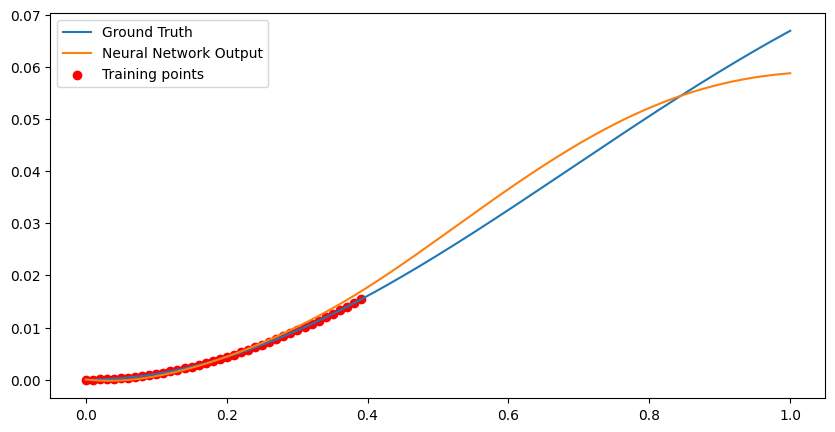

Loss at Step 4280 : 7.687733886996284e-05
Epoch 4280, Total Data Processed: 21913600


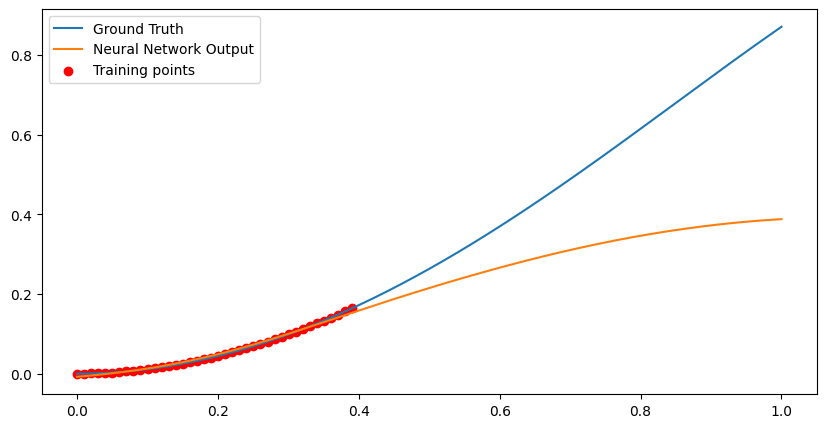

Loss at Step 4290 : 0.00012661932851187885
Epoch 4290, Total Data Processed: 21964800


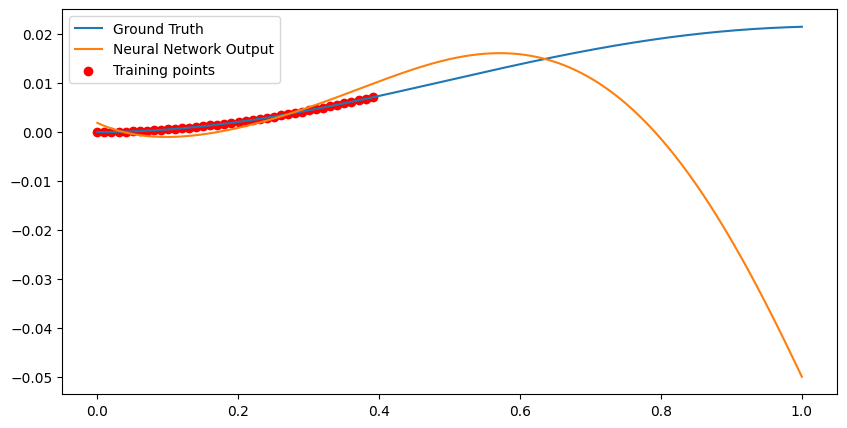

Epoch 4300, Variance: 1.0632046723912936e-05, Loss Change: 5.933040295502678e-06
Loss at Step 4300 : 8.842947136145085e-05
Epoch 4300, Total Data Processed: 22016000


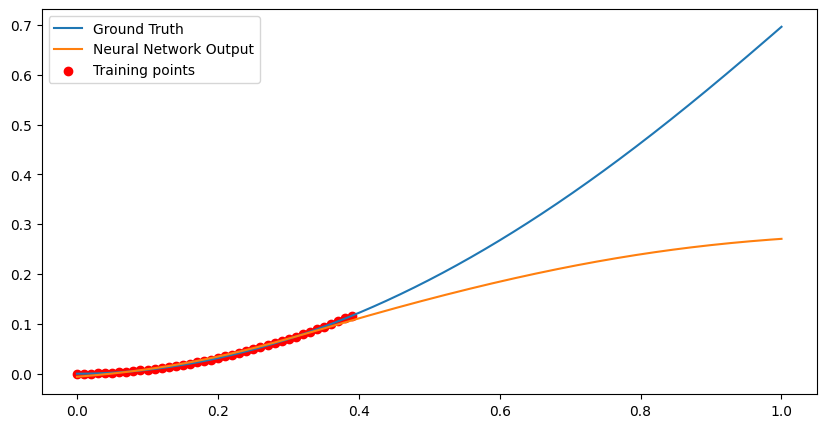

Loss at Step 4310 : 5.853803668287583e-05
Epoch 4310, Total Data Processed: 22067200


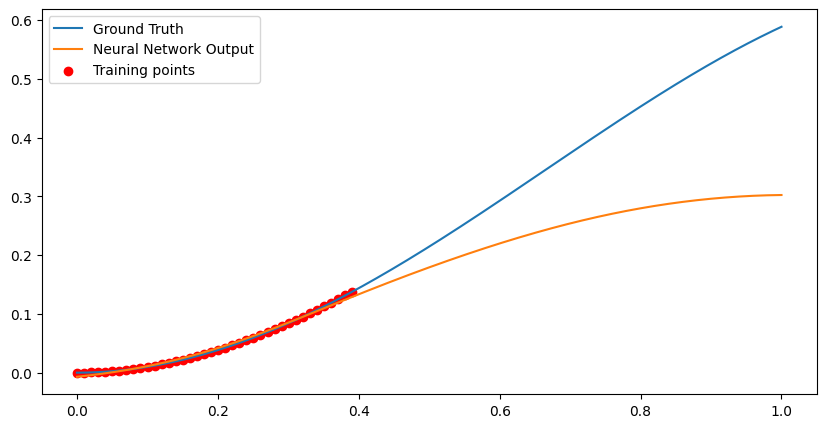

Loss at Step 4320 : 0.0001574984926264733
Epoch 4320, Total Data Processed: 22118400


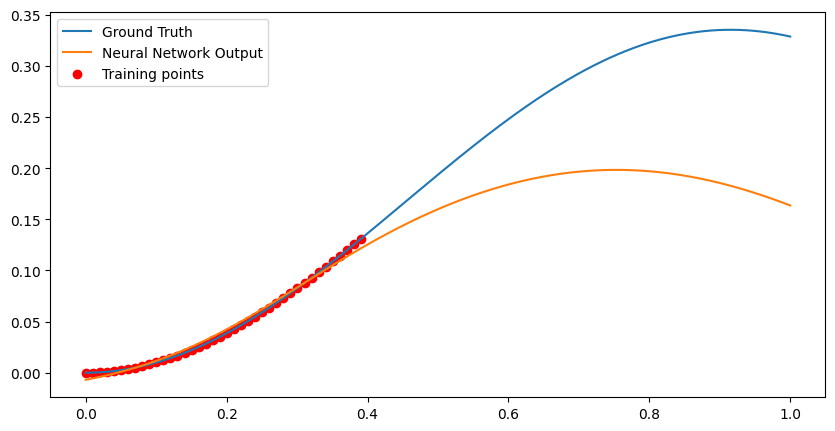

Loss at Step 4330 : 0.0002164336619898677
Epoch 4330, Total Data Processed: 22169600


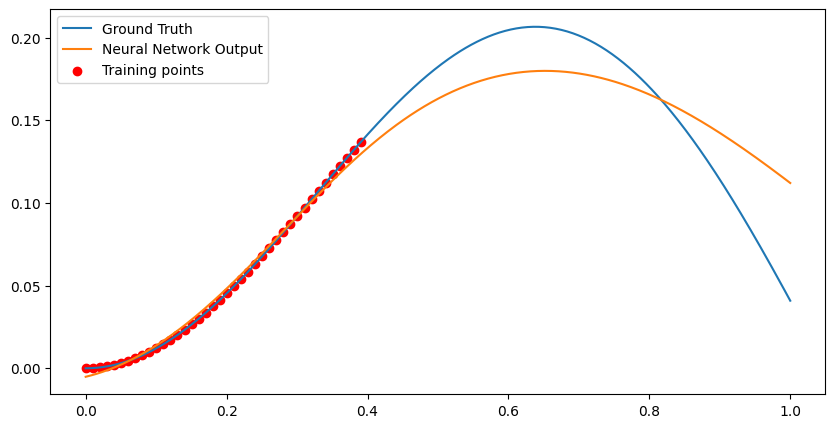

Loss at Step 4340 : 0.00020911789033561945
Epoch 4340, Total Data Processed: 22220800


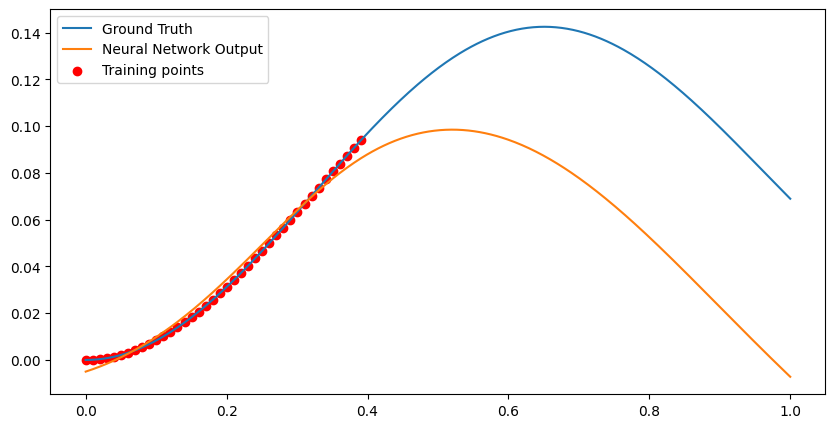

Loss at Step 4350 : 6.251726154005155e-05
Epoch 4350, Total Data Processed: 22272000


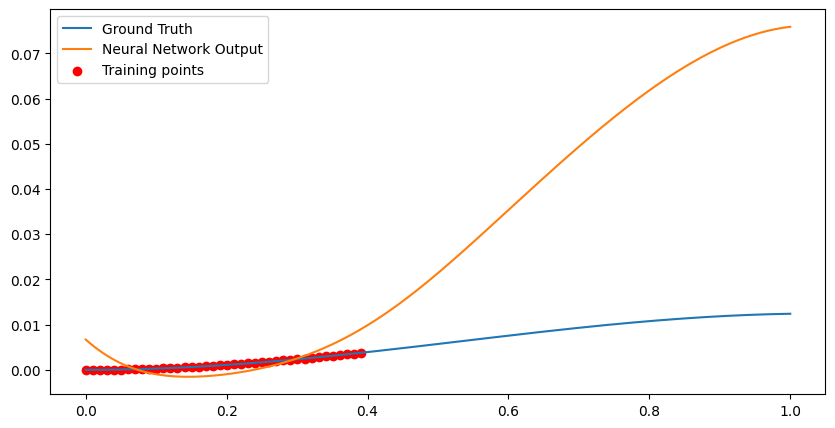

Loss at Step 4360 : 2.733385372266639e-05
Epoch 4360, Total Data Processed: 22323200


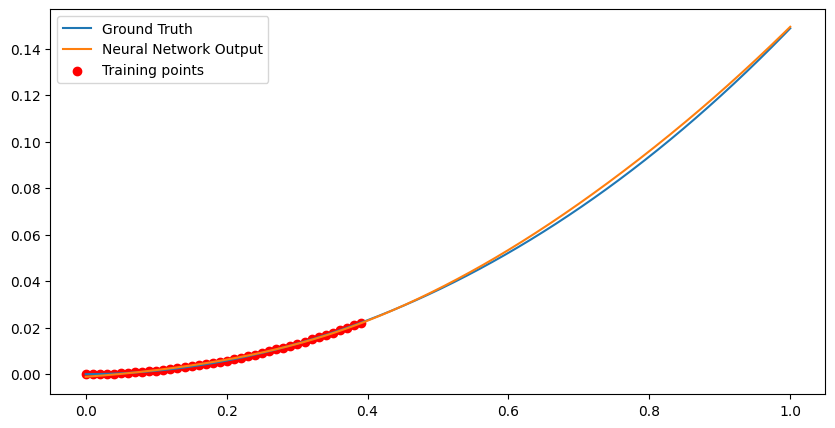

Loss at Step 4370 : 4.10211032431107e-06
Epoch 4370, Total Data Processed: 22374400


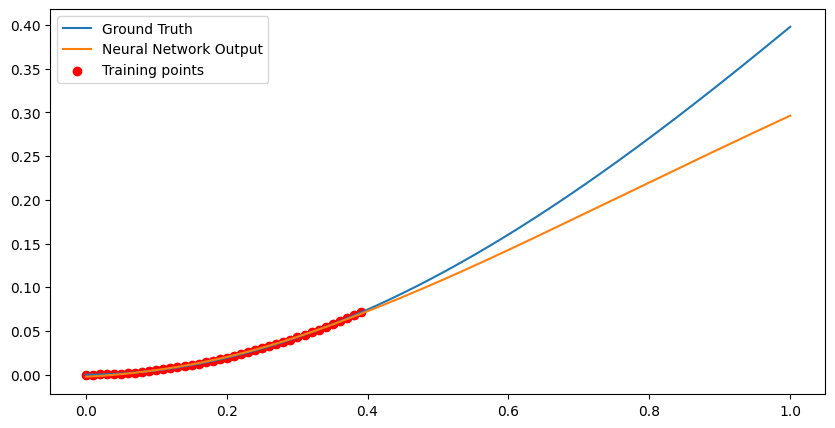

Loss at Step 4380 : 0.00011747532698791474
Epoch 4380, Total Data Processed: 22425600


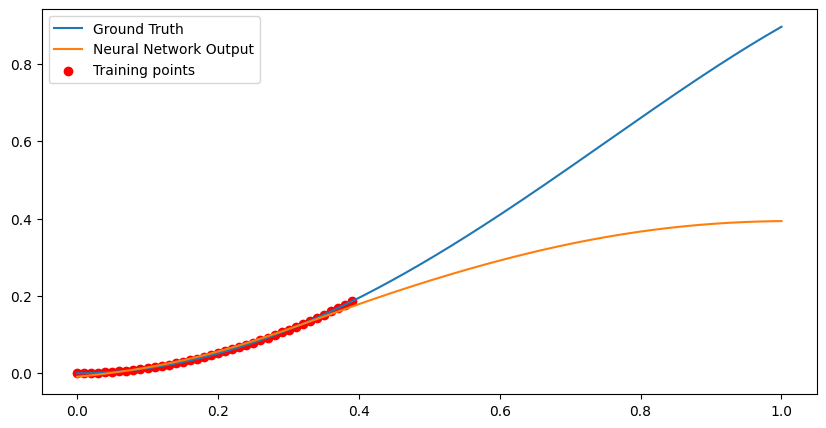

Loss at Step 4390 : 0.00010898846812779084
Epoch 4390, Total Data Processed: 22476800


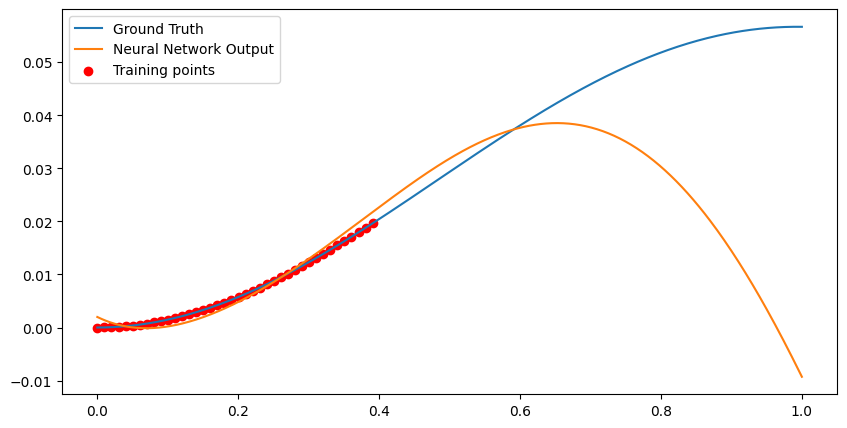

Epoch 4400, Variance: 9.946636055246927e-06, Loss Change: 9.620384501474177e-06
Loss at Step 4400 : 6.0342226788634434e-05
Epoch 4400, Total Data Processed: 22528000


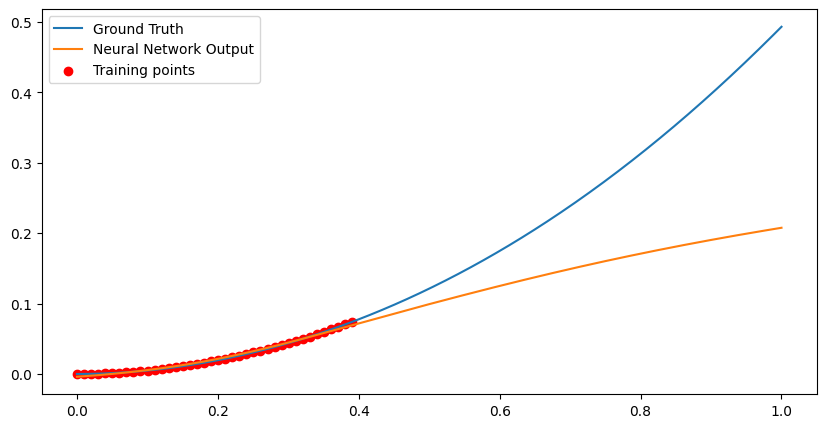

Loss at Step 4410 : 0.00012034734390908852
Epoch 4410, Total Data Processed: 22579200


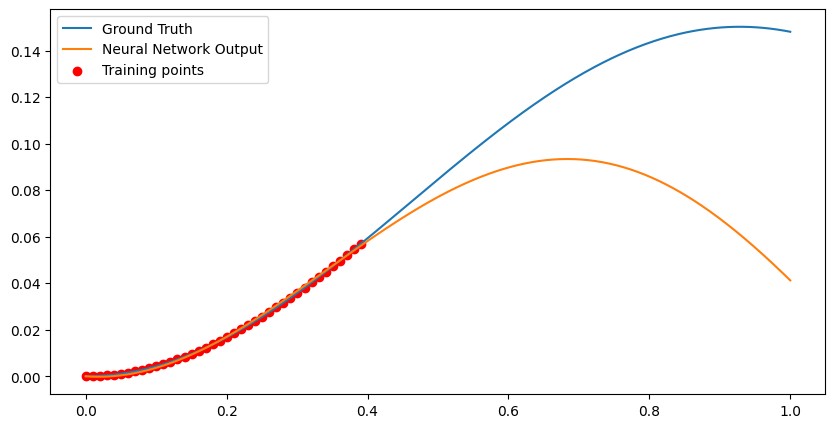

Loss at Step 4420 : 9.108903032029048e-05
Epoch 4420, Total Data Processed: 22630400


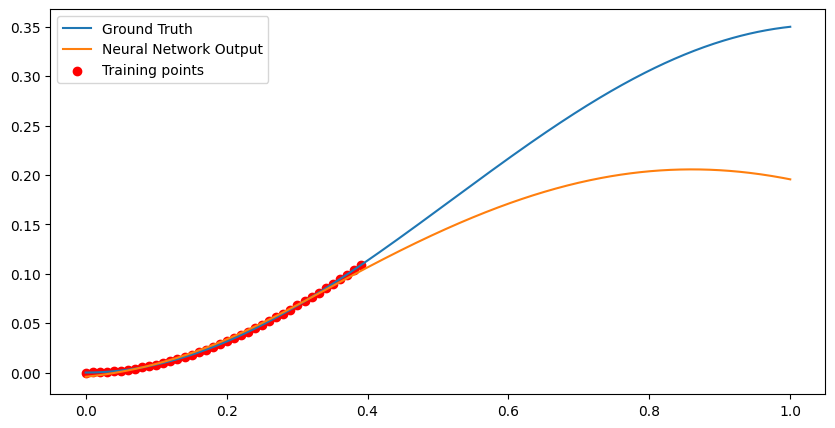

Loss at Step 4430 : 8.027728472370654e-05
Epoch 4430, Total Data Processed: 22681600


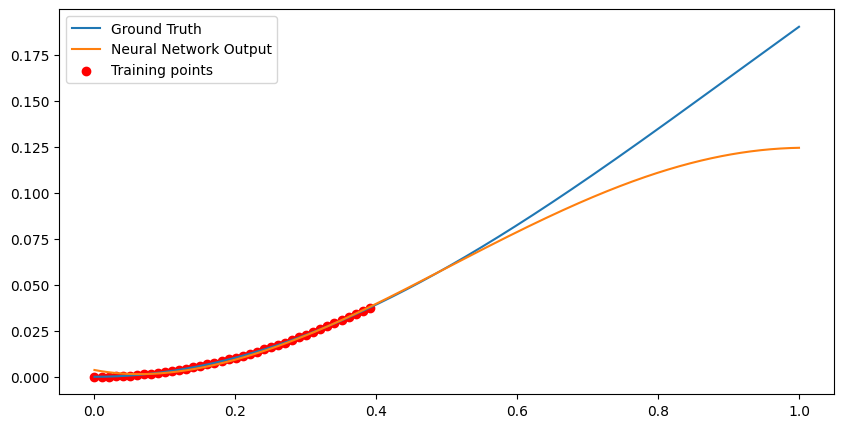

Loss at Step 4440 : 5.790033537778072e-05
Epoch 4440, Total Data Processed: 22732800


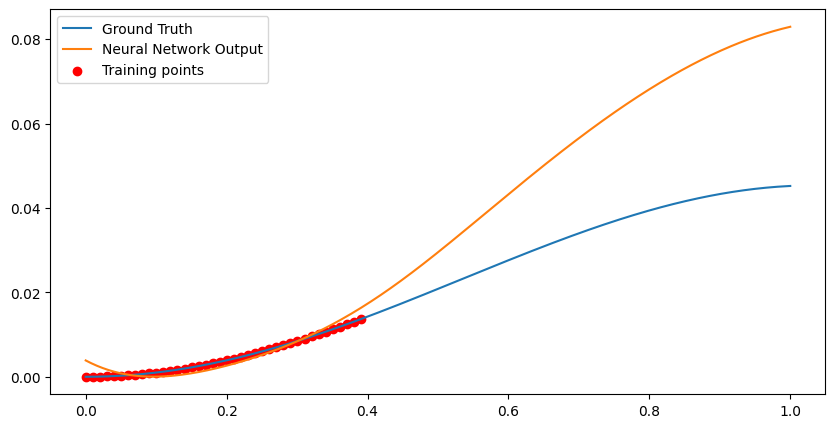

Loss at Step 4450 : 0.0001958465581992641
Epoch 4450, Total Data Processed: 22784000


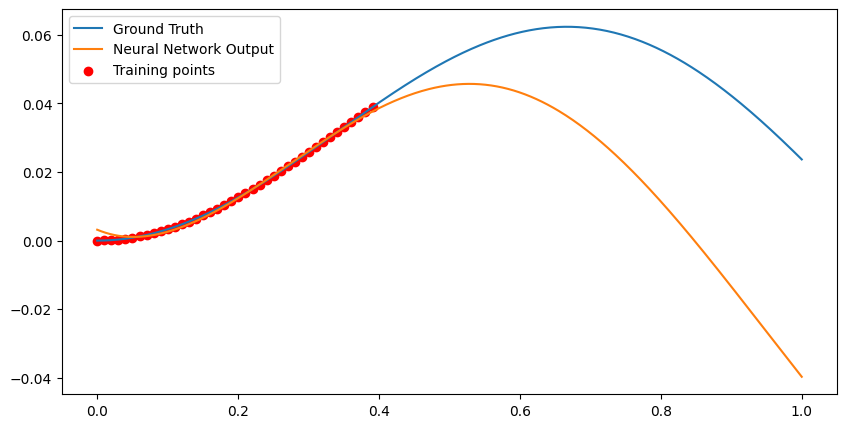

Loss at Step 4460 : 8.892775804270059e-05
Epoch 4460, Total Data Processed: 22835200


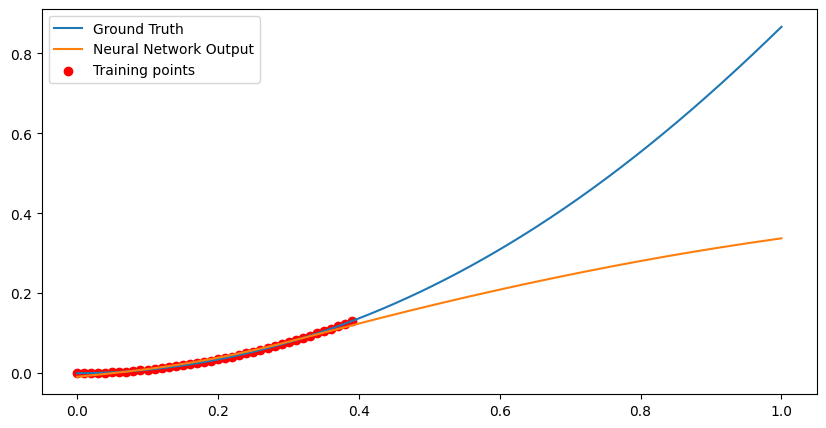

In [ ]:
# Your setup code, including model and optimizer initialization
x = torch.linspace(0, 1, 500).view(-1,1)
x_physics = torch.linspace(0, 1, 30).view(-1, 1).requires_grad_(True)

torch.manual_seed(123)
#model = AdaptedFCN(1, 5, 32, 8)  # Assuming AdaptedFCN is defined elsewhere
model = AdaptedRNN(1, 5, 32, 8)  # Assuming AdaptedFCN is defined elsewhere
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=20048, gamma=0.5)
X_BOUNDARY = 0.0
F_BOUNDARY = 0.0

data_processed = 0  # Initialize a counter
variance_threshold = 0.000001  # Acceptable variance threshold
loss_change_threshold = 1e-8  # Acceptable change in loss
check_interval = 100  # How often to check the criteria (in epochs)
num_batches = 128
loss_history = []  # To store loss values for change calculation
variances = []  # To track variance at each checkpoint
epochs_with_checks = []  # To track epochs when checks are performed

for i in range(18000):
    epoch_losses = []  # To store losses for this epoch
    epoch_differences = []  # To store prediction differences for variance calculation
    
    for batch in range(num_batches):
        optimizer.zero_grad()
        params_tensor,y_tensor= duffing_generator_batch( num_batches, x)
        selected_params = params_tensor[0, :1, :].repeat(x.size(0), 1)  # Adjusted to have shape [500, 5]
        y_data = y_tensor[:, 0:200:5] 
        x_data = x[0:200:5] 
        data_processed += x_data.shape[0]
        d, a, b, gamma, w = params_tensor[:, 0], params_tensor[:, 1], params_tensor[:, 2], params_tensor[:, 3], params_tensor[:, 4]
        yh = model(x_data,selected_params[0:200:5])
        
        # Compute the data loss by comparing the model output with the training data
        # Assuming your linear layer is named `layer`
        loss1 = torch.mean((yh - y_data)**2)
        physics_params = params_tensor[0, :1, :].repeat(x_physics.size(0), 1)   
        # Compute the physics loss by enforcing the differential equation
        yhp = model(x_physics,physics_params)
        dy_pred = autograd.grad(yhp, x_physics, torch.ones_like(yhp), create_graph=True)[0]
        d2y_pred = autograd.grad(dy_pred, x_physics, torch.ones_like(dy_pred), create_graph=True)[0]
            
        physics = d2y_pred + d * dy_pred + a * yhp + b * torch.pow(yhp, 3) - gamma * torch.cos(w * x_physics)
        loss_physics = (1e-4) * torch.mean(physics**2)
            
        # Compute the boundary loss by enforcing the boundary conditions
        x_boundary = torch.tensor([X_BOUNDARY]).view(-1, 1).requires_grad_(True)
        f_boundary = torch.tensor([F_BOUNDARY]).view(-1, 1)
        boundary_params = params_tensor[0, :1, :].repeat(x_boundary.size(0), 1) 
        yh_boundary = model(x_boundary,boundary_params)
        boundary = yh_boundary - f_boundary
        loss_boundary = (1e-5) * torch.mean(boundary**2)
            
        # Compute the total loss as the sum of the data loss, the physics loss, and the boundary loss
        total_loss = loss1 + loss_physics + loss_boundary
            
        # Update the model parameters using backpropagation and gradient descent
        total_loss.backward()
        optimizer.step()
        y_tensor_squeezed = y_tensor.squeeze()
            # Adjust learning rate based on scheduler
        scheduler.step()
        # Collect differences for variance calculation
        differences = (yh - y_data).detach().cpu().numpy()  # Assuming y_data and yh are tensors
        epoch_differences.extend(differences.flatten())
        epoch_losses.append(total_loss.item())  # Store loss for later analysis


        # Calculate the mean loss for the epoch
    mean_loss = np.mean(epoch_losses)
    loss_history.append(mean_loss)
    
    # Check variance and loss change at specified intervals
    if (i + 1) % check_interval == 0:
        epoch_variance = np.var(epoch_differences)
        variances.append(epoch_variance)
        epochs_with_checks.append(i + 1)

        # Calculate the absolute change in loss compared to the last checkpoint
        if len(loss_history) > 1:
            loss_change = abs(loss_history[-1] - loss_history[-2])
        else:
            loss_change = float('inf')  # Initial loss change is set to inf to ensure it doesn't trigger stopping

        print(f"Epoch {i+1}, Variance: {epoch_variance}, Loss Change: {loss_change}")
        
        # Check if both the variance and loss change criteria are met
        if epoch_variance < variance_threshold and loss_change < loss_change_threshold:
            print("Both variance and loss change criteria met, consider adjusting training strategy.")
            # Save the model
            model_save_path = "/devel/thesis/rnn_pinnthesis/pinn_model.pth"
            torch.save(model.state_dict(), model_save_path)
            print(f"Model saved to {model_save_path}")
            break  # Exit training loop

    # Your original plotting code here for every few epochs
    # Plot the results every 150 steps
    if (i+1) % 10 == 0:   
        # Print the loss value after each step
        print("Loss at Step", i+1, ":", total_loss.item())
        print(f"Epoch {i+1}, Total Data Processed: {data_processed}")
        yh = model(x,selected_params).detach().numpy()
        plt.figure(figsize=(10, 5))
        plt.plot(x.numpy(), y_tensor_squeezed.numpy(), label='Ground Truth')
        plt.plot(x.numpy(), yh, label='Neural Network Output')
        plt.scatter(x_data.numpy(), y_data.numpy(), color='red', label='Training points')
        plt.legend()
        plt.show()
# After training, plot the variance threshold chart
plt.figure(figsize=(10, 6))
plt.plot(epochs_with_checks, variances, label='Prediction Variance')
plt.axhline(y=variance_threshold, color='r', linestyle='-', label='Variance Threshold')
plt.xlabel('Epoch')
plt.ylabel('Variance')
plt.title('Model Prediction Variance Over Time')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

x = torch.linspace(0, 1, 500).view(-1,1)
x_physics = torch.linspace(0, 1, 30).view(-1, 1).requires_grad_(True).to(device)
num_batches = 128
torch.manual_seed(123)
model = AdaptedFCN(1, 5, 256, 32)  # Assuming AdaptedFCN is defined elsewhere
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.5)
model = model.to(device)
# Constants
X_BOUNDARY = torch.tensor([0.0], device=device).view(-1, 1)
F_BOUNDARY = torch.tensor([0.0], device=device).view(-1, 1)

# Training Variables
data_processed = 0
variance_threshold = 0.000001
loss_change_threshold = 1e-8
check_interval = 100
num_batches = 128
data_processed_per_epoch = []  # This will track data processed per epoch
loss_history = []
variances = []
epochs_with_checks = []

# Training Loop
for i in range(6000):
    epoch_losses = []
    epoch_differences = []
    
    for batch in range(num_batches):
        optimizer.zero_grad()
        params_tensor, y_tensor = duffing_generator_batch(num_batches, x)
        params_tensor = params_tensor.to(device)
        y_tensor = y_tensor.to(device)
        
        selected_params = params_tensor[0, :1, :].repeat(x.size(0), 1).to(device)  # Ensure selected_params is on the correct device
        y_data = y_tensor[:, 0:200:20]
        x_data = x[0:200:20].to(device)  # Ensure x_data is also on the correct device before passing to model
        
        yh = model(x_data, selected_params[0:200:20])
        # Compute the data loss
        loss1 = torch.mean((yh - y_data)**2)
        
        # Physics parameters, ensuring they're on the correct device
        physics_params = params_tensor[0, :1, :].repeat(x_physics.size(0), 1)
        physics_params = physics_params.to(device)  # Explicitly ensuring on correct device
        yhp = model(x_physics, physics_params)
        
        # Extracting individual parameters for the physics calculation
        d, a, b, gamma, w = params_tensor[:, 0], params_tensor[:, 1], params_tensor[:, 2], params_tensor[:, 3], params_tensor[:, 4]
        
        dy_pred = autograd.grad(yhp, x_physics, torch.ones_like(yhp), create_graph=True)[0]
        d2y_pred = autograd.grad(dy_pred, x_physics, torch.ones_like(dy_pred), create_graph=True)[0]
        
        physics = d2y_pred + d * dy_pred + a * yhp + b * torch.pow(yhp, 3) - gamma * torch.cos(w * x_physics)
        loss_physics = (1e-4) * torch.mean(physics**2)
        
        boundary_params = params_tensor[0, :1, :].repeat(1, 1)
        yh_boundary = model(X_BOUNDARY, boundary_params)
        loss_boundary = torch.mean((yh_boundary - F_BOUNDARY)**2)
        
        total_loss = loss1 + loss_physics + loss_boundary
        total_loss.backward()
        optimizer.step()
        scheduler.step()
        
        batch_size = x_data.shape[0]  # Assuming x_data is your input batch tensor
        epoch_data_processed += batch_size
        data_processed += batch_size
        differences = (yh - y_data).detach().cpu().numpy()
        epoch_differences.extend(differences.flatten())
        epoch_losses.append(total_loss.item())

    mean_loss = np.mean(epoch_losses)
    loss_history.append(mean_loss)
    
    if (i + 1) % check_interval == 0:
        epoch_variance = np.var(epoch_differences)
        variances.append(epoch_variance)
        epochs_with_checks.append(i + 1)
        loss_change = abs(loss_history[-1] - loss_history[-2]) if len(loss_history) > 1 else float('inf')
        print(f"Epoch {i+1}, Variance: {epoch_variance}, Loss Change: {loss_change}")
        rint(f"Epoch {i+1}: Cumulative Data Processed = {data_processed}, Data Processed This Epoch = {epoch_data_processed}"
        if epoch_variance < variance_threshold and loss_change < loss_change_threshold:
            print("Criteria met, stopping training.")
            model_save_path = "/devel/thesis/rnn_pinnthesismodel.pth"
            torch.save(model.state_dict(), model_save_path)
            break

    if (i+1) % 10 == 0:
        print("Loss at Step", i+1, ":", total_loss.item())
        print(f"Epoch {i+1}, Total Data Processed: {data_processed}")
    
        # Convert tensors to CPU for plotting if they are on a GPU
        x_data_cpu = x_data.detach().cpu().numpy().squeeze()  # Squeeze to ensure correct dimensions
        y_data_cpu = y_data.detach().cpu().numpy().squeeze()  # Squeeze to ensure correct dimensions
        yh_cpu = yh.detach().cpu().numpy().squeeze()  # Also squeeze yh for consistency
    
        plt.figure(figsize=(10, 5))
        # Ensure dimension compatibility in the plot by using squeezed arrays
        plt.scatter(x_data_cpu, y_data_cpu,  color='red', label='Training points')
        plt.plot(x.numpy(), y_tensor_squeezed.detach().cpu().numpy(), label='Ground Truth')
        plt.plot(x_data_cpu, yh_cpu, label='Model Output')
        plt.title("Model Output vs. Training Data")
        plt.legend()
        plt.show()

# After the training loop
# Plot the variance threshold chart
plt.figure(figsize=(10, 6))
plt.plot(epochs_with_checks, variances, 'o-', label='Prediction Variance')
plt.axhline(y=variance_threshold, color='r', linestyle='--', label='Variance Threshold')
plt.xlabel('Epoch')
plt.ylabel('Variance')
plt.title('Model Prediction Variance Over Time')
plt.legend()
plt.grid(True)
plt.show()
